In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils as utils
import torchvision.transforms as transforms

from torch.autograd import Variable

import os
import time

from PIL.Image import BICUBIC
from torchvision.datasets import MNIST
from ram import RecurrentAttentionModel
from trainer import *

### MNIST dataset
Testing out this model and training algorithm implementation on the basic MNIST dataset, which is pretty simple so hopefully everything goes well.

In [2]:
num_train_data_copies = 1  # Number of times to load the training dataset (with augmentation)
num_eval_data_copies = 1   # Number of times to load the evaluation dataset (with augmentation)
test_val_split = 0.5       # Percentage of the test set to use as validation data
batch_size = 20            # Batch size for training
eval_batch_size = 20       # Batch size for validation and testing

# Image parameters
num_classes = 10       # Digits 0-9
image_size = 28        # MNIST images are 28x28 b/w images
in_channels = 1        # Number of color channels in the inputs (MNIST dataset is grayscale)

glimpse_sizes = [8]  #[5, 10, 18]
padding = int(np.ceil(glimpse_sizes[-1] / 2))
padded_img_size = image_size + 2*padding

In [3]:
# Down/load MNIST data
mnist_data_loc = os.path.join('data', 'mnist')
data_transforms = transforms.Compose([ # Keep things pretty basic for now
    # Pad images with 0s so the GlimpseSensor won't have to
    transforms.Pad(padding = padding),
    # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255]
    # to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
    transforms.ToTensor(),
])

'''
Can increase the number of images in each dataset by loading up the data again,
applying the (random) transformations, then concatenating it all together
'''
### Training Dataset and DataLoader
all_train_datasets = [
    MNIST(
        root = mnist_data_loc, train = True,
        download = True, transform = data_transforms
    ) for _ in range(num_train_data_copies)
]
train_datasets = utils.data.ConcatDataset(all_train_datasets)
train_data = utils.data.DataLoader(train_datasets, batch_size = batch_size, shuffle = True)
num_train_data = len(train_datasets)
num_train_batches = len(train_data)

### Validation and Test Dataset and DataLoader
all_eval_datasets = [
    MNIST(
        root = mnist_data_loc, train = False,
        download = True, transform = data_transforms
    ) for _ in range(num_eval_data_copies)
]
eval_datasets = utils.data.ConcatDataset(all_eval_datasets)
num_eval_data = len(eval_datasets)

eval_split_pt = int(test_val_split * num_eval_data)
eval_idx = list(range(num_eval_data))
np.random.shuffle(eval_idx)

val_idx, test_idx = eval_idx[:eval_split_pt], eval_idx[eval_split_pt:]

val_sampler = utils.data.sampler.SubsetRandomSampler(val_idx)
val_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = val_sampler
)
num_val_data = len(val_sampler)
num_val_batches = len(val_data)

test_sampler = utils.data.sampler.SubsetRandomSampler(test_idx)
test_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = test_sampler
)
num_test_data = len(test_sampler)
num_test_batches = len(test_data)

print('Num:\n- train data: %d (%d batches)\n- val data: %d (%d batches)\n- test data: %d (%d batches)' % (
    num_train_data, num_train_batches, num_val_data, num_val_batches, num_test_data, num_test_batches
))

Num:
- train data: 60000 (3000 batches)
- val data: 5000 (250 batches)
- test data: 5000 (250 batches)


In [4]:
# Basic training hyperparameters
lr = 1e-3
grad_clip = 4
lr_step_size = 1
steps_per_epoch = int(num_train_data_copies * 15)  # Number of times to step the lr scheduler in an epoch
warmup_steps = 8*steps_per_epoch
decay_rate = 0.99

# RL training hyperparameters
end_train_ep_early = False     # End each training episode early after a correct classification
assert (end_train_ep_early and batch_size == 1) or not end_train_ep_early
max_ep_len = 6                 # Maximum number of glimpses per episode
num_epochs = 400               # Number of times to go through all of the training examples
early_stopping = int(num_epochs * 0.02)

random_start_loc = True
error_penalty = 0.  # Amount of penalty to apply each time the agent makes an incorrect classification (<= 0.)
gamma = 1.0         # Reward discount factor

# Etc
log_freq = num_train_batches // 6    # How often to print a training log in an epoch
viz_freq = num_train_batches // 3     # How often to visualize the glimpses in an epoch
eval_viz_freq = num_val_batches // 2  # How often to visualize the glimpses in an epoch

### Model
Need to modify class implementation so that any recurrent `nn.Module` instance can be passed in when initializing a new `RecurrentAttentionModel` to make it easier to try this visual attention mechanism out with different core recurrent networks.

In [5]:
# Model hyperparameters
glimpse_g_size = 128    # Size of the transformed Glimpse representation in the GlimpseNetwork
loc_g_size = 128        # Size of the transformed location representation in the GlimpseNetwork
glimpse_net_size = 256  # Size of the GlimpseNetwork output
rnn_state_size = 256
sensor_size = 8         # Size of the glimpses after resizing
g_rep_op = 'cat'

dropout = 0.0
# Standard deviation to use when sampling the glimpse location coordinates from a normal distribution
loc_std = 0.22

In [6]:
# Initialize the network
model = RecurrentAttentionModel(
    image_size = image_size, in_channels = in_channels,
    glimpse_g_size = glimpse_g_size, loc_g_size = loc_g_size,
    glimpse_net_size = glimpse_net_size, g_rep_op = g_rep_op,
    rnn_state_size = rnn_state_size, num_actions = num_classes,
    sensor_size = sensor_size, glimpse_sizes = glimpse_sizes,
    pad_imgs = False, padding = padding, dropout = dropout
)
num_parameters = sum([p.numel() for p in model.parameters()])
print('Model has %d parameters' % num_parameters)

# Criterion, optimizer, learning rate scheduler
class_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)
lr_scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma = decay_rate)

Model has 604173 parameters


Epoch   1/400) lr = 0.001


H:\Users\Andrew\Anaconda3\envs\conda_jupyter\lib\site-packages\numpy\lib\nanfunctions.py:1315: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


 b    500/  3000 >> 153.3 ms/b | lr: 9.80e-04 | grad 2norm:  7.11 | grad inf norm:  3.533
       Weights || abs max:  0.36 (     inf) | mean:  3.00e-04 (  inf) | var: 2.07e-03 (     nan)
        Biases || abs max:  0.18 ( 7509.13) | mean:  9.12e-03 ( 9.03) | var: 3.01e-04 (770301.25)
                  class loss: 1.573 | steps: 3.981 | reward:  0.455 | acc.: 45.47%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 153.5 ms/b | lr: 9.61e-04 | grad 2norm:  7.45 | grad inf norm:  2.700
       Weights || abs max:  0.47 (135022.47) | mean: -1.75e-03 ( 0.32) | var: 3.14e-03 (8412946.00)
        Biases || abs max:  0.42 (12650.53) | mean:  1.57e-02 (11.30) | var: 7.48e-04 (3626883.25)
                  class loss: 0.992 | steps: 3.274 | reward:  0.678 | acc.: 67.78%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

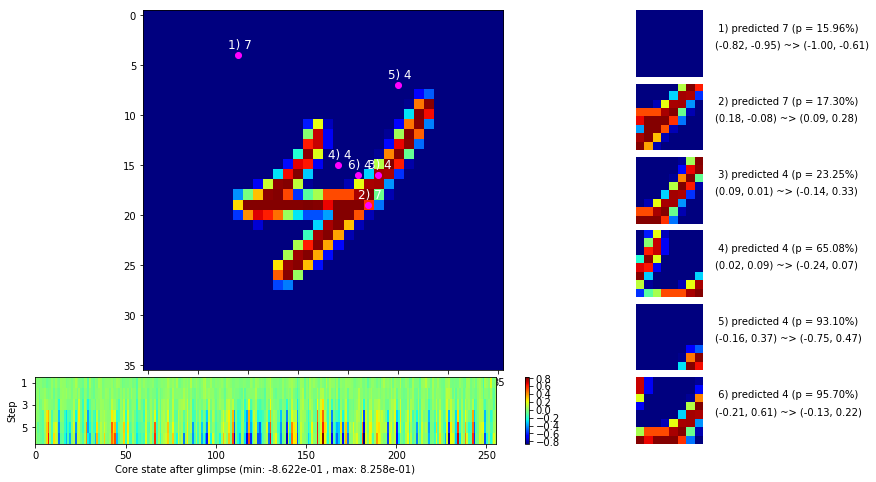

 b   1500/  3000 >> 144.1 ms/b | lr: 9.32e-04 | grad 2norm:  7.16 | grad inf norm:  2.321
       Weights || abs max:  0.55 (34129.41) | mean: -3.68e-03 ( 0.15) | var: 4.08e-03 (71066.32)
        Biases || abs max:  0.57 ( 7527.61) | mean:  1.63e-02 ( 7.18) | var: 1.09e-03 (1370281.12)
                  class loss: 0.800 | steps: 3.018 | reward:  0.742 | acc.: 74.18%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 9.14e-04 | grad 2norm:  6.92 | grad inf norm:  2.118
       Weights || abs max:  0.60 (25721.77) | mean: -5.03e-03 ( 0.12) | var: 4.86e-03 (31458.30)
        Biases || abs max:  0.64 ( 4293.07) | mean:  1.58e-02 ( 4.92) | var: 1.38e-03 (1500807.62)
                  class loss: 0.673 | steps: 2.846 | reward:  0.778 | acc.: 77.85%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

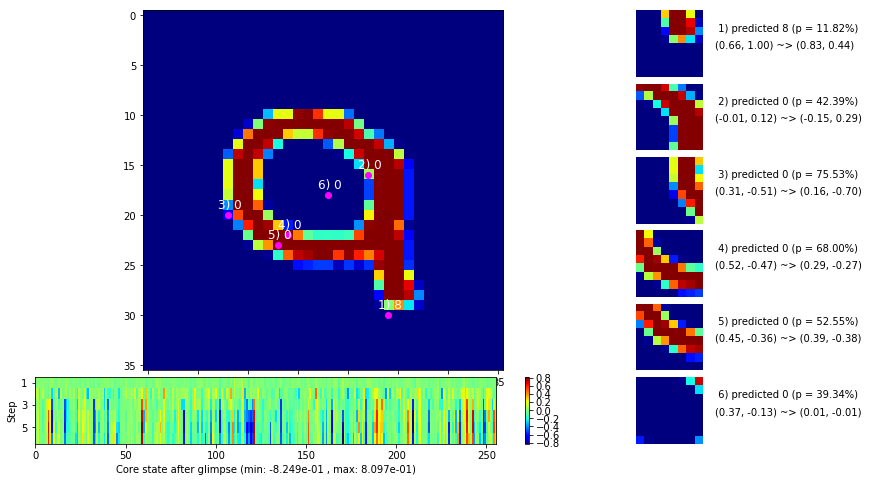

 b   2500/  3000 >> 135.6 ms/b | lr: 8.86e-04 | grad 2norm:  6.83 | grad inf norm:  2.083
       Weights || abs max:  0.63 (20318.22) | mean: -5.81e-03 ( 0.10) | var: 5.53e-03 ( 8650.18)
        Biases || abs max:  0.70 ( 3275.67) | mean:  1.54e-02 ( 3.14) | var: 1.67e-03 (205679.39)
                  class loss: 0.568 | steps: 2.697 | reward:  0.817 | acc.: 81.66%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.8 ms/b | lr: 8.69e-04 | grad 2norm:  6.37 | grad inf norm:  1.852
       Weights || abs max:  0.66 (56161.18) | mean: -6.74e-03 ( 0.16) | var: 6.11e-03 (567238.50)
        Biases || abs max:  0.75 ( 4724.67) | mean:  1.40e-02 ( 3.64) | var: 1.94e-03 (269479.06)
                  class loss: 0.496 | steps: 2.616 | reward:  0.835 | acc.: 83.53%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

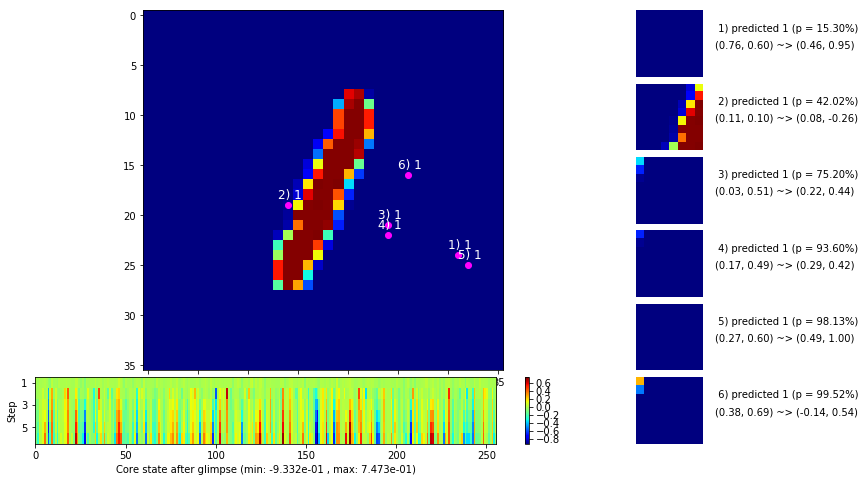

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


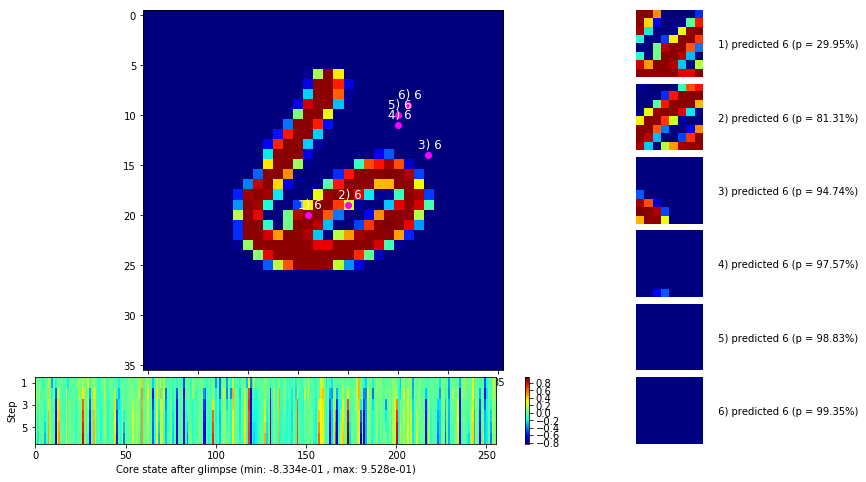


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


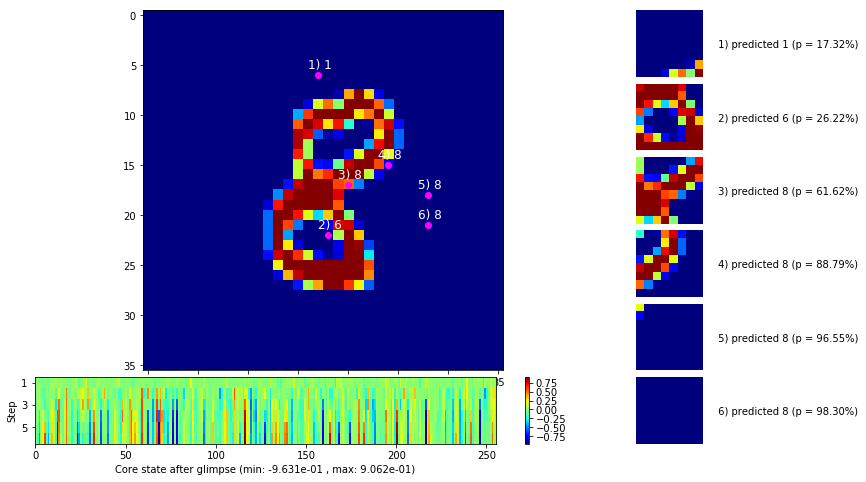

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


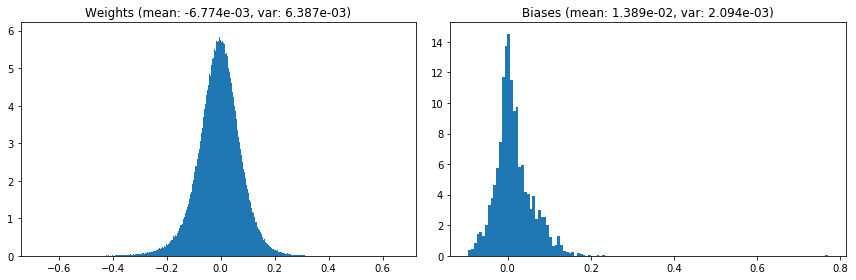

                                      Location network weights and biases


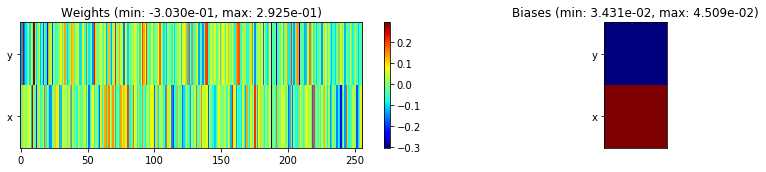

---------------------------------------------------------------------------------------------------------------
Elapsed time:  428.38 sec | TRAIN >> class loss: 0.8504 | steps:  3.072    | reward:  0.7175    | acc.: 71.745% 
                          | VAL   >> class loss: 0.5583 | steps:  2.514    | reward:  0.8170    | acc.: 81.700% 


Epoch   2/400) lr = 0.0008601
 b    500/  3000 >> 133.7 ms/b | lr: 8.43e-04 | grad 2norm:  6.55 | grad inf norm:  1.923
       Weights || abs max:  0.68 (13007.84) | mean: -6.82e-03 ( 0.08) | var: 6.65e-03 ( 1993.46)
        Biases || abs max:  0.79 ( 2275.99) | mean:  1.39e-02 ( 2.51) | var: 2.21e-03 (32177.89)
                  class loss: 0.485 | steps: 2.573 | reward:  0.841 | acc.: 84.10%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 8.26e-04 | grad 2norm:  6.48 | grad inf norm:  1.923
       Weights || abs max:  0.69 (18741.18) | mean: -7.02e-03 ( 0.09) | var

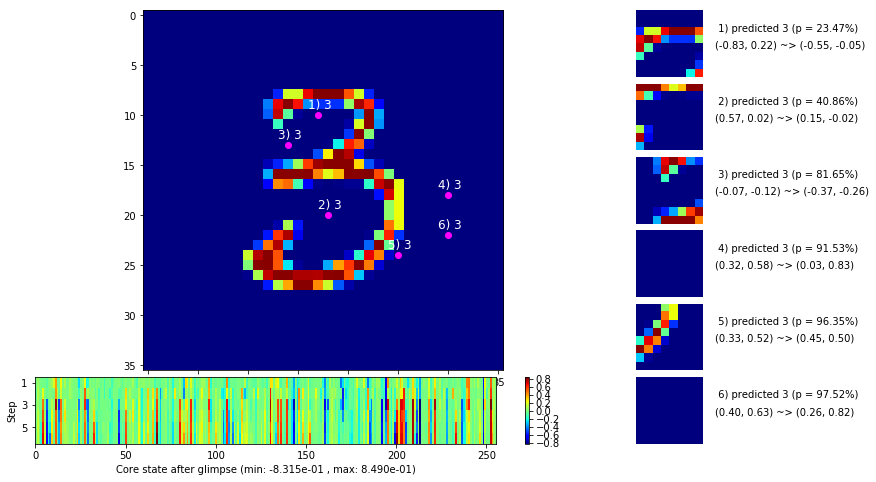

 b   1500/  3000 >> 133.9 ms/b | lr: 8.02e-04 | grad 2norm:  6.49 | grad inf norm:  1.831
       Weights || abs max:  0.71 (16216.77) | mean: -7.16e-03 ( 0.08) | var: 7.61e-03 ( 5124.63)
        Biases || abs max:  0.82 ( 2494.77) | mean:  1.37e-02 ( 2.49) | var: 2.66e-03 (187440.53)
                  class loss: 0.437 | steps: 2.483 | reward:  0.858 | acc.: 85.84%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.4 ms/b | lr: 7.86e-04 | grad 2norm:  6.54 | grad inf norm:  1.886
       Weights || abs max:  0.73 (20484.36) | mean: -7.27e-03 ( 0.09) | var: 8.05e-03 (23496.08)
        Biases || abs max:  0.83 ( 1852.24) | mean:  1.37e-02 ( 1.89) | var: 2.77e-03 (26650.89)
                  class loss: 0.454 | steps: 2.476 | reward:  0.847 | acc.: 84.70%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

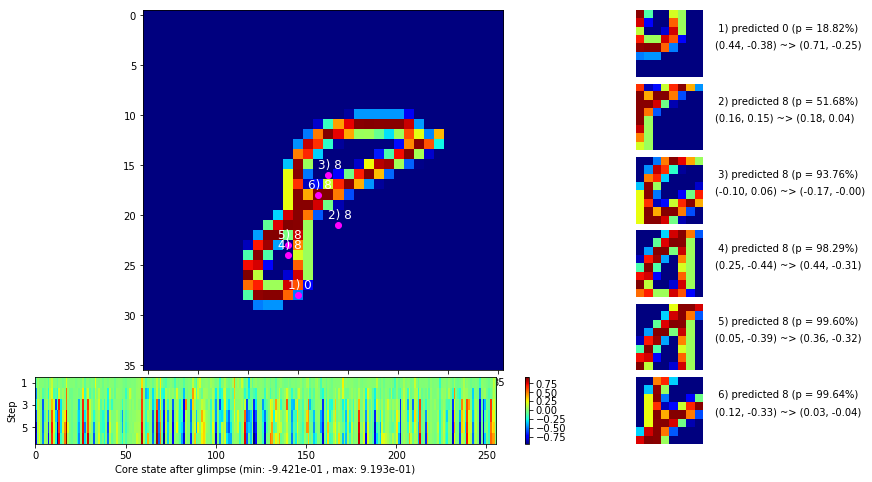

 b   2500/  3000 >> 144.6 ms/b | lr: 7.62e-04 | grad 2norm:  6.51 | grad inf norm:  1.842
       Weights || abs max:  0.74 (17791.68) | mean: -7.32e-03 ( 0.08) | var: 8.43e-03 ( 5717.10)
        Biases || abs max:  0.84 ( 1198.96) | mean:  1.31e-02 ( 1.41) | var: 2.97e-03 ( 6804.73)
                  class loss: 0.445 | steps: 2.455 | reward:  0.852 | acc.: 85.15%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 7.47e-04 | grad 2norm:  6.69 | grad inf norm:  1.950
       Weights || abs max:  0.76 (22864.44) | mean: -7.12e-03 ( 0.09) | var: 8.83e-03 (51982.87)
        Biases || abs max:  0.84 ( 1538.16) | mean:  1.36e-02 ( 1.64) | var: 3.14e-03 (25366.13)
                  class loss: 0.438 | steps: 2.480 | reward:  0.848 | acc.: 84.75%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

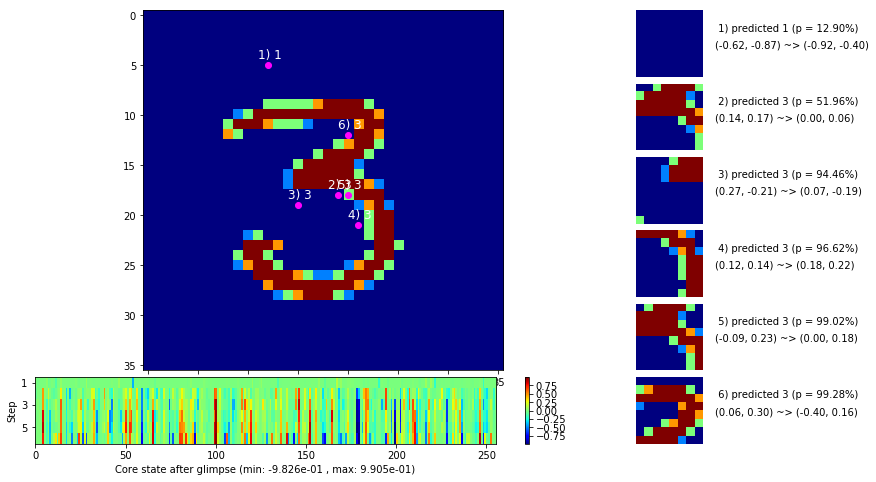

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


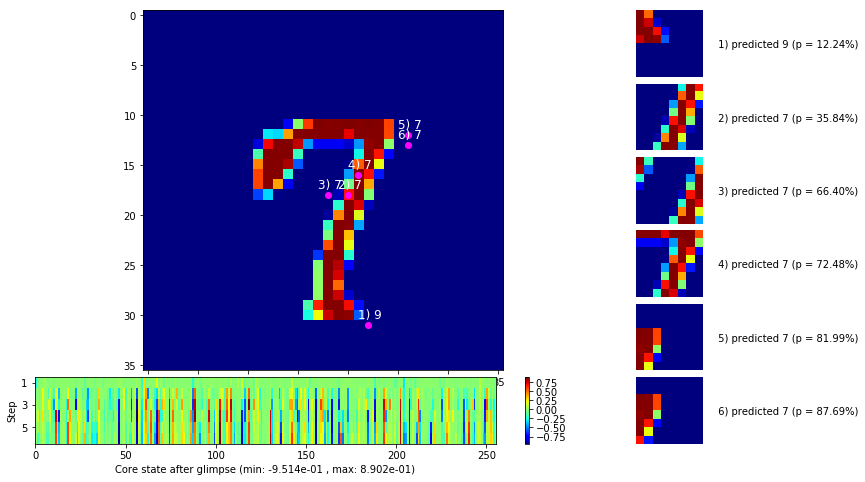


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


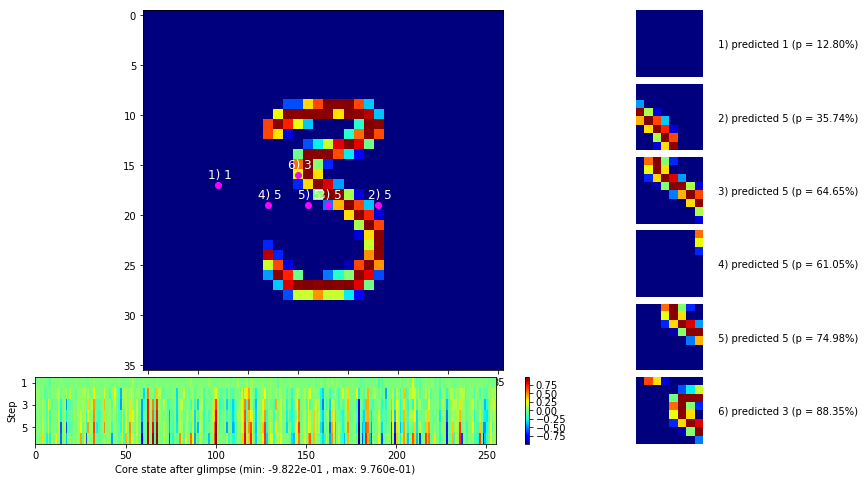

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


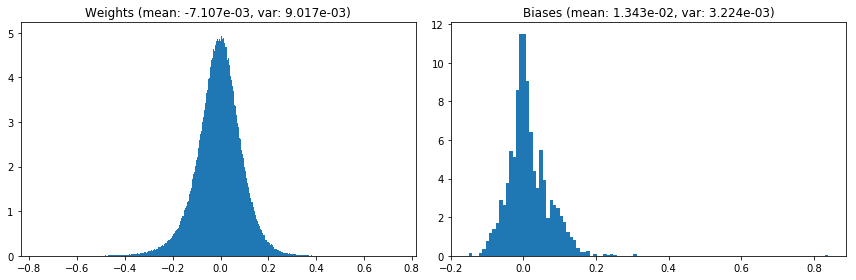

                                      Location network weights and biases


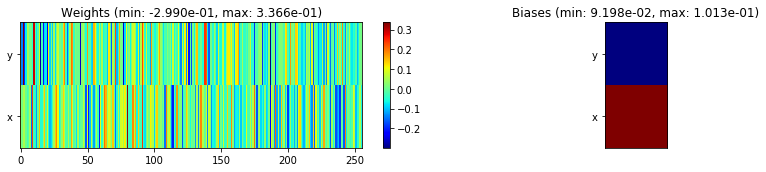

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.89 sec | TRAIN >> class loss: 0.4518 | steps:  2.497    | reward:  0.8487    | acc.: 84.872% 
                          | VAL   >> class loss: 0.4781 | steps:  2.417    | reward:  0.8402    | acc.: 84.020% 


Epoch   3/400) lr = 0.0007397
 b    500/  3000 >> 131.0 ms/b | lr: 7.25e-04 | grad 2norm:  6.81 | grad inf norm:  1.937
       Weights || abs max:  0.77 (28503.57) | mean: -7.30e-03 ( 0.10) | var: 9.20e-03 (43498.16)
        Biases || abs max:  0.84 ( 3480.20) | mean:  1.30e-02 ( 2.26) | var: 3.20e-03 (1160303.12)
                  class loss: 0.460 | steps: 2.486 | reward:  0.842 | acc.: 84.23%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 7.11e-04 | grad 2norm:  6.68 | grad inf norm:  1.851
       Weights || abs max:  0.78 (17982.93) | mean: -7.26e-03 ( 0.08) | v

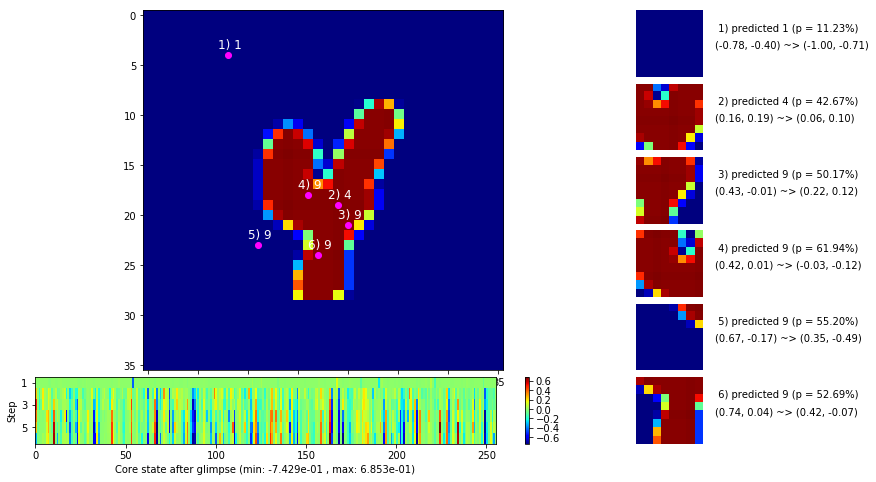

 b   1500/  3000 >> 133.0 ms/b | lr: 6.89e-04 | grad 2norm:  6.61 | grad inf norm:  1.823
       Weights || abs max:  0.78 (17111.97) | mean: -7.15e-03 ( 0.08) | var: 9.88e-03 ( 8402.76)
        Biases || abs max:  0.86 ( 1234.11) | mean:  1.26e-02 ( 1.47) | var: 3.51e-03 (11911.50)
                  class loss: 0.418 | steps: 2.438 | reward:  0.863 | acc.: 86.26%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.2 ms/b | lr: 6.76e-04 | grad 2norm:  6.61 | grad inf norm:  1.841
       Weights || abs max:  0.79 (67976.46) | mean: -7.22e-03 ( 0.16) | var: 1.02e-02 (1896226.75)
        Biases || abs max:  0.86 (  959.26) | mean:  1.21e-02 ( 1.22) | var: 3.58e-03 ( 5612.27)
                  class loss: 0.418 | steps: 2.455 | reward:  0.859 | acc.: 85.89%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

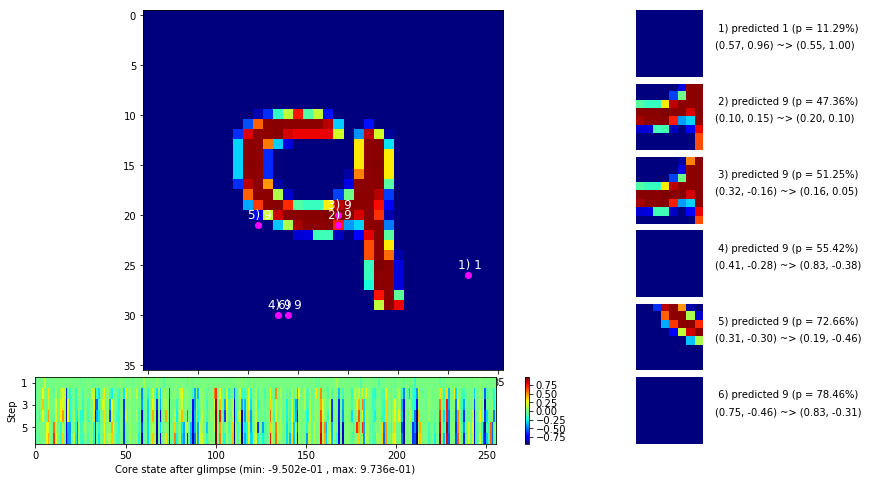

 b   2500/  3000 >> 132.0 ms/b | lr: 6.56e-04 | grad 2norm:  6.66 | grad inf norm:  1.858
       Weights || abs max:  0.80 (23091.96) | mean: -7.27e-03 ( 0.09) | var: 1.05e-02 (31046.48)
        Biases || abs max:  0.87 ( 1070.40) | mean:  1.20e-02 ( 1.16) | var: 3.75e-03 ( 5845.60)
                  class loss: 0.428 | steps: 2.436 | reward:  0.857 | acc.: 85.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.6 ms/b | lr: 6.43e-04 | grad 2norm:  6.69 | grad inf norm:  1.913
       Weights || abs max:  0.80 (33206.69) | mean: -7.16e-03 ( 0.10) | var: 1.07e-02 (103747.68)
        Biases || abs max:  0.87 ( 1329.24) | mean:  1.26e-02 ( 1.32) | var: 3.81e-03 (13291.70)
                  class loss: 0.446 | steps: 2.476 | reward:  0.849 | acc.: 84.89%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

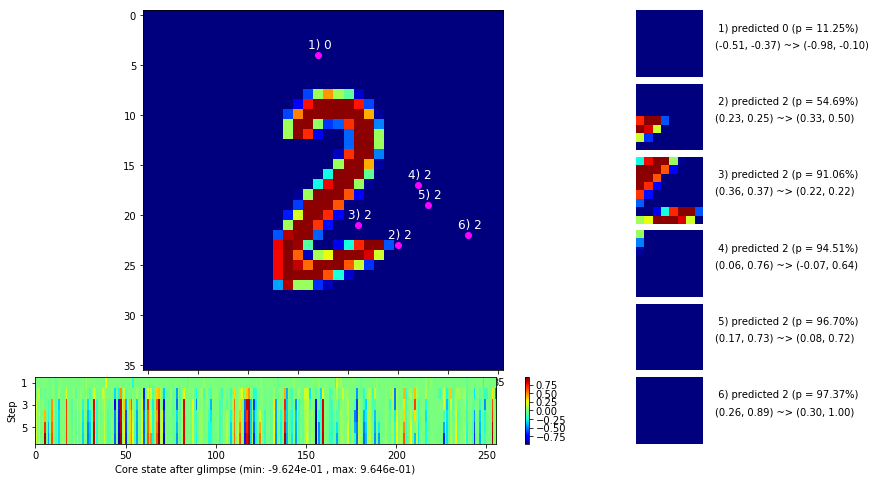

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


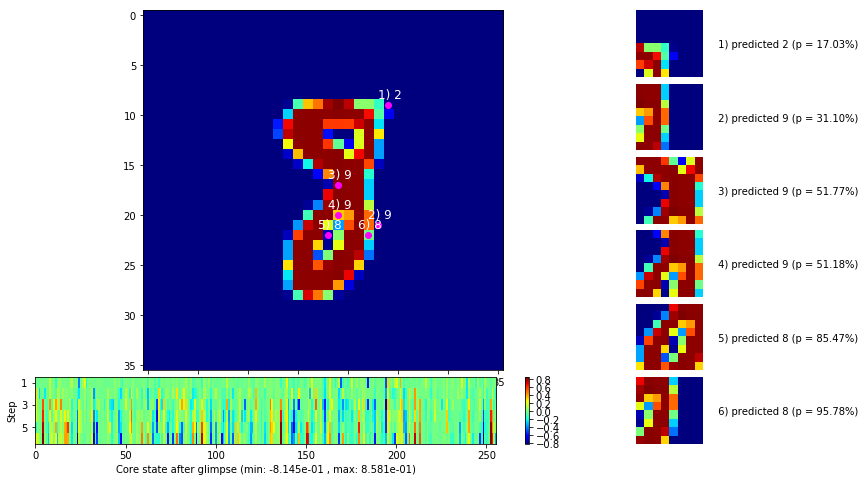


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


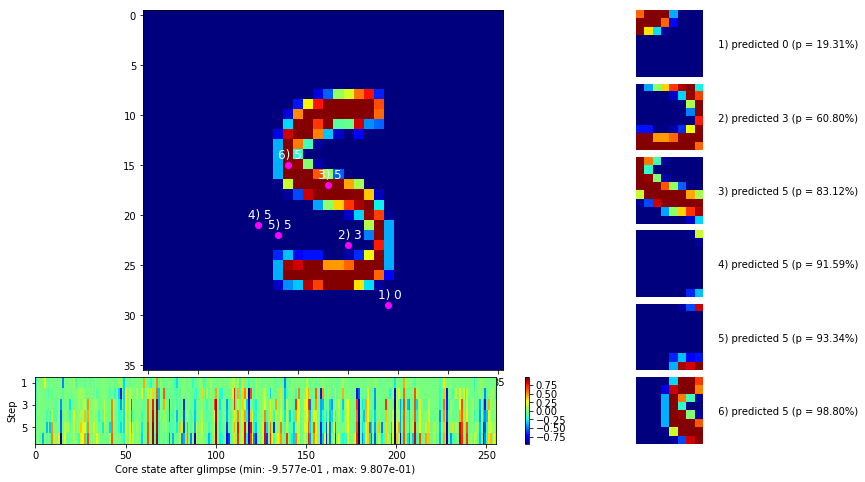

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


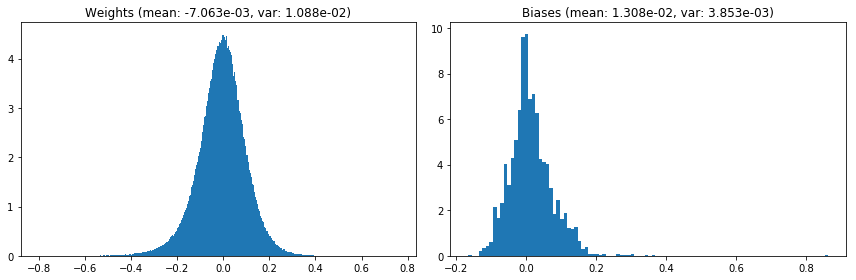

                                      Location network weights and biases


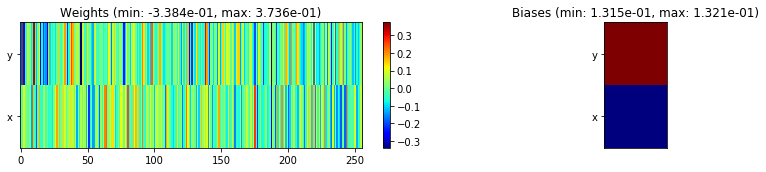

---------------------------------------------------------------------------------------------------------------
Elapsed time:  397.59 sec | TRAIN >> class loss: 0.4349 | steps:  2.459    | reward:  0.8532    | acc.: 85.320% 
                          | VAL   >> class loss: 0.4392 | steps:  2.396    | reward:  0.8444    | acc.: 84.440% 


Epoch   4/400) lr = 0.0006362
 b    500/  3000 >> 141.5 ms/b | lr: 6.24e-04 | grad 2norm:  6.88 | grad inf norm:  1.859
       Weights || abs max:  0.80 (16743.54) | mean: -6.94e-03 ( 0.08) | var: 1.10e-02 (14546.74)
        Biases || abs max:  0.86 ( 1506.45) | mean:  1.35e-02 ( 1.44) | var: 3.92e-03 (30493.48)
                  class loss: 0.433 | steps: 2.435 | reward:  0.850 | acc.: 85.00%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.1 ms/b | lr: 6.11e-04 | grad 2norm:  6.54 | grad inf norm:  1.672
       Weights || abs max:  0.81 (60339.16) | mean: -7.03e-03 ( 0.15) | var

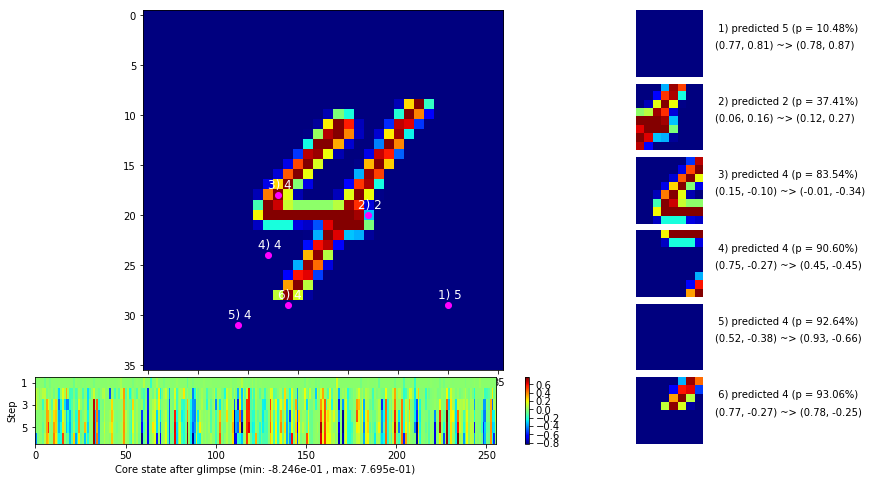

 b   1500/  3000 >> 133.0 ms/b | lr: 5.93e-04 | grad 2norm:  6.30 | grad inf norm:  1.763
       Weights || abs max:  0.81 (68598.25) | mean: -7.18e-03 ( 0.16) | var: 1.15e-02 (1126086.50)
        Biases || abs max:  0.88 ( 1446.27) | mean:  1.22e-02 ( 1.30) | var: 4.13e-03 (10954.67)
                  class loss: 0.371 | steps: 2.402 | reward:  0.878 | acc.: 87.76%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 5.81e-04 | grad 2norm:  6.14 | grad inf norm:  1.639
       Weights || abs max:  0.81 (42170.62) | mean: -7.29e-03 ( 0.12) | var: 1.17e-02 (314937.06)
        Biases || abs max:  0.89 ( 1150.72) | mean:  1.24e-02 ( 1.14) | var: 4.18e-03 ( 6358.47)
                  class loss: 0.336 | steps: 2.357 | reward:  0.888 | acc.: 88.78%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

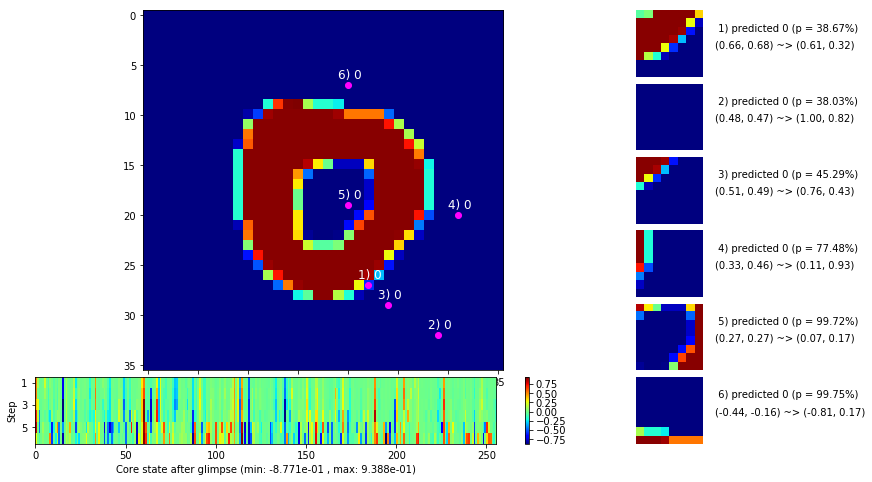

 b   2500/  3000 >> 133.9 ms/b | lr: 5.64e-04 | grad 2norm:  5.86 | grad inf norm:  1.531
       Weights || abs max:  0.82 (20014.44) | mean: -7.29e-03 ( 0.08) | var: 1.20e-02 (11323.02)
        Biases || abs max:  0.90 ( 1304.12) | mean:  1.22e-02 ( 1.22) | var: 4.33e-03 ( 7667.96)
                  class loss: 0.315 | steps: 2.333 | reward:  0.897 | acc.: 89.68%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.2 ms/b | lr: 5.53e-04 | grad 2norm:  5.81 | grad inf norm:  1.494
       Weights || abs max:  0.83 (26742.32) | mean: -7.17e-03 ( 0.09) | var: 1.22e-02 (113582.52)
        Biases || abs max:  0.91 ( 1244.59) | mean:  1.23e-02 ( 1.22) | var: 4.49e-03 ( 6737.87)
                  class loss: 0.288 | steps: 2.308 | reward:  0.905 | acc.: 90.46%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

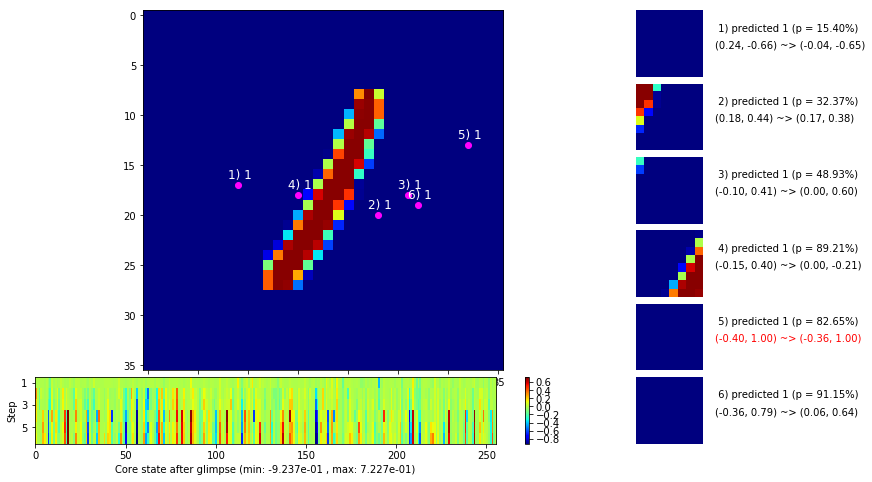

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


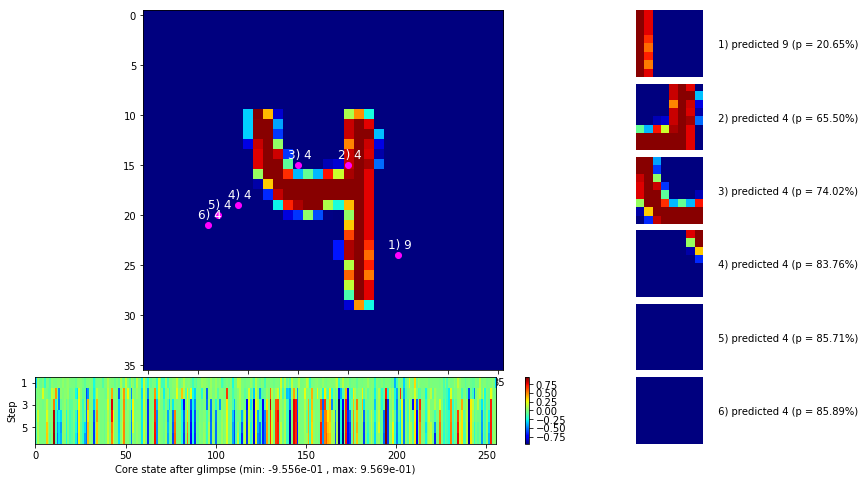


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


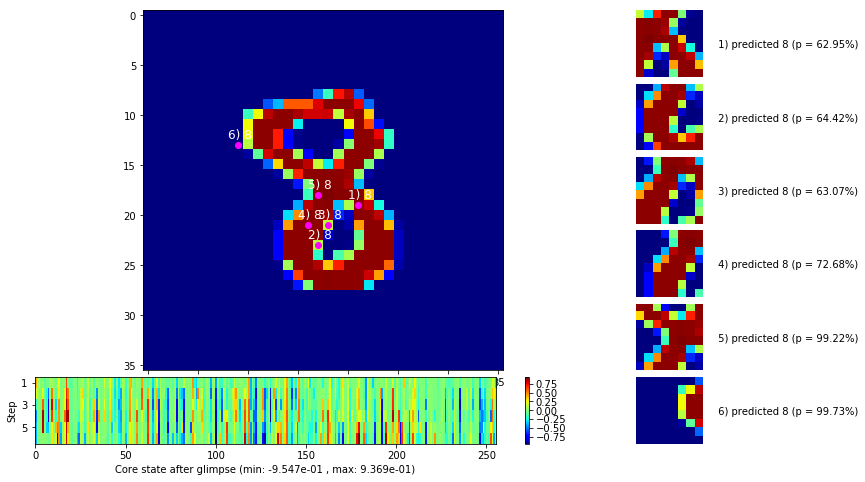

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


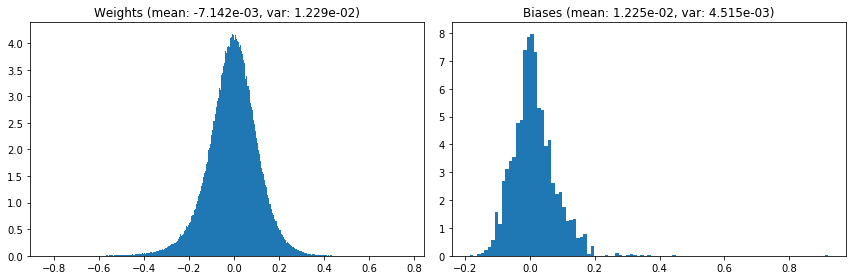

                                      Location network weights and biases


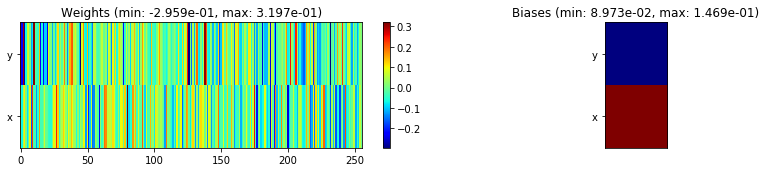

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.27 sec | TRAIN >> class loss: 0.3543 | steps:  2.373    | reward:  0.8809    | acc.: 88.090% 
                          | VAL   >> class loss: 0.2686 | steps:  2.166    | reward:  0.9082    | acc.: 90.820% 


Epoch   5/400) lr = 0.0005472
 b    500/  3000 >> 132.8 ms/b | lr: 5.36e-04 | grad 2norm:  5.83 | grad inf norm:  1.525
       Weights || abs max:  0.83 (101366.59) | mean: -7.08e-03 ( 0.22) | var: 1.24e-02 (2980066.75)
        Biases || abs max:  0.92 ( 2637.33) | mean:  1.27e-02 ( 1.75) | var: 4.57e-03 (109515.12)
                  class loss: 0.283 | steps: 2.298 | reward:  0.908 | acc.: 90.78%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.1 ms/b | lr: 5.26e-04 | grad 2norm:  6.02 | grad inf norm:  1.543
       Weights || abs max:  0.84 (11468.02) | mean: -7.03e-03 ( 0.07) |

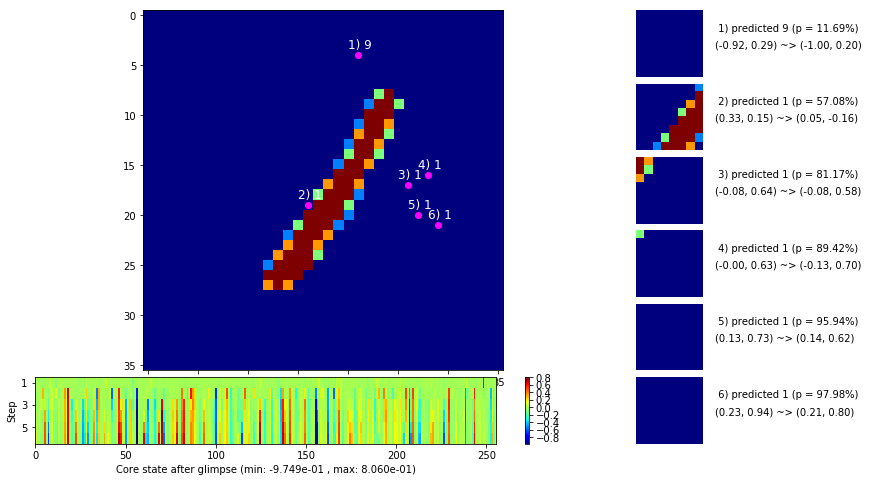

 b   1500/  3000 >> 135.2 ms/b | lr: 5.10e-04 | grad 2norm:  5.85 | grad inf norm:  1.507
       Weights || abs max:  0.85 (15876.49) | mean: -7.11e-03 ( 0.07) | var: 1.28e-02 ( 5870.29)
        Biases || abs max:  0.92 ( 2961.48) | mean:  1.24e-02 ( 1.77) | var: 4.75e-03 (493931.53)
                  class loss: 0.277 | steps: 2.268 | reward:  0.907 | acc.: 90.66%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 140.2 ms/b | lr: 5.00e-04 | grad 2norm:  5.79 | grad inf norm:  1.515
       Weights || abs max:  0.89 (18998.13) | mean: -7.19e-03 ( 0.08) | var: 1.30e-02 (10982.37)
        Biases || abs max:  0.92 ( 1162.13) | mean:  1.23e-02 ( 1.04) | var: 4.93e-03 ( 9710.10)
                  class loss: 0.277 | steps: 2.223 | reward:  0.909 | acc.: 90.95%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

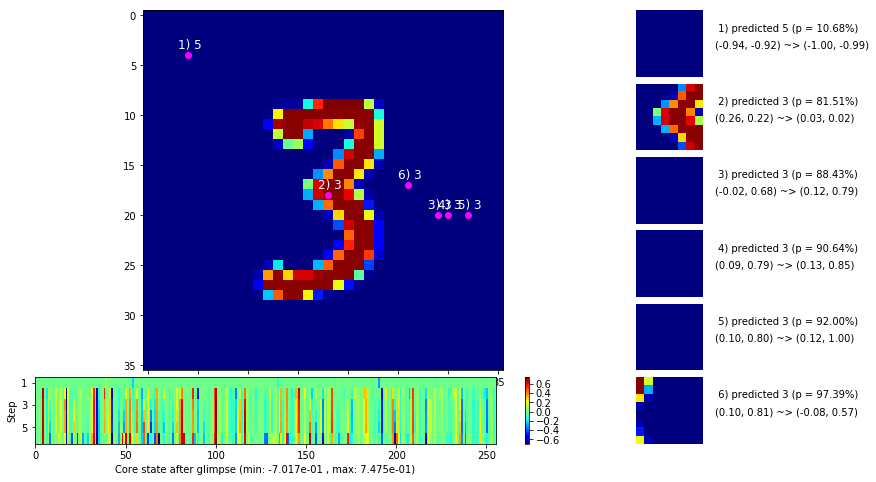

 b   2500/  3000 >> 135.1 ms/b | lr: 4.85e-04 | grad 2norm:  5.81 | grad inf norm:  1.485
       Weights || abs max:  0.89 (19626.08) | mean: -7.27e-03 ( 0.08) | var: 1.31e-02 ( 9393.59)
        Biases || abs max:  0.92 ( 1907.17) | mean:  1.19e-02 ( 1.23) | var: 4.99e-03 (151312.28)
                  class loss: 0.276 | steps: 2.264 | reward:  0.907 | acc.: 90.68%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.6 ms/b | lr: 4.75e-04 | grad 2norm:  5.92 | grad inf norm:  1.535
       Weights || abs max:  0.88 (15849.91) | mean: -7.17e-03 ( 0.07) | var: 1.33e-02 ( 8607.94)
        Biases || abs max:  0.92 ( 1498.55) | mean:  1.23e-02 ( 1.07) | var: 5.08e-03 (104489.91)
                  class loss: 0.266 | steps: 2.251 | reward:  0.907 | acc.: 90.75%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

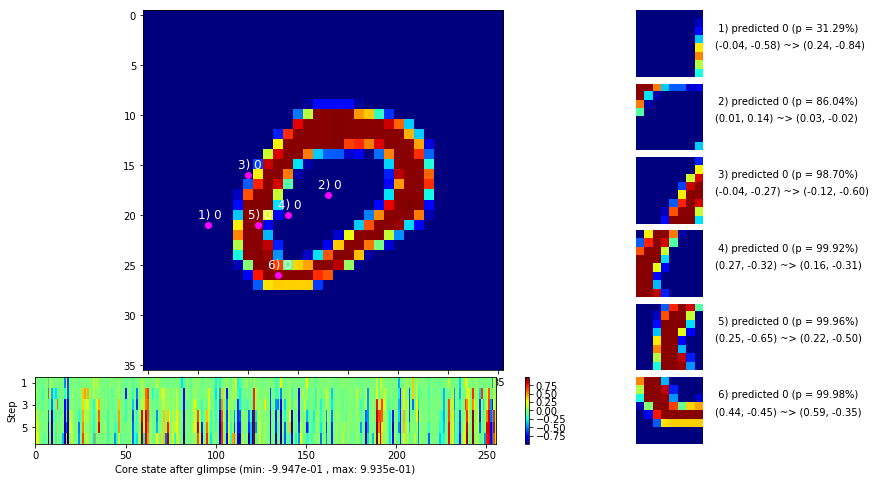

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


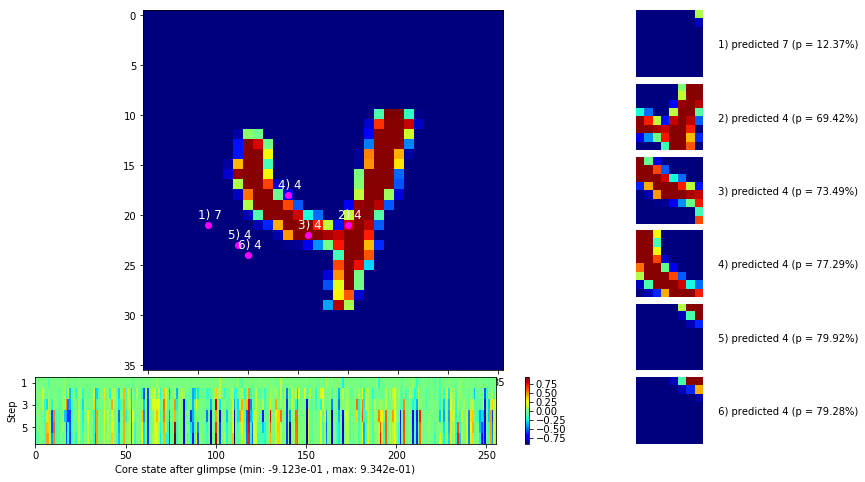


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


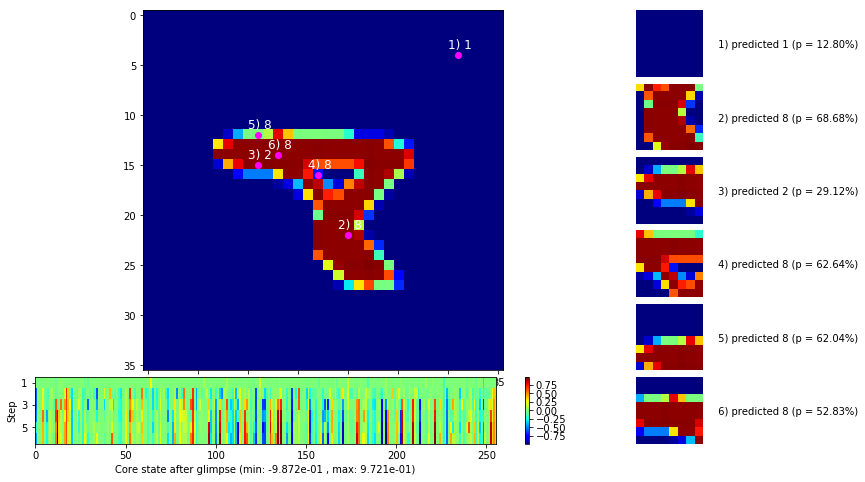

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


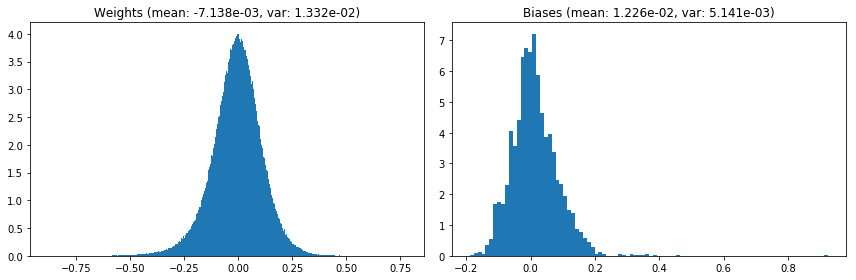

                                      Location network weights and biases


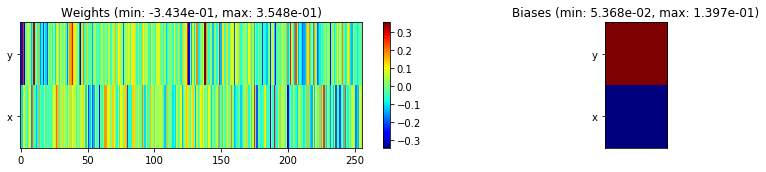

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.50 sec | TRAIN >> class loss: 0.2790 | steps:  2.267    | reward:  0.9066    | acc.: 90.658% 
                          | VAL   >> class loss: 0.2830 | steps:  2.100    | reward:  0.8998 :( | acc.: 89.980% :(


Epoch   6/400) lr = 0.0004706
 b    500/  3000 >> 132.4 ms/b | lr: 4.61e-04 | grad 2norm:  5.97 | grad inf norm:  1.487
       Weights || abs max:  0.88 (29979.79) | mean: -7.10e-03 ( 0.10) | var: 1.34e-02 (146596.31)
        Biases || abs max:  0.93 (  841.15) | mean:  1.25e-02 ( 0.82) | var: 5.15e-03 ( 2819.17)
                  class loss: 0.259 | steps: 2.204 | reward:  0.911 | acc.: 91.07%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.7 ms/b | lr: 4.52e-04 | grad 2norm:  5.76 | grad inf norm:  1.455
       Weights || abs max:  0.89 (39587.10) | mean: -7.00e-03 ( 0.11) | 

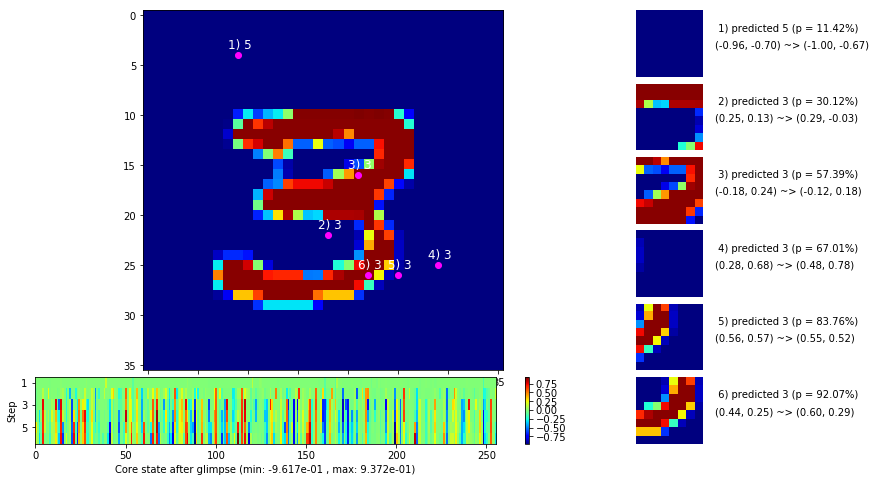

 b   1500/  3000 >> 134.0 ms/b | lr: 4.39e-04 | grad 2norm:  5.97 | grad inf norm:  1.483
       Weights || abs max:  0.89 (35974.59) | mean: -7.00e-03 ( 0.11) | var: 1.37e-02 (139679.84)
        Biases || abs max:  0.93 ( 3516.47) | mean:  1.28e-02 ( 2.76) | var: 5.24e-03 (2143184.50)
                  class loss: 0.266 | steps: 2.221 | reward:  0.909 | acc.: 90.95%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.9 ms/b | lr: 4.30e-04 | grad 2norm:  5.63 | grad inf norm:  1.423
       Weights || abs max:  0.89 (22542.97) | mean: -7.14e-03 ( 0.09) | var: 1.38e-02 (26430.53)
        Biases || abs max:  0.93 (  792.29) | mean:  1.25e-02 ( 0.79) | var: 5.27e-03 ( 3611.81)
                  class loss: 0.236 | steps: 2.212 | reward:  0.920 | acc.: 92.04%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

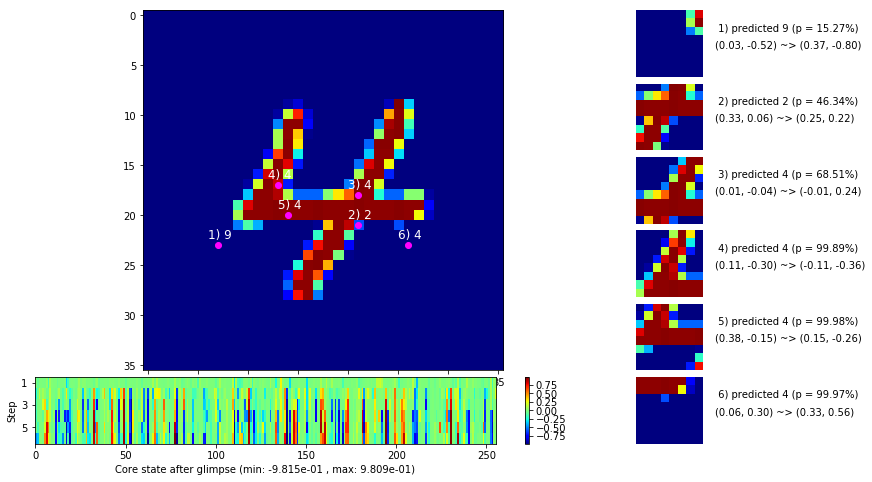

 b   2500/  3000 >> 134.2 ms/b | lr: 4.17e-04 | grad 2norm:  5.47 | grad inf norm:  1.419
       Weights || abs max:  0.90 (22823.73) | mean: -7.10e-03 ( 0.09) | var: 1.39e-02 (15878.76)
        Biases || abs max:  0.93 ( 1034.57) | mean:  1.25e-02 ( 0.94) | var: 5.33e-03 ( 6146.14)
                  class loss: 0.230 | steps: 2.182 | reward:  0.923 | acc.: 92.27%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.0 ms/b | lr: 4.09e-04 | grad 2norm:  5.56 | grad inf norm:  1.392
       Weights || abs max:  0.91 (15884.00) | mean: -7.10e-03 ( 0.08) | var: 1.40e-02 ( 8038.72)
        Biases || abs max:  0.94 (  940.89) | mean:  1.22e-02 ( 0.86) | var: 5.41e-03 (10526.32)
                  class loss: 0.226 | steps: 2.187 | reward:  0.923 | acc.: 92.33%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

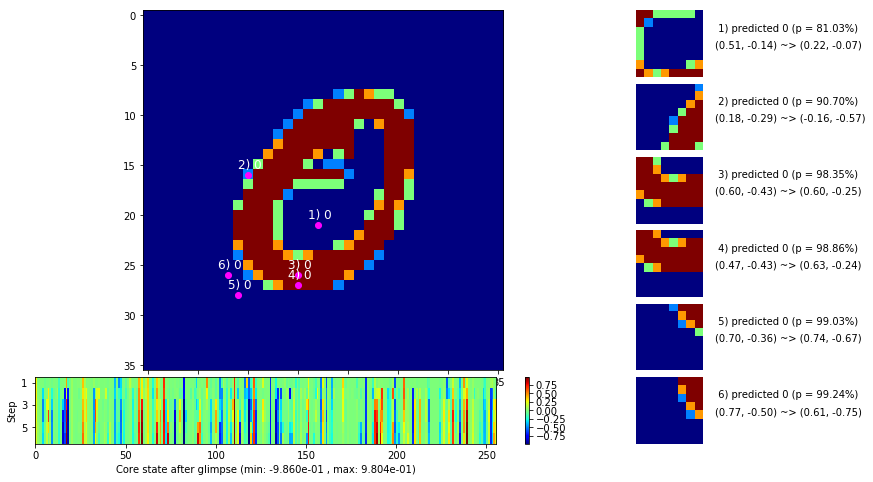

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


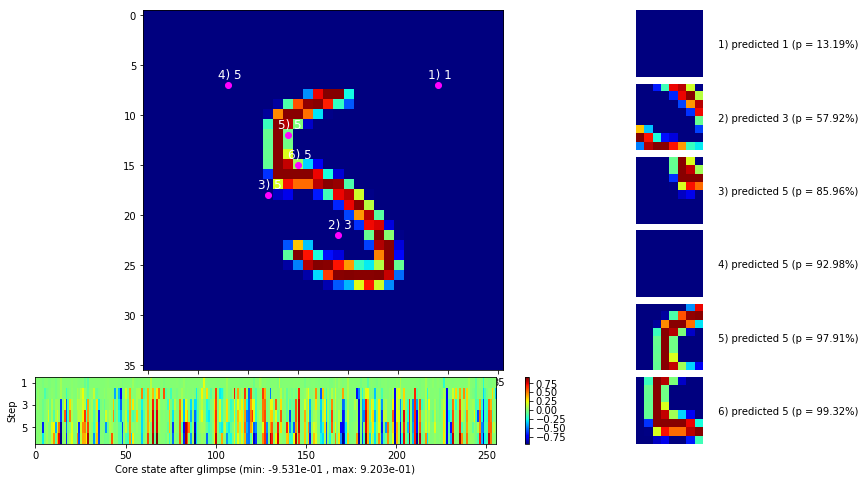


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


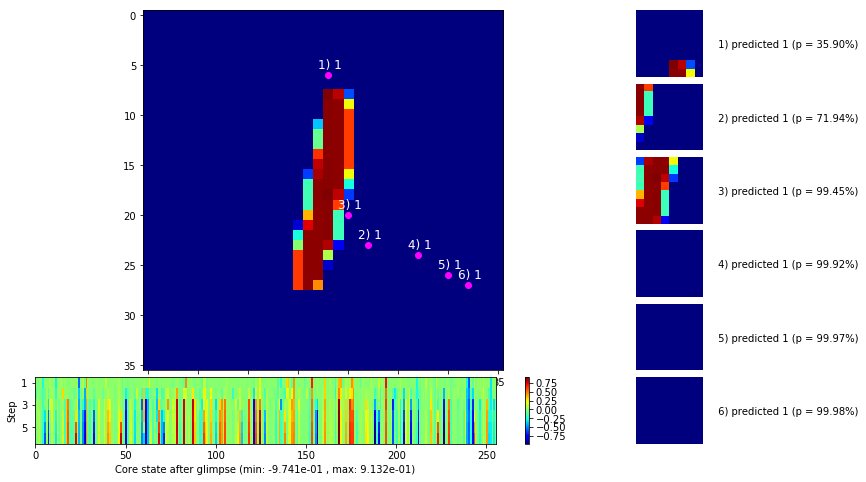

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


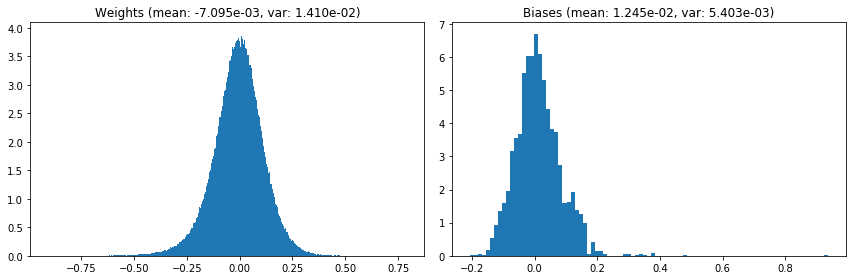

                                      Location network weights and biases


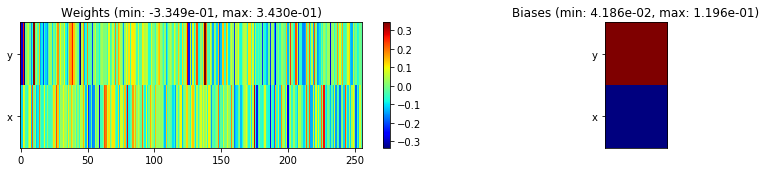

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.20 sec | TRAIN >> class loss: 0.2442 | steps:  2.202    | reward:  0.9167    | acc.: 91.667% 
                          | VAL   >> class loss: 0.2216 | steps:  2.042    | reward:  0.9274    | acc.: 92.740% 


Epoch   7/400) lr = 0.0004047
 b    500/  3000 >> 143.6 ms/b | lr: 3.97e-04 | grad 2norm:  5.51 | grad inf norm:  1.385
       Weights || abs max:  0.91 (22258.90) | mean: -7.08e-03 ( 0.09) | var: 1.42e-02 (72035.16)
        Biases || abs max:  0.94 ( 3549.97) | mean:  1.25e-02 ( 1.90) | var: 5.45e-03 (1304820.50)
                  class loss: 0.231 | steps: 2.178 | reward:  0.923 | acc.: 92.29%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.9 ms/b | lr: 3.89e-04 | grad 2norm:  5.76 | grad inf norm:  1.440
       Weights || abs max:  0.93 (23855.17) | mean: -7.07e-03 ( 0.09) | v

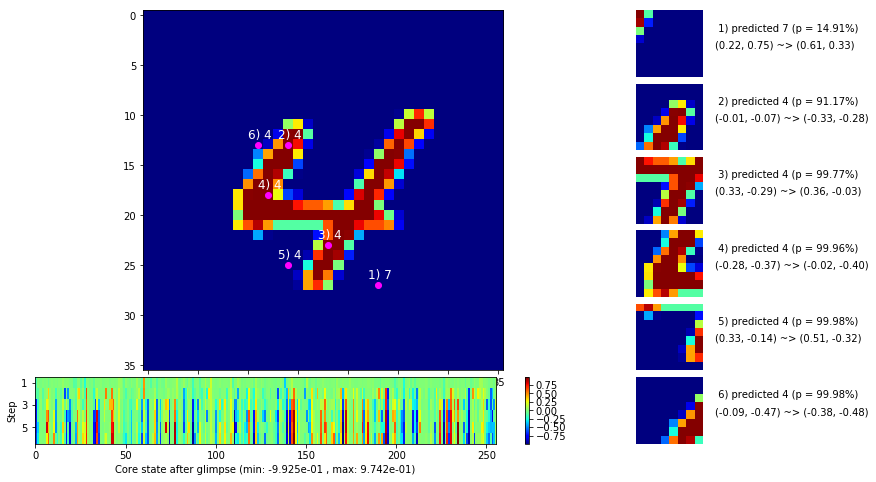

 b   1500/  3000 >> 134.0 ms/b | lr: 3.77e-04 | grad 2norm:  5.52 | grad inf norm:  1.386
       Weights || abs max:  0.94 (22110.75) | mean: -6.94e-03 ( 0.09) | var: 1.44e-02 (66977.25)
        Biases || abs max:  0.94 ( 1137.70) | mean:  1.25e-02 ( 0.91) | var: 5.58e-03 (27753.12)
                  class loss: 0.230 | steps: 2.182 | reward:  0.923 | acc.: 92.29%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 3.70e-04 | grad 2norm:  5.52 | grad inf norm:  1.390
       Weights || abs max:  0.96 (36130.36) | mean: -6.81e-03 ( 0.11) | var: 1.45e-02 (130473.51)
        Biases || abs max:  0.94 (  652.41) | mean:  1.29e-02 ( 0.69) | var: 5.67e-03 ( 2870.96)
                  class loss: 0.231 | steps: 2.180 | reward:  0.924 | acc.: 92.40%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

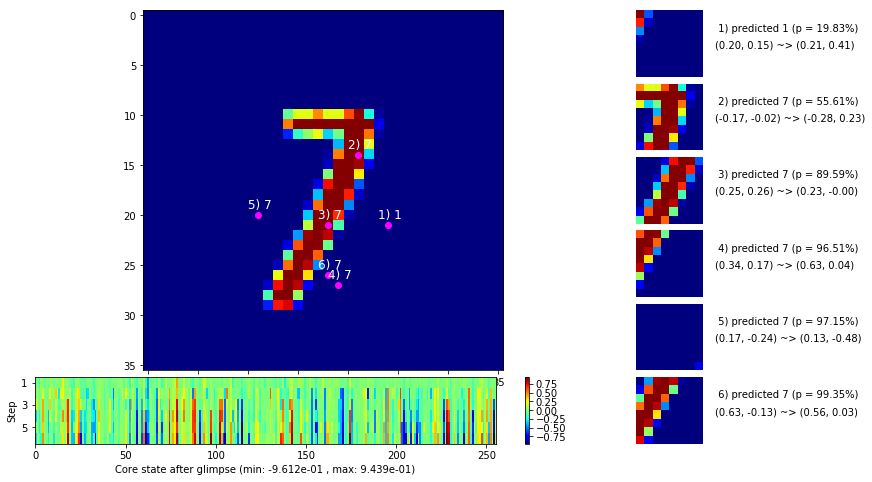

 b   2500/  3000 >> 134.5 ms/b | lr: 3.59e-04 | grad 2norm:  5.40 | grad inf norm:  1.376
       Weights || abs max:  0.97 (22798.77) | mean: -6.84e-03 ( 0.09) | var: 1.45e-02 (15086.14)
        Biases || abs max:  0.94 (  844.82) | mean:  1.28e-02 ( 0.76) | var: 5.65e-03 ( 4406.49)
                  class loss: 0.225 | steps: 2.172 | reward:  0.927 | acc.: 92.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.9 ms/b | lr: 3.52e-04 | grad 2norm:  5.39 | grad inf norm:  1.380
       Weights || abs max:  0.97 (32658.38) | mean: -6.83e-03 ( 0.11) | var: 1.46e-02 (64779.16)
        Biases || abs max:  0.94 ( 1014.78) | mean:  1.27e-02 ( 0.88) | var: 5.67e-03 ( 6185.34)
                  class loss: 0.219 | steps: 2.134 | reward:  0.928 | acc.: 92.79%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

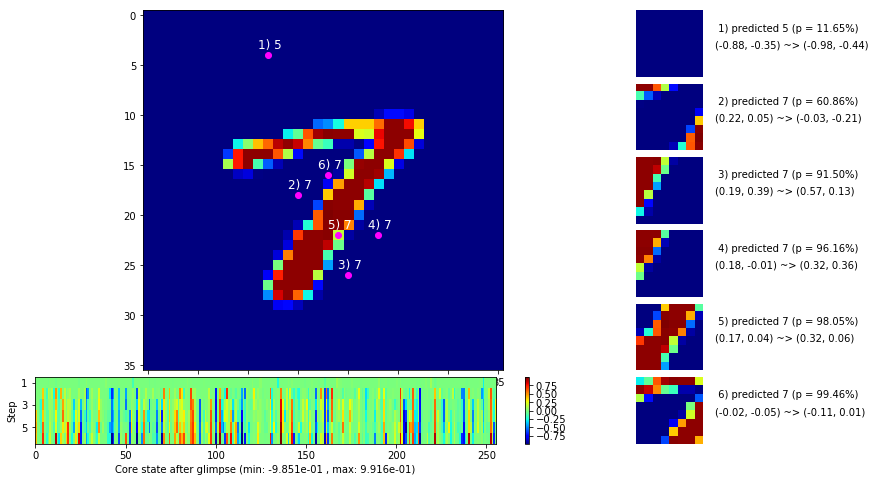

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


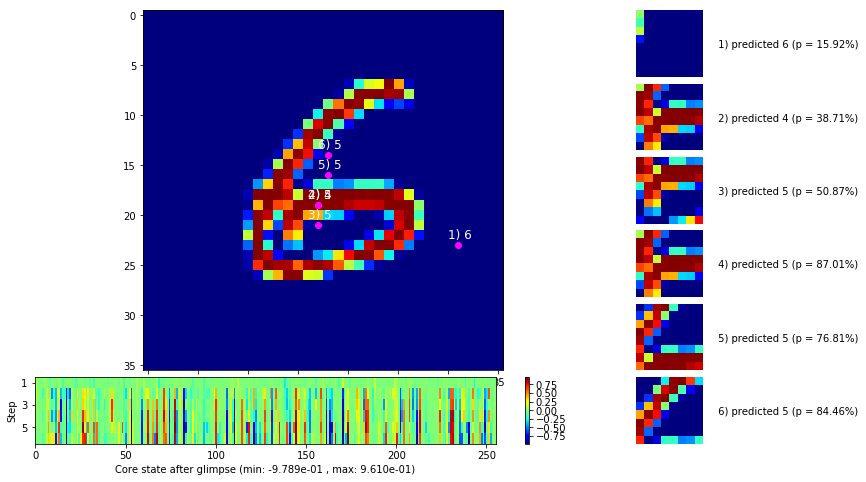


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


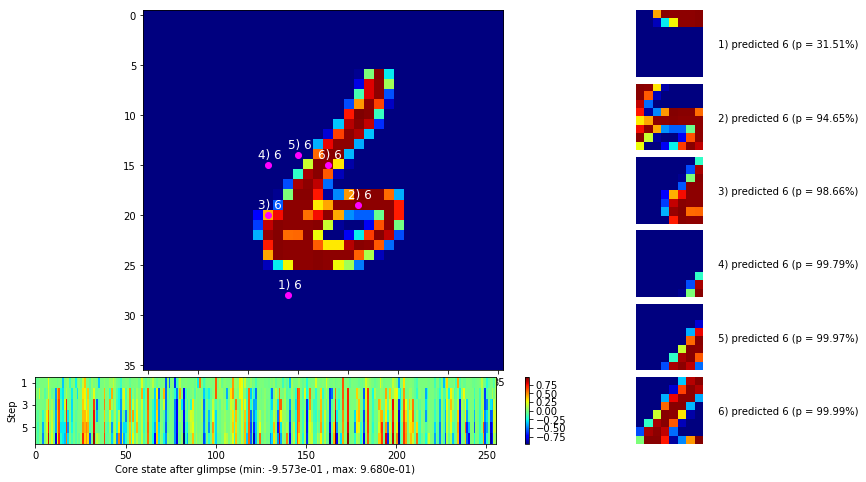

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


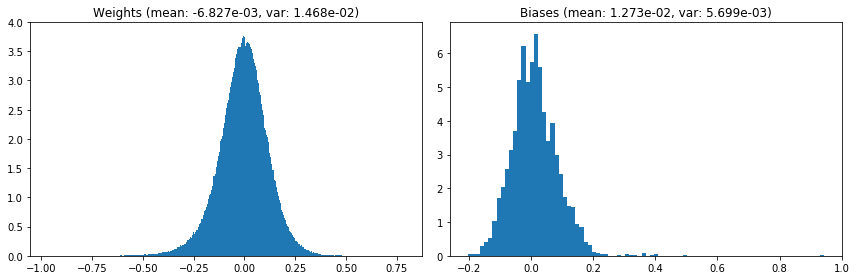

                                      Location network weights and biases


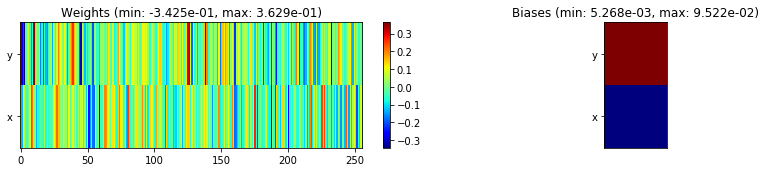

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.92 sec | TRAIN >> class loss: 0.2288 | steps:  2.175    | reward:  0.9235    | acc.: 92.353% 
                          | VAL   >> class loss: 0.2352 | steps:  2.067 :( | reward:  0.9252 :( | acc.: 92.520% :(


Epoch   8/400) lr = 0.0003481
 b    500/  3000 >> 132.0 ms/b | lr: 3.41e-04 | grad 2norm:  5.50 | grad inf norm:  1.439
       Weights || abs max:  0.97 (28511.08) | mean: -6.81e-03 ( 0.10) | var: 1.47e-02 (42336.86)
        Biases || abs max:  0.94 ( 3109.64) | mean:  1.27e-02 ( 1.85) | var: 5.69e-03 (351458.56)
                  class loss: 0.228 | steps: 2.175 | reward:  0.924 | acc.: 92.44%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 3.34e-04 | grad 2norm:  5.33 | grad inf norm:  1.343
       Weights || abs max:  0.98 (21450.66) | mean: -6.78e-03 ( 0.09) | 

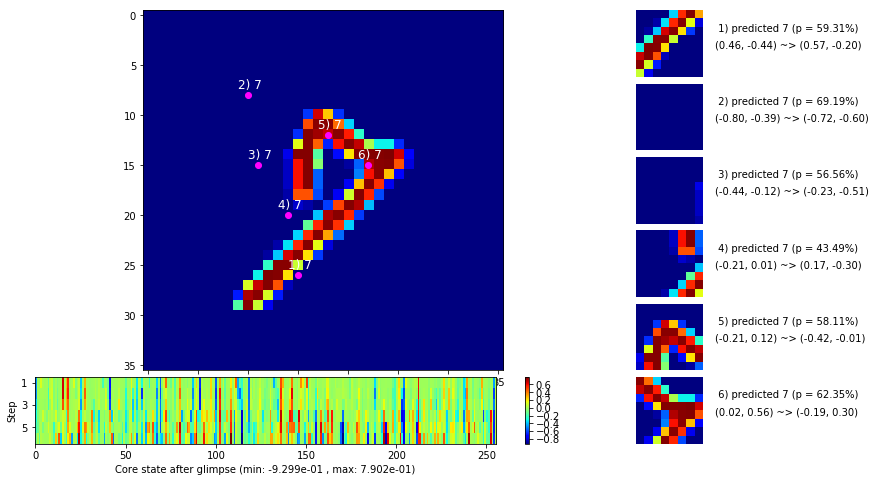

 b   1500/  3000 >> 133.4 ms/b | lr: 3.24e-04 | grad 2norm:  5.43 | grad inf norm:  1.372
       Weights || abs max:  0.99 (27775.28) | mean: -6.66e-03 ( 0.10) | var: 1.49e-02 (85223.75)
        Biases || abs max:  0.95 ( 1593.47) | mean:  1.28e-02 ( 1.05) | var: 5.74e-03 (41686.21)
                  class loss: 0.213 | steps: 2.170 | reward:  0.927 | acc.: 92.75%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 140.9 ms/b | lr: 3.18e-04 | grad 2norm:  5.51 | grad inf norm:  1.365
       Weights || abs max:  1.01 (17450.95) | mean: -6.59e-03 ( 0.08) | var: 1.50e-02 ( 7009.88)
        Biases || abs max:  0.94 ( 2469.38) | mean:  1.29e-02 ( 1.50) | var: 5.77e-03 (96675.58)
                  class loss: 0.227 | steps: 2.183 | reward:  0.925 | acc.: 92.51%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

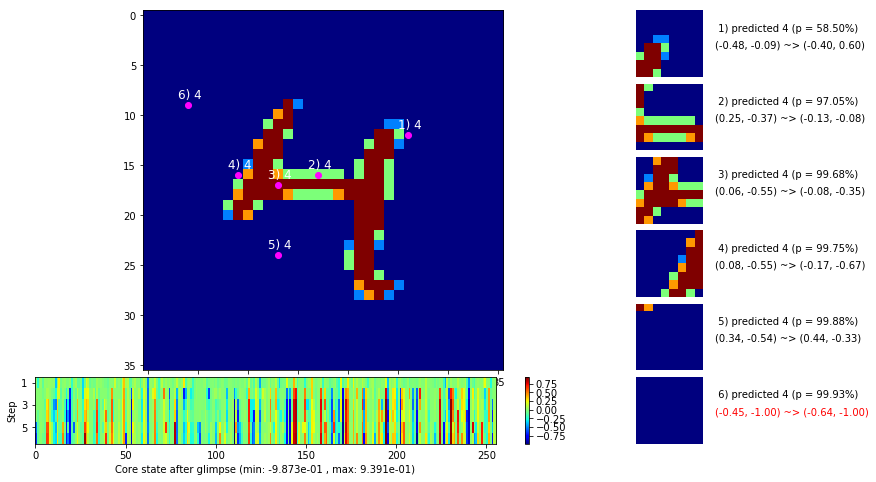

 b   2500/  3000 >> 132.0 ms/b | lr: 3.09e-04 | grad 2norm:  5.51 | grad inf norm:  1.381
       Weights || abs max:  1.01 (29395.87) | mean: -6.56e-03 ( 0.10) | var: 1.50e-02 (39788.80)
        Biases || abs max:  0.94 ( 1690.83) | mean:  1.28e-02 ( 1.12) | var: 5.80e-03 (51796.81)
                  class loss: 0.231 | steps: 2.157 | reward:  0.921 | acc.: 92.13%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 3.02e-04 | grad 2norm:  5.38 | grad inf norm:  1.387
       Weights || abs max:  1.01 (21734.35) | mean: -6.49e-03 ( 0.09) | var: 1.51e-02 (11951.64)
        Biases || abs max:  0.94 (  579.24) | mean:  1.31e-02 ( 0.60) | var: 5.81e-03 ( 1118.63)
                  class loss: 0.213 | steps: 2.166 | reward:  0.927 | acc.: 92.73%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

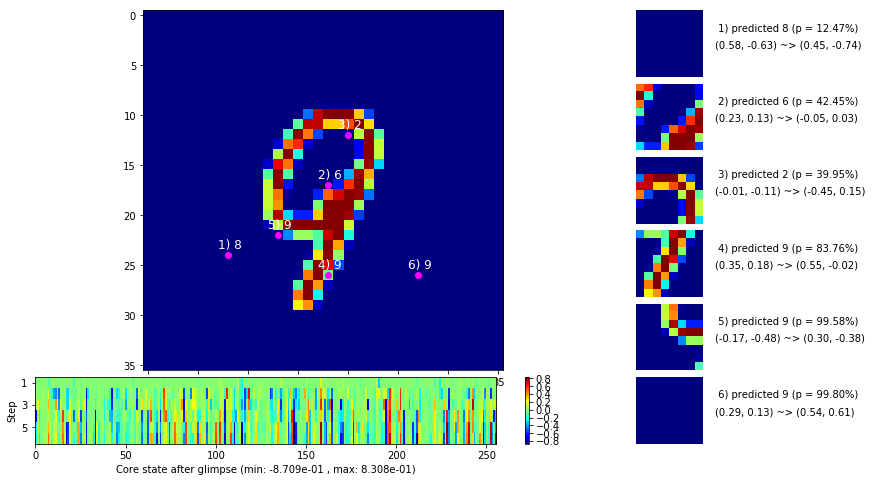

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


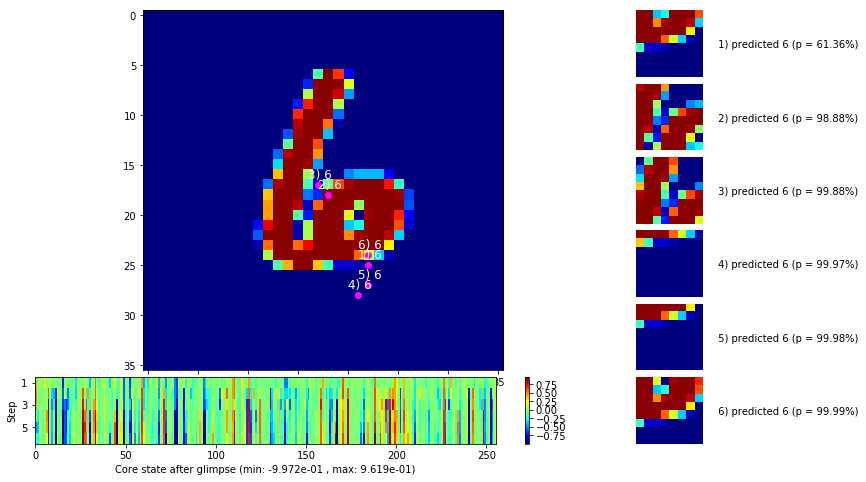


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


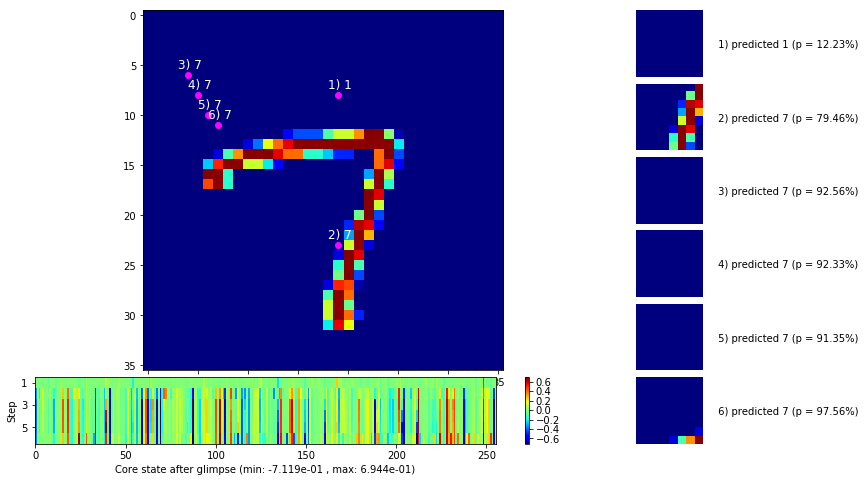

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


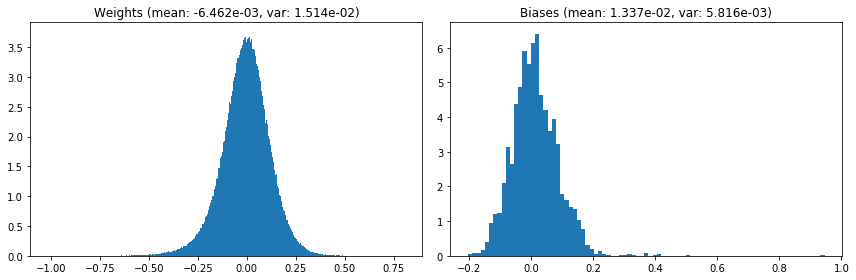

                                      Location network weights and biases


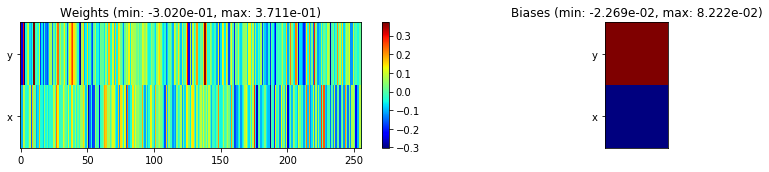

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.59 sec | TRAIN >> class loss: 0.2204 | steps:  2.170    | reward:  0.9258    | acc.: 92.580% 
                          | VAL   >> class loss: 0.2400 | steps:  2.048 :( | reward:  0.9218 :( | acc.: 92.180% :(


Epoch   9/400) lr = 0.0002994
 b    500/  3000 >> 132.2 ms/b | lr: 2.93e-04 | grad 2norm:  5.11 | grad inf norm:  1.297
       Weights || abs max:  1.01 (24317.95) | mean: -6.47e-03 ( 0.09) | var: 1.52e-02 (23069.80)
        Biases || abs max:  0.95 ( 1433.06) | mean:  1.33e-02 ( 0.99) | var: 5.83e-03 (89737.70)
                  class loss: 0.194 | steps: 2.136 | reward:  0.937 | acc.: 93.69%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.3 ms/b | lr: 2.88e-04 | grad 2norm:  5.37 | grad inf norm:  1.365
       Weights || abs max:  1.02 (79966.28) | mean: -6.43e-03 ( 0.19) | v

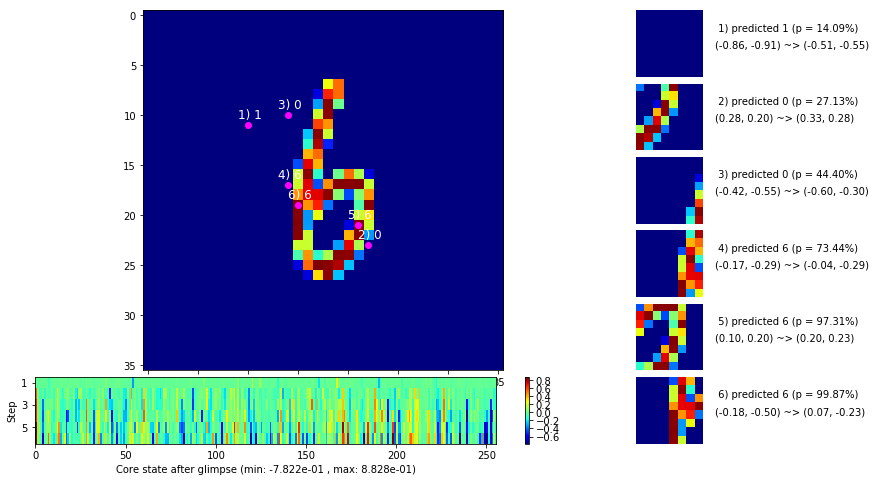

 b   1500/  3000 >> 133.6 ms/b | lr: 2.79e-04 | grad 2norm:  5.30 | grad inf norm:  1.361
       Weights || abs max:  1.03 (18137.86) | mean: -6.47e-03 ( 0.08) | var: 1.53e-02 ( 3672.34)
        Biases || abs max:  0.95 (  691.70) | mean:  1.34e-02 ( 0.68) | var: 5.87e-03 ( 2053.38)
                  class loss: 0.212 | steps: 2.162 | reward:  0.930 | acc.: 93.00%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.7 ms/b | lr: 2.73e-04 | grad 2norm:  5.10 | grad inf norm:  1.288
       Weights || abs max:  1.03 (30681.41) | mean: -6.43e-03 ( 0.11) | var: 1.54e-02 (67433.62)
        Biases || abs max:  0.95 ( 2105.46) | mean:  1.36e-02 ( 1.23) | var: 5.92e-03 (290918.69)
                  class loss: 0.198 | steps: 2.124 | reward:  0.934 | acc.: 93.42%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

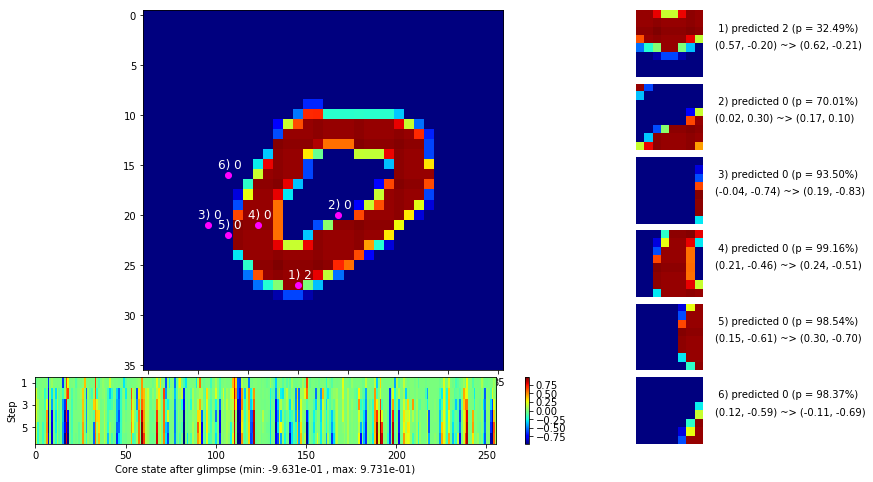

 b   2500/  3000 >> 133.3 ms/b | lr: 2.65e-04 | grad 2norm:  5.12 | grad inf norm:  1.300
       Weights || abs max:  1.04 (31609.45) | mean: -6.42e-03 ( 0.11) | var: 1.54e-02 (74054.88)
        Biases || abs max:  0.95 ( 4991.30) | mean:  1.37e-02 ( 2.30) | var: 5.92e-03 (2411989.00)
                  class loss: 0.199 | steps: 2.141 | reward:  0.934 | acc.: 93.44%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.6 ms/b | lr: 2.60e-04 | grad 2norm:  5.20 | grad inf norm:  1.318
       Weights || abs max:  1.06 (28675.01) | mean: -6.41e-03 ( 0.10) | var: 1.55e-02 (25260.24)
        Biases || abs max:  0.95 (  880.33) | mean:  1.36e-02 ( 0.73) | var: 5.96e-03 (20150.69)
                  class loss: 0.206 | steps: 2.128 | reward:  0.931 | acc.: 93.15%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

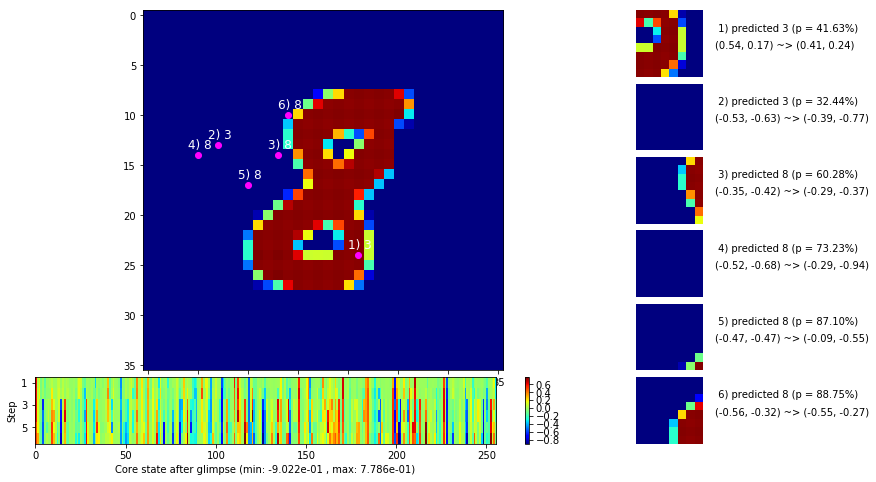

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


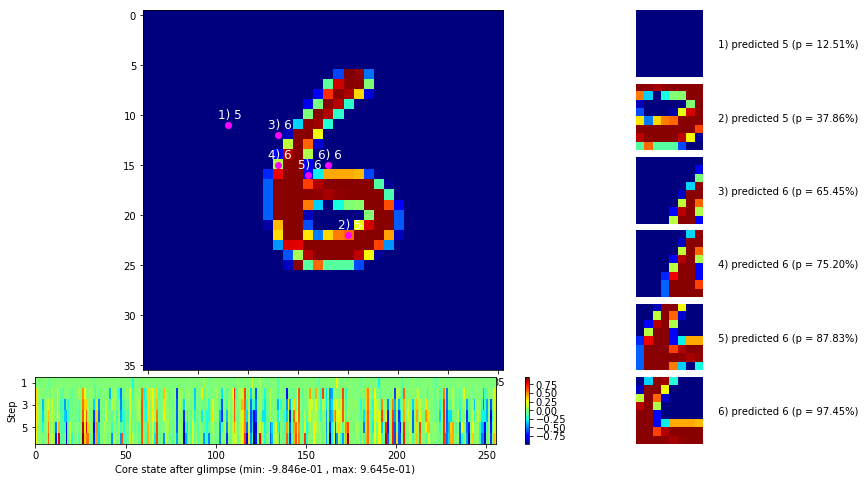


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


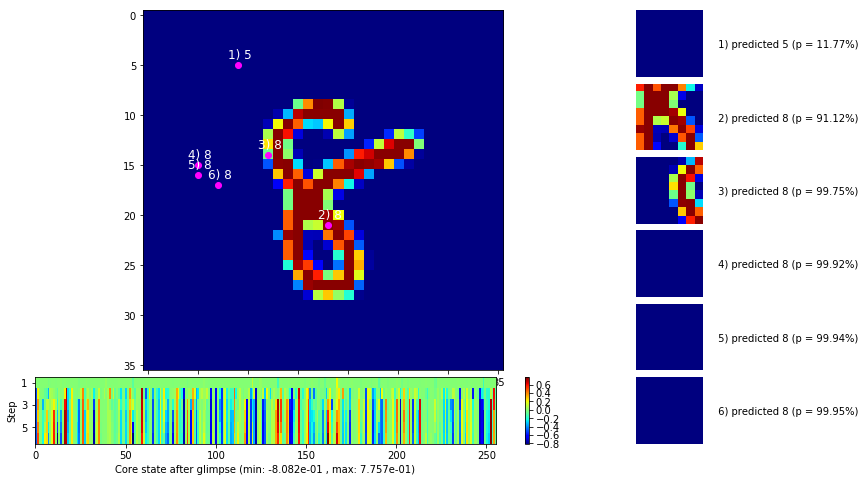

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


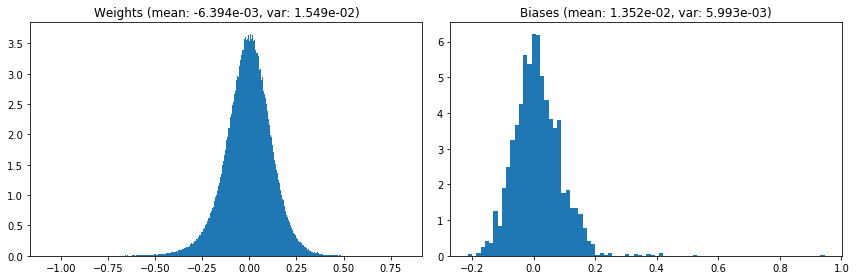

                                      Location network weights and biases


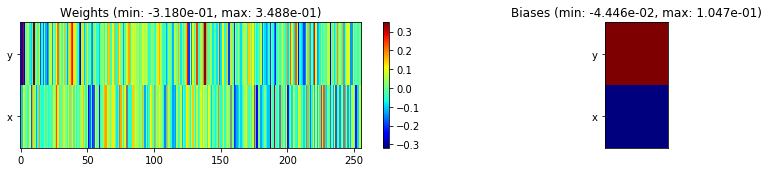

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.45 sec | TRAIN >> class loss: 0.2037 | steps:  2.140    | reward:  0.9329    | acc.: 93.288% 
                          | VAL   >> class loss: 0.2224 | steps:  2.043 :( | reward:  0.9274    | acc.: 92.740% 


Epoch  10/400) lr = 0.0002575
 b    500/  3000 >> 138.3 ms/b | lr: 2.52e-04 | grad 2norm:  5.22 | grad inf norm:  1.307
       Weights || abs max:  1.07 (56300.86) | mean: -6.43e-03 ( 0.15) | var: 1.55e-02 (290903.66)
        Biases || abs max:  0.95 ( 1892.03) | mean:  1.34e-02 ( 1.25) | var: 6.00e-03 (74598.80)
                  class loss: 0.207 | steps: 2.143 | reward:  0.932 | acc.: 93.20%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.7 ms/b | lr: 2.47e-04 | grad 2norm:  5.34 | grad inf norm:  1.338
       Weights || abs max:  1.08 (57241.02) | mean: -6.49e-03 ( 0.15) | va

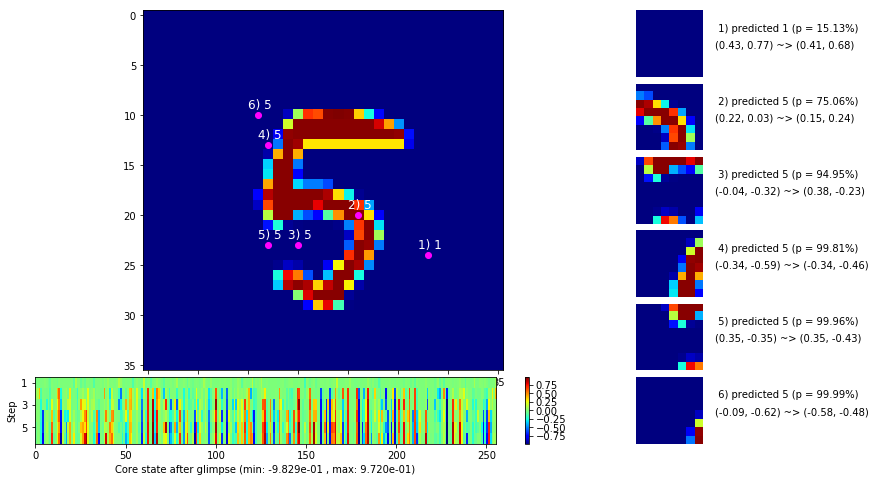

 b   1500/  3000 >> 132.8 ms/b | lr: 2.40e-04 | grad 2norm:  5.48 | grad inf norm:  1.395
       Weights || abs max:  1.08 (133728.14) | mean: -6.44e-03 ( 0.28) | var: 1.56e-02 (7402478.00)
        Biases || abs max:  0.94 ( 2802.00) | mean:  1.35e-02 ( 1.59) | var: 6.00e-03 (155986.44)
                  class loss: 0.221 | steps: 2.156 | reward:  0.925 | acc.: 92.53%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.1 ms/b | lr: 2.35e-04 | grad 2norm:  5.48 | grad inf norm:  1.392
       Weights || abs max:  1.09 (27742.77) | mean: -6.40e-03 ( 0.10) | var: 1.56e-02 (73509.05)
        Biases || abs max:  0.94 (  992.12) | mean:  1.36e-02 ( 0.85) | var: 6.01e-03 ( 7016.76)
                  class loss: 0.220 | steps: 2.163 | reward:  0.925 | acc.: 92.51%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

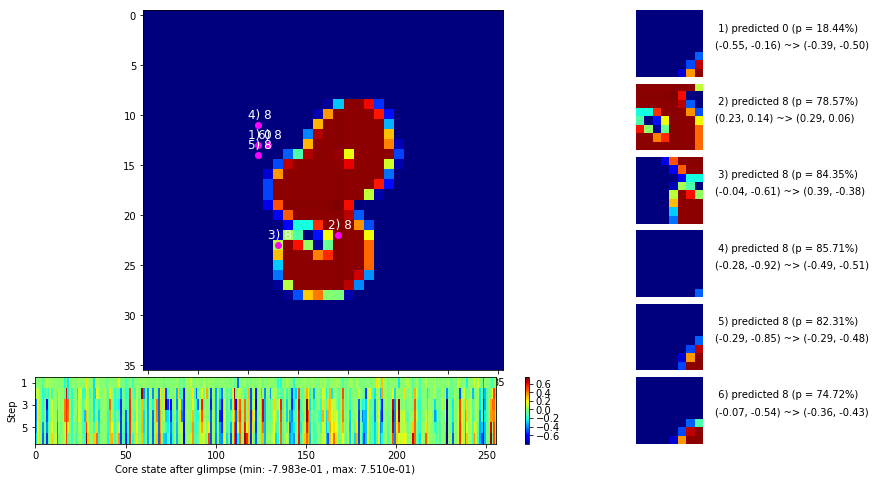

 b   2500/  3000 >> 132.2 ms/b | lr: 2.28e-04 | grad 2norm:  5.48 | grad inf norm:  1.368
       Weights || abs max:  1.09 (25944.69) | mean: -6.37e-03 ( 0.10) | var: 1.57e-02 (58036.23)
        Biases || abs max:  0.94 ( 3849.60) | mean:  1.37e-02 ( 2.09) | var: 6.02e-03 (1217140.00)
                  class loss: 0.219 | steps: 2.142 | reward:  0.926 | acc.: 92.65%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.3 ms/b | lr: 2.24e-04 | grad 2norm:  5.18 | grad inf norm:  1.271
       Weights || abs max:  1.09 (74192.89) | mean: -6.35e-03 ( 0.18) | var: 1.57e-02 (1937743.50)
        Biases || abs max:  0.95 (  992.12) | mean:  1.37e-02 ( 0.79) | var: 6.06e-03 (23682.48)
                  class loss: 0.197 | steps: 2.128 | reward:  0.934 | acc.: 93.36%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

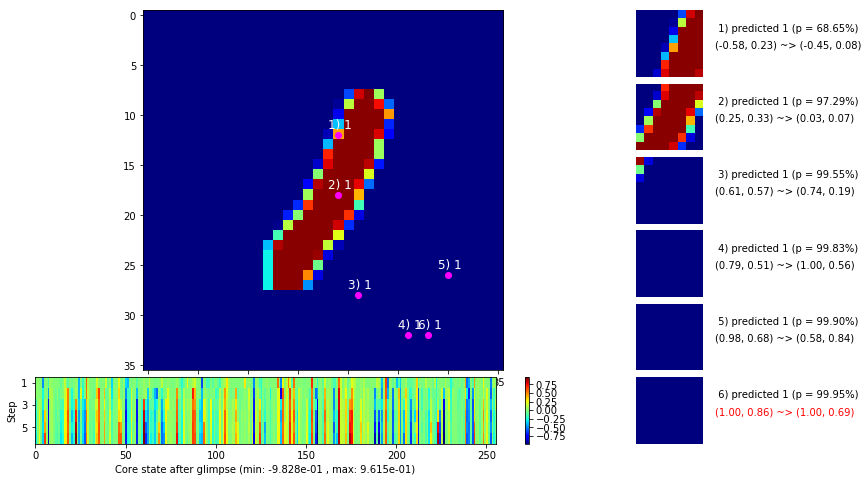

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


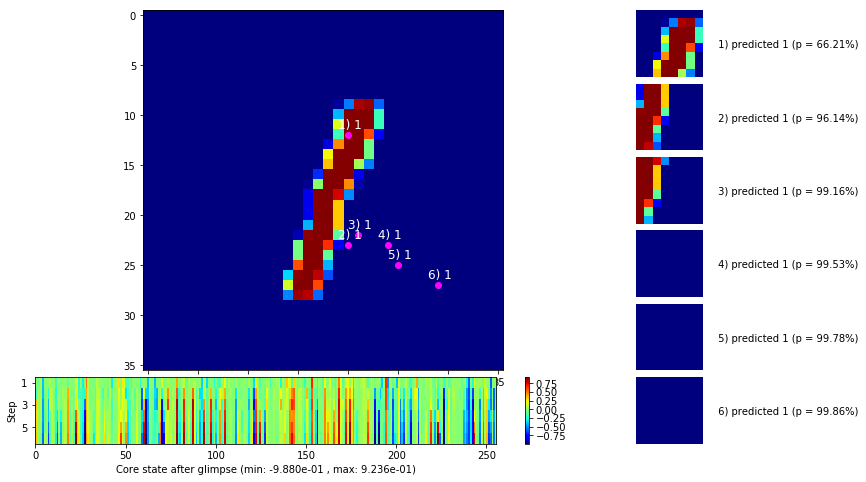


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


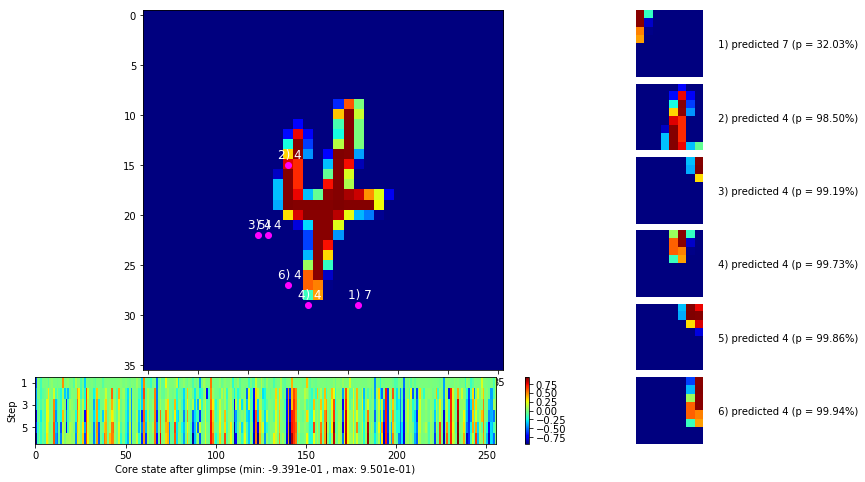

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


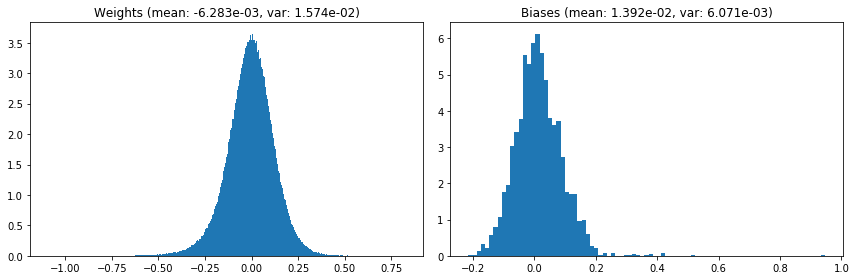

                                      Location network weights and biases


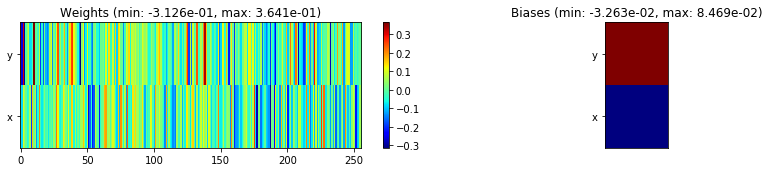

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.86 sec | TRAIN >> class loss: 0.2114 | steps:  2.146 :( | reward:  0.9284 :( | acc.: 92.837% :(
                          | VAL   >> class loss: 0.2099 | steps:  2.026    | reward:  0.9284    | acc.: 92.840% 


Epoch  11/400) lr = 0.0002215
 b    500/  3000 >> 131.3 ms/b | lr: 2.17e-04 | grad 2norm:  5.21 | grad inf norm:  1.314
       Weights || abs max:  1.10 (32577.81) | mean: -6.25e-03 ( 0.11) | var: 1.58e-02 (43075.73)
        Biases || abs max:  0.95 (  699.99) | mean:  1.40e-02 ( 0.70) | var: 6.07e-03 ( 1255.68)
                  class loss: 0.199 | steps: 2.155 | reward:  0.933 | acc.: 93.26%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 2.13e-04 | grad 2norm:  5.25 | grad inf norm:  1.355
       Weights || abs max:  1.10 (22455.97) | mean: -6.24e-03 ( 0.09) | v

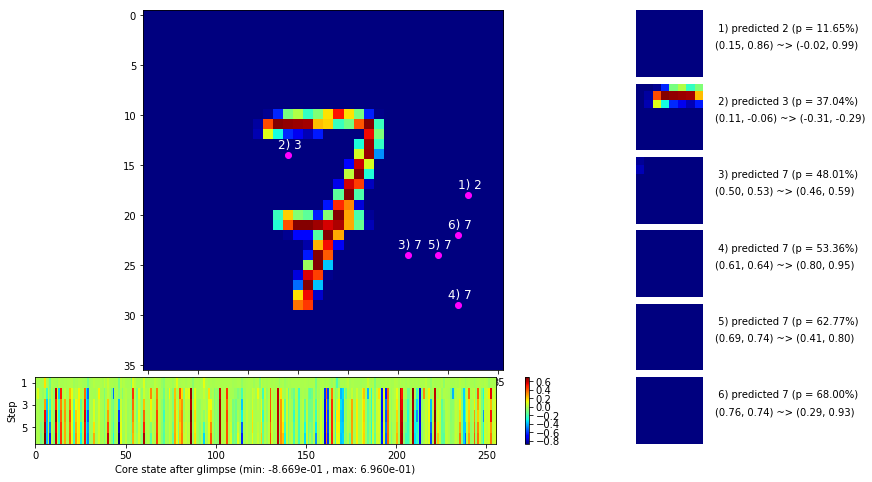

 b   1500/  3000 >> 137.9 ms/b | lr: 2.06e-04 | grad 2norm:  5.14 | grad inf norm:  1.316
       Weights || abs max:  1.10 (26255.01) | mean: -6.20e-03 ( 0.10) | var: 1.58e-02 (55909.29)
        Biases || abs max:  0.95 (  892.85) | mean:  1.40e-02 ( 0.75) | var: 6.10e-03 ( 4236.45)
                  class loss: 0.200 | steps: 2.138 | reward:  0.936 | acc.: 93.56%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.2 ms/b | lr: 2.02e-04 | grad 2norm:  5.10 | grad inf norm:  1.255
       Weights || abs max:  1.10 (58451.09) | mean: -6.13e-03 ( 0.15) | var: 1.59e-02 (633424.62)
        Biases || abs max:  0.95 ( 1447.54) | mean:  1.42e-02 ( 0.94) | var: 6.13e-03 (71768.63)
                  class loss: 0.188 | steps: 2.116 | reward:  0.936 | acc.: 93.59%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

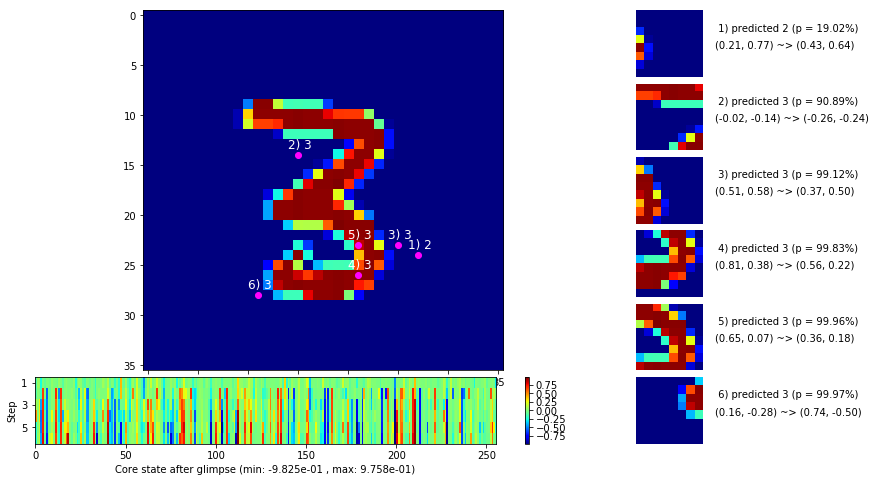

 b   2500/  3000 >> 132.7 ms/b | lr: 1.96e-04 | grad 2norm:  5.01 | grad inf norm:  1.298
       Weights || abs max:  1.11 (19591.69) | mean: -6.07e-03 ( 0.08) | var: 1.59e-02 ( 9077.54)
        Biases || abs max:  0.95 (  333.56) | mean:  1.43e-02 ( 0.45) | var: 6.15e-03 (  778.09)
                  class loss: 0.188 | steps: 2.109 | reward:  0.938 | acc.: 93.78%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.4 ms/b | lr: 1.92e-04 | grad 2norm:  4.99 | grad inf norm:  1.267
       Weights || abs max:  1.12 (21427.66) | mean: -6.07e-03 ( 0.08) | var: 1.59e-02 (52311.83)
        Biases || abs max:  0.95 ( 1883.47) | mean:  1.42e-02 ( 1.26) | var: 6.14e-03 (124487.66)
                  class loss: 0.191 | steps: 2.128 | reward:  0.938 | acc.: 93.75%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

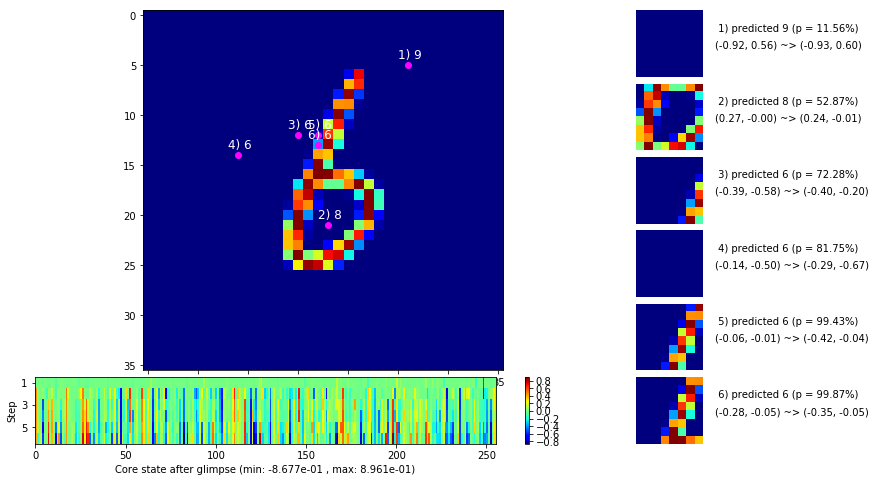

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


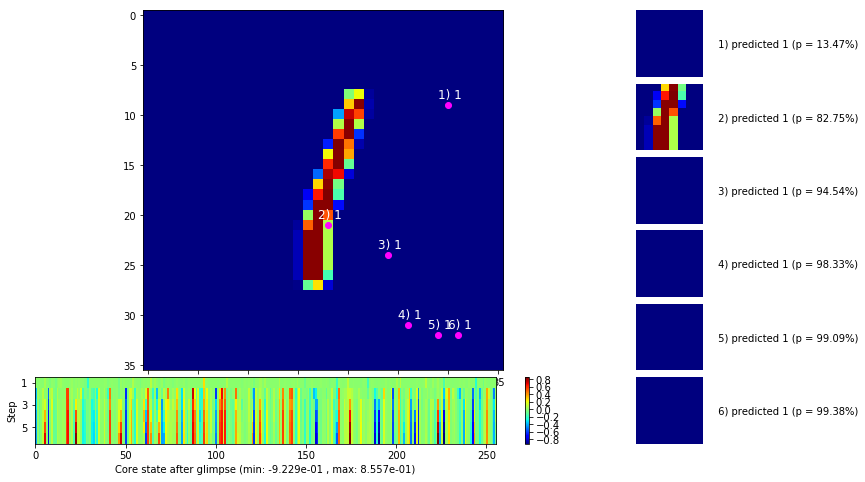


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


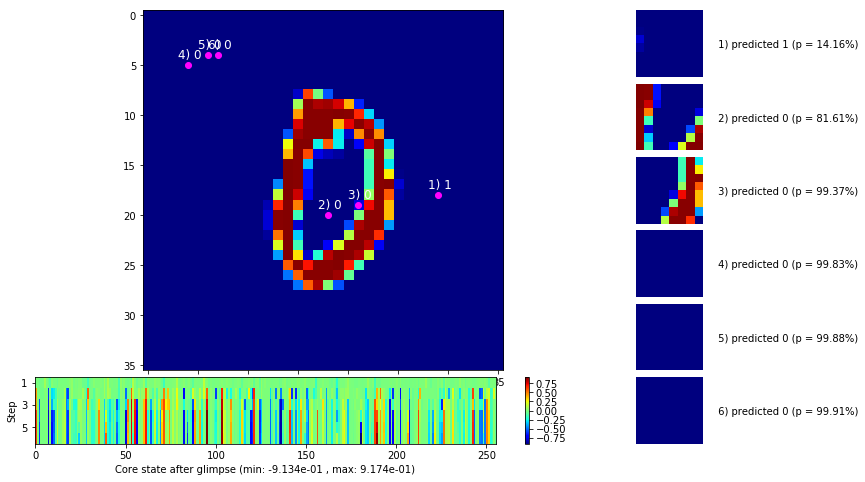

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


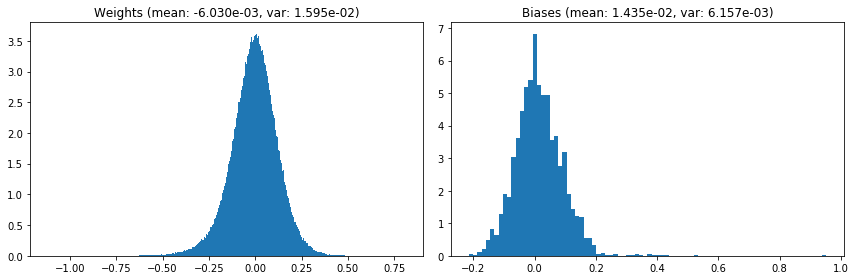

                                      Location network weights and biases


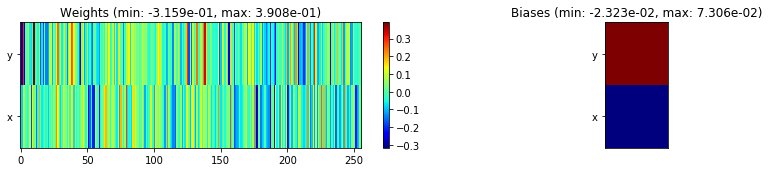

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.32 sec | TRAIN >> class loss: 0.1945 | steps:  2.128    | reward:  0.9354    | acc.: 93.542% 
                          | VAL   >> class loss: 0.1931 | steps:  2.029 :( | reward:  0.9366    | acc.: 93.660% 


Epoch  12/400) lr = 0.0001905
 b    500/  3000 >> 132.0 ms/b | lr: 1.87e-04 | grad 2norm:  5.03 | grad inf norm:  1.279
       Weights || abs max:  1.12 (13099.07) | mean: -5.98e-03 ( 0.07) | var: 1.60e-02 ( 1632.93)
        Biases || abs max:  0.95 (  596.45) | mean:  1.46e-02 ( 0.58) | var: 6.17e-03 ( 3051.13)
                  class loss: 0.197 | steps: 2.118 | reward:  0.938 | acc.: 93.77%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.8 ms/b | lr: 1.83e-04 | grad 2norm:  5.01 | grad inf norm:  1.264
       Weights || abs max:  1.12 (31310.54) | mean: -5.98e-03 ( 0.10) | var

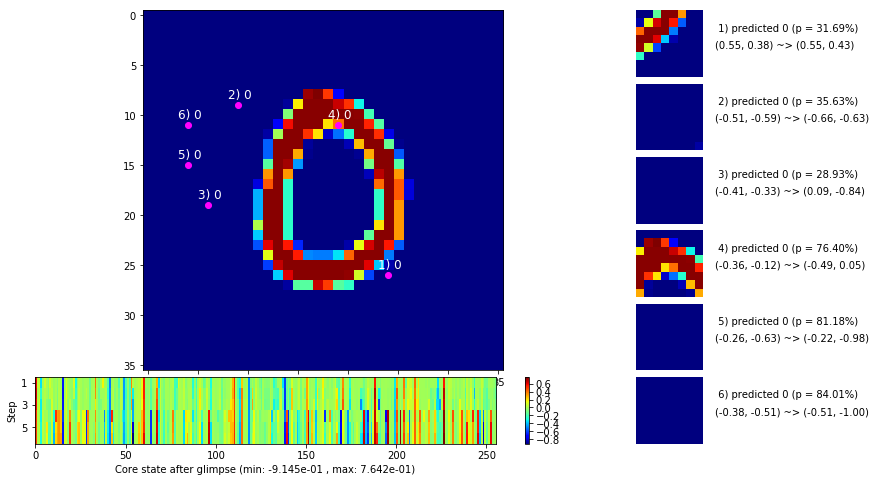

 b   1500/  3000 >> 133.8 ms/b | lr: 1.78e-04 | grad 2norm:  5.32 | grad inf norm:  1.297
       Weights || abs max:  1.13 (12985.84) | mean: -5.93e-03 ( 0.07) | var: 1.60e-02 ( 1813.56)
        Biases || abs max:  0.95 (  542.75) | mean:  1.48e-02 ( 0.51) | var: 6.20e-03 ( 2048.79)
                  class loss: 0.200 | steps: 2.123 | reward:  0.932 | acc.: 93.19%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 1.74e-04 | grad 2norm:  5.18 | grad inf norm:  1.320
       Weights || abs max:  1.13 (12839.20) | mean: -5.96e-03 ( 0.07) | var: 1.60e-02 ( 2965.31)
        Biases || abs max:  0.95 ( 1363.15) | mean:  1.46e-02 ( 0.93) | var: 6.23e-03 (43505.75)
                  class loss: 0.191 | steps: 2.142 | reward:  0.935 | acc.: 93.49%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

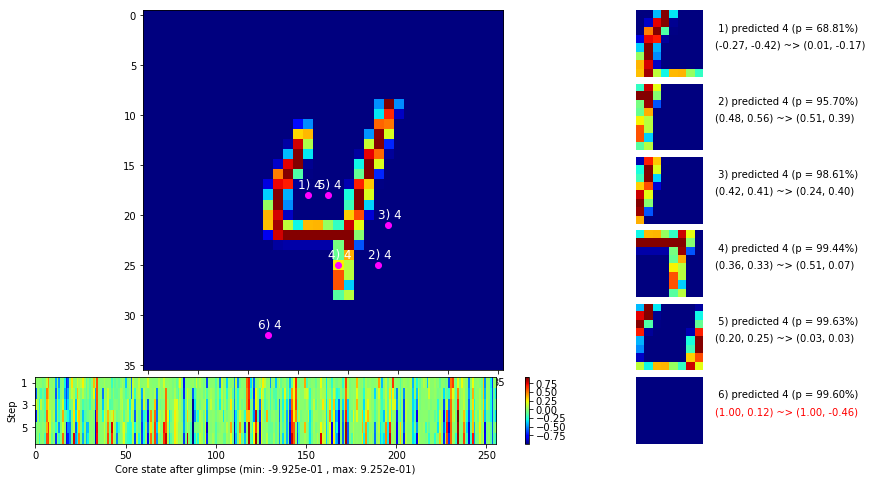

 b   2500/  3000 >> 131.7 ms/b | lr: 1.69e-04 | grad 2norm:  4.96 | grad inf norm:  1.239
       Weights || abs max:  1.14 (25449.92) | mean: -5.92e-03 ( 0.10) | var: 1.61e-02 (16150.70)
        Biases || abs max:  0.95 (  759.05) | mean:  1.48e-02 ( 0.65) | var: 6.22e-03 (14853.41)
                  class loss: 0.188 | steps: 2.123 | reward:  0.938 | acc.: 93.80%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 144.5 ms/b | lr: 1.65e-04 | grad 2norm:  5.01 | grad inf norm:  1.278
       Weights || abs max:  1.15 (49685.59) | mean: -5.91e-03 ( 0.14) | var: 1.61e-02 (310305.50)
        Biases || abs max:  0.95 ( 1985.72) | mean:  1.49e-02 ( 1.24) | var: 6.24e-03 (153402.95)
                  class loss: 0.187 | steps: 2.124 | reward:  0.939 | acc.: 93.88%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

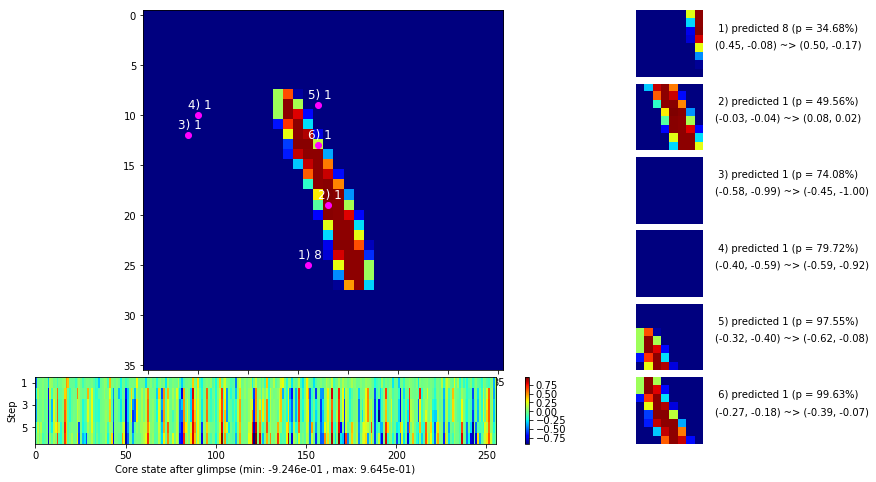

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


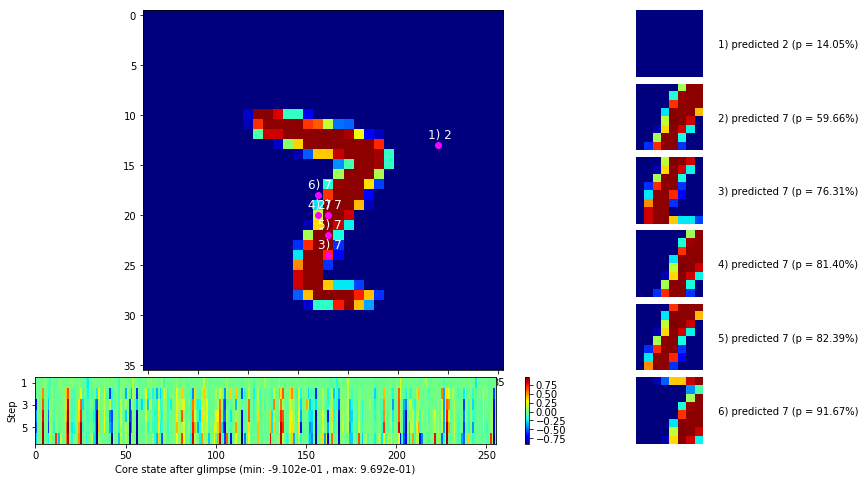


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


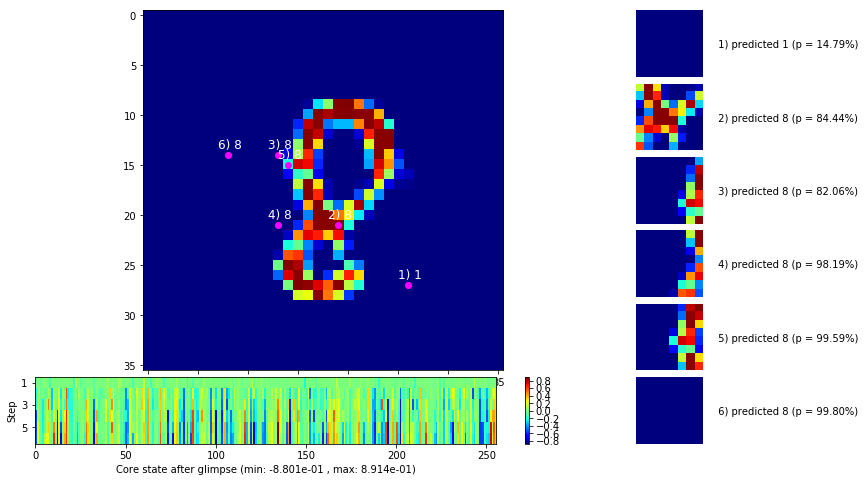

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


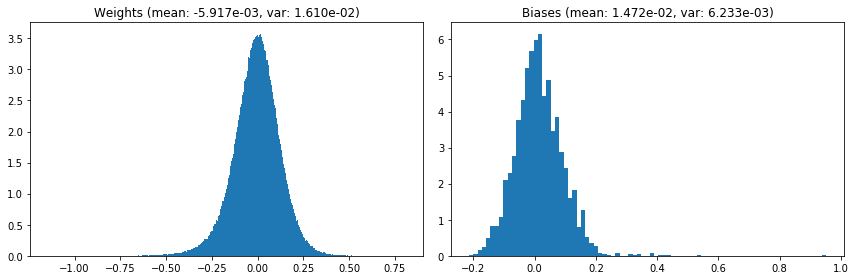

                                      Location network weights and biases


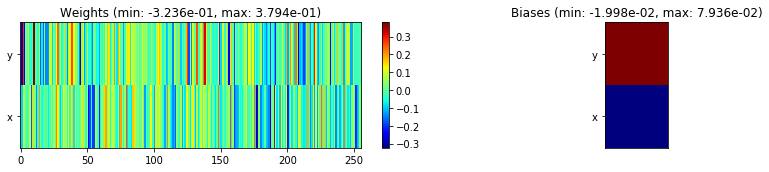

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.78 sec | TRAIN >> class loss: 0.1923 | steps:  2.130 :( | reward:  0.9365    | acc.: 93.650% 
                          | VAL   >> class loss: 0.1904 | steps:  2.002    | reward:  0.9344 :( | acc.: 93.440% :(


Epoch  13/400) lr = 0.0001638
 b    500/  3000 >> 132.7 ms/b | lr: 1.61e-04 | grad 2norm:  5.02 | grad inf norm:  1.257
       Weights || abs max:  1.15 (31356.94) | mean: -5.89e-03 ( 0.11) | var: 1.61e-02 (62491.62)
        Biases || abs max:  0.95 ( 2438.14) | mean:  1.49e-02 ( 1.35) | var: 6.23e-03 (391798.62)
                  class loss: 0.185 | steps: 2.116 | reward:  0.938 | acc.: 93.75%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.57e-04 | grad 2norm:  5.13 | grad inf norm:  1.284
       Weights || abs max:  1.15 (47679.05) | mean: -5.87e-03 ( 0.13) | 

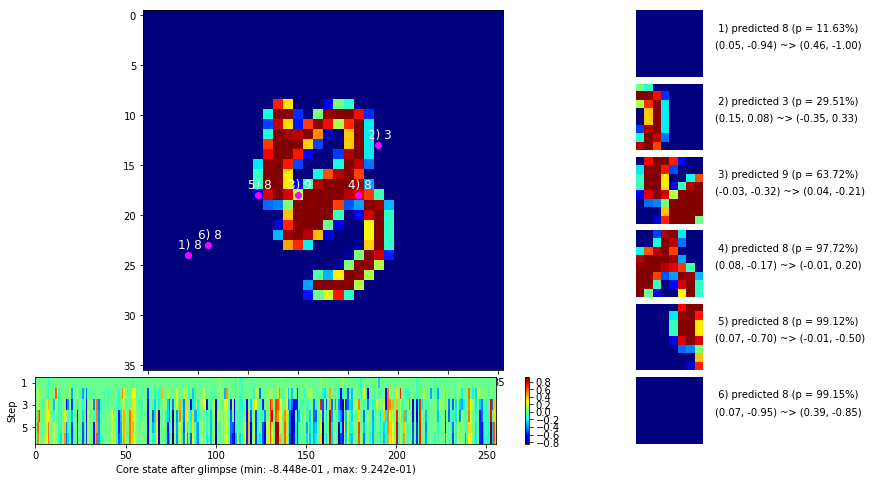

 b   1500/  3000 >> 133.4 ms/b | lr: 1.53e-04 | grad 2norm:  5.27 | grad inf norm:  1.329
       Weights || abs max:  1.15 (22613.44) | mean: -5.80e-03 ( 0.09) | var: 1.62e-02 (15646.21)
        Biases || abs max:  0.95 (  607.19) | mean:  1.52e-02 ( 0.56) | var: 6.28e-03 ( 2856.95)
                  class loss: 0.200 | steps: 2.133 | reward:  0.932 | acc.: 93.20%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.3 ms/b | lr: 1.50e-04 | grad 2norm:  5.11 | grad inf norm:  1.285
       Weights || abs max:  1.16 (35576.64) | mean: -5.78e-03 ( 0.11) | var: 1.62e-02 (115023.84)
        Biases || abs max:  0.95 (  581.54) | mean:  1.53e-02 ( 0.53) | var: 6.27e-03 ( 5246.68)
                  class loss: 0.189 | steps: 2.112 | reward:  0.937 | acc.: 93.68%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

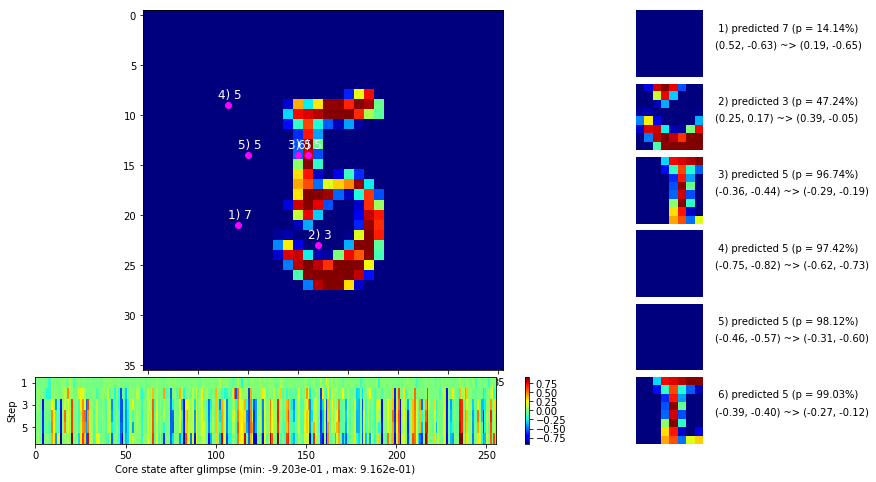

 b   2500/  3000 >> 132.4 ms/b | lr: 1.45e-04 | grad 2norm:  5.33 | grad inf norm:  1.301
       Weights || abs max:  1.16 (301105.62) | mean: -5.78e-03 ( 0.55) | var: 1.62e-02 (66668624.00)
        Biases || abs max:  0.95 (  471.26) | mean:  1.52e-02 ( 0.47) | var: 6.28e-03 ( 2634.36)
                  class loss: 0.191 | steps: 2.106 | reward:  0.934 | acc.: 93.36%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.9 ms/b | lr: 1.42e-04 | grad 2norm:  5.22 | grad inf norm:  1.306
       Weights || abs max:  1.16 (36239.09) | mean: -5.77e-03 ( 0.12) | var: 1.62e-02 (114500.12)
        Biases || abs max:  0.95 (  457.27) | mean:  1.53e-02 ( 0.48) | var: 6.29e-03 (  915.58)
                  class loss: 0.189 | steps: 2.111 | reward:  0.936 | acc.: 93.58%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

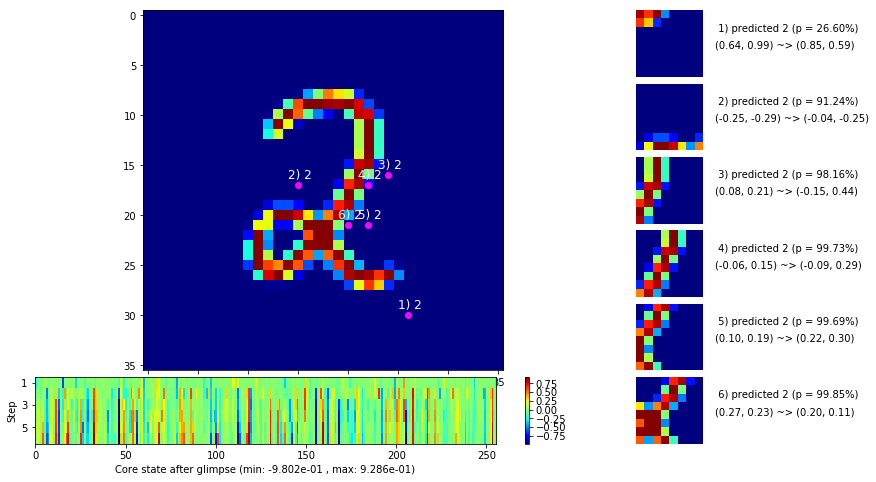

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


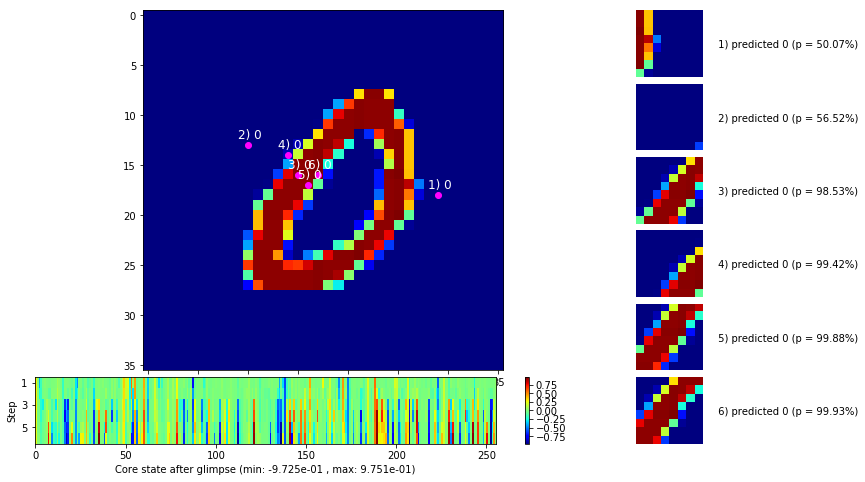


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


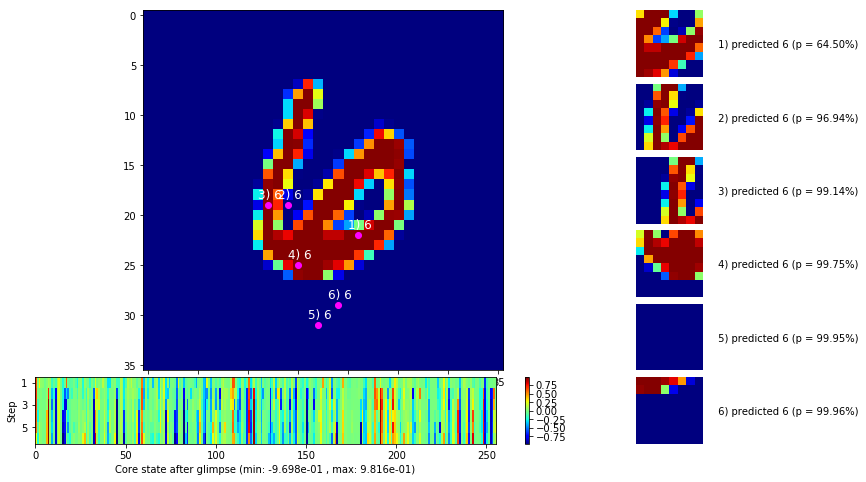

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


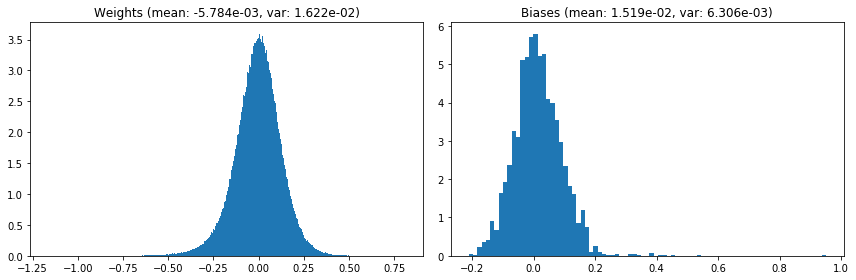

                                      Location network weights and biases


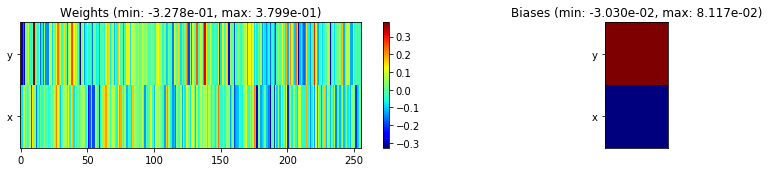

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.32 sec | TRAIN >> class loss: 0.1899 | steps:  2.115    | reward:  0.9355 :( | acc.: 93.545% :(
                          | VAL   >> class loss: 0.1810 | steps:  2.002 :( | reward:  0.9408    | acc.: 94.080% 


Epoch  14/400) lr = 0.0001409
 b    500/  3000 >> 131.9 ms/b | lr: 1.38e-04 | grad 2norm:  4.79 | grad inf norm:  1.184
       Weights || abs max:  1.17 (43253.58) | mean: -5.76e-03 ( 0.12) | var: 1.62e-02 (189840.28)
        Biases || abs max:  0.95 ( 1898.75) | mean:  1.53e-02 ( 1.07) | var: 6.31e-03 (81230.10)
                  class loss: 0.168 | steps: 2.087 | reward:  0.945 | acc.: 94.45%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.6 ms/b | lr: 1.35e-04 | grad 2norm:  5.11 | grad inf norm:  1.290
       Weights || abs max:  1.17 (28697.11) | mean: -5.75e-03 ( 0.10) | 

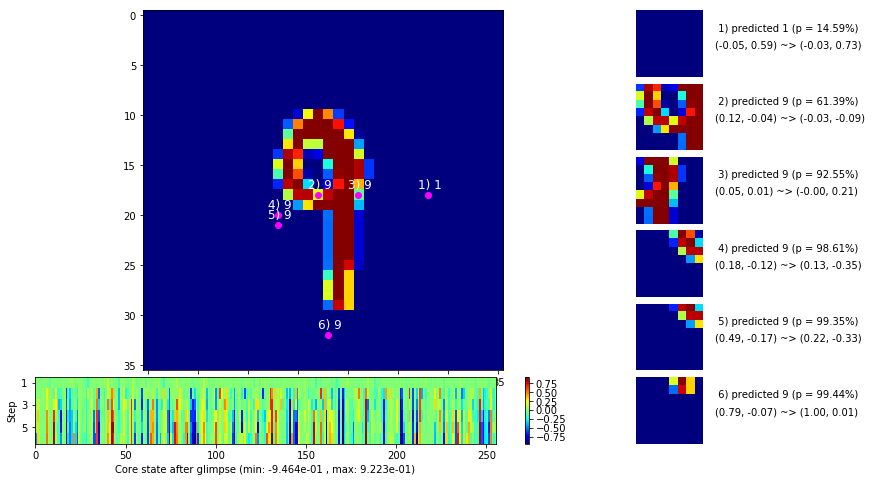

 b   1500/  3000 >> 144.1 ms/b | lr: 1.31e-04 | grad 2norm:  5.07 | grad inf norm:  1.247
       Weights || abs max:  1.17 (28179.01) | mean: -5.76e-03 ( 0.10) | var: 1.63e-02 (62576.48)
        Biases || abs max:  0.95 (  824.00) | mean:  1.53e-02 ( 0.71) | var: 6.32e-03 ( 7013.54)
                  class loss: 0.184 | steps: 2.113 | reward:  0.939 | acc.: 93.94%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.6 ms/b | lr: 1.29e-04 | grad 2norm:  4.95 | grad inf norm:  1.242
       Weights || abs max:  1.17 (53630.06) | mean: -5.73e-03 ( 0.15) | var: 1.63e-02 (382862.06)
        Biases || abs max:  0.95 ( 1215.83) | mean:  1.54e-02 ( 0.83) | var: 6.34e-03 (16096.83)
                  class loss: 0.181 | steps: 2.099 | reward:  0.940 | acc.: 93.99%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

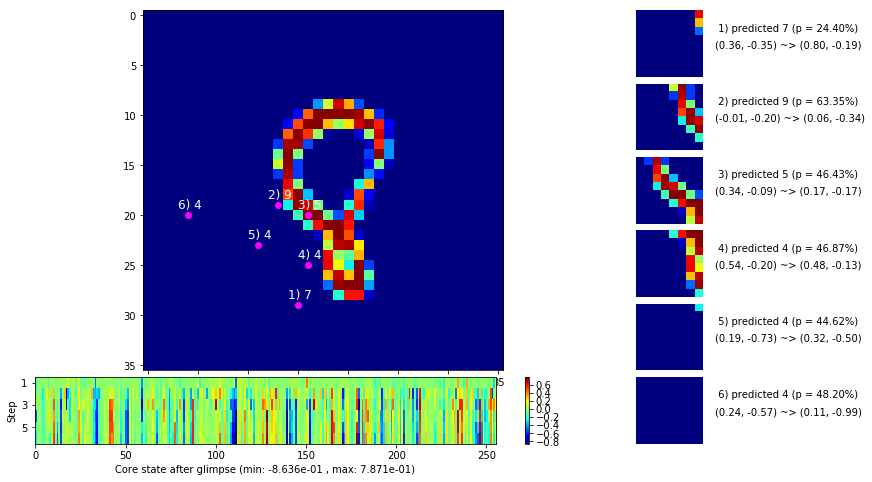

 b   2500/  3000 >> 137.2 ms/b | lr: 1.25e-04 | grad 2norm:  4.93 | grad inf norm:  1.229
       Weights || abs max:  1.18 (29621.53) | mean: -5.71e-03 ( 0.11) | var: 1.63e-02 (73760.95)
        Biases || abs max:  0.95 (  699.22) | mean:  1.54e-02 ( 0.62) | var: 6.33e-03 ( 2565.72)
                  class loss: 0.176 | steps: 2.100 | reward:  0.941 | acc.: 94.14%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.6 ms/b | lr: 1.22e-04 | grad 2norm:  5.14 | grad inf norm:  1.281
       Weights || abs max:  1.18 (80723.27) | mean: -5.69e-03 ( 0.20) | var: 1.63e-02 (895163.50)
        Biases || abs max:  0.95 (  404.75) | mean:  1.55e-02 ( 0.53) | var: 6.34e-03 ( 2370.03)
                  class loss: 0.187 | steps: 2.105 | reward:  0.936 | acc.: 93.64%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

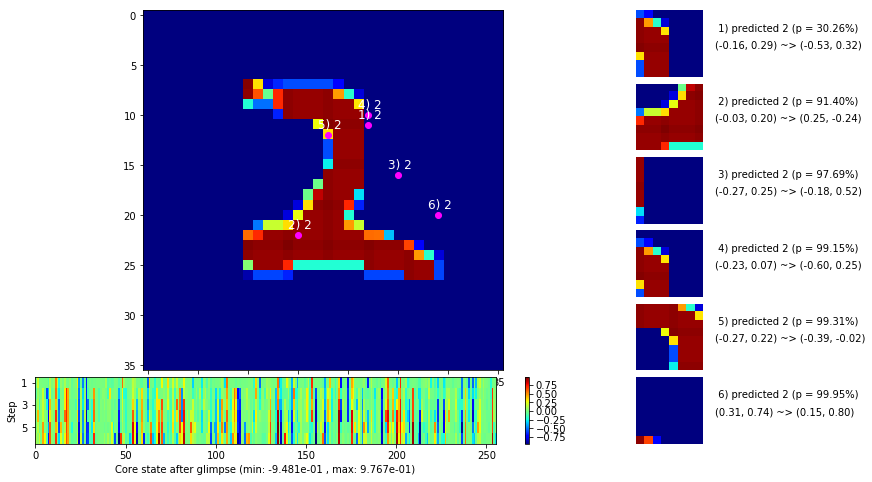

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


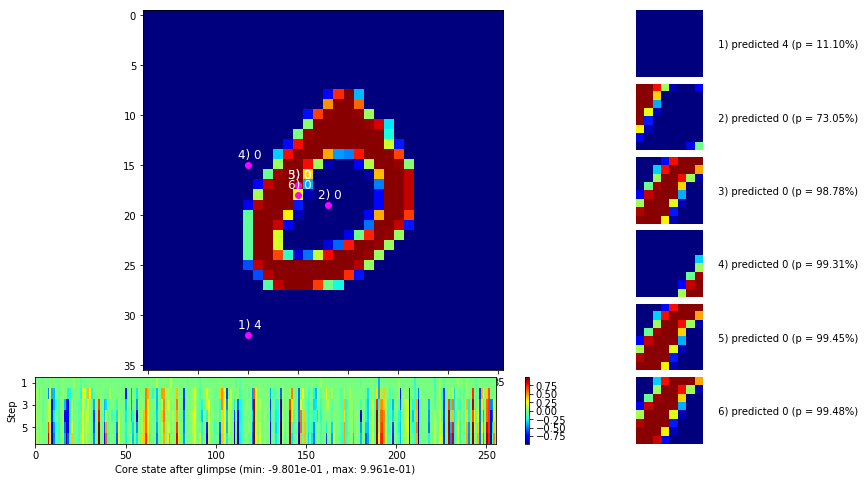


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


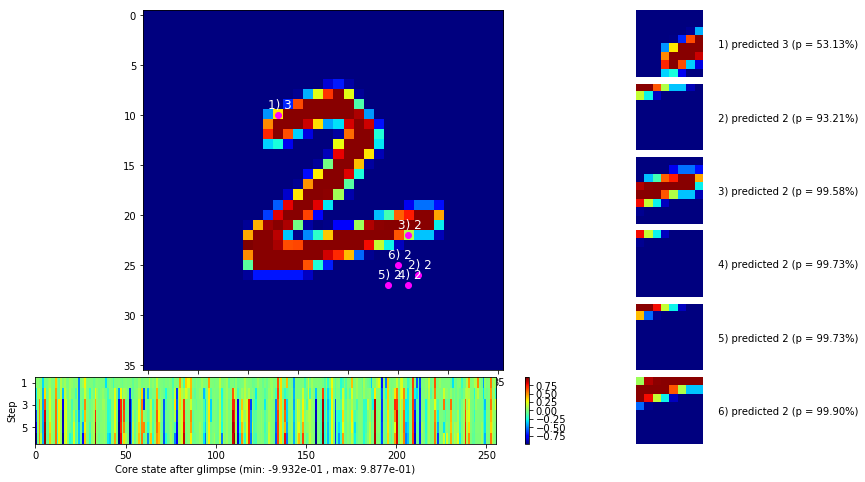

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


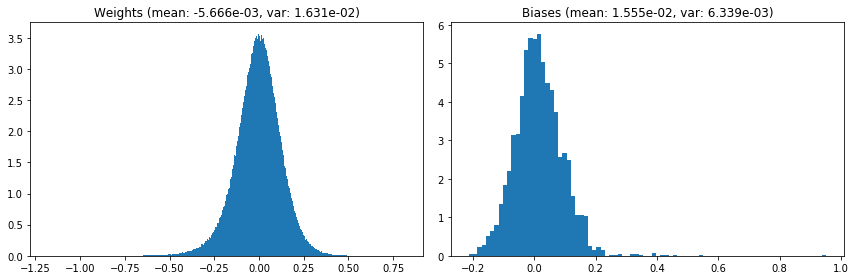

                                      Location network weights and biases


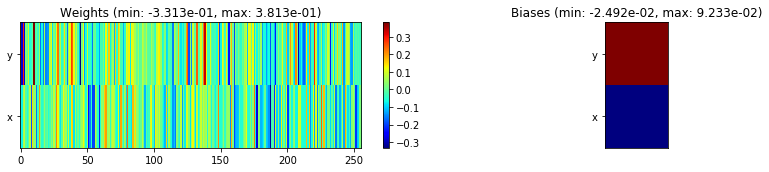

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.14 sec | TRAIN >> class loss: 0.1793 | steps:  2.101    | reward:  0.9398    | acc.: 93.985% 
                          | VAL   >> class loss: 0.1923 | steps:  1.978    | reward:  0.9352 :( | acc.: 93.520% :(


Epoch  15/400) lr = 0.0001212
 b    500/  3000 >> 131.8 ms/b | lr: 1.19e-04 | grad 2norm:  4.77 | grad inf norm:  1.194
       Weights || abs max:  1.18 (32775.78) | mean: -5.68e-03 ( 0.11) | var: 1.63e-02 (80665.14)
        Biases || abs max:  0.95 ( 1155.08) | mean:  1.55e-02 ( 0.78) | var: 6.35e-03 ( 8652.01)
                  class loss: 0.174 | steps: 2.093 | reward:  0.943 | acc.: 94.31%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.1 ms/b | lr: 1.16e-04 | grad 2norm:  4.98 | grad inf norm:  1.262
       Weights || abs max:  1.18 (33598.91) | mean: -5.63e-03 ( 0.11) | v

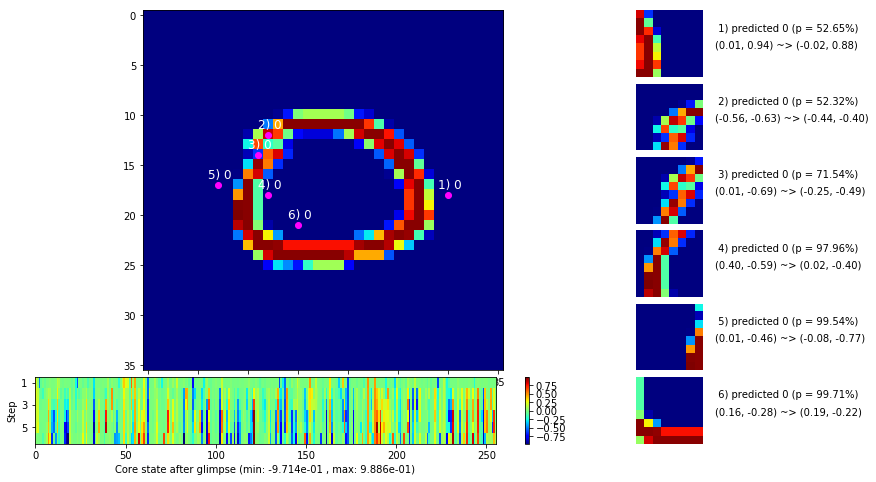

 b   1500/  3000 >> 132.7 ms/b | lr: 1.13e-04 | grad 2norm:  5.14 | grad inf norm:  1.269
       Weights || abs max:  1.18 (17787.34) | mean: -5.59e-03 ( 0.09) | var: 1.63e-02 ( 6093.55)
        Biases || abs max:  0.95 ( 2577.13) | mean:  1.58e-02 ( 1.39) | var: 6.36e-03 (255591.72)
                  class loss: 0.181 | steps: 2.113 | reward:  0.937 | acc.: 93.73%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.6 ms/b | lr: 1.11e-04 | grad 2norm:  5.10 | grad inf norm:  1.256
       Weights || abs max:  1.19 (18706.00) | mean: -5.58e-03 ( 0.09) | var: 1.64e-02 ( 4953.50)
        Biases || abs max:  0.95 ( 2709.44) | mean:  1.58e-02 ( 1.47) | var: 6.37e-03 (481074.44)
                  class loss: 0.184 | steps: 2.092 | reward:  0.939 | acc.: 93.88%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

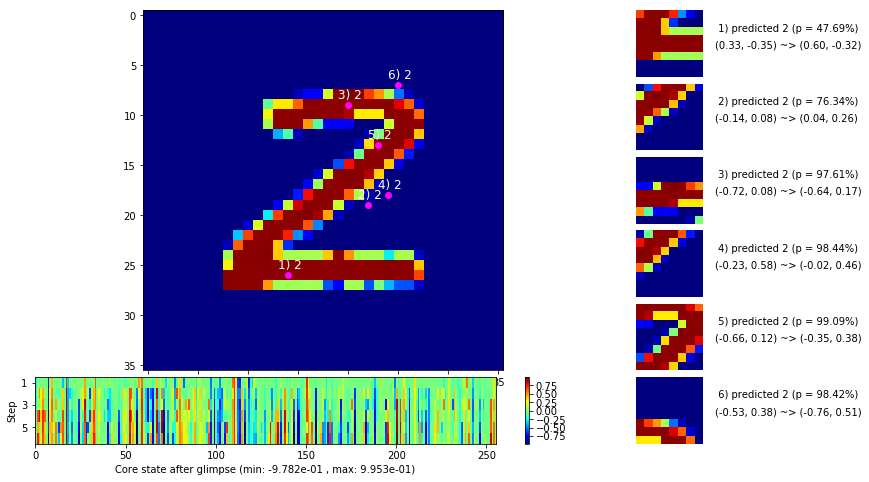

 b   2500/  3000 >> 134.8 ms/b | lr: 1.07e-04 | grad 2norm:  5.18 | grad inf norm:  1.278
       Weights || abs max:  1.19 (21339.78) | mean: -5.55e-03 ( 0.10) | var: 1.64e-02 (14726.65)
        Biases || abs max:  0.95 (  678.96) | mean:  1.59e-02 ( 0.59) | var: 6.38e-03 ( 4129.51)
                  class loss: 0.183 | steps: 2.106 | reward:  0.938 | acc.: 93.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.3 ms/b | lr: 1.05e-04 | grad 2norm:  4.88 | grad inf norm:  1.237
       Weights || abs max:  1.19 (35075.72) | mean: -5.56e-03 ( 0.12) | var: 1.64e-02 (84169.60)
        Biases || abs max:  0.95 ( 1494.95) | mean:  1.59e-02 ( 0.93) | var: 6.38e-03 (51516.32)
                  class loss: 0.178 | steps: 2.098 | reward:  0.942 | acc.: 94.18%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

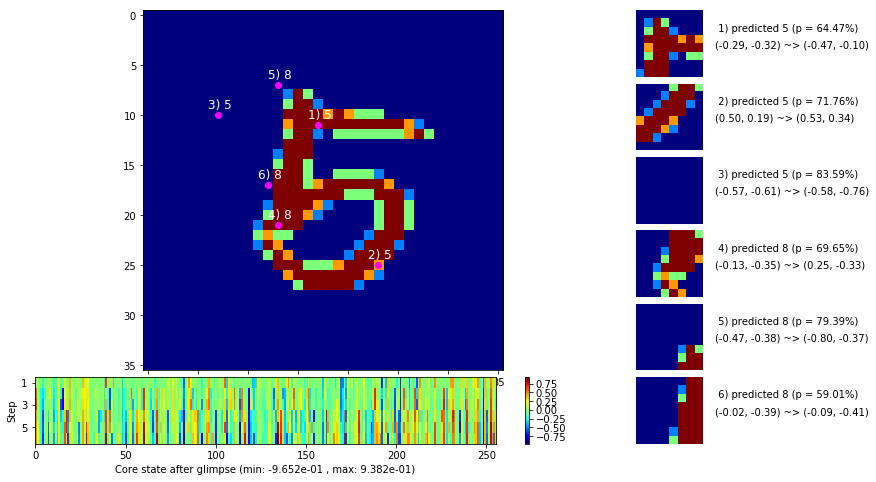

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


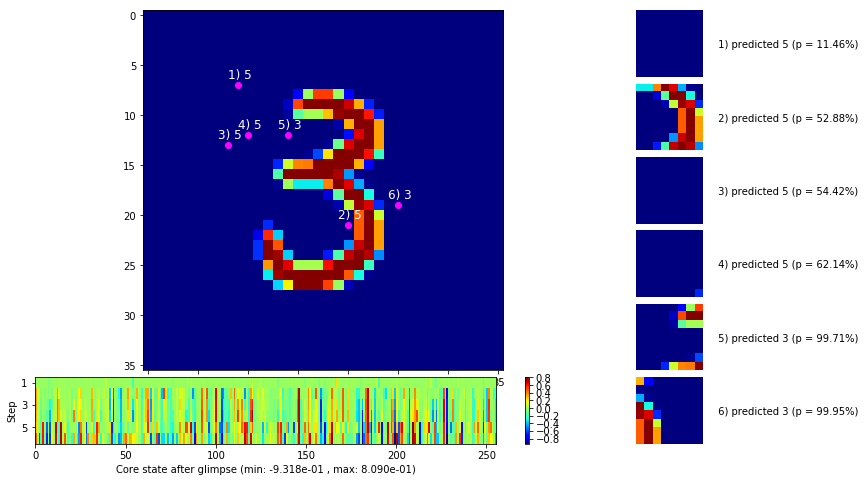


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


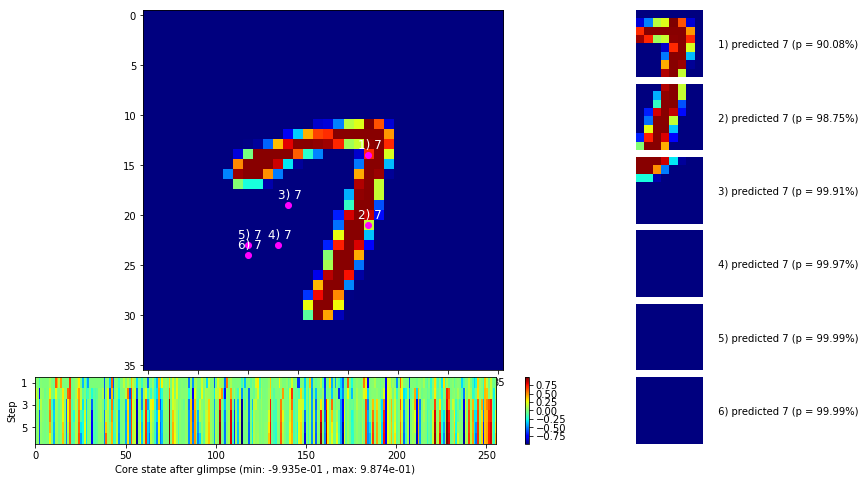

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


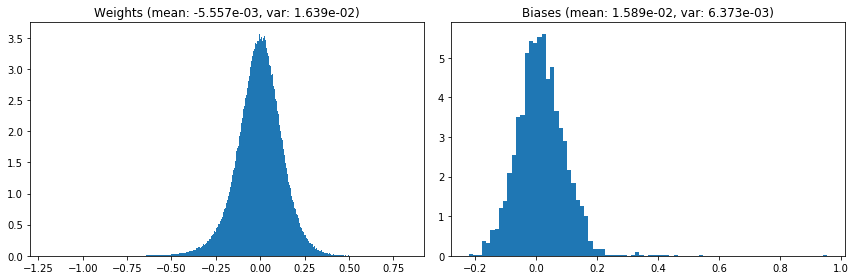

                                      Location network weights and biases


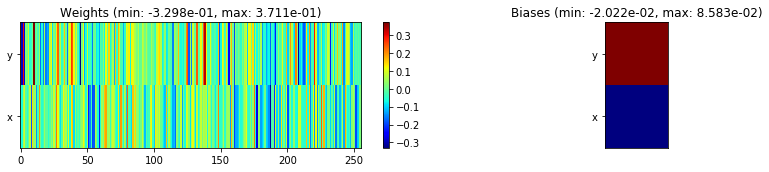

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.17 sec | TRAIN >> class loss: 0.1794 | steps:  2.098    | reward:  0.9399    | acc.: 93.987% 
                          | VAL   >> class loss: 0.1811 | steps:  1.988 :( | reward:  0.9378 :( | acc.: 93.780% :(


Epoch  16/400) lr = 0.0001042
 b    500/  3000 >> 131.8 ms/b | lr: 1.02e-04 | grad 2norm:  5.11 | grad inf norm:  1.279
       Weights || abs max:  1.19 (22069.71) | mean: -5.54e-03 ( 0.10) | var: 1.64e-02 ( 6996.10)
        Biases || abs max:  0.95 ( 1126.96) | mean:  1.59e-02 ( 0.77) | var: 6.36e-03 (24028.89)
                  class loss: 0.181 | steps: 2.069 | reward:  0.939 | acc.: 93.87%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.0 ms/b | lr: 1.00e-04 | grad 2norm:  5.05 | grad inf norm:  1.248
       Weights || abs max:  1.20 (83646.29) | mean: -5.51e-03 ( 0.19) | v

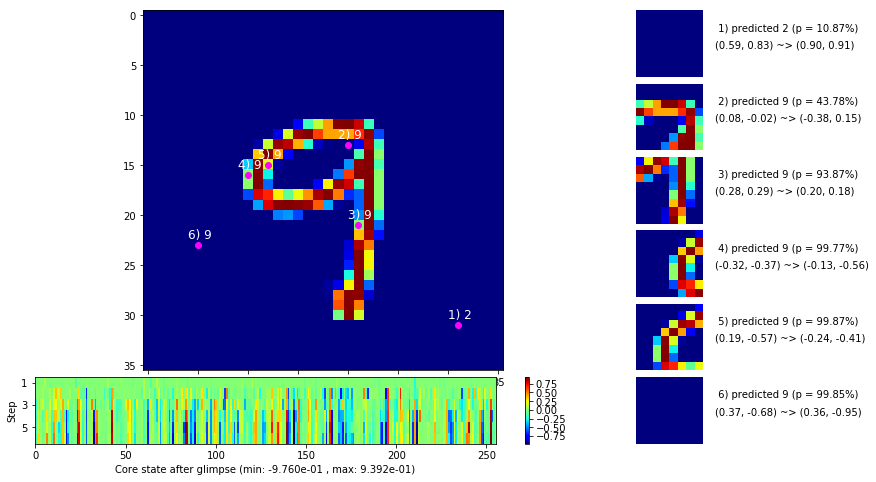

 b   1500/  3000 >> 132.5 ms/b | lr: 9.71e-05 | grad 2norm:  4.62 | grad inf norm:  1.127
       Weights || abs max:  1.20 (67661.30) | mean: -5.53e-03 ( 0.17) | var: 1.64e-02 (428440.44)
        Biases || abs max:  0.95 (  150.78) | mean:  1.58e-02 ( 0.30) | var: 6.37e-03 (   64.50)
                  class loss: 0.162 | steps: 2.083 | reward:  0.949 | acc.: 94.90%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 9.52e-05 | grad 2norm:  4.98 | grad inf norm:  1.274
       Weights || abs max:  1.20 (52516.78) | mean: -5.52e-03 ( 0.14) | var: 1.64e-02 (219163.64)
        Biases || abs max:  0.95 (  834.30) | mean:  1.59e-02 ( 0.65) | var: 6.37e-03 (15223.41)
                  class loss: 0.167 | steps: 2.075 | reward:  0.942 | acc.: 94.16%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

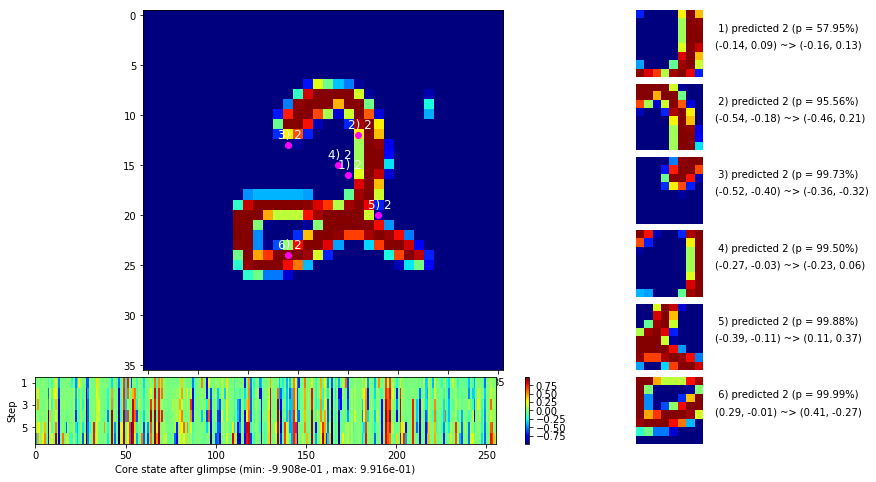

 b   2500/  3000 >> 134.1 ms/b | lr: 9.24e-05 | grad 2norm:  4.93 | grad inf norm:  1.212
       Weights || abs max:  1.20 (22780.10) | mean: -5.51e-03 ( 0.10) | var: 1.64e-02 ( 9366.77)
        Biases || abs max:  0.95 (  828.55) | mean:  1.58e-02 ( 0.69) | var: 6.38e-03 ( 4158.38)
                  class loss: 0.172 | steps: 2.094 | reward:  0.944 | acc.: 94.36%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 9.05e-05 | grad 2norm:  4.85 | grad inf norm:  1.225
       Weights || abs max:  1.20 (189344.64) | mean: -5.49e-03 ( 0.37) | var: 1.64e-02 (21310312.00)
        Biases || abs max:  0.96 ( 1385.10) | mean:  1.58e-02 ( 0.89) | var: 6.38e-03 (67995.14)
                  class loss: 0.164 | steps: 2.080 | reward:  0.944 | acc.: 94.42%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

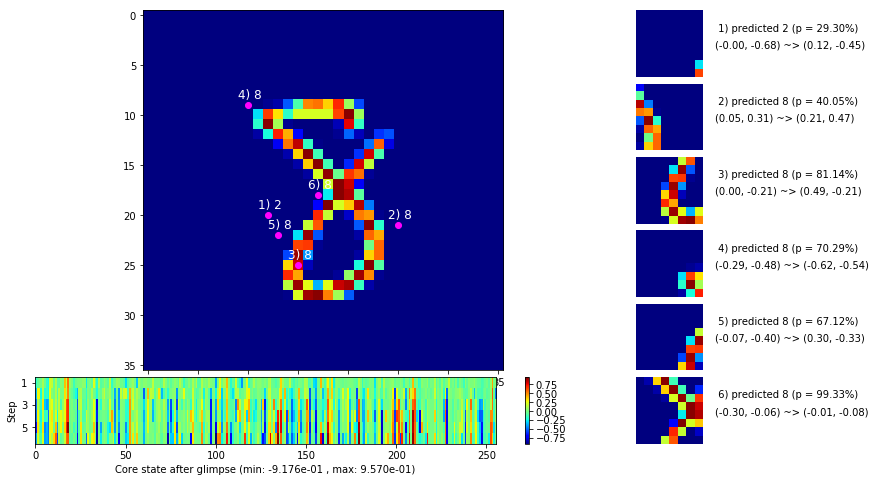

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


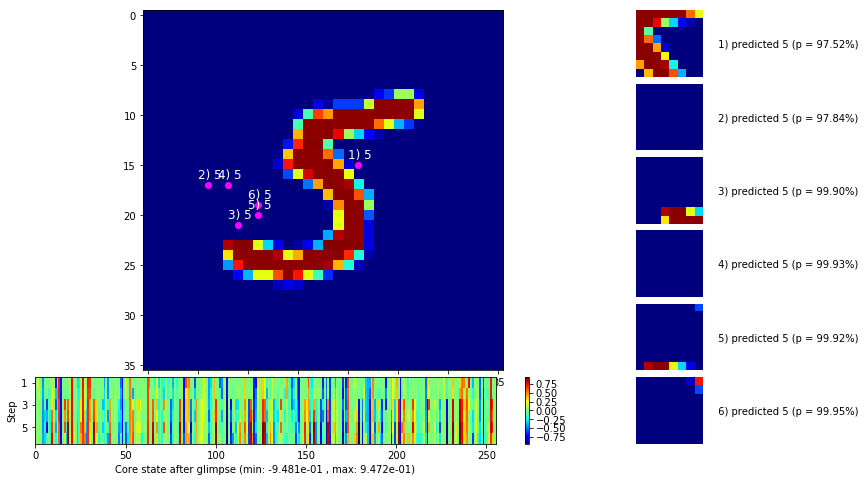


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


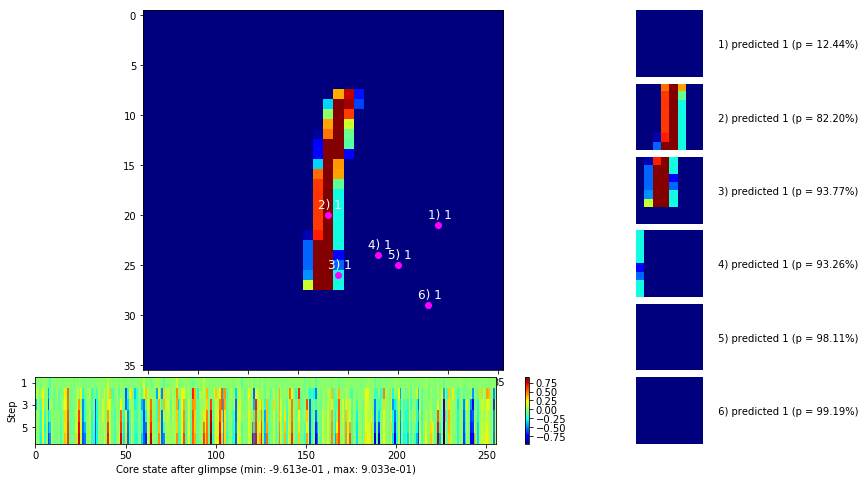

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


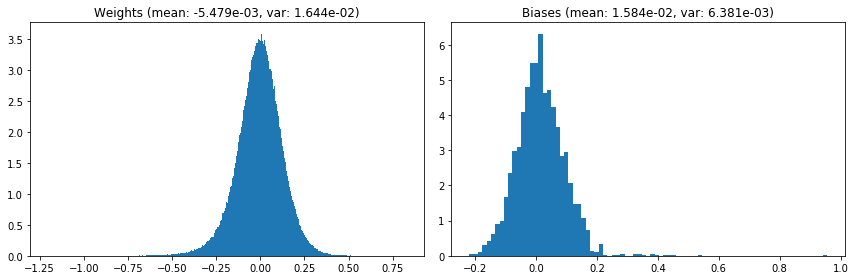

                                      Location network weights and biases


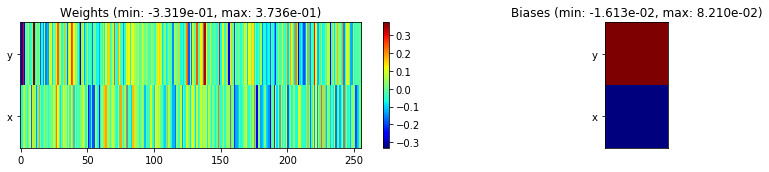

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.61 sec | TRAIN >> class loss: 0.1710 | steps:  2.081    | reward:  0.9429    | acc.: 94.292% 
                          | VAL   >> class loss: 0.1693 | steps:  1.962    | reward:  0.9454    | acc.: 94.540% 


Epoch  17/400) lr = 8.963e-05
 b    500/  3000 >> 132.3 ms/b | lr: 8.78e-05 | grad 2norm:  4.80 | grad inf norm:  1.191
       Weights || abs max:  1.20 (21605.51) | mean: -5.47e-03 ( 0.09) | var: 1.64e-02 (36635.26)
        Biases || abs max:  0.96 ( 1797.49) | mean:  1.59e-02 ( 1.03) | var: 6.39e-03 (303837.53)
                  class loss: 0.166 | steps: 2.070 | reward:  0.946 | acc.: 94.59%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 8.61e-05 | grad 2norm:  4.80 | grad inf norm:  1.206
       Weights || abs max:  1.20 (34023.10) | mean: -5.46e-03 ( 0.11) | va

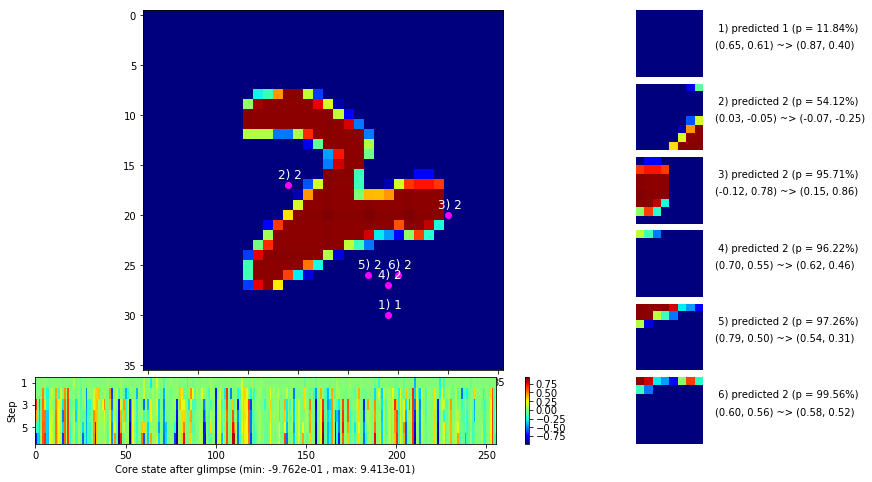

 b   1500/  3000 >> 140.7 ms/b | lr: 8.35e-05 | grad 2norm:  4.75 | grad inf norm:  1.169
       Weights || abs max:  1.20 (18058.64) | mean: -5.46e-03 ( 0.08) | var: 1.65e-02 ( 6502.13)
        Biases || abs max:  0.96 (  513.73) | mean:  1.58e-02 ( 0.52) | var: 6.39e-03 ( 4864.31)
                  class loss: 0.160 | steps: 2.069 | reward:  0.947 | acc.: 94.74%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 8.19e-05 | grad 2norm:  4.64 | grad inf norm:  1.162
       Weights || abs max:  1.21 (39824.96) | mean: -5.41e-03 ( 0.12) | var: 1.65e-02 (176091.34)
        Biases || abs max:  0.96 (  927.64) | mean:  1.60e-02 ( 0.77) | var: 6.41e-03 (12075.16)
                  class loss: 0.156 | steps: 2.047 | reward:  0.949 | acc.: 94.87%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

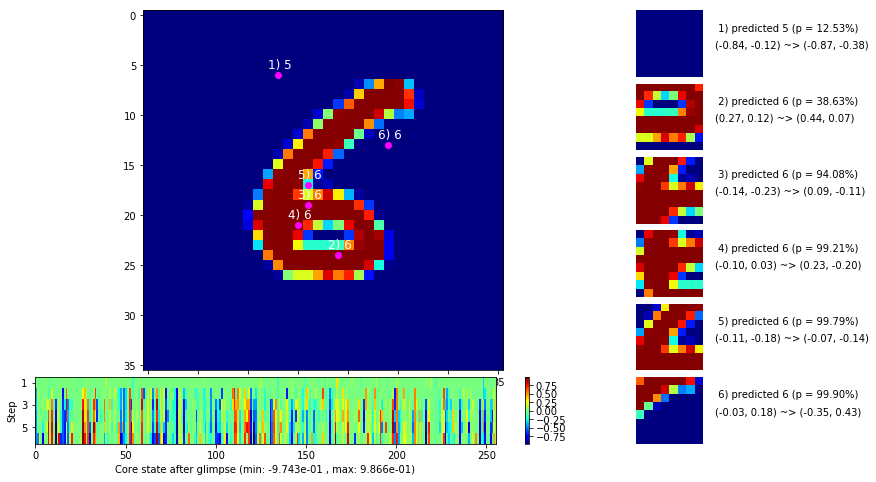

 b   2500/  3000 >> 134.1 ms/b | lr: 7.94e-05 | grad 2norm:  4.92 | grad inf norm:  1.211
       Weights || abs max:  1.21 (22688.14) | mean: -5.39e-03 ( 0.09) | var: 1.65e-02 ( 6973.72)
        Biases || abs max:  0.96 (  913.45) | mean:  1.60e-02 ( 0.71) | var: 6.42e-03 ( 8255.45)
                  class loss: 0.173 | steps: 2.065 | reward:  0.945 | acc.: 94.53%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.3 ms/b | lr: 7.79e-05 | grad 2norm:  4.76 | grad inf norm:  1.188
       Weights || abs max:  1.21 (32046.95) | mean: -5.38e-03 ( 0.10) | var: 1.65e-02 (328793.38)
        Biases || abs max:  0.96 (  450.56) | mean:  1.61e-02 ( 0.46) | var: 6.42e-03 ( 4699.32)
                  class loss: 0.156 | steps: 2.050 | reward:  0.948 | acc.: 94.78%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

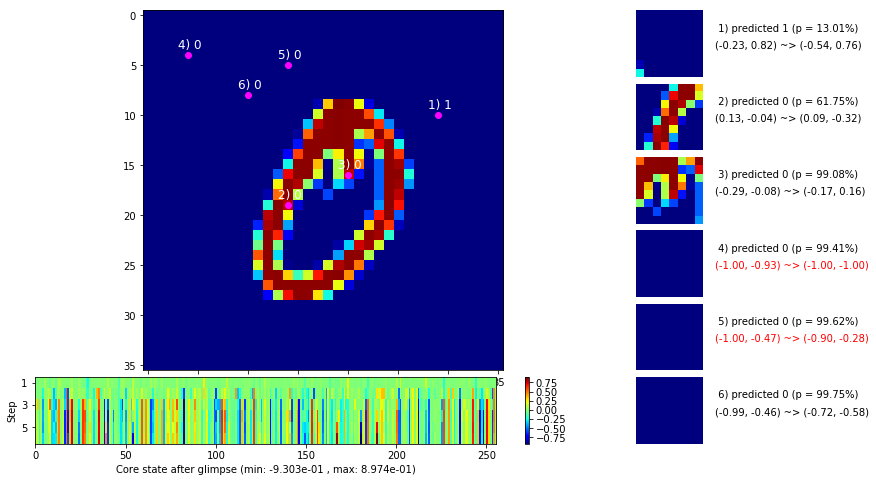

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


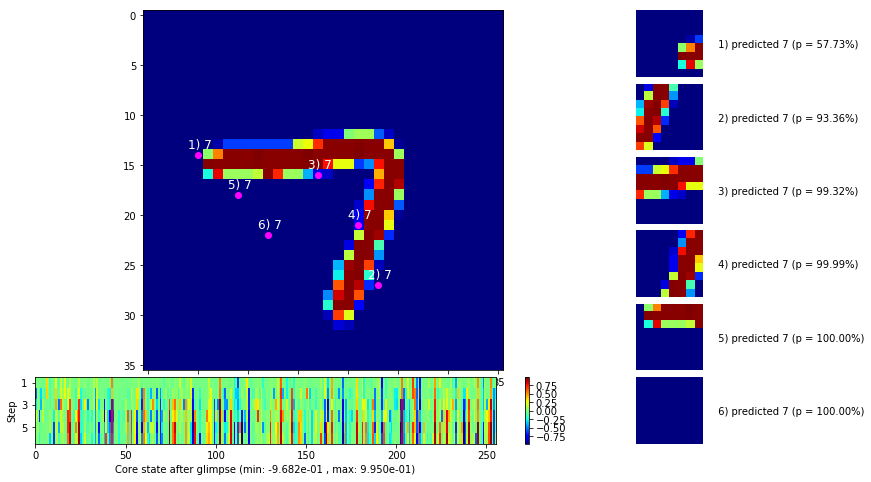


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


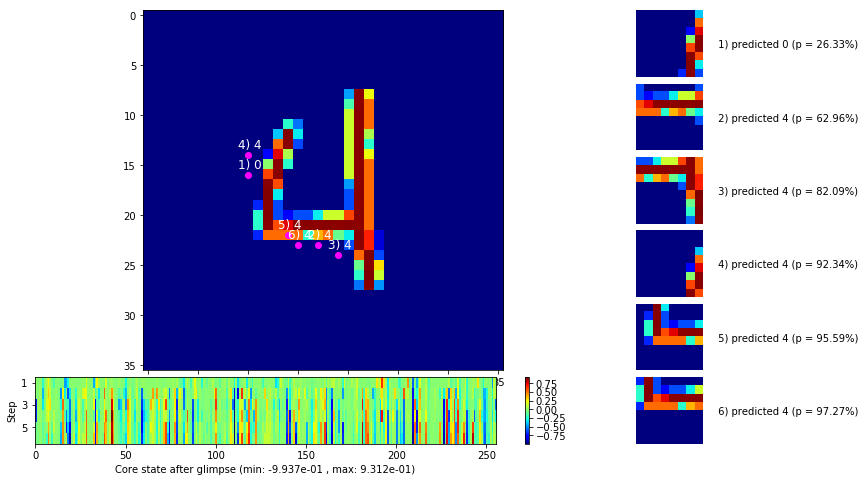

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


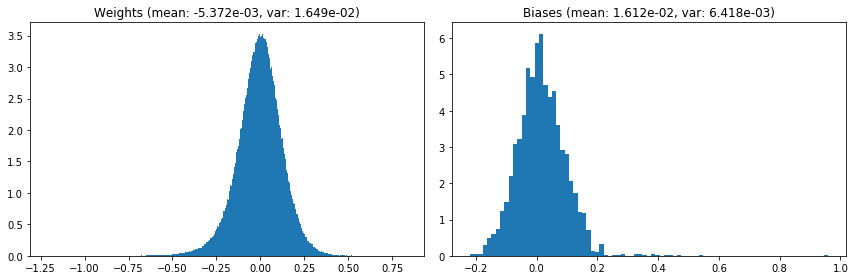

                                      Location network weights and biases


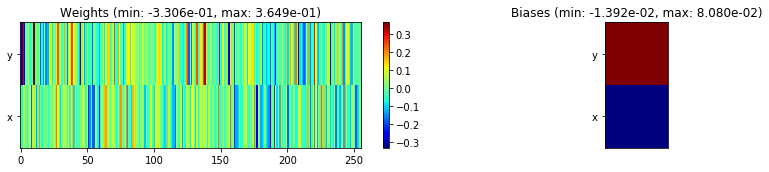

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.89 sec | TRAIN >> class loss: 0.1636 | steps:  2.062    | reward:  0.9467    | acc.: 94.675% 
                          | VAL   >> class loss: 0.1671 | steps:  1.969 :( | reward:  0.9452 :( | acc.: 94.520% :(


Epoch  18/400) lr = 7.709e-05
 b    500/  3000 >> 131.5 ms/b | lr: 7.56e-05 | grad 2norm:  4.66 | grad inf norm:  1.178
       Weights || abs max:  1.21 (36812.96) | mean: -5.35e-03 ( 0.12) | var: 1.65e-02 (139072.56)
        Biases || abs max:  0.96 ( 1446.24) | mean:  1.63e-02 ( 0.90) | var: 6.42e-03 (79257.24)
                  class loss: 0.151 | steps: 2.067 | reward:  0.948 | acc.: 94.83%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.1 ms/b | lr: 7.40e-05 | grad 2norm:  4.95 | grad inf norm:  1.203
       Weights || abs max:  1.21 (31334.88) | mean: -5.33e-03 ( 0.11) | 

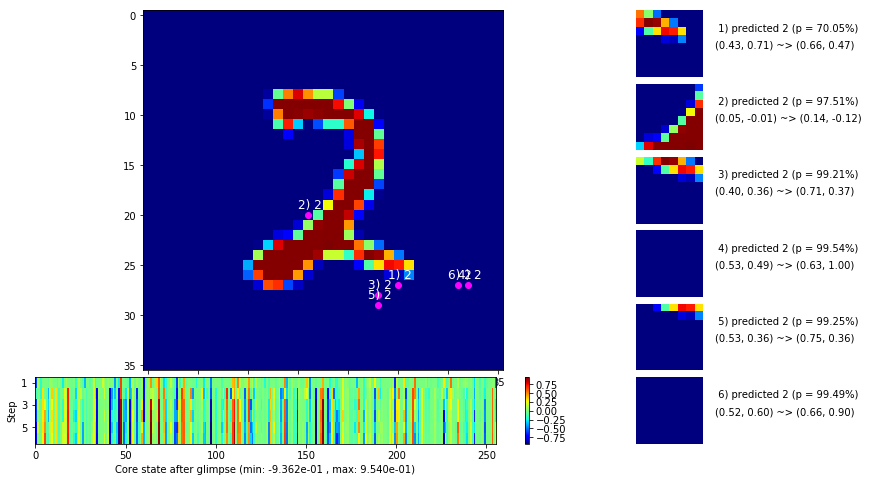

 b   1500/  3000 >> 133.4 ms/b | lr: 7.18e-05 | grad 2norm:  4.91 | grad inf norm:  1.189
       Weights || abs max:  1.21 (28504.28) | mean: -5.33e-03 ( 0.11) | var: 1.65e-02 (42692.79)
        Biases || abs max:  0.96 (  618.84) | mean:  1.63e-02 ( 0.61) | var: 6.43e-03 ( 3705.82)
                  class loss: 0.162 | steps: 2.058 | reward:  0.946 | acc.: 94.62%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 7.04e-05 | grad 2norm:  4.68 | grad inf norm:  1.149
       Weights || abs max:  1.22 (46064.50) | mean: -5.34e-03 ( 0.14) | var: 1.65e-02 (253228.56)
        Biases || abs max:  0.96 (  472.67) | mean:  1.62e-02 ( 0.54) | var: 6.43e-03 ( 3039.00)
                  class loss: 0.155 | steps: 2.075 | reward:  0.949 | acc.: 94.90%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

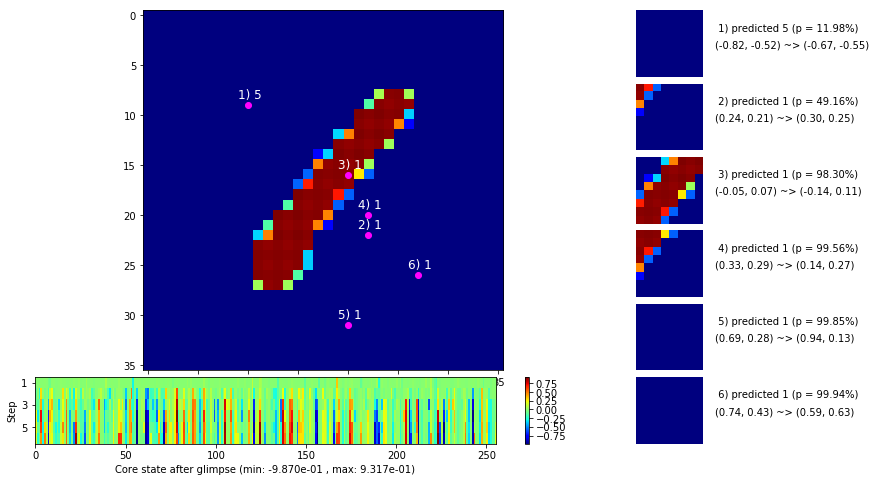

 b   2500/  3000 >> 140.4 ms/b | lr: 6.83e-05 | grad 2norm:  4.61 | grad inf norm:  1.125
       Weights || abs max:  1.22 (40736.98) | mean: -5.35e-03 ( 0.13) | var: 1.65e-02 (58818.55)
        Biases || abs max:  0.96 (  809.16) | mean:  1.62e-02 ( 0.71) | var: 6.44e-03 ( 3976.47)
                  class loss: 0.152 | steps: 2.061 | reward:  0.951 | acc.: 95.09%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.2 ms/b | lr: 6.70e-05 | grad 2norm:  4.56 | grad inf norm:  1.138
       Weights || abs max:  1.22 (72347.55) | mean: -5.34e-03 ( 0.17) | var: 1.65e-02 (1797907.38)
        Biases || abs max:  0.96 (  499.59) | mean:  1.62e-02 ( 0.47) | var: 6.44e-03 ( 2273.85)
                  class loss: 0.150 | steps: 2.044 | reward:  0.952 | acc.: 95.16%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

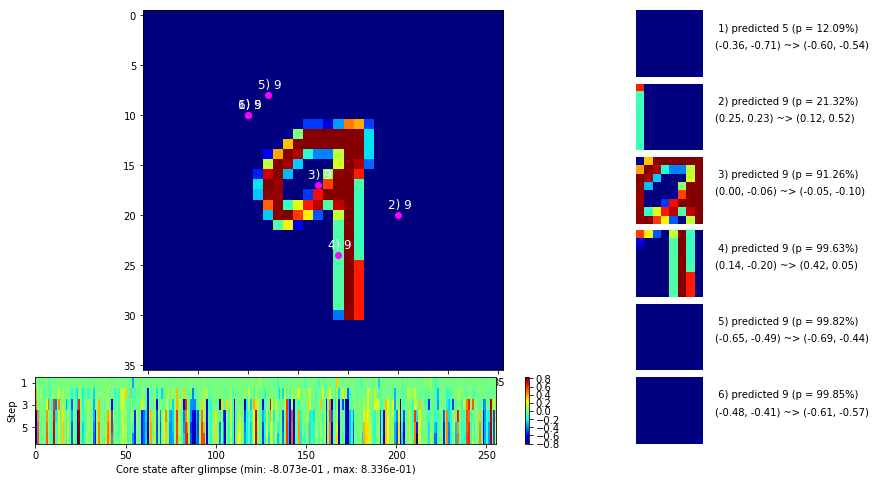

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


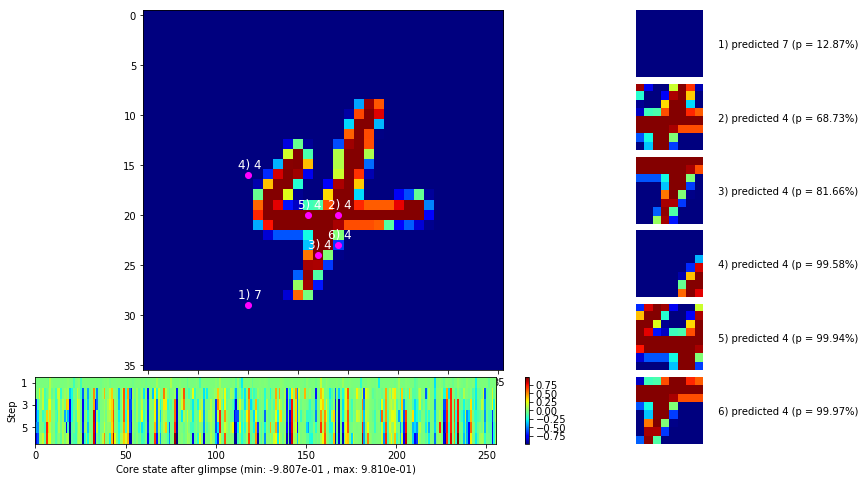


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


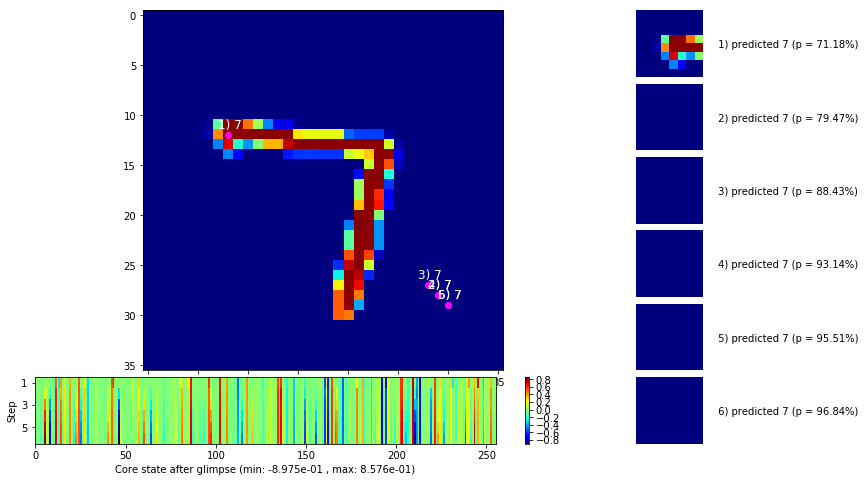

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


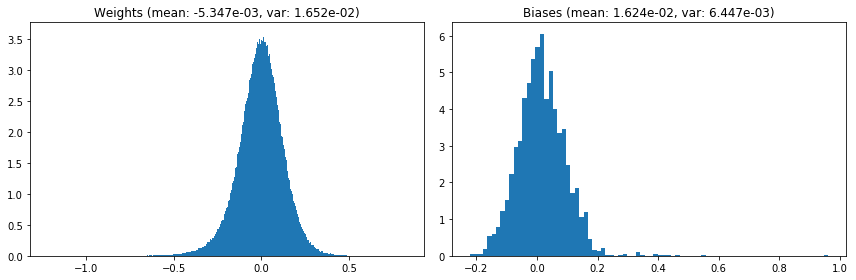

                                      Location network weights and biases


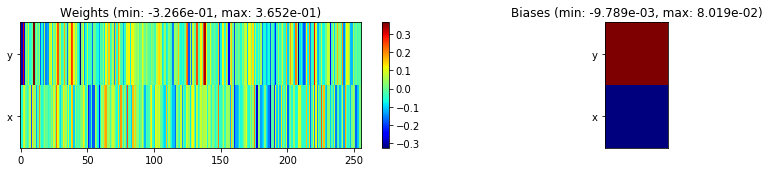

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.44 sec | TRAIN >> class loss: 0.1554 | steps:  2.064 :( | reward:  0.9484    | acc.: 94.842% 
                          | VAL   >> class loss: 0.1680 | steps:  1.943    | reward:  0.9480    | acc.: 94.800% 


Epoch  19/400) lr = 6.63e-05
 b    500/  3000 >> 130.7 ms/b | lr: 6.50e-05 | grad 2norm:  4.59 | grad inf norm:  1.121
       Weights || abs max:  1.22 (31225.63) | mean: -5.36e-03 ( 0.11) | var: 1.65e-02 (45560.13)
        Biases || abs max:  0.96 (  784.61) | mean:  1.62e-02 ( 0.85) | var: 6.44e-03 (72182.98)
                  class loss: 0.156 | steps: 2.062 | reward:  0.952 | acc.: 95.15%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.2 ms/b | lr: 6.37e-05 | grad 2norm:  4.74 | grad inf norm:  1.179
       Weights || abs max:  1.22 (39686.59) | mean: -5.36e-03 ( 0.12) | var:

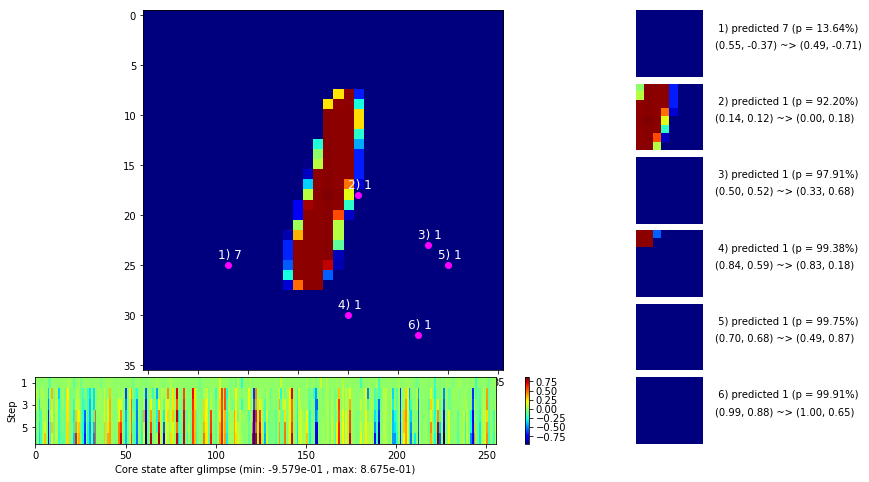

 b   1500/  3000 >> 134.0 ms/b | lr: 6.18e-05 | grad 2norm:  4.64 | grad inf norm:  1.188
       Weights || abs max:  1.22 (15670.87) | mean: -5.37e-03 ( 0.09) | var: 1.65e-02 ( 2934.69)
        Biases || abs max:  0.96 (  200.62) | mean:  1.61e-02 ( 0.38) | var: 6.43e-03 (  340.15)
                  class loss: 0.154 | steps: 2.064 | reward:  0.948 | acc.: 94.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.8 ms/b | lr: 6.06e-05 | grad 2norm:  4.62 | grad inf norm:  1.156
       Weights || abs max:  1.22 (33200.78) | mean: -5.38e-03 ( 0.11) | var: 1.65e-02 (103605.70)
        Biases || abs max:  0.96 (  786.29) | mean:  1.61e-02 ( 0.67) | var: 6.44e-03 (19257.96)
                  class loss: 0.156 | steps: 2.053 | reward:  0.949 | acc.: 94.93%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

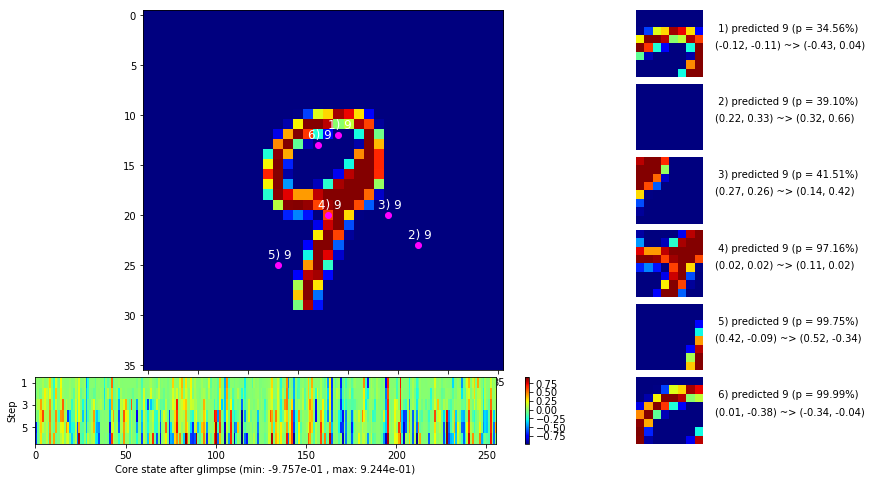

 b   2500/  3000 >> 132.5 ms/b | lr: 5.88e-05 | grad 2norm:  4.32 | grad inf norm:  1.070
       Weights || abs max:  1.23 (26996.13) | mean: -5.37e-03 ( 0.10) | var: 1.65e-02 (16167.23)
        Biases || abs max:  0.96 (  747.71) | mean:  1.61e-02 ( 0.59) | var: 6.43e-03 (12021.05)
                  class loss: 0.138 | steps: 2.033 | reward:  0.955 | acc.: 95.49%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.0 ms/b | lr: 5.76e-05 | grad 2norm:  4.69 | grad inf norm:  1.131
       Weights || abs max:  1.23 (45227.54) | mean: -5.37e-03 ( 0.14) | var: 1.65e-02 (164924.39)
        Biases || abs max:  0.96 ( 1158.14) | mean:  1.61e-02 ( 0.79) | var: 6.43e-03 (26604.21)
                  class loss: 0.154 | steps: 2.070 | reward:  0.949 | acc.: 94.88%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

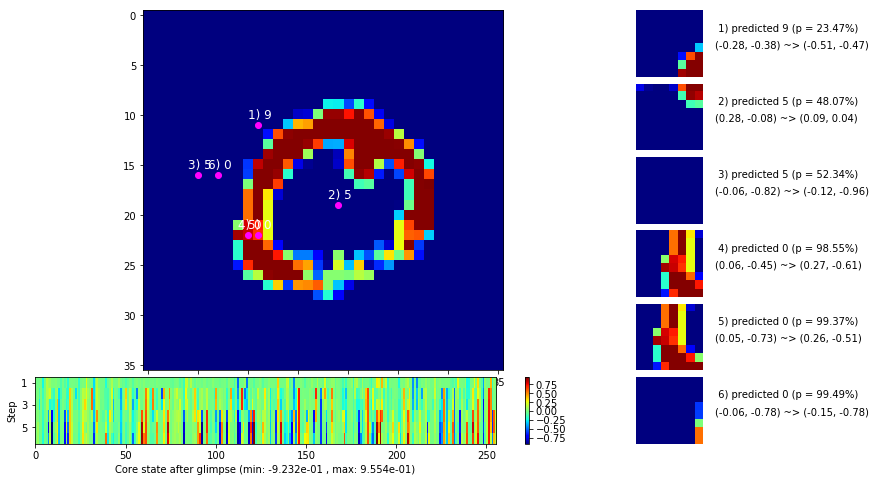

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


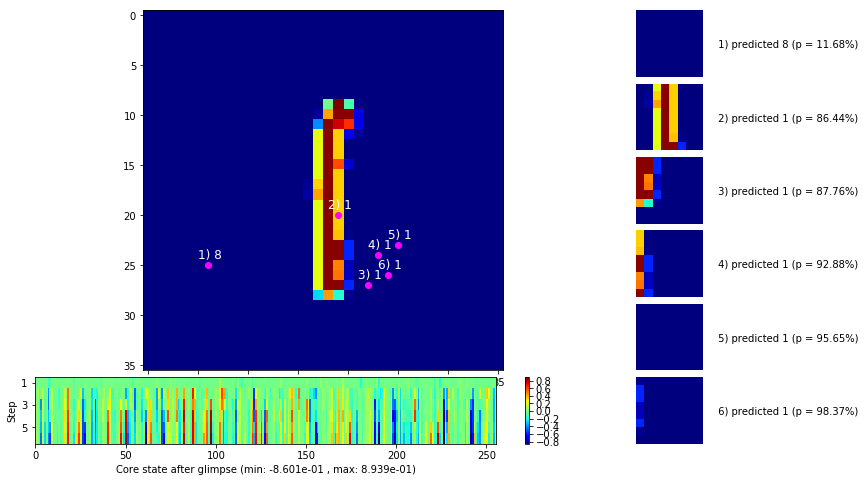


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


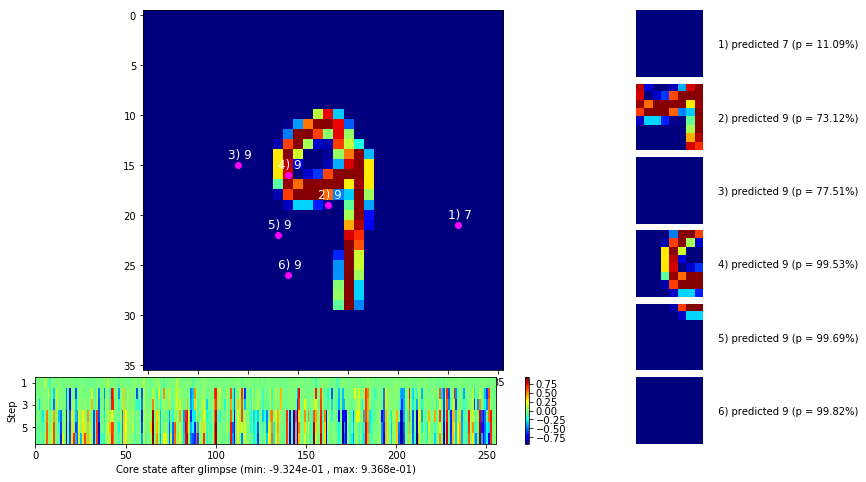

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


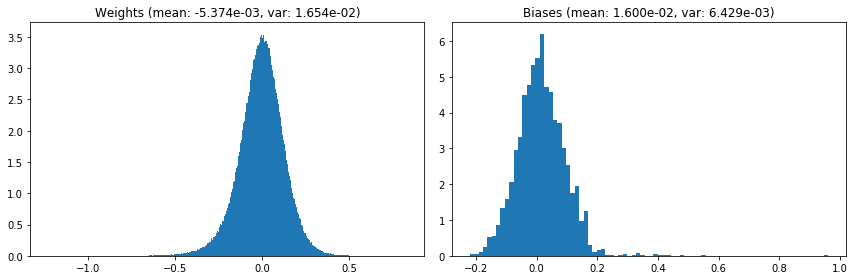

                                      Location network weights and biases


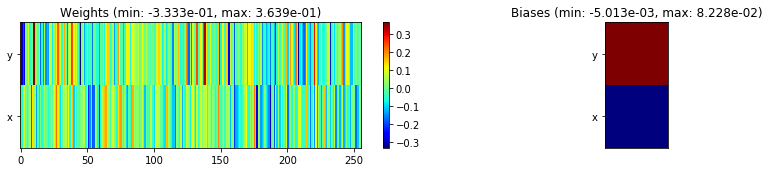

---------------------------------------------------------------------------------------------------------------
Elapsed time:  396.11 sec | TRAIN >> class loss: 0.1524 | steps:  2.058    | reward:  0.9500    | acc.: 95.002% 
                          | VAL   >> class loss: 0.1469 | steps:  1.942    | reward:  0.9508    | acc.: 95.080% 


Epoch  20/400) lr = 5.702e-05
 b    500/  3000 >> 131.9 ms/b | lr: 5.59e-05 | grad 2norm:  4.49 | grad inf norm:  1.131
       Weights || abs max:  1.23 (36411.48) | mean: -5.36e-03 ( 0.12) | var: 1.65e-02 (277353.97)
        Biases || abs max:  0.96 (  357.35) | mean:  1.61e-02 ( 0.49) | var: 6.43e-03 (  508.76)
                  class loss: 0.146 | steps: 2.067 | reward:  0.952 | acc.: 95.23%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 139.9 ms/b | lr: 5.48e-05 | grad 2norm:  4.39 | grad inf norm:  1.092
       Weights || abs max:  1.23 (24082.48) | mean: -5.34e-03 ( 0.10) | va

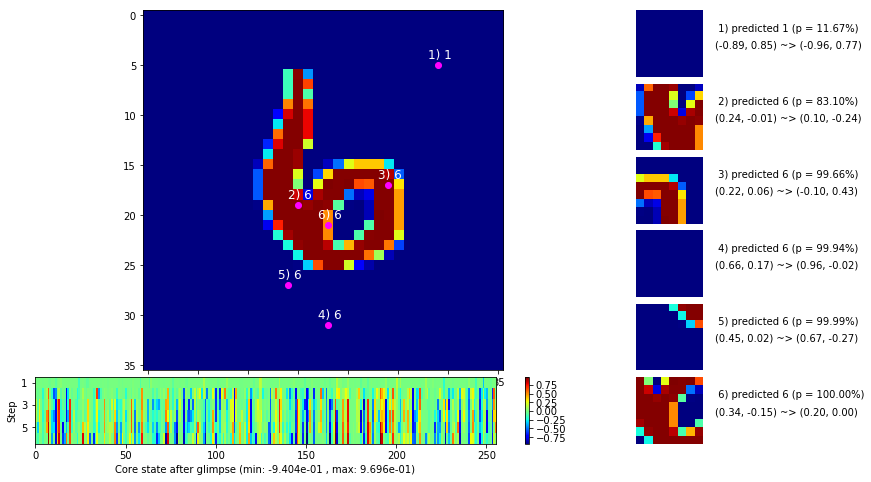

 b   1500/  3000 >> 133.7 ms/b | lr: 5.31e-05 | grad 2norm:  4.59 | grad inf norm:  1.133
       Weights || abs max:  1.23 (23043.72) | mean: -5.33e-03 ( 0.09) | var: 1.66e-02 (15617.82)
        Biases || abs max:  0.96 ( 1365.93) | mean:  1.61e-02 ( 0.93) | var: 6.44e-03 (29097.19)
                  class loss: 0.150 | steps: 2.044 | reward:  0.950 | acc.: 95.04%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 5.21e-05 | grad 2norm:  4.27 | grad inf norm:  1.078
       Weights || abs max:  1.23 (92524.35) | mean: -5.32e-03 ( 0.20) | var: 1.66e-02 (4822359.00)
        Biases || abs max:  0.96 (  742.04) | mean:  1.61e-02 ( 0.62) | var: 6.44e-03 ( 5178.82)
                  class loss: 0.132 | steps: 2.038 | reward:  0.956 | acc.: 95.61%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

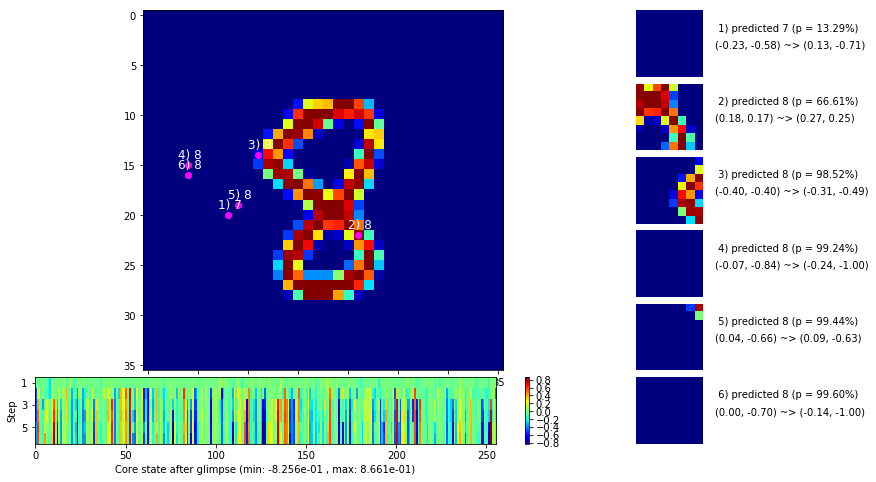

 b   2500/  3000 >> 133.9 ms/b | lr: 5.05e-05 | grad 2norm:  4.65 | grad inf norm:  1.137
       Weights || abs max:  1.23 (27691.03) | mean: -5.31e-03 ( 0.10) | var: 1.66e-02 (93173.47)
        Biases || abs max:  0.96 (  873.15) | mean:  1.62e-02 ( 0.75) | var: 6.45e-03 ( 5051.08)
                  class loss: 0.151 | steps: 2.038 | reward:  0.950 | acc.: 94.99%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.9 ms/b | lr: 4.95e-05 | grad 2norm:  4.35 | grad inf norm:  1.074
       Weights || abs max:  1.23 (18992.89) | mean: -5.29e-03 ( 0.08) | var: 1.66e-02 (12396.55)
        Biases || abs max:  0.96 (  787.57) | mean:  1.63e-02 ( 0.73) | var: 6.45e-03 ( 9325.42)
                  class loss: 0.140 | steps: 2.030 | reward:  0.955 | acc.: 95.50%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

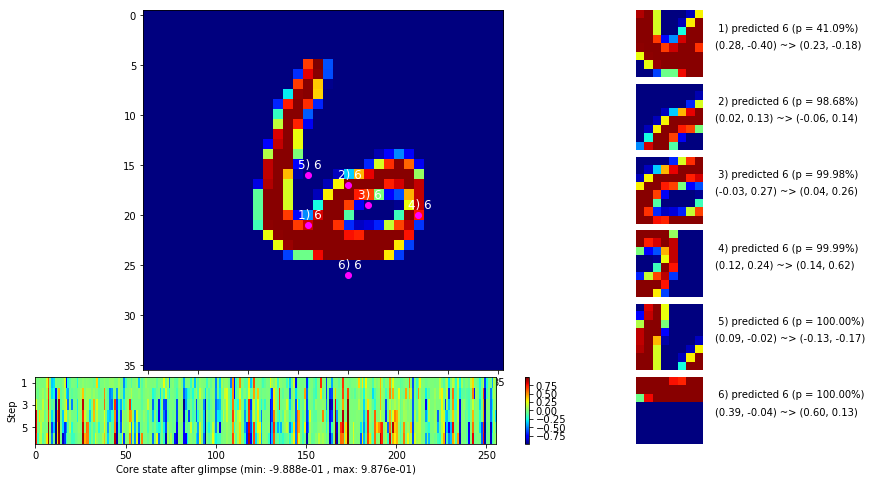

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


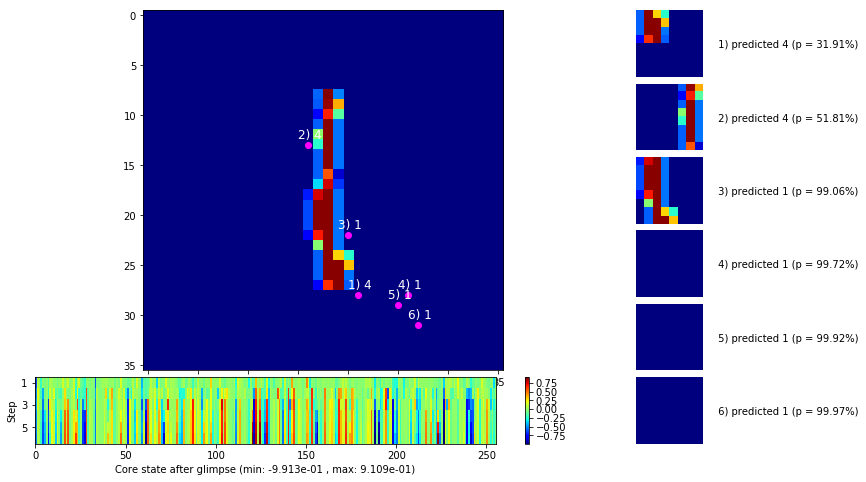


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


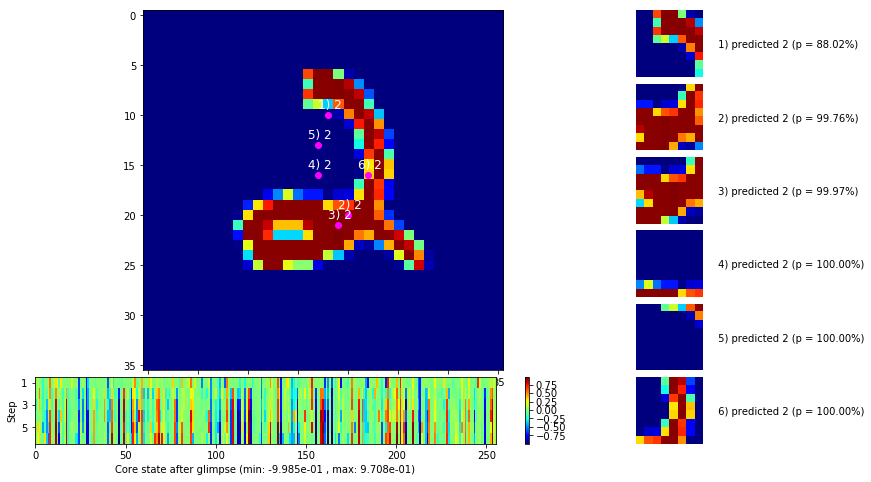

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


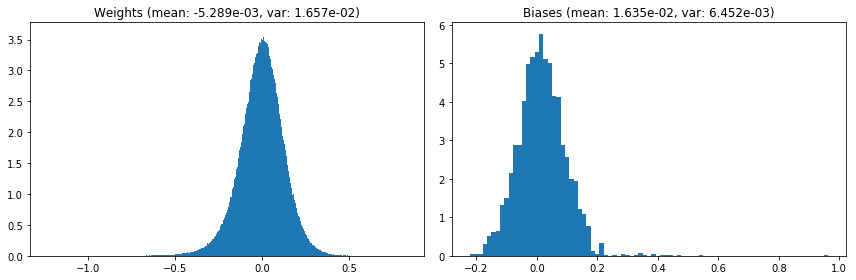

                                      Location network weights and biases


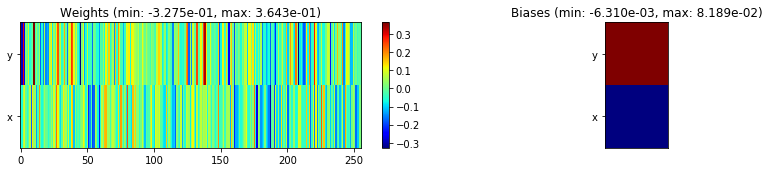

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.68 sec | TRAIN >> class loss: 0.1433 | steps:  2.044    | reward:  0.9529    | acc.: 95.292% 
                          | VAL   >> class loss: 0.1540 | steps:  1.936    | reward:  0.9470 :( | acc.: 94.700% :(


Epoch  21/400) lr = 4.904e-05
 b    500/  3000 >> 132.1 ms/b | lr: 4.81e-05 | grad 2norm:  4.48 | grad inf norm:  1.138
       Weights || abs max:  1.23 (39085.32) | mean: -5.29e-03 ( 0.12) | var: 1.66e-02 (332872.97)
        Biases || abs max:  0.96 (  798.03) | mean:  1.63e-02 ( 0.66) | var: 6.45e-03 ( 4176.25)
                  class loss: 0.143 | steps: 2.037 | reward:  0.952 | acc.: 95.15%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 4.71e-05 | grad 2norm:  4.53 | grad inf norm:  1.113
       Weights || abs max:  1.23 (136366.05) | mean: -5.30e-03 ( 0.29) |

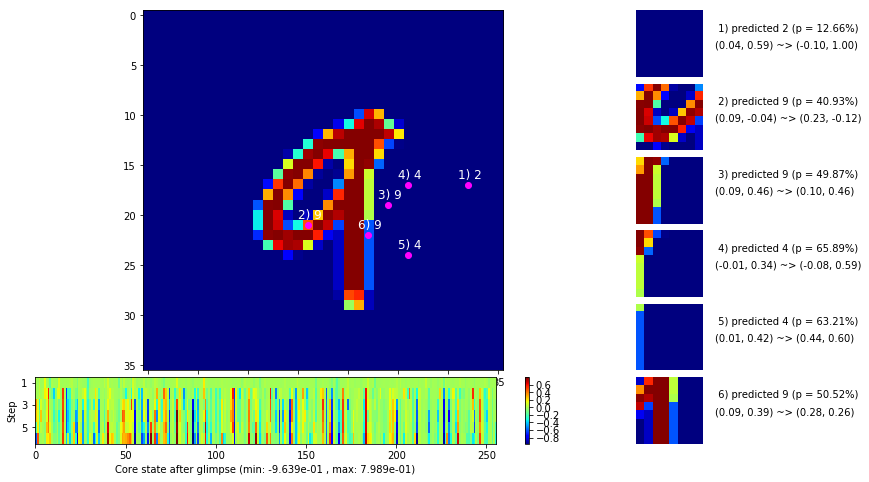

 b   1500/  3000 >> 132.0 ms/b | lr: 4.57e-05 | grad 2norm:  4.62 | grad inf norm:  1.119
       Weights || abs max:  1.23 (56395.98) | mean: -5.30e-03 ( 0.16) | var: 1.66e-02 (301023.22)
        Biases || abs max:  0.96 (  549.38) | mean:  1.63e-02 ( 0.56) | var: 6.46e-03 ( 4728.95)
                  class loss: 0.152 | steps: 2.043 | reward:  0.951 | acc.: 95.07%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.8 ms/b | lr: 4.48e-05 | grad 2norm:  4.23 | grad inf norm:  1.094
       Weights || abs max:  1.23 (26191.79) | mean: -5.30e-03 ( 0.10) | var: 1.66e-02 (33050.11)
        Biases || abs max:  0.96 (  840.68) | mean:  1.62e-02 ( 0.65) | var: 6.45e-03 (31642.87)
                  class loss: 0.135 | steps: 2.022 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

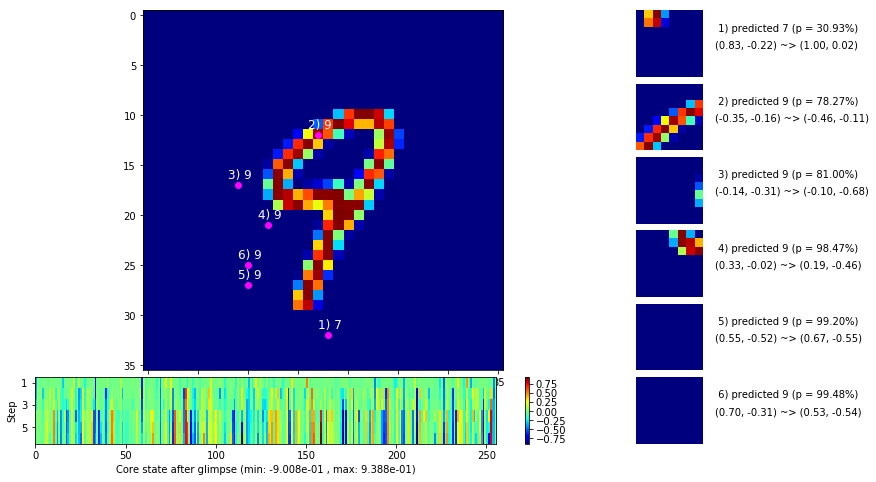

 b   2500/  3000 >> 141.9 ms/b | lr: 4.35e-05 | grad 2norm:  4.44 | grad inf norm:  1.107
       Weights || abs max:  1.24 (101760.92) | mean: -5.31e-03 ( 0.23) | var: 1.66e-02 (2817366.00)
        Biases || abs max:  0.96 (  417.91) | mean:  1.62e-02 ( 0.46) | var: 6.44e-03 ( 1623.24)
                  class loss: 0.143 | steps: 2.030 | reward:  0.953 | acc.: 95.25%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 4.26e-05 | grad 2norm:  4.37 | grad inf norm:  1.088
       Weights || abs max:  1.24 (46192.46) | mean: -5.29e-03 ( 0.14) | var: 1.66e-02 (106674.25)
        Biases || abs max:  0.96 (  317.30) | mean:  1.62e-02 ( 0.44) | var: 6.45e-03 (  754.00)
                  class loss: 0.133 | steps: 2.038 | reward:  0.954 | acc.: 95.39%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

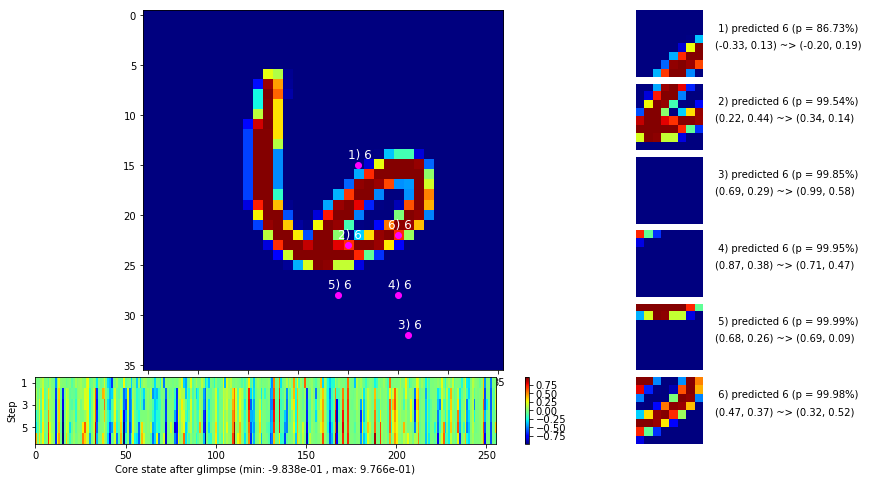

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


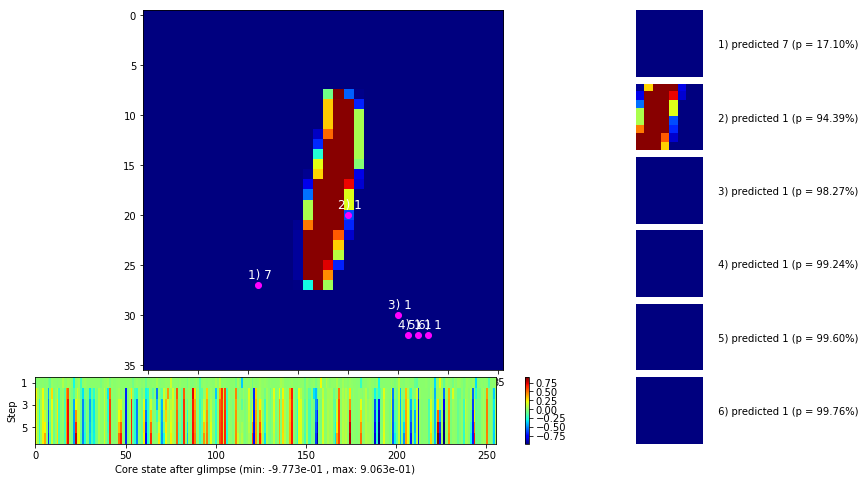


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


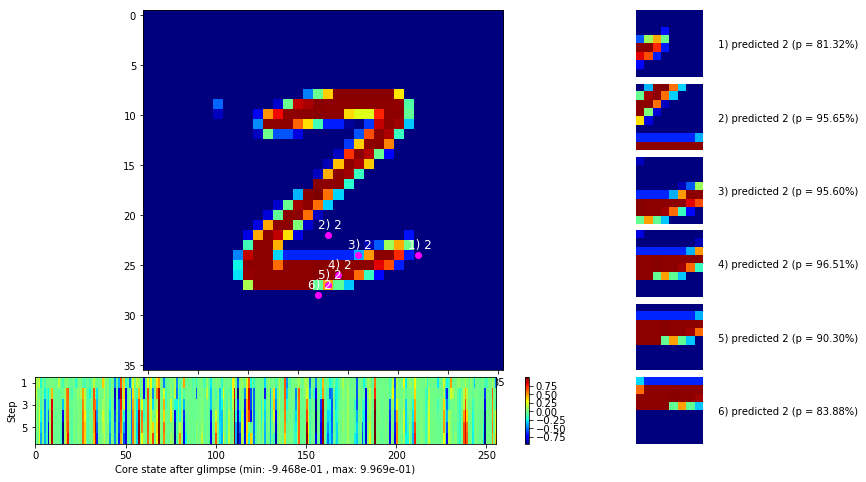

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


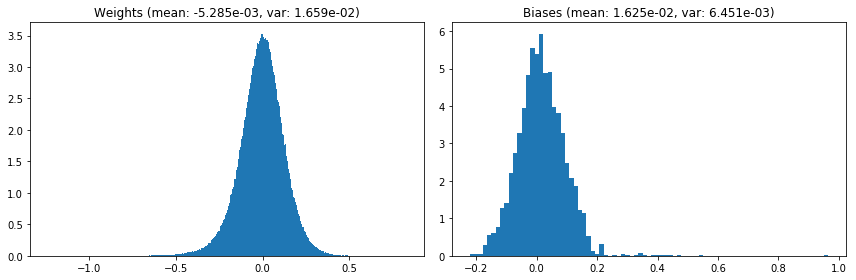

                                      Location network weights and biases


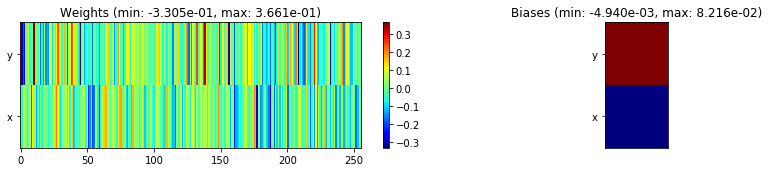

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.72 sec | TRAIN >> class loss: 0.1426 | steps:  2.036    | reward:  0.9528 :( | acc.: 95.283% :(
                          | VAL   >> class loss: 0.1489 | steps:  1.925    | reward:  0.9506 :( | acc.: 95.060% :(


Epoch  22/400) lr = 4.218e-05
 b    500/  3000 >> 133.1 ms/b | lr: 4.13e-05 | grad 2norm:  4.27 | grad inf norm:  1.100
       Weights || abs max:  1.24 (23956.46) | mean: -5.27e-03 ( 0.10) | var: 1.66e-02 (13955.53)
        Biases || abs max:  0.97 ( 1120.95) | mean:  1.63e-02 ( 0.80) | var: 6.46e-03 (68962.45)
                  class loss: 0.132 | steps: 2.035 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.0 ms/b | lr: 4.05e-05 | grad 2norm:  4.39 | grad inf norm:  1.113
       Weights || abs max:  1.24 (34971.13) | mean: -5.26e-03 ( 0.12) |

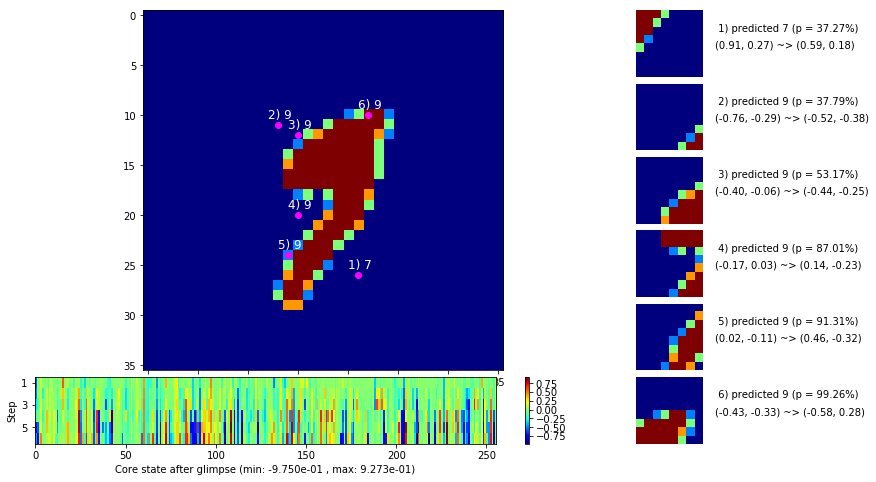

 b   1500/  3000 >> 136.3 ms/b | lr: 3.93e-05 | grad 2norm:  4.53 | grad inf norm:  1.127
       Weights || abs max:  1.24 (34461.78) | mean: -5.25e-03 ( 0.12) | var: 1.66e-02 (65312.94)
        Biases || abs max:  0.97 ( 1717.60) | mean:  1.64e-02 ( 1.01) | var: 6.46e-03 (195594.52)
                  class loss: 0.145 | steps: 2.031 | reward:  0.952 | acc.: 95.22%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.7 ms/b | lr: 3.85e-05 | grad 2norm:  4.47 | grad inf norm:  1.123
       Weights || abs max:  1.24 (69927.71) | mean: -5.25e-03 ( 0.17) | var: 1.66e-02 (1669539.12)
        Biases || abs max:  0.97 (  630.70) | mean:  1.64e-02 ( 0.62) | var: 6.45e-03 ( 3101.56)
                  class loss: 0.151 | steps: 2.058 | reward:  0.952 | acc.: 95.16%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

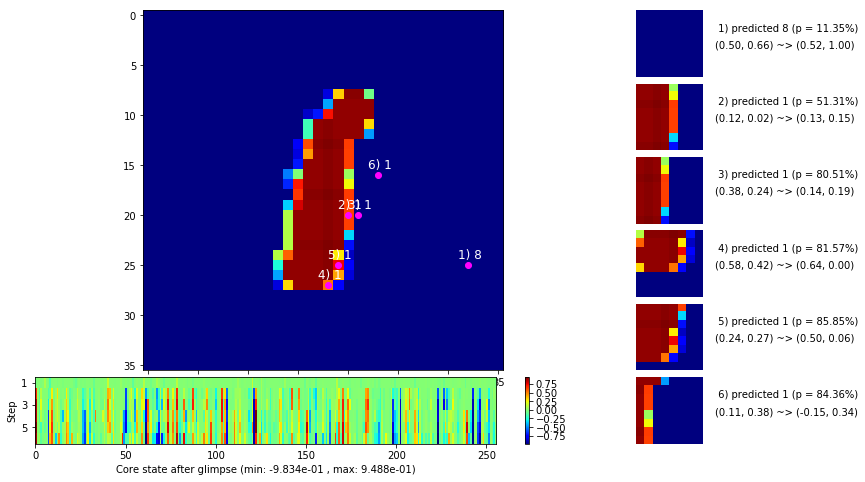

 b   2500/  3000 >> 133.1 ms/b | lr: 3.74e-05 | grad 2norm:  4.48 | grad inf norm:  1.083
       Weights || abs max:  1.24 (43741.51) | mean: -5.24e-03 ( 0.13) | var: 1.66e-02 (75447.14)
        Biases || abs max:  0.96 (  563.51) | mean:  1.64e-02 ( 0.54) | var: 6.45e-03 ( 1633.54)
                  class loss: 0.141 | steps: 2.026 | reward:  0.954 | acc.: 95.37%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.7 ms/b | lr: 3.66e-05 | grad 2norm:  4.33 | grad inf norm:  1.076
       Weights || abs max:  1.24 (26420.17) | mean: -5.24e-03 ( 0.11) | var: 1.66e-02 (16691.50)
        Biases || abs max:  0.97 ( 1417.10) | mean:  1.64e-02 ( 1.24) | var: 6.46e-03 (161032.19)
                  class loss: 0.129 | steps: 2.032 | reward:  0.955 | acc.: 95.50%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

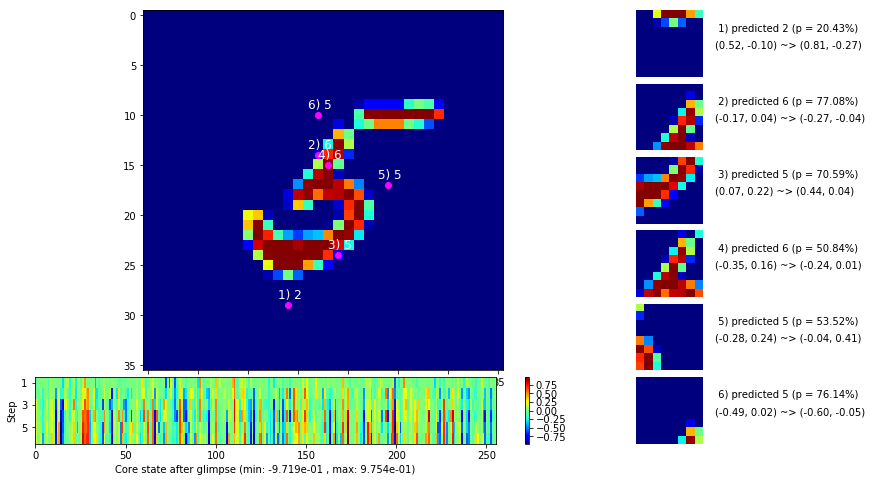

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


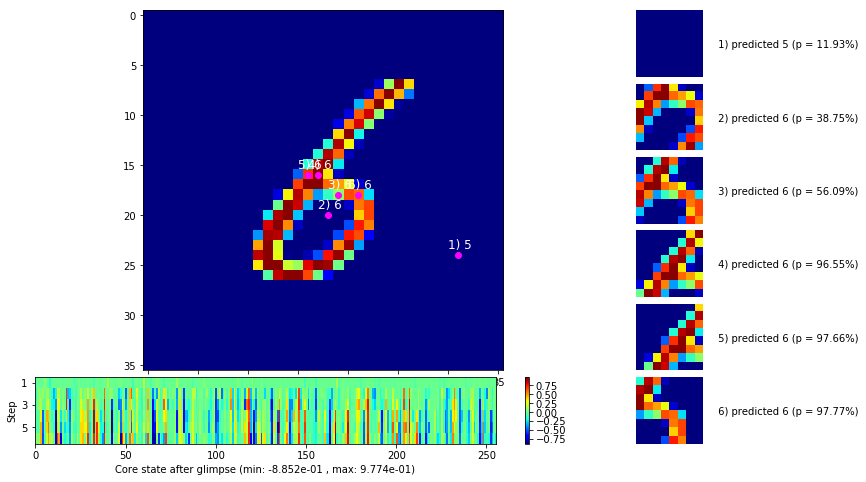


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


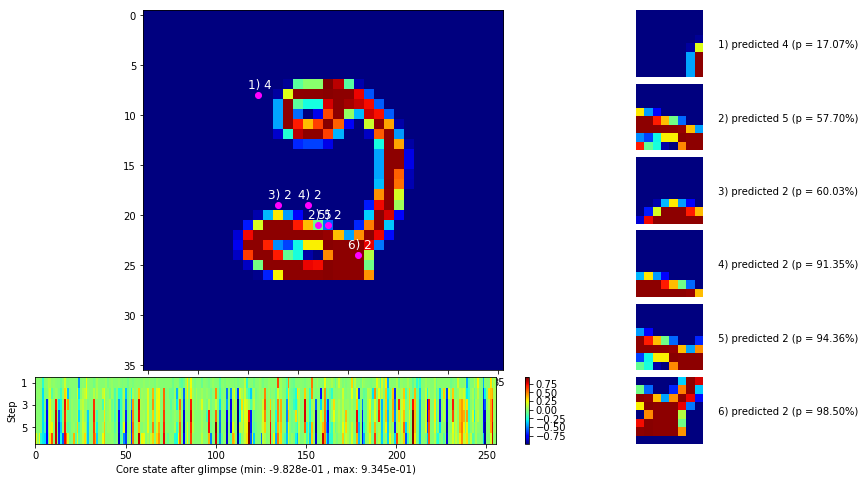

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


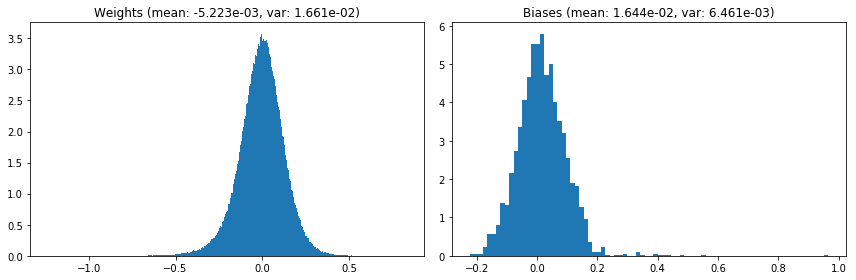

                                      Location network weights and biases


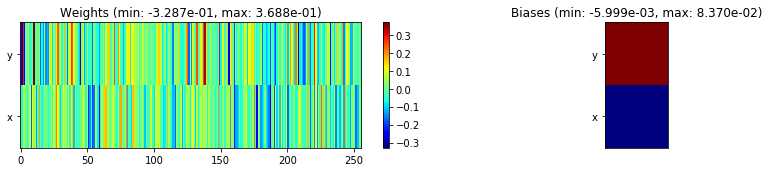

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.07 sec | TRAIN >> class loss: 0.1389 | steps:  2.035    | reward:  0.9537    | acc.: 95.370% 
                          | VAL   >> class loss: 0.1397 | steps:  1.937 :( | reward:  0.9550    | acc.: 95.500% 


Epoch  23/400) lr = 3.628e-05
 b    500/  3000 >> 132.9 ms/b | lr: 3.56e-05 | grad 2norm:  4.24 | grad inf norm:  1.073
       Weights || abs max:  1.24 (45700.13) | mean: -5.23e-03 ( 0.14) | var: 1.66e-02 (148727.88)
        Biases || abs max:  0.97 (  791.03) | mean:  1.64e-02 ( 0.83) | var: 6.46e-03 (11427.26)
                  class loss: 0.142 | steps: 2.022 | reward:  0.956 | acc.: 95.63%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 141.6 ms/b | lr: 3.48e-05 | grad 2norm:  4.55 | grad inf norm:  1.115
       Weights || abs max:  1.24 (37355.48) | mean: -5.23e-03 ( 0.13) | va

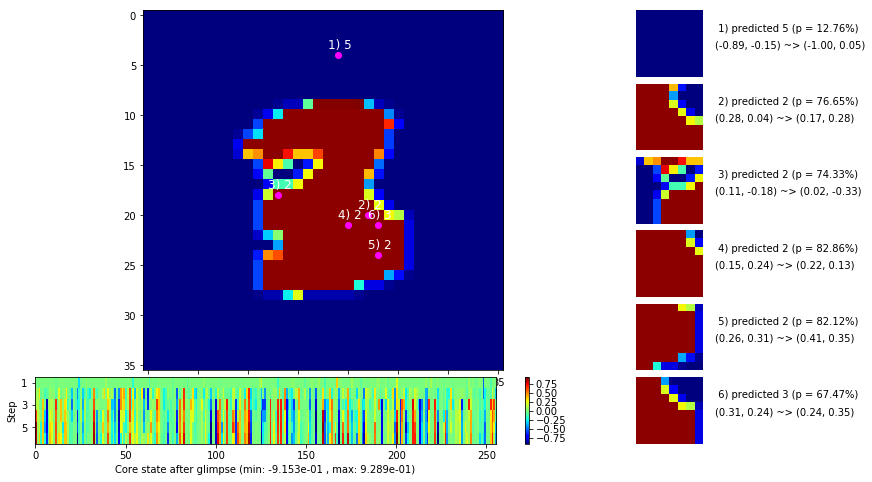

 b   1500/  3000 >> 132.3 ms/b | lr: 3.38e-05 | grad 2norm:  4.51 | grad inf norm:  1.119
       Weights || abs max:  1.24 (41937.53) | mean: -5.22e-03 ( 0.13) | var: 1.66e-02 (141066.97)
        Biases || abs max:  0.97 (  897.29) | mean:  1.65e-02 ( 0.66) | var: 6.47e-03 (26409.27)
                  class loss: 0.141 | steps: 2.042 | reward:  0.953 | acc.: 95.26%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.5 ms/b | lr: 3.31e-05 | grad 2norm:  4.49 | grad inf norm:  1.099
       Weights || abs max:  1.24 (31538.47) | mean: -5.21e-03 ( 0.12) | var: 1.66e-02 (66851.67)
        Biases || abs max:  0.97 (  493.46) | mean:  1.65e-02 ( 0.50) | var: 6.47e-03 ( 1058.92)
                  class loss: 0.141 | steps: 2.033 | reward:  0.952 | acc.: 95.24%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

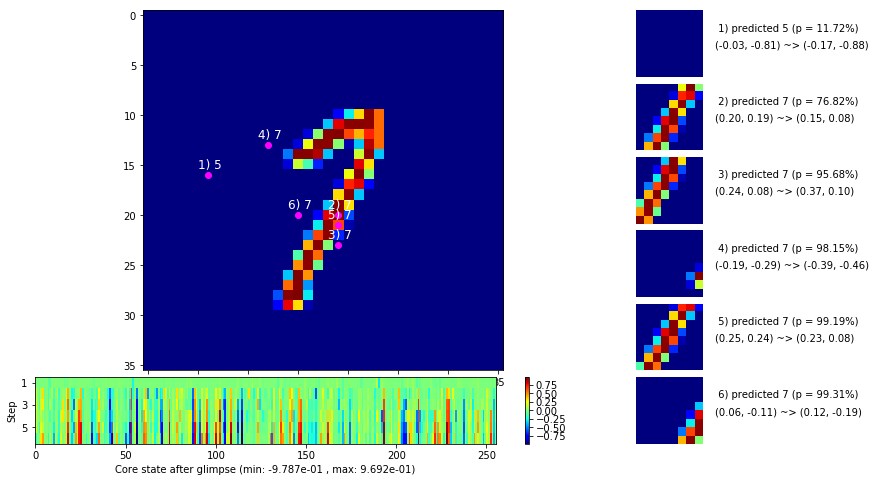

 b   2500/  3000 >> 134.8 ms/b | lr: 3.22e-05 | grad 2norm:  4.51 | grad inf norm:  1.097
       Weights || abs max:  1.24 (77312.22) | mean: -5.21e-03 ( 0.20) | var: 1.66e-02 (944479.06)
        Biases || abs max:  0.96 ( 2411.01) | mean:  1.65e-02 ( 1.30) | var: 6.47e-03 (246438.05)
                  class loss: 0.140 | steps: 2.048 | reward:  0.953 | acc.: 95.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.8 ms/b | lr: 3.15e-05 | grad 2norm:  4.45 | grad inf norm:  1.052
       Weights || abs max:  1.24 (27000.78) | mean: -5.21e-03 ( 0.12) | var: 1.66e-02 (15963.46)
        Biases || abs max:  0.97 ( 2644.78) | mean:  1.65e-02 ( 1.68) | var: 6.47e-03 (84298.50)
                  class loss: 0.140 | steps: 2.034 | reward:  0.955 | acc.: 95.53%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

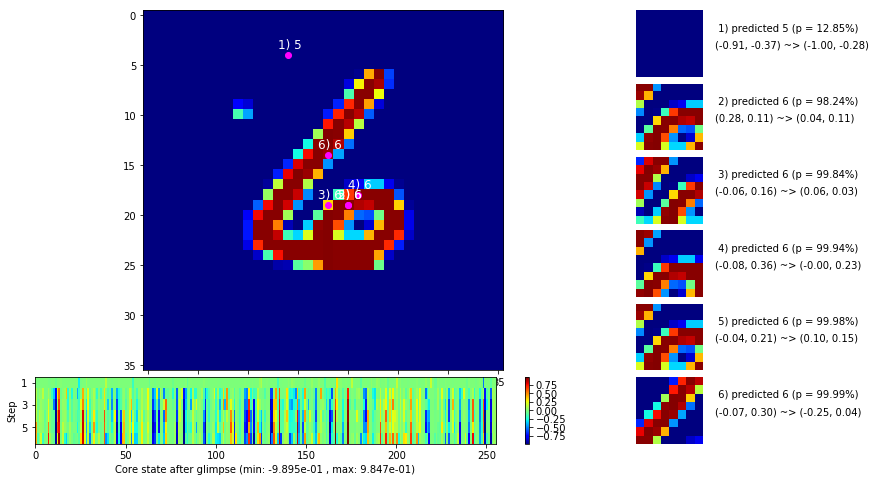

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


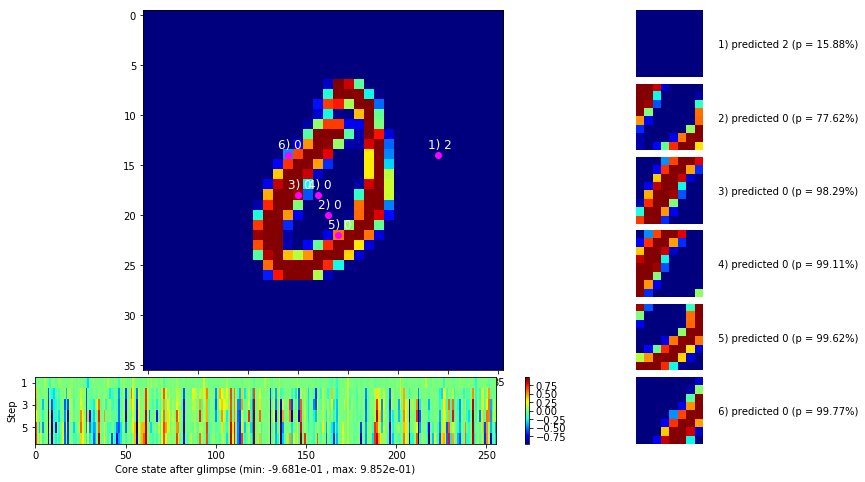


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


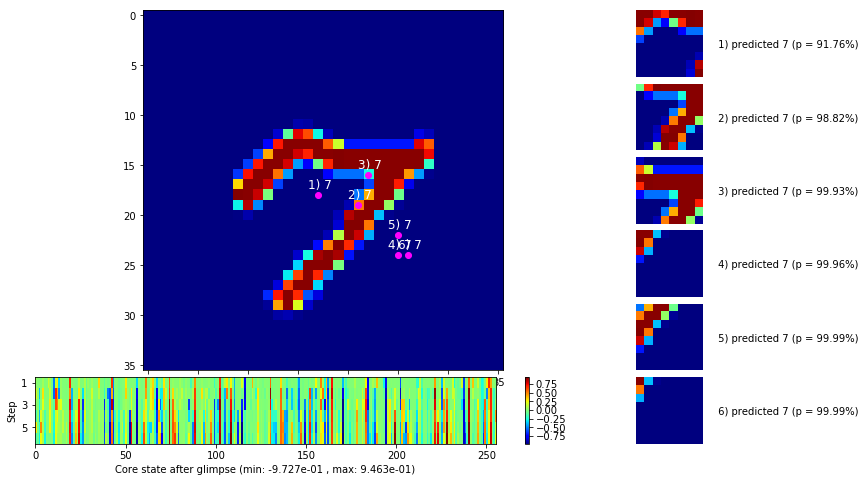

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


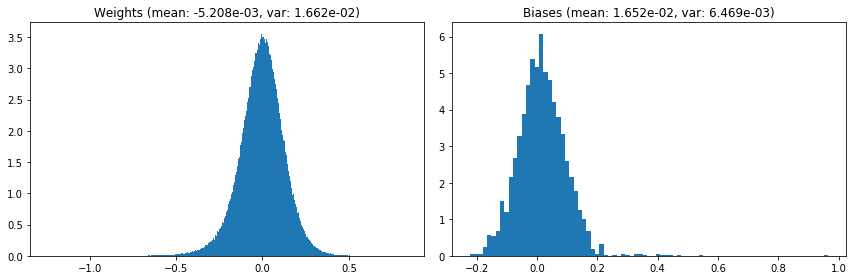

                                      Location network weights and biases


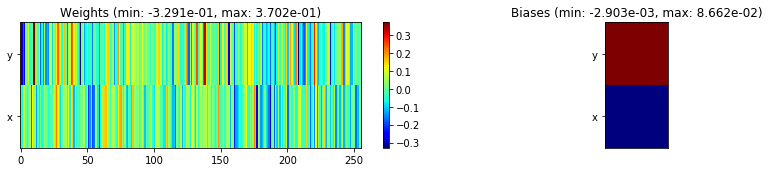

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.49 sec | TRAIN >> class loss: 0.1418 | steps:  2.038 :( | reward:  0.9535 :( | acc.: 95.352% :(
                          | VAL   >> class loss: 0.1320 | steps:  1.911    | reward:  0.9562    | acc.: 95.620% 


Epoch  24/400) lr = 3.12e-05
 b    500/  3000 >> 133.4 ms/b | lr: 3.06e-05 | grad 2norm:  4.26 | grad inf norm:  1.087
       Weights || abs max:  1.24 (19901.51) | mean: -5.20e-03 ( 0.09) | var: 1.66e-02 ( 8933.16)
        Biases || abs max:  0.97 ( 1347.49) | mean:  1.66e-02 ( 1.10) | var: 6.47e-03 (13510.40)
                  class loss: 0.134 | steps: 2.043 | reward:  0.955 | acc.: 95.51%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.2 ms/b | lr: 3.00e-05 | grad 2norm:  4.32 | grad inf norm:  1.070
       Weights || abs max:  1.24 (15001.53) | mean: -5.18e-03 ( 0.08) | va

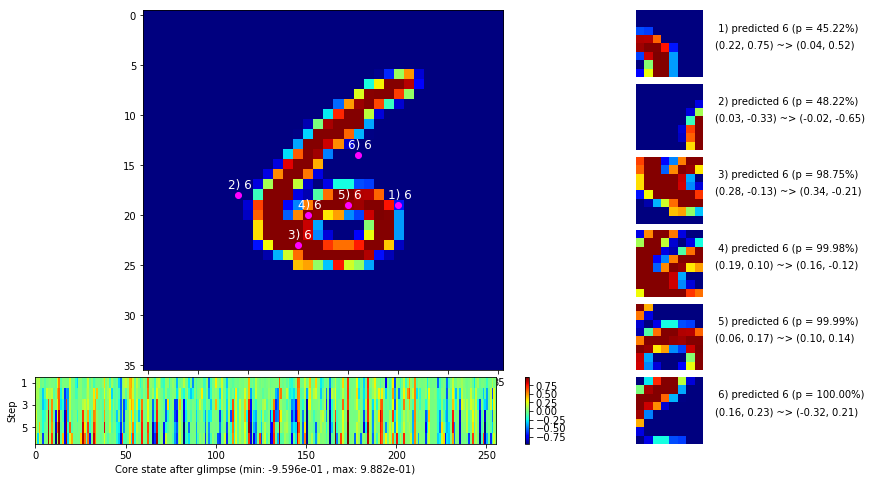

 b   1500/  3000 >> 132.6 ms/b | lr: 2.91e-05 | grad 2norm:  4.47 | grad inf norm:  1.103
       Weights || abs max:  1.24 (44030.76) | mean: -5.18e-03 ( 0.14) | var: 1.66e-02 (108937.69)
        Biases || abs max:  0.97 ( 4005.00) | mean:  1.66e-02 ( 2.05) | var: 6.47e-03 (1139430.25)
                  class loss: 0.138 | steps: 2.035 | reward:  0.953 | acc.: 95.32%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.6 ms/b | lr: 2.85e-05 | grad 2norm:  4.44 | grad inf norm:  1.063
       Weights || abs max:  1.24 (35489.27) | mean: -5.17e-03 ( 0.13) | var: 1.66e-02 (17197.60)
        Biases || abs max:  0.97 (  333.69) | mean:  1.66e-02 ( 0.47) | var: 6.46e-03 (  284.17)
                  class loss: 0.139 | steps: 2.062 | reward:  0.956 | acc.: 95.57%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

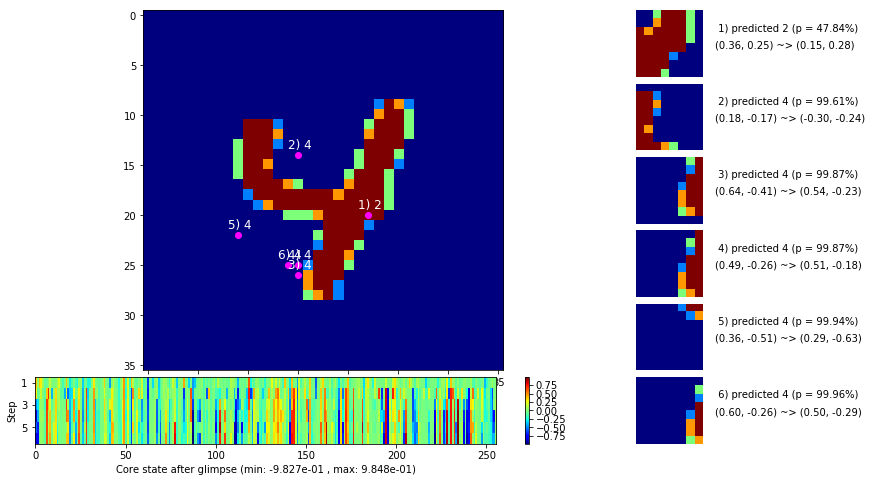

 b   2500/  3000 >> 140.7 ms/b | lr: 2.77e-05 | grad 2norm:  4.50 | grad inf norm:  1.099
       Weights || abs max:  1.24 (48373.73) | mean: -5.17e-03 ( 0.15) | var: 1.66e-02 (178184.53)
        Biases || abs max:  0.97 ( 2353.72) | mean:  1.67e-02 ( 1.31) | var: 6.46e-03 (135094.17)
                  class loss: 0.141 | steps: 2.043 | reward:  0.952 | acc.: 95.22%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.9 ms/b | lr: 2.71e-05 | grad 2norm:  4.42 | grad inf norm:  1.089
       Weights || abs max:  1.24 (32754.00) | mean: -5.17e-03 ( 0.11) | var: 1.66e-02 (34404.83)
        Biases || abs max:  0.97 (  723.01) | mean:  1.67e-02 ( 0.61) | var: 6.47e-03 ( 2243.29)
                  class loss: 0.137 | steps: 2.042 | reward:  0.955 | acc.: 95.45%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

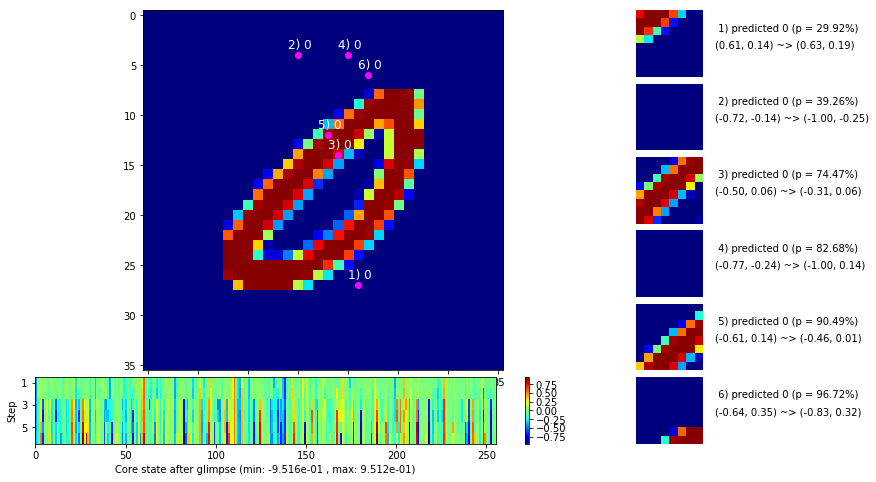

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


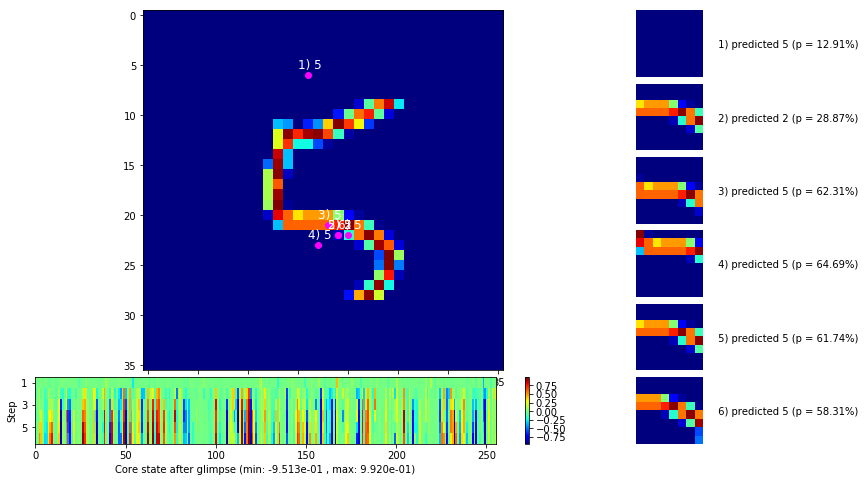


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


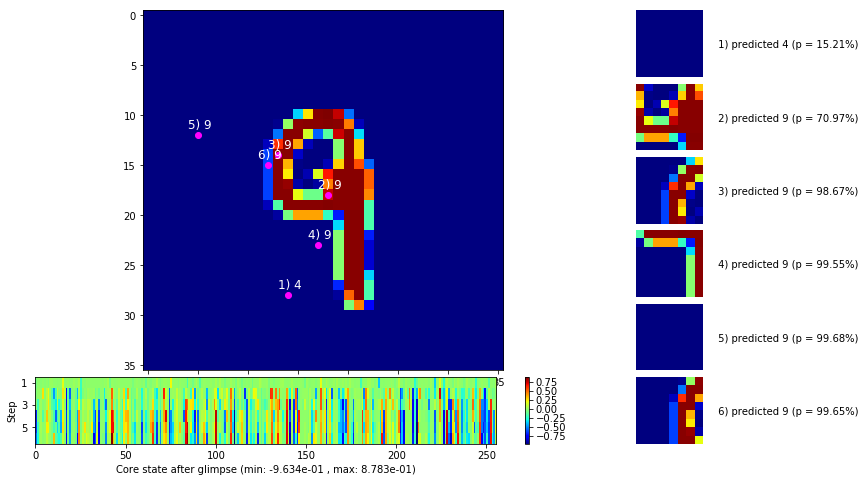

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


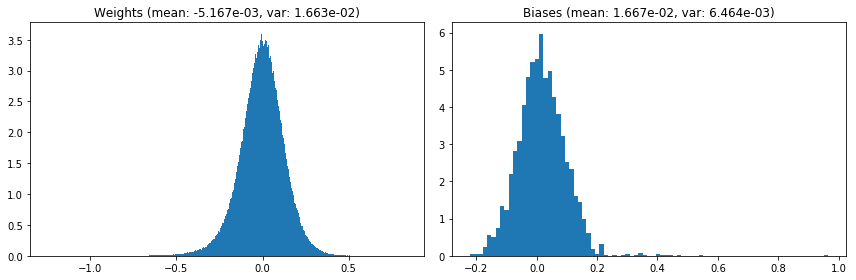

                                      Location network weights and biases


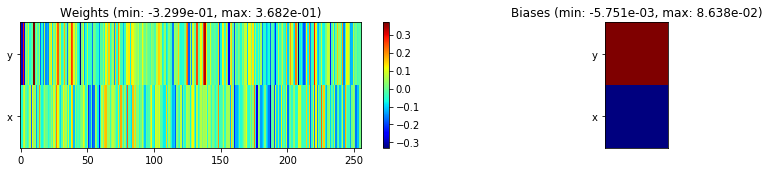

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.29 sec | TRAIN >> class loss: 0.1371 | steps:  2.046 :( | reward:  0.9544    | acc.: 95.440% 
                          | VAL   >> class loss: 0.1426 | steps:  1.928 :( | reward:  0.9530 :( | acc.: 95.300% :(


Epoch  25/400) lr = 2.683e-05
 b    500/  3000 >> 132.7 ms/b | lr: 2.63e-05 | grad 2norm:  4.32 | grad inf norm:  1.062
       Weights || abs max:  1.24 (16469.92) | mean: -5.16e-03 ( 0.08) | var: 1.66e-02 ( 6018.99)
        Biases || abs max:  0.97 ( 1235.55) | mean:  1.67e-02 ( 0.87) | var: 6.47e-03 (31033.56)
                  class loss: 0.141 | steps: 2.035 | reward:  0.955 | acc.: 95.50%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.1 ms/b | lr: 2.58e-05 | grad 2norm:  4.37 | grad inf norm:  1.053
       Weights || abs max:  1.24 (41494.83) | mean: -5.16e-03 ( 0.14) | v

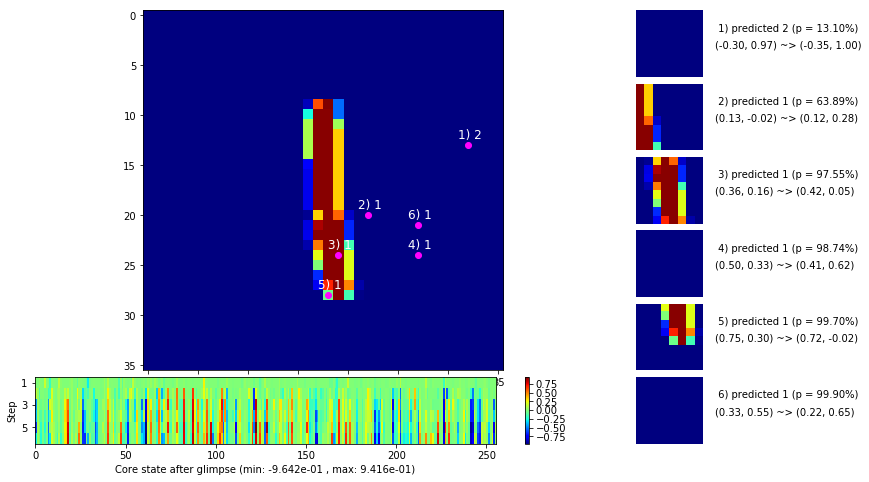

 b   1500/  3000 >> 134.0 ms/b | lr: 2.50e-05 | grad 2norm:  4.19 | grad inf norm:  1.042
       Weights || abs max:  1.24 (22933.74) | mean: -5.15e-03 ( 0.09) | var: 1.66e-02 (17519.00)
        Biases || abs max:  0.97 (  725.08) | mean:  1.67e-02 ( 0.67) | var: 6.46e-03 ( 5548.92)
                  class loss: 0.135 | steps: 2.040 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.0 ms/b | lr: 2.45e-05 | grad 2norm:  4.42 | grad inf norm:  1.076
       Weights || abs max:  1.24 (51206.64) | mean: -5.15e-03 ( 0.15) | var: 1.66e-02 (362429.41)
        Biases || abs max:  0.97 ( 2943.60) | mean:  1.67e-02 ( 1.73) | var: 6.47e-03 (258284.34)
                  class loss: 0.139 | steps: 2.021 | reward:  0.954 | acc.: 95.44%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

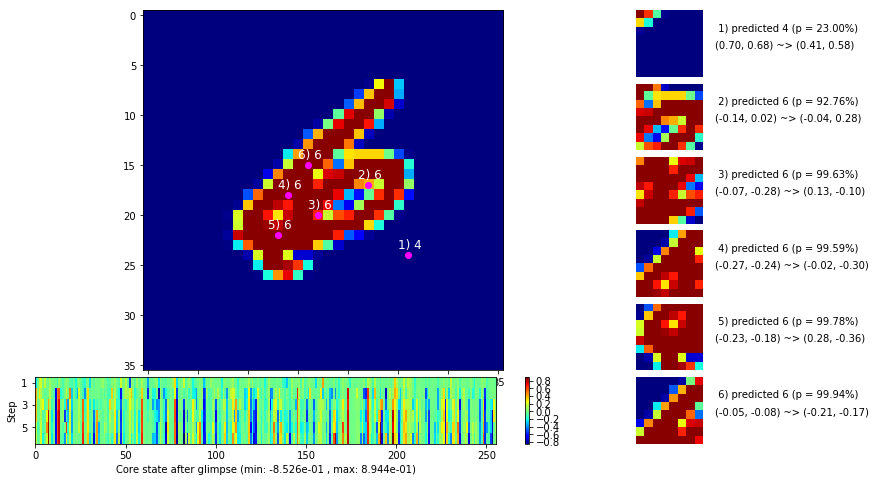

 b   2500/  3000 >> 133.7 ms/b | lr: 2.38e-05 | grad 2norm:  4.26 | grad inf norm:  1.066
       Weights || abs max:  1.24 (32681.38) | mean: -5.14e-03 ( 0.12) | var: 1.66e-02 (70030.35)
        Biases || abs max:  0.97 ( 1144.33) | mean:  1.68e-02 ( 0.91) | var: 6.47e-03 ( 4595.18)
                  class loss: 0.130 | steps: 2.027 | reward:  0.957 | acc.: 95.70%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.3 ms/b | lr: 2.33e-05 | grad 2norm:  4.24 | grad inf norm:  1.053
       Weights || abs max:  1.24 (23094.55) | mean: -5.13e-03 ( 0.10) | var: 1.66e-02 (11610.25)
        Biases || abs max:  0.97 ( 1040.45) | mean:  1.68e-02 ( 0.74) | var: 6.47e-03 (28555.94)
                  class loss: 0.126 | steps: 2.021 | reward:  0.957 | acc.: 95.71%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

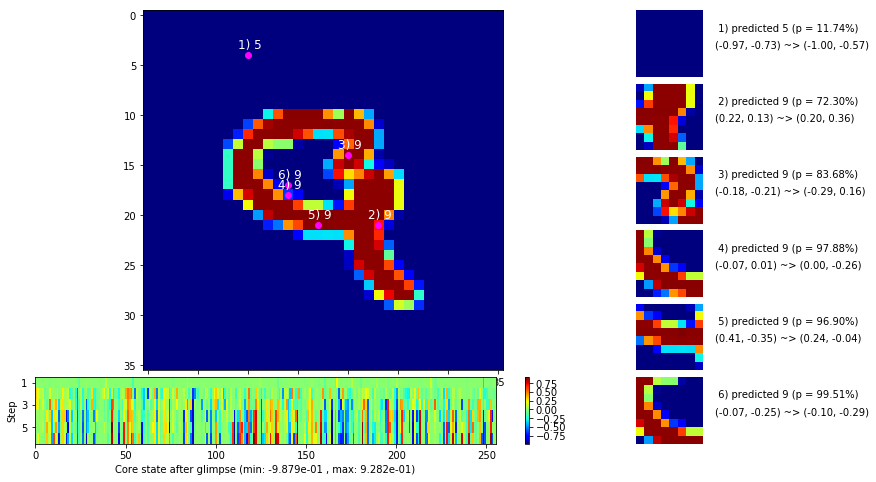

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


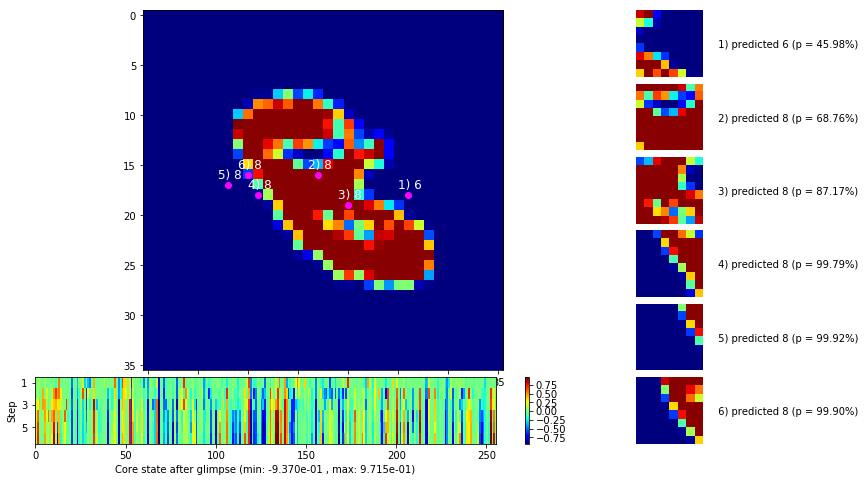


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


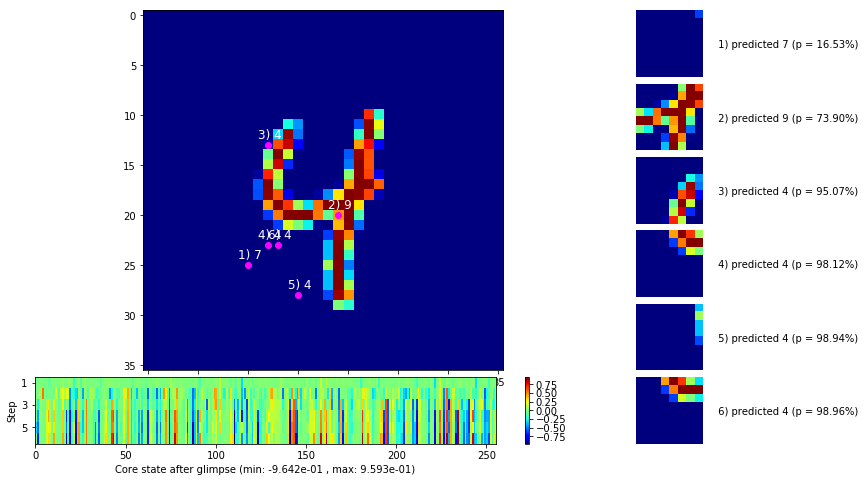

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


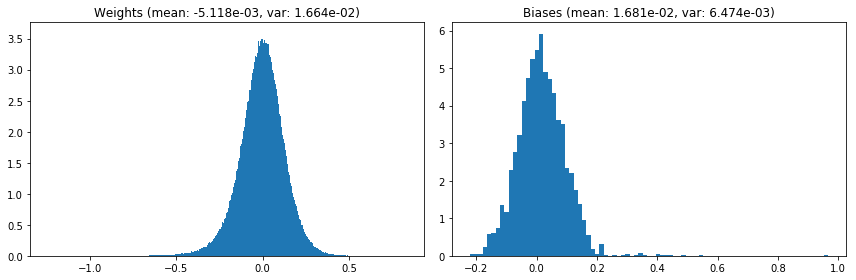

                                      Location network weights and biases


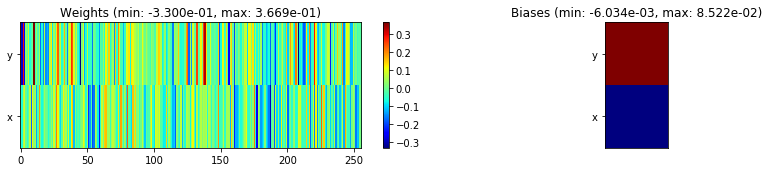

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.39 sec | TRAIN >> class loss: 0.1336 | steps:  2.030    | reward:  0.9562    | acc.: 95.615% 
                          | VAL   >> class loss: 0.1440 | steps:  1.913 :( | reward:  0.9550 :( | acc.: 95.500% :(


Epoch  26/400) lr = 2.308e-05
 b    500/  3000 >> 137.2 ms/b | lr: 2.26e-05 | grad 2norm:  4.17 | grad inf norm:  1.063
       Weights || abs max:  1.24 (71392.52) | mean: -5.11e-03 ( 0.18) | var: 1.66e-02 (542309.38)
        Biases || abs max:  0.97 (  244.58) | mean:  1.68e-02 ( 0.43) | var: 6.48e-03 ( 1472.78)
                  class loss: 0.137 | steps: 2.030 | reward:  0.958 | acc.: 95.81%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.7 ms/b | lr: 2.22e-05 | grad 2norm:  4.45 | grad inf norm:  1.108
       Weights || abs max:  1.24 (32964.54) | mean: -5.12e-03 ( 0.12) | 

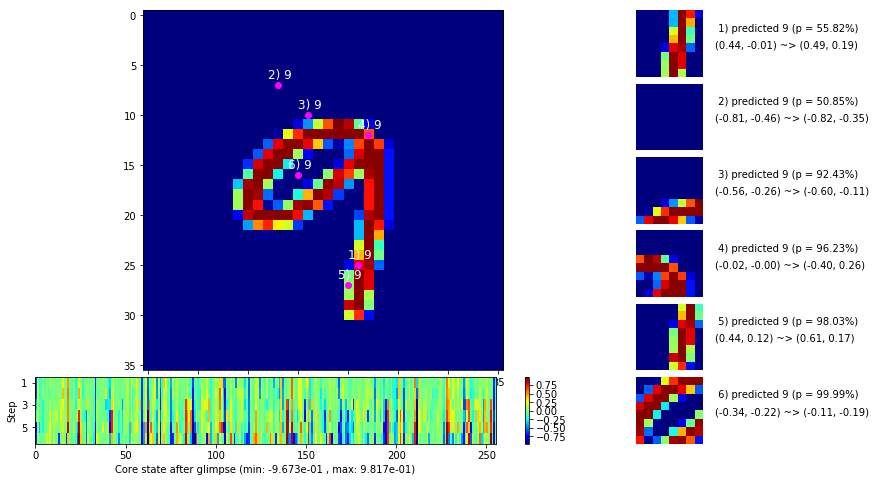

 b   1500/  3000 >> 134.0 ms/b | lr: 2.15e-05 | grad 2norm:  4.43 | grad inf norm:  1.089
       Weights || abs max:  1.24 (37990.98) | mean: -5.12e-03 ( 0.12) | var: 1.66e-02 (136870.02)
        Biases || abs max:  0.97 ( 1531.38) | mean:  1.68e-02 ( 1.32) | var: 6.48e-03 (29716.49)
                  class loss: 0.140 | steps: 2.040 | reward:  0.955 | acc.: 95.51%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.7 ms/b | lr: 2.11e-05 | grad 2norm:  4.30 | grad inf norm:  1.063
       Weights || abs max:  1.24 (46020.98) | mean: -5.11e-03 ( 0.13) | var: 1.66e-02 (229876.27)
        Biases || abs max:  0.97 ( 5204.17) | mean:  1.68e-02 ( 2.57) | var: 6.48e-03 (3805278.50)
                  class loss: 0.136 | steps: 2.033 | reward:  0.956 | acc.: 95.57%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

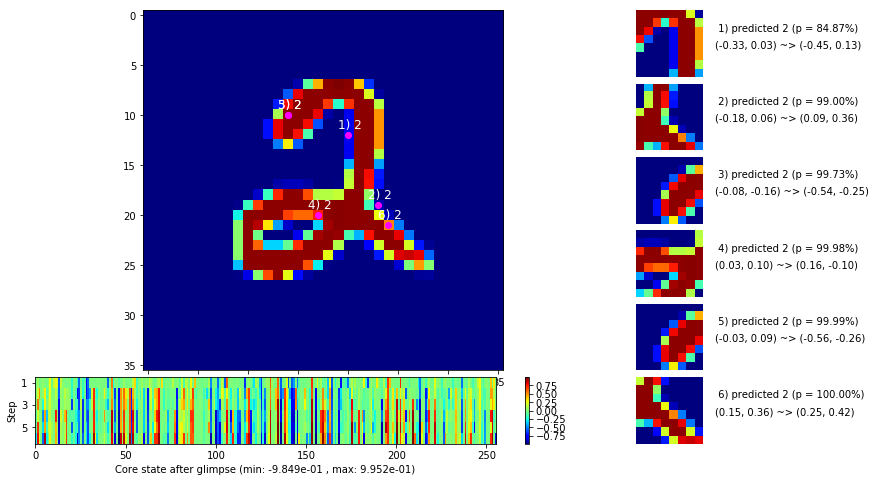

 b   2500/  3000 >> 134.0 ms/b | lr: 2.05e-05 | grad 2norm:  4.39 | grad inf norm:  1.076
       Weights || abs max:  1.24 (82996.62) | mean: -5.10e-03 ( 0.20) | var: 1.66e-02 (765619.19)
        Biases || abs max:  0.97 ( 1121.65) | mean:  1.68e-02 ( 0.88) | var: 6.47e-03 (10447.11)
                  class loss: 0.133 | steps: 2.021 | reward:  0.955 | acc.: 95.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.9 ms/b | lr: 2.00e-05 | grad 2norm:  4.25 | grad inf norm:  1.044
       Weights || abs max:  1.24 (15469.82) | mean: -5.10e-03 ( 0.08) | var: 1.66e-02 ( 7448.32)
        Biases || abs max:  0.97 ( 5122.07) | mean:  1.69e-02 ( 4.21) | var: 6.47e-03 (6295991.00)
                  class loss: 0.129 | steps: 2.025 | reward:  0.958 | acc.: 95.79%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

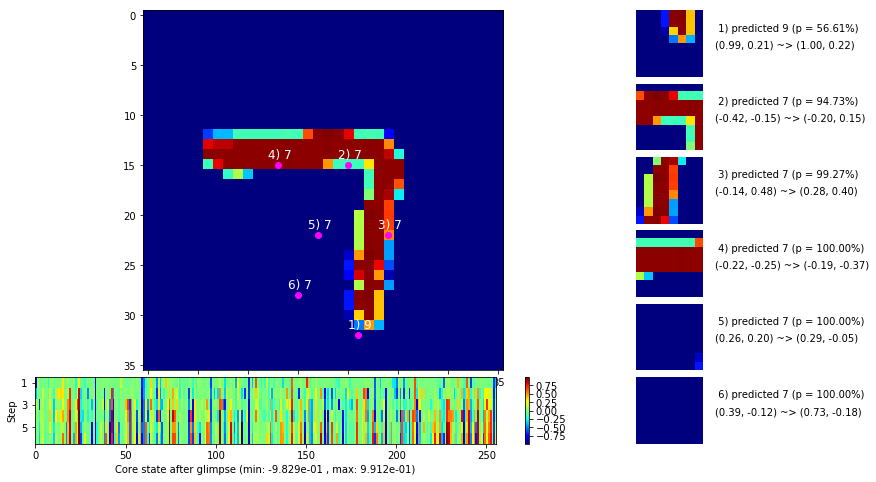

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


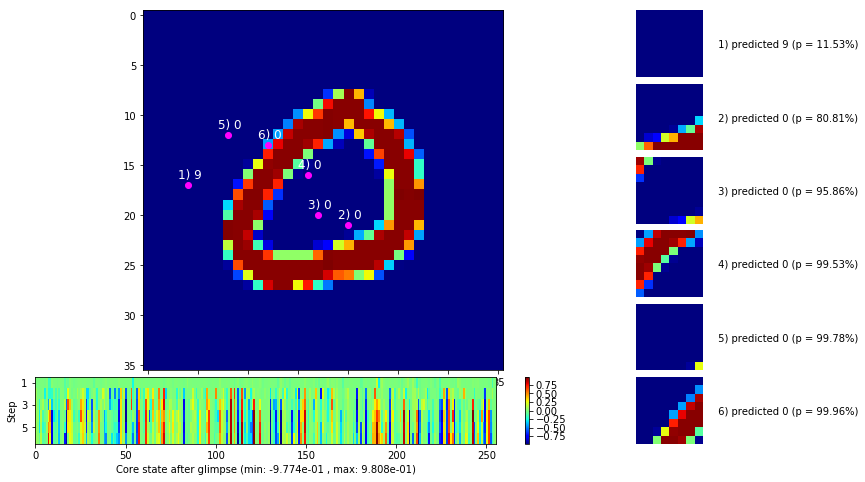


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


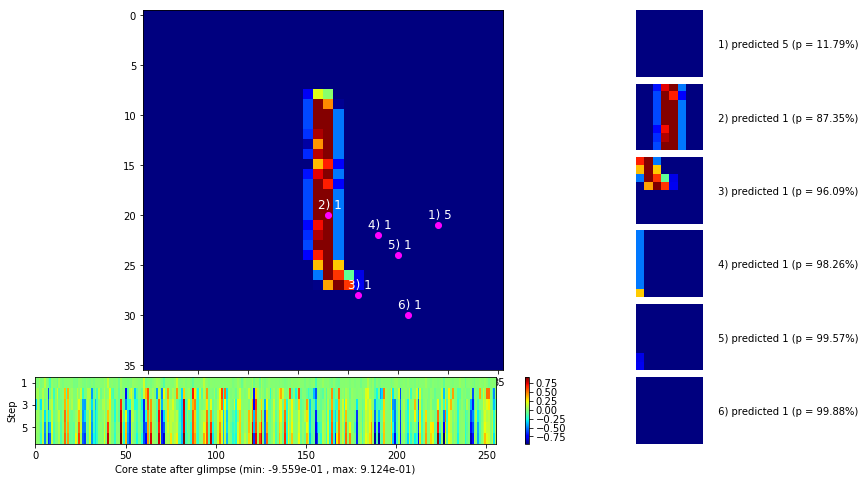

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


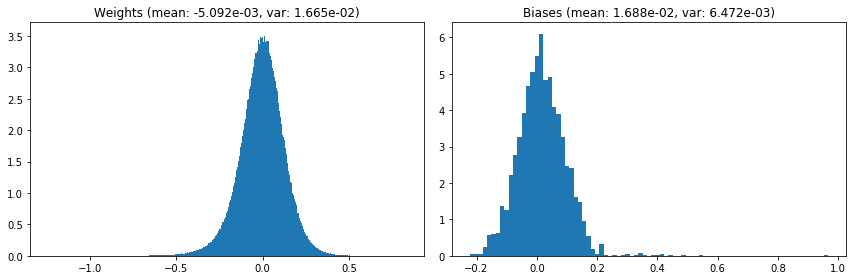

                                      Location network weights and biases


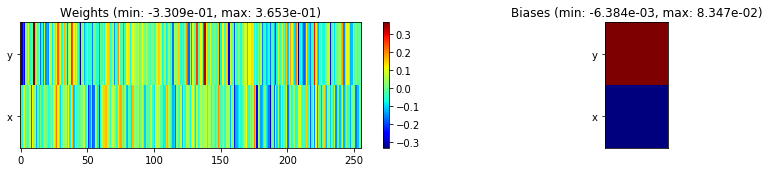

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.90 sec | TRAIN >> class loss: 0.1365 | steps:  2.030    | reward:  0.9557 :( | acc.: 95.572% :(
                          | VAL   >> class loss: 0.1465 | steps:  1.955 :( | reward:  0.9552 :( | acc.: 95.520% :(


Epoch  27/400) lr = 1.985e-05
 b    500/  3000 >> 131.6 ms/b | lr: 1.95e-05 | grad 2norm:  4.39 | grad inf norm:  1.070
       Weights || abs max:  1.24 (22320.53) | mean: -5.09e-03 ( 0.09) | var: 1.66e-02 (26749.21)
        Biases || abs max:  0.97 ( 1436.97) | mean:  1.69e-02 ( 1.13) | var: 6.47e-03 (35427.71)
                  class loss: 0.135 | steps: 2.045 | reward:  0.954 | acc.: 95.43%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.91e-05 | grad 2norm:  4.31 | grad inf norm:  1.039
       Weights || abs max:  1.24 (19490.09) | mean: -5.09e-03 ( 0.08) |

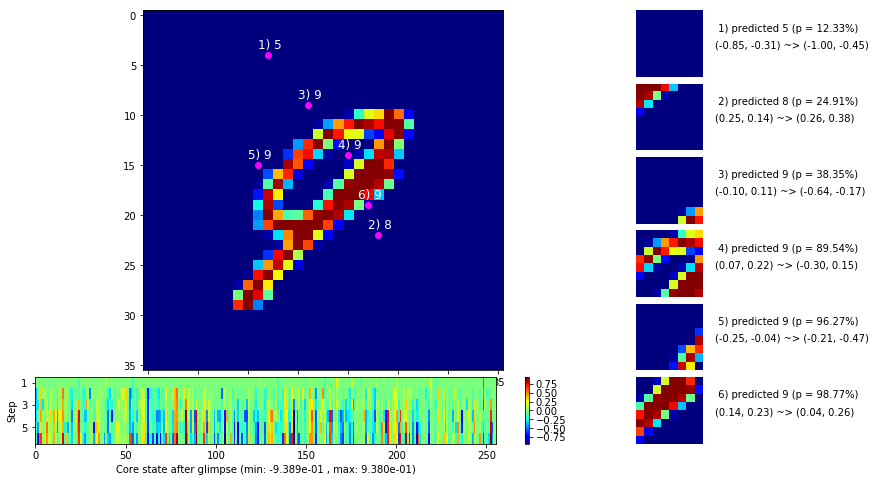

 b   1500/  3000 >> 132.6 ms/b | lr: 1.85e-05 | grad 2norm:  4.55 | grad inf norm:  1.101
       Weights || abs max:  1.24 (18868.62) | mean: -5.09e-03 ( 0.09) | var: 1.67e-02 (11399.06)
        Biases || abs max:  0.97 ( 1037.19) | mean:  1.69e-02 ( 0.87) | var: 6.47e-03 (39992.35)
                  class loss: 0.145 | steps: 2.056 | reward:  0.953 | acc.: 95.25%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 139.0 ms/b | lr: 1.81e-05 | grad 2norm:  4.31 | grad inf norm:  1.076
       Weights || abs max:  1.25 (69944.03) | mean: -5.09e-03 ( 0.18) | var: 1.67e-02 (1288552.12)
        Biases || abs max:  0.97 ( 1001.27) | mean:  1.69e-02 ( 0.85) | var: 6.47e-03 ( 6403.60)
                  class loss: 0.131 | steps: 2.021 | reward:  0.956 | acc.: 95.58%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

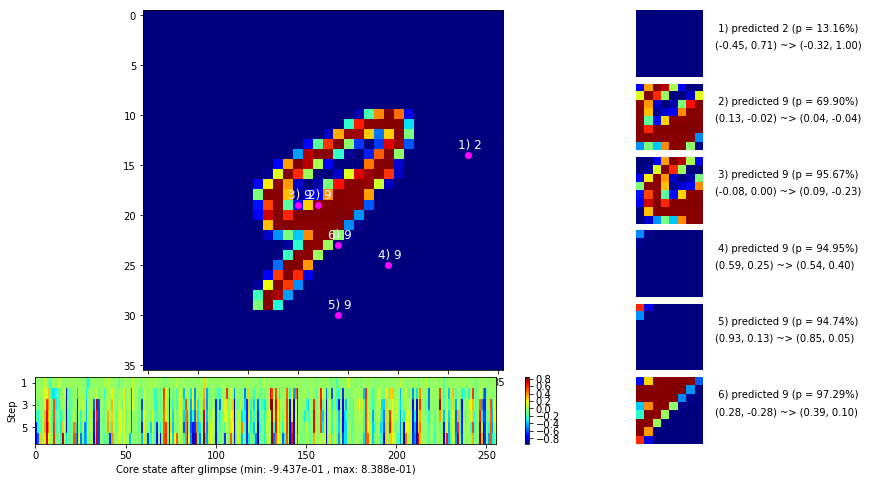

 b   2500/  3000 >> 133.4 ms/b | lr: 1.76e-05 | grad 2norm:  4.30 | grad inf norm:  1.085
       Weights || abs max:  1.25 (29885.64) | mean: -5.09e-03 ( 0.11) | var: 1.67e-02 (25381.57)
        Biases || abs max:  0.97 (  457.42) | mean:  1.69e-02 ( 0.61) | var: 6.47e-03 (  810.75)
                  class loss: 0.140 | steps: 2.014 | reward:  0.955 | acc.: 95.54%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.4 ms/b | lr: 1.72e-05 | grad 2norm:  4.44 | grad inf norm:  1.048
       Weights || abs max:  1.25 (28787.40) | mean: -5.10e-03 ( 0.11) | var: 1.67e-02 (127633.55)
        Biases || abs max:  0.97 ( 4225.61) | mean:  1.69e-02 ( 2.61) | var: 6.47e-03 (942646.69)
                  class loss: 0.133 | steps: 2.025 | reward:  0.955 | acc.: 95.54%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

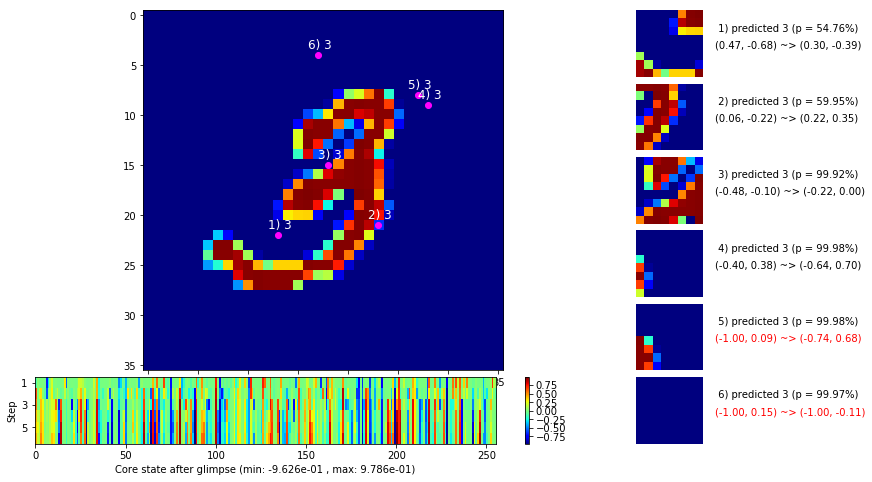

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


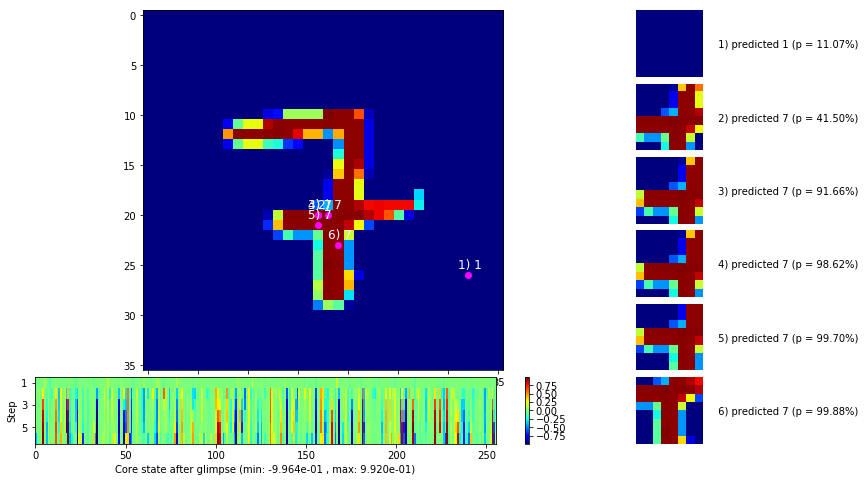


	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


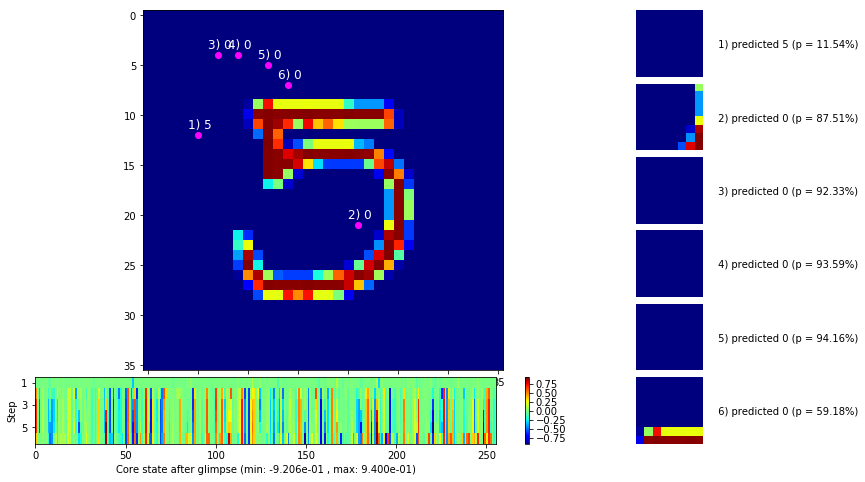

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


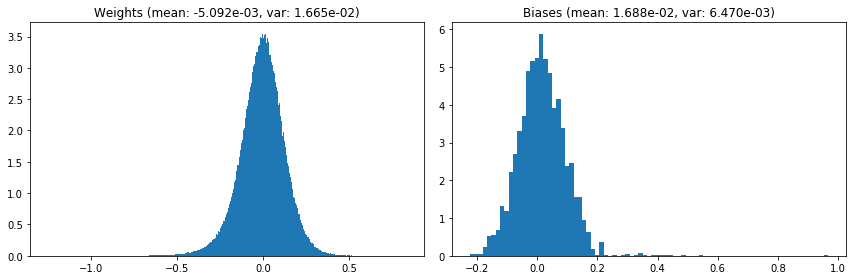

                                      Location network weights and biases


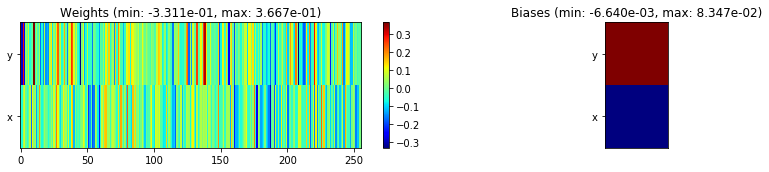

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.54 sec | TRAIN >> class loss: 0.1344 | steps:  2.032 :( | reward:  0.9549 :( | acc.: 95.493% :(
                          | VAL   >> class loss: 0.1521 | steps:  1.948 :( | reward:  0.9512 :( | acc.: 95.120% :(


Epoch  28/400) lr = 1.707e-05
 b    500/  3000 >> 131.1 ms/b | lr: 1.67e-05 | grad 2norm:  4.24 | grad inf norm:  1.057
       Weights || abs max:  1.25 (75326.17) | mean: -5.09e-03 ( 0.18) | var: 1.67e-02 (942857.75)
        Biases || abs max:  0.97 ( 1670.66) | mean:  1.69e-02 ( 1.03) | var: 6.47e-03 (32131.21)
                  class loss: 0.137 | steps: 2.025 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.64e-05 | grad 2norm:  4.36 | grad inf norm:  1.114
       Weights || abs max:  1.25 (15203.07) | mean: -5.08e-03 ( 0.08) 

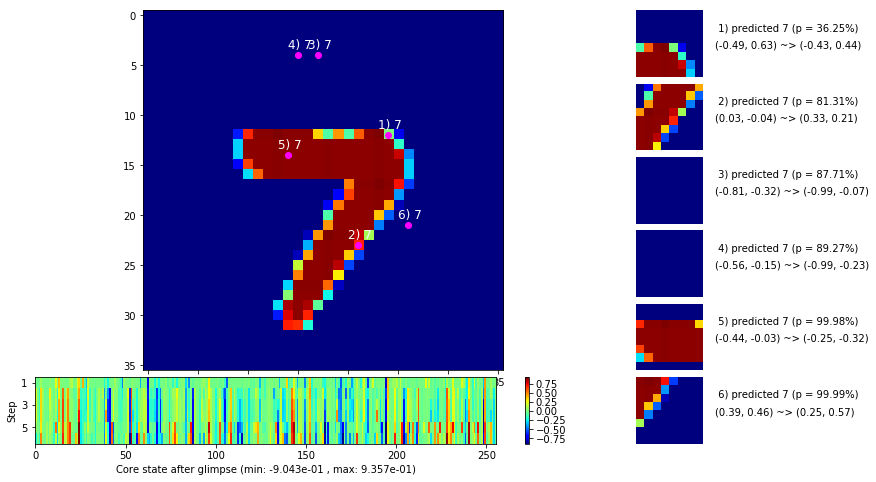

 b   1500/  3000 >> 133.3 ms/b | lr: 1.59e-05 | grad 2norm:  4.27 | grad inf norm:  1.058
       Weights || abs max:  1.25 (12075.28) | mean: -5.07e-03 ( 0.07) | var: 1.67e-02 ( 8403.48)
        Biases || abs max:  0.97 ( 2795.37) | mean:  1.69e-02 ( 1.95) | var: 6.47e-03 (26649.97)
                  class loss: 0.134 | steps: 2.041 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.4 ms/b | lr: 1.56e-05 | grad 2norm:  4.28 | grad inf norm:  1.016
       Weights || abs max:  1.25 (32655.19) | mean: -5.07e-03 ( 0.12) | var: 1.67e-02 (26755.51)
        Biases || abs max:  0.97 ( 2242.42) | mean:  1.69e-02 ( 1.32) | var: 6.48e-03 (81344.30)
                  class loss: 0.128 | steps: 2.022 | reward:  0.958 | acc.: 95.80%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

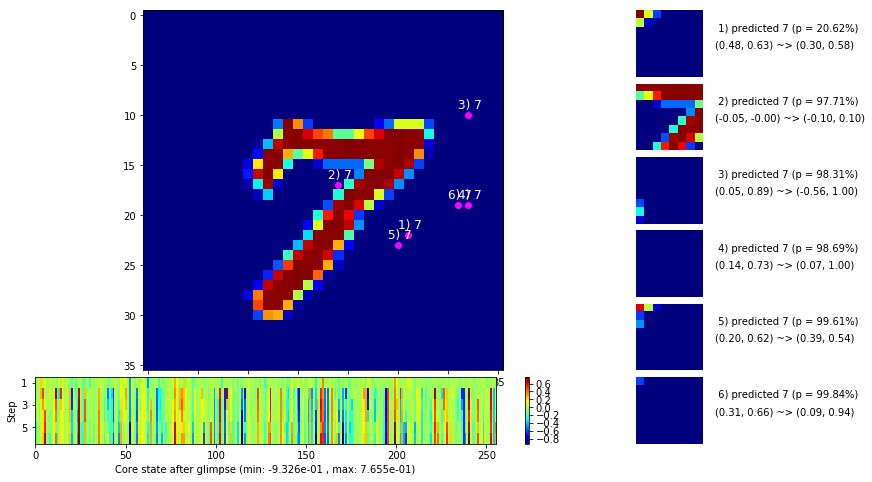

 b   2500/  3000 >> 133.5 ms/b | lr: 1.51e-05 | grad 2norm:  4.40 | grad inf norm:  1.099
       Weights || abs max:  1.25 (31656.21) | mean: -5.07e-03 ( 0.12) | var: 1.67e-02 (22455.97)
        Biases || abs max:  0.97 ( 2054.30) | mean:  1.69e-02 ( 1.35) | var: 6.48e-03 (77493.42)
                  class loss: 0.142 | steps: 2.027 | reward:  0.954 | acc.: 95.39%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.9 ms/b | lr: 1.48e-05 | grad 2norm:  4.14 | grad inf norm:  1.027
       Weights || abs max:  1.25 (50962.12) | mean: -5.06e-03 ( 0.15) | var: 1.67e-02 (104741.66)
        Biases || abs max:  0.97 (  652.37) | mean:  1.70e-02 ( 0.71) | var: 6.48e-03 (  864.67)
                  class loss: 0.125 | steps: 2.024 | reward:  0.960 | acc.: 95.95%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

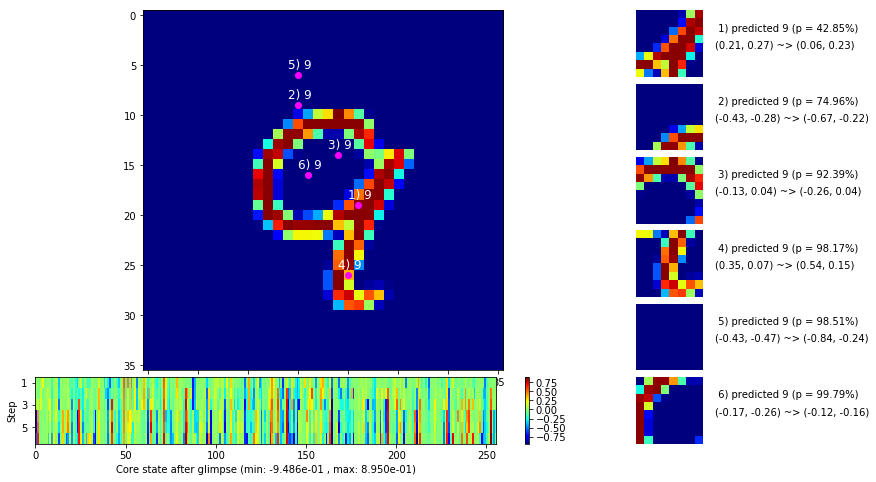

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


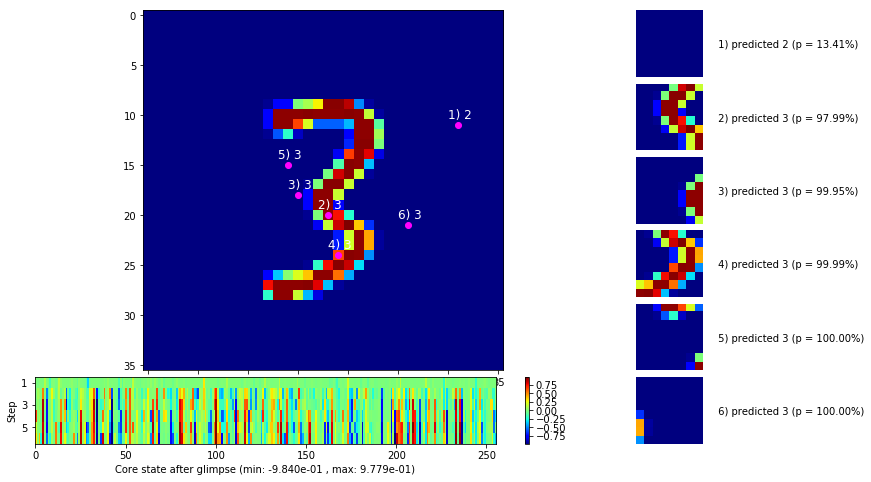


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


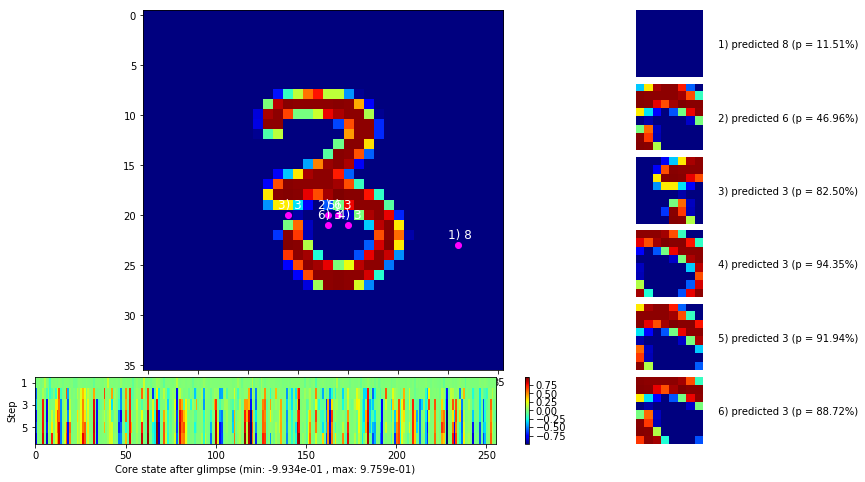

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


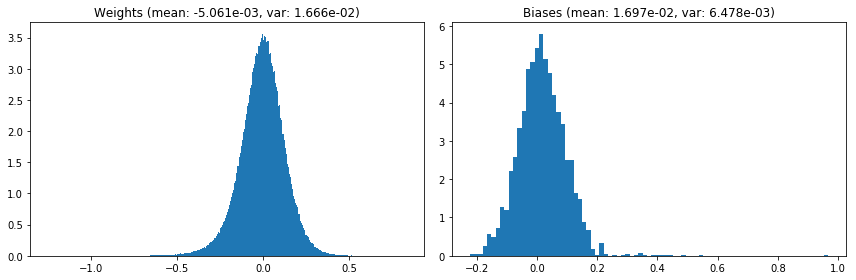

                                      Location network weights and biases


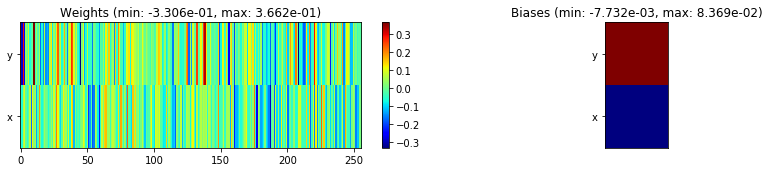

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.12 sec | TRAIN >> class loss: 0.1327 | steps:  2.029    | reward:  0.9566    | acc.: 95.660% 
                          | VAL   >> class loss: 0.1439 | steps:  1.895    | reward:  0.9520 :( | acc.: 95.200% :(


Epoch  29/400) lr = 1.468e-05
 b    500/  3000 >> 139.4 ms/b | lr: 1.44e-05 | grad 2norm:  4.29 | grad inf norm:  1.051
       Weights || abs max:  1.25 (58488.77) | mean: -5.06e-03 ( 0.17) | var: 1.67e-02 (424927.31)
        Biases || abs max:  0.97 (  761.67) | mean:  1.70e-02 ( 0.76) | var: 6.48e-03 ( 3002.25)
                  class loss: 0.132 | steps: 2.029 | reward:  0.956 | acc.: 95.60%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.3 ms/b | lr: 1.41e-05 | grad 2norm:  4.43 | grad inf norm:  1.100
       Weights || abs max:  1.25 (64125.43) | mean: -5.06e-03 ( 0.18) | 

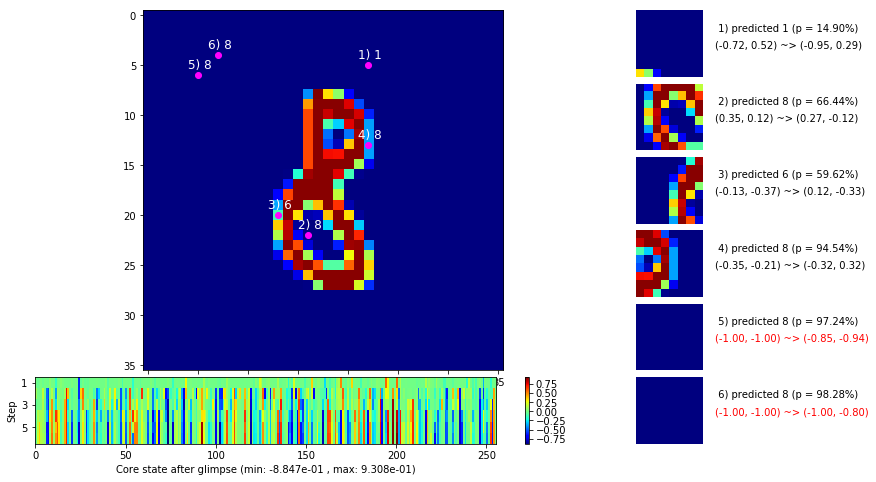

 b   1500/  3000 >> 134.1 ms/b | lr: 1.37e-05 | grad 2norm:  4.43 | grad inf norm:  1.076
       Weights || abs max:  1.25 (66593.59) | mean: -5.07e-03 ( 0.19) | var: 1.67e-02 (153282.56)
        Biases || abs max:  0.97 ( 2787.71) | mean:  1.69e-02 ( 1.77) | var: 6.48e-03 (350279.16)
                  class loss: 0.138 | steps: 2.033 | reward:  0.954 | acc.: 95.43%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 1.34e-05 | grad 2norm:  4.64 | grad inf norm:  1.111
       Weights || abs max:  1.25 (30504.97) | mean: -5.07e-03 ( 0.12) | var: 1.67e-02 (14866.56)
        Biases || abs max:  0.97 (  424.55) | mean:  1.69e-02 ( 0.68) | var: 6.48e-03 ( 2501.68)
                  class loss: 0.147 | steps: 2.025 | reward:  0.952 | acc.: 95.17%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

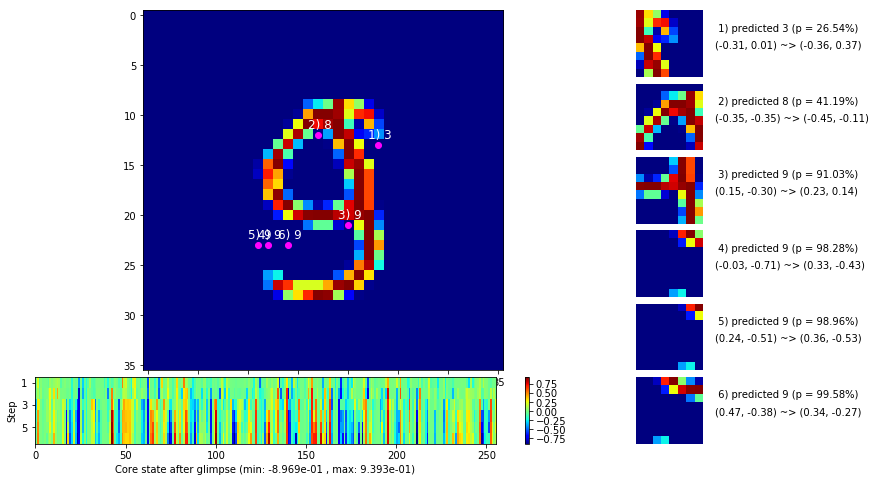

 b   2500/  3000 >> 134.7 ms/b | lr: 1.30e-05 | grad 2norm:  4.18 | grad inf norm:  1.057
       Weights || abs max:  1.25 (37813.06) | mean: -5.07e-03 ( 0.14) | var: 1.67e-02 (57606.36)
        Biases || abs max:  0.97 (  343.90) | mean:  1.69e-02 ( 0.58) | var: 6.48e-03 (  753.98)
                  class loss: 0.129 | steps: 2.036 | reward:  0.958 | acc.: 95.84%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.9 ms/b | lr: 1.28e-05 | grad 2norm:  4.33 | grad inf norm:  1.066
       Weights || abs max:  1.25 (117077.98) | mean: -5.07e-03 ( 0.27) | var: 1.67e-02 (3209244.25)
        Biases || abs max:  0.97 ( 1091.27) | mean:  1.69e-02 ( 1.19) | var: 6.48e-03 (64293.76)
                  class loss: 0.129 | steps: 2.036 | reward:  0.956 | acc.: 95.57%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

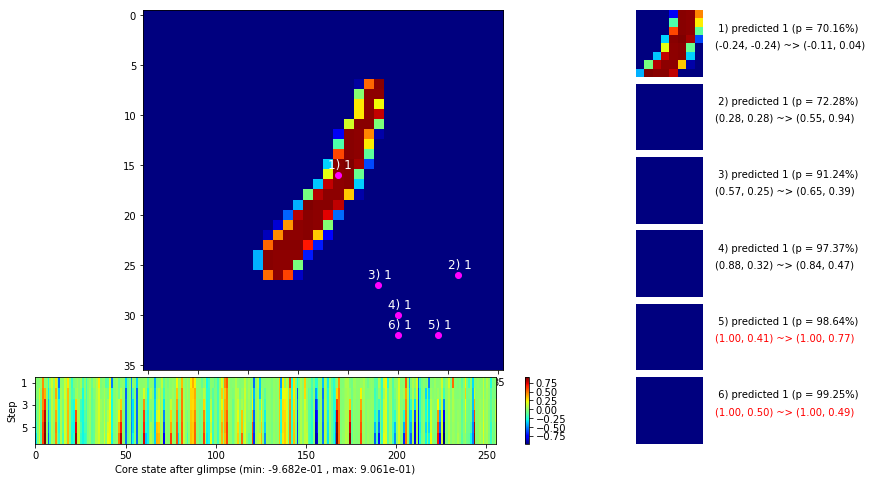

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


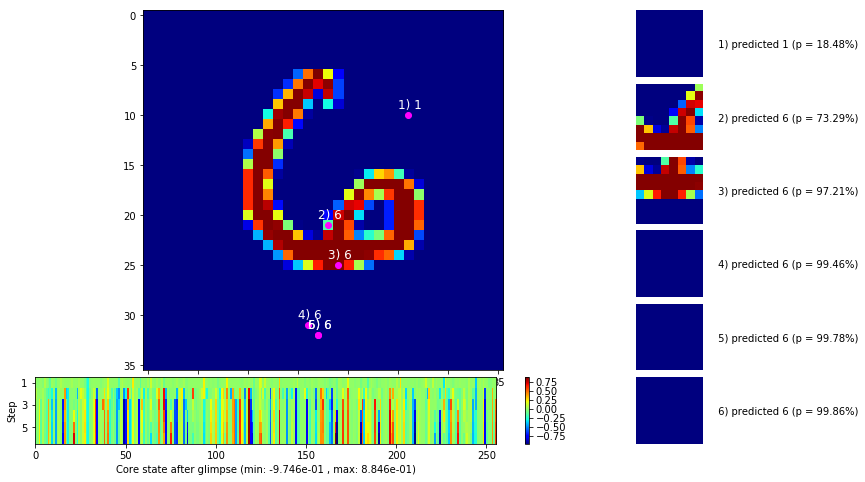


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


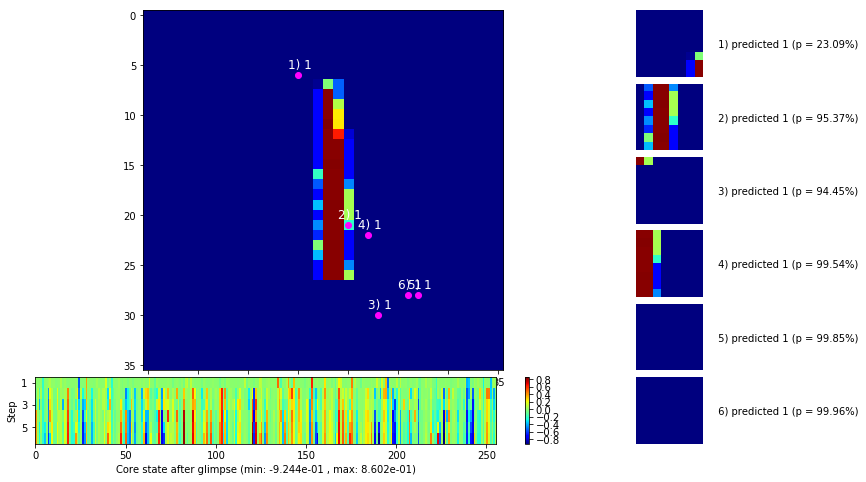

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


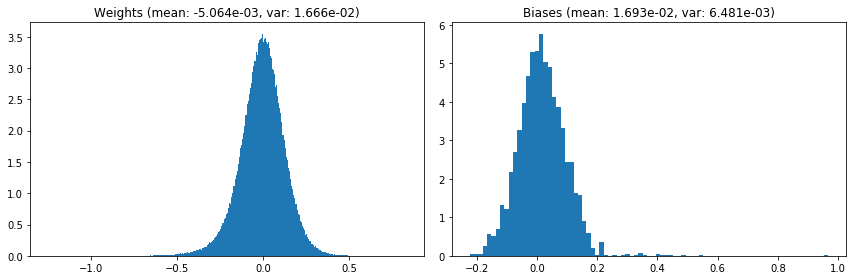

                                      Location network weights and biases


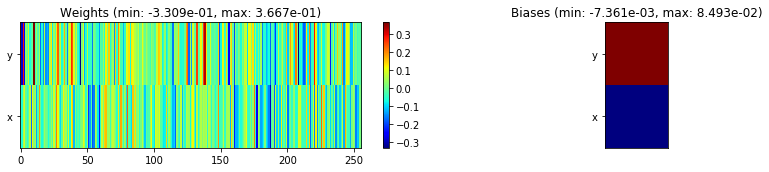

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.48 sec | TRAIN >> class loss: 0.1362 | steps:  2.030 :( | reward:  0.9550 :( | acc.: 95.503% :(
                          | VAL   >> class loss: 0.1426 | steps:  1.936 :( | reward:  0.9524 :( | acc.: 95.240% :(


Epoch  30/400) lr = 1.263e-05
 b    500/  3000 >> 133.0 ms/b | lr: 1.24e-05 | grad 2norm:  4.32 | grad inf norm:  1.068
       Weights || abs max:  1.25 (12993.86) | mean: -5.07e-03 ( 0.08) | var: 1.67e-02 ( 3277.82)
        Biases || abs max:  0.97 ( 2607.31) | mean:  1.69e-02 ( 1.82) | var: 6.48e-03 (83368.95)
                  class loss: 0.140 | steps: 2.032 | reward:  0.955 | acc.: 95.53%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.0 ms/b | lr: 1.21e-05 | grad 2norm:  4.16 | grad inf norm:  1.036
       Weights || abs max:  1.25 (41302.20) | mean: -5.06e-03 ( 0.13) |

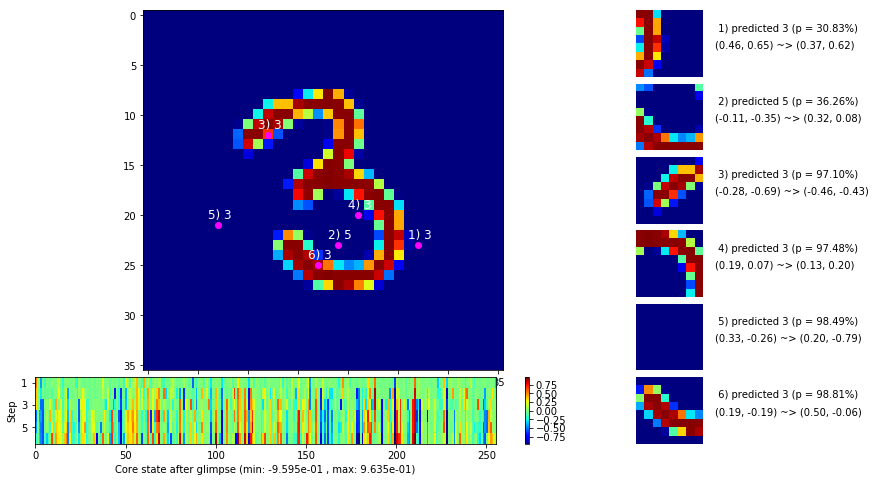

 b   1500/  3000 >> 134.2 ms/b | lr: 1.18e-05 | grad 2norm:  4.24 | grad inf norm:  1.053
       Weights || abs max:  1.25 (67933.32) | mean: -5.06e-03 ( 0.19) | var: 1.67e-02 (246456.31)
        Biases || abs max:  0.97 (  989.67) | mean:  1.70e-02 ( 0.85) | var: 6.48e-03 (13082.28)
                  class loss: 0.129 | steps: 2.034 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 141.6 ms/b | lr: 1.15e-05 | grad 2norm:  4.34 | grad inf norm:  1.072
       Weights || abs max:  1.25 (21742.01) | mean: -5.06e-03 ( 0.11) | var: 1.67e-02 ( 6067.82)
        Biases || abs max:  0.97 (  646.23) | mean:  1.69e-02 ( 0.78) | var: 6.48e-03 ( 1702.22)
                  class loss: 0.139 | steps: 2.011 | reward:  0.955 | acc.: 95.50%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

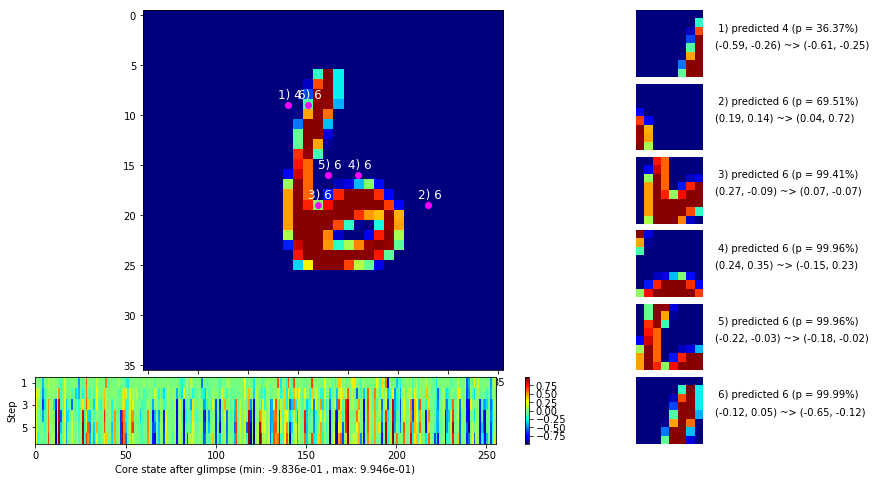

 b   2500/  3000 >> 134.5 ms/b | lr: 1.12e-05 | grad 2norm:  4.27 | grad inf norm:  1.052
       Weights || abs max:  1.25 (64316.33) | mean: -5.06e-03 ( 0.18) | var: 1.67e-02 (652944.94)
        Biases || abs max:  0.97 ( 1373.64) | mean:  1.69e-02 ( 0.97) | var: 6.48e-03 (14703.79)
                  class loss: 0.135 | steps: 2.029 | reward:  0.957 | acc.: 95.71%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 1.10e-05 | grad 2norm:  4.33 | grad inf norm:  1.047
       Weights || abs max:  1.25 (31884.29) | mean: -5.06e-03 ( 0.12) | var: 1.67e-02 (45868.75)
        Biases || abs max:  0.97 (  456.71) | mean:  1.70e-02 ( 0.53) | var: 6.48e-03 ( 6401.85)
                  class loss: 0.131 | steps: 2.019 | reward:  0.957 | acc.: 95.66%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

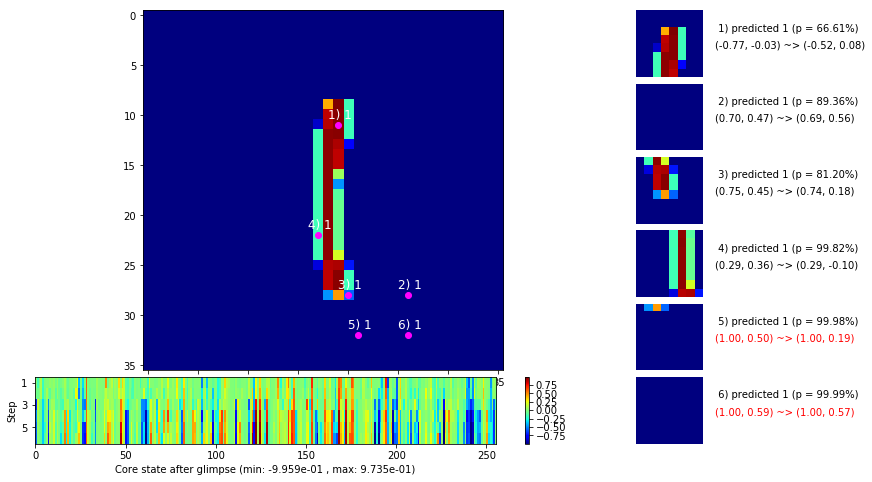

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


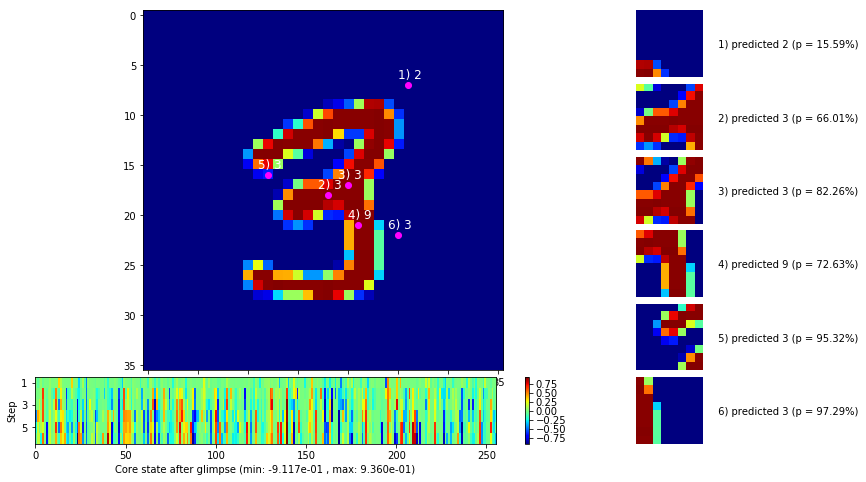


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


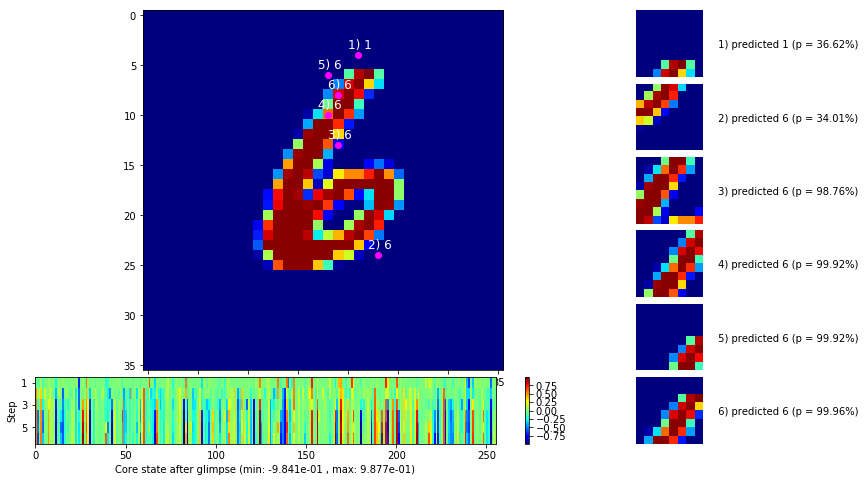

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


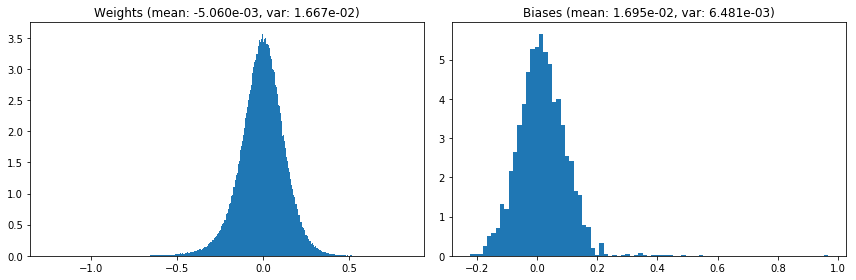

                                      Location network weights and biases


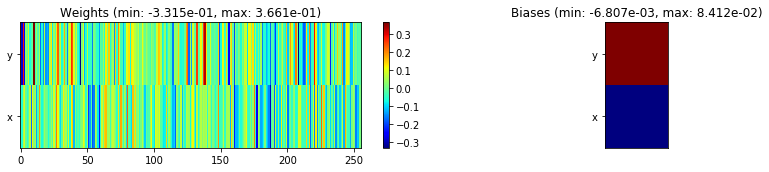

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.39 sec | TRAIN >> class loss: 0.1337 | steps:  2.027    | reward:  0.9566    | acc.: 95.662% 
                          | VAL   >> class loss: 0.1444 | steps:  1.896 :( | reward:  0.9532 :( | acc.: 95.320% :(


Epoch  31/400) lr = 1.086e-05
 b    500/  3000 >> 132.0 ms/b | lr: 1.06e-05 | grad 2norm:  4.41 | grad inf norm:  1.080
       Weights || abs max:  1.25 (34118.12) | mean: -5.06e-03 ( 0.12) | var: 1.67e-02 (30820.82)
        Biases || abs max:  0.97 ( 1140.35) | mean:  1.69e-02 ( 0.93) | var: 6.48e-03 (13430.20)
                  class loss: 0.135 | steps: 2.024 | reward:  0.955 | acc.: 95.53%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.0 ms/b | lr: 1.04e-05 | grad 2norm:  4.24 | grad inf norm:  1.040
       Weights || abs max:  1.25 (38450.13) | mean: -5.06e-03 ( 0.13) | v

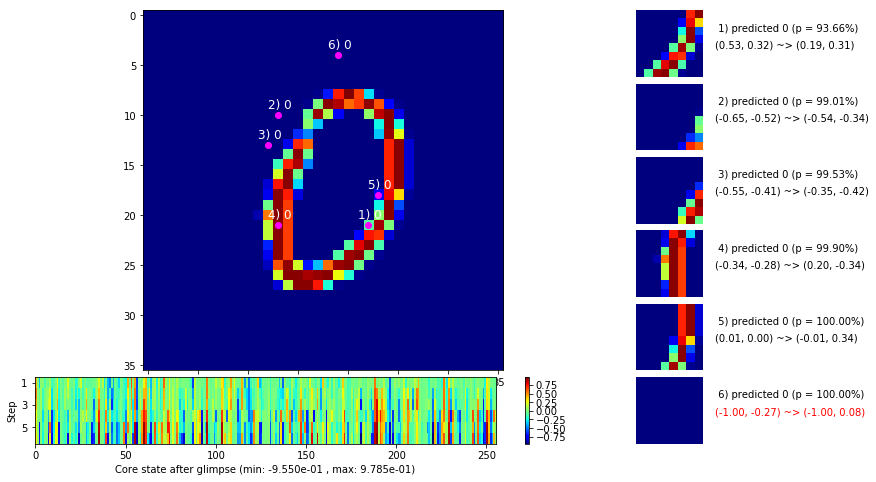

 b   1500/  3000 >> 133.1 ms/b | lr: 1.01e-05 | grad 2norm:  4.19 | grad inf norm:  1.081
       Weights || abs max:  1.25 (96209.01) | mean: -5.06e-03 ( 0.23) | var: 1.67e-02 (2604934.25)
        Biases || abs max:  0.97 (  261.36) | mean:  1.69e-02 ( 0.50) | var: 6.48e-03 (  886.82)
                  class loss: 0.133 | steps: 2.031 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 9.92e-06 | grad 2norm:  4.05 | grad inf norm:  1.042
       Weights || abs max:  1.25 (19215.50) | mean: -5.05e-03 ( 0.09) | var: 1.67e-02 ( 6987.51)
        Biases || abs max:  0.97 (  857.68) | mean:  1.70e-02 ( 0.84) | var: 6.48e-03 ( 6435.15)
                  class loss: 0.123 | steps: 2.020 | reward:  0.959 | acc.: 95.91%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

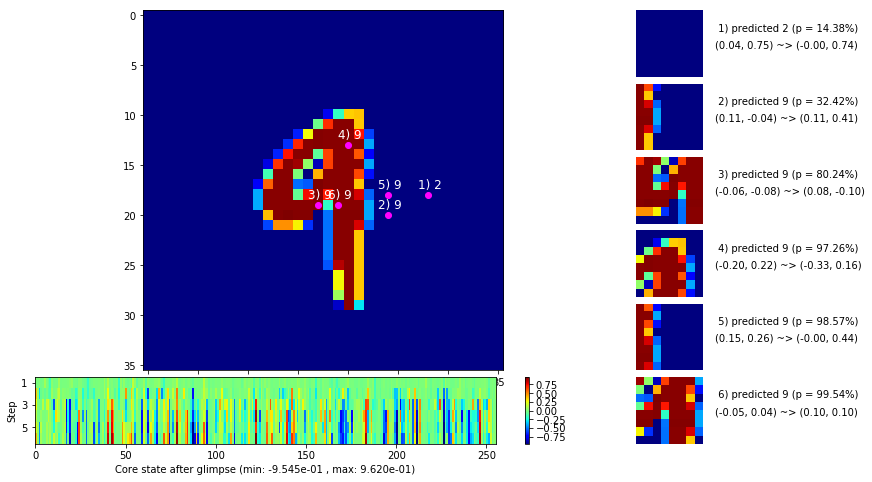

 b   2500/  3000 >> 134.1 ms/b | lr: 9.63e-06 | grad 2norm:  4.47 | grad inf norm:  1.060
       Weights || abs max:  1.25 (575149.19) | mean: -5.05e-03 ( 1.02) | var: 1.67e-02 (256195984.00)
        Biases || abs max:  0.97 ( 1220.19) | mean:  1.70e-02 ( 1.04) | var: 6.48e-03 (20810.62)
                  class loss: 0.133 | steps: 2.038 | reward:  0.954 | acc.: 95.41%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.0 ms/b | lr: 9.43e-06 | grad 2norm:  4.56 | grad inf norm:  1.137
       Weights || abs max:  1.25 (16423.16) | mean: -5.06e-03 ( 0.09) | var: 1.67e-02 ( 4540.75)
        Biases || abs max:  0.97 (  663.20) | mean:  1.70e-02 ( 0.81) | var: 6.48e-03 ( 4372.38)
                  class loss: 0.146 | steps: 2.039 | reward:  0.953 | acc.: 95.25%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

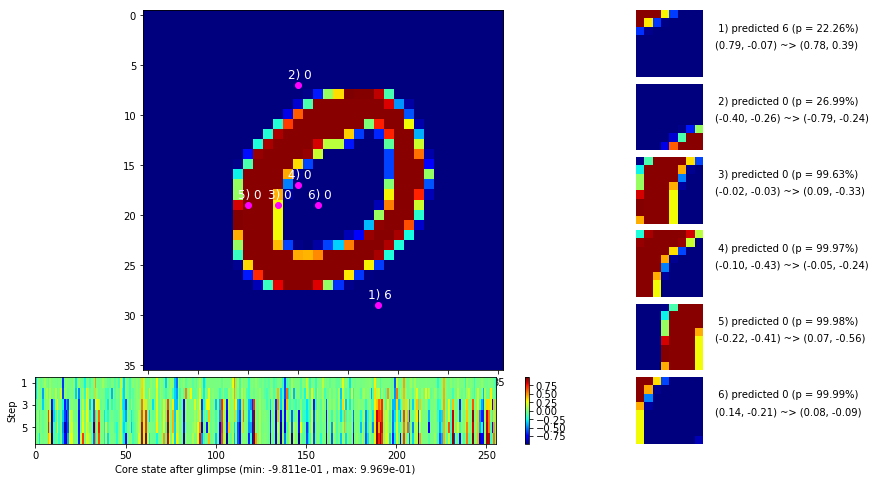

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


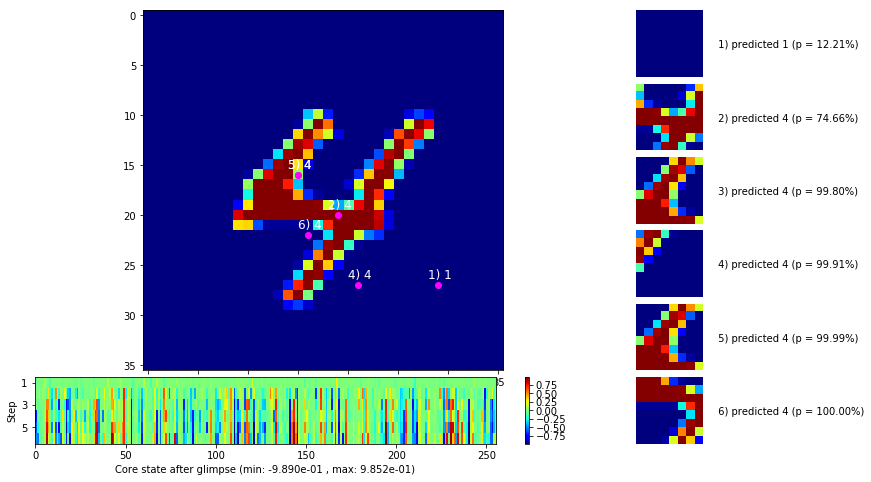


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


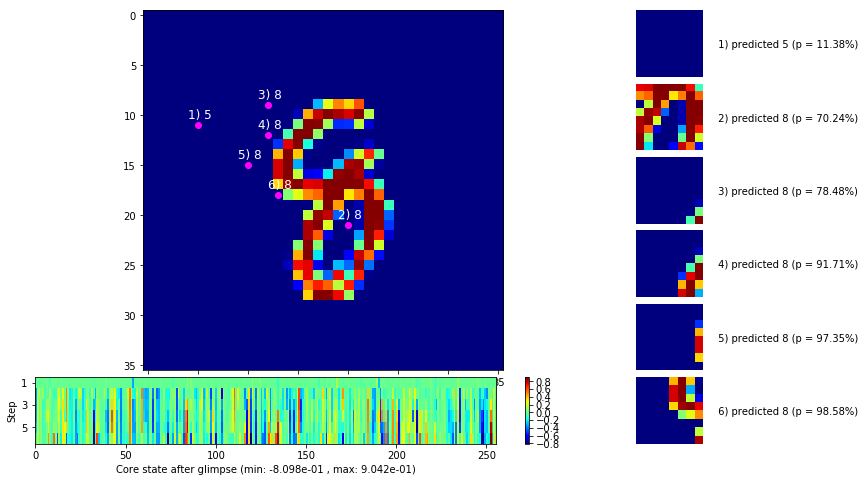

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


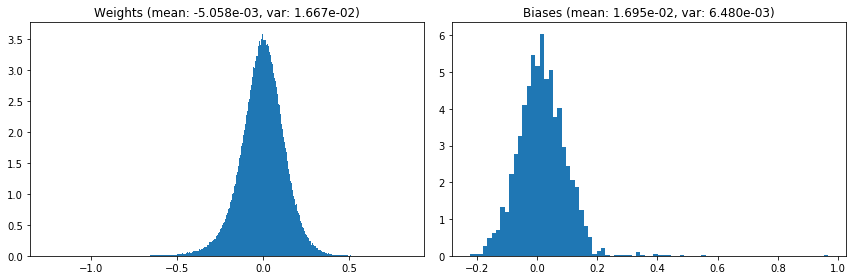

                                      Location network weights and biases


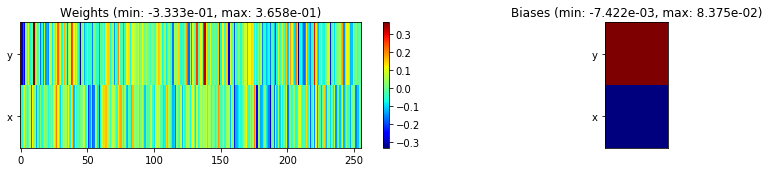

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.17 sec | TRAIN >> class loss: 0.1343 | steps:  2.029 :( | reward:  0.9559 :( | acc.: 95.587% :(
                          | VAL   >> class loss: 0.1478 | steps:  1.925 :( | reward:  0.9536 :( | acc.: 95.360% :(


Epoch  32/400) lr = 9.34e-06
 b    500/  3000 >> 136.6 ms/b | lr: 9.15e-06 | grad 2norm:  4.27 | grad inf norm:  1.015
       Weights || abs max:  1.25 (24830.26) | mean: -5.06e-03 ( 0.10) | var: 1.67e-02 (14951.91)
        Biases || abs max:  0.97 (  760.11) | mean:  1.70e-02 ( 0.68) | var: 6.48e-03 ( 1224.69)
                  class loss: 0.130 | steps: 2.041 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.5 ms/b | lr: 8.97e-06 | grad 2norm:  4.46 | grad inf norm:  1.067
       Weights || abs max:  1.25 (26104.59) | mean: -5.06e-03 ( 0.10) | 

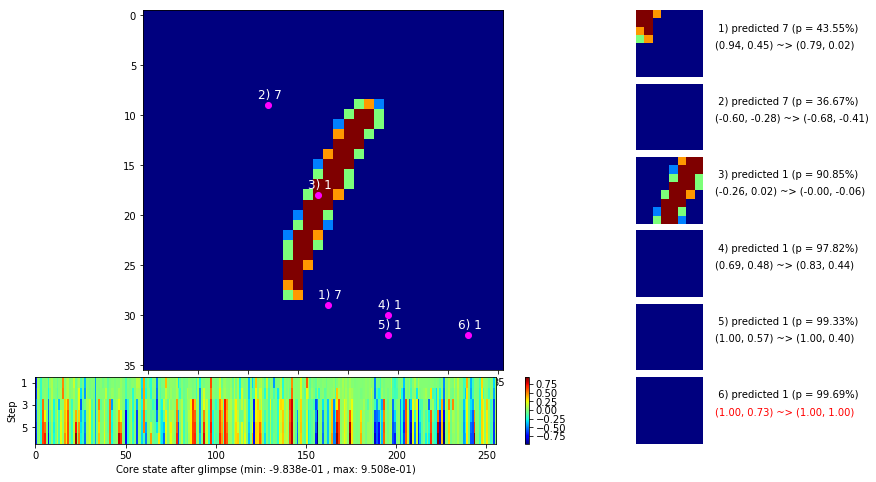

 b   1500/  3000 >> 133.0 ms/b | lr: 8.71e-06 | grad 2norm:  4.37 | grad inf norm:  1.093
       Weights || abs max:  1.25 (59190.36) | mean: -5.06e-03 ( 0.18) | var: 1.67e-02 (98173.96)
        Biases || abs max:  0.97 (  465.97) | mean:  1.69e-02 ( 0.68) | var: 6.48e-03 (  815.52)
                  class loss: 0.134 | steps: 2.040 | reward:  0.955 | acc.: 95.48%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.6 ms/b | lr: 8.53e-06 | grad 2norm:  4.39 | grad inf norm:  1.088
       Weights || abs max:  1.25 (122235.93) | mean: -5.06e-03 ( 0.27) | var: 1.67e-02 (3994957.75)
        Biases || abs max:  0.97 ( 2238.36) | mean:  1.69e-02 ( 1.77) | var: 6.48e-03 (171365.41)
                  class loss: 0.137 | steps: 2.040 | reward:  0.955 | acc.: 95.53%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

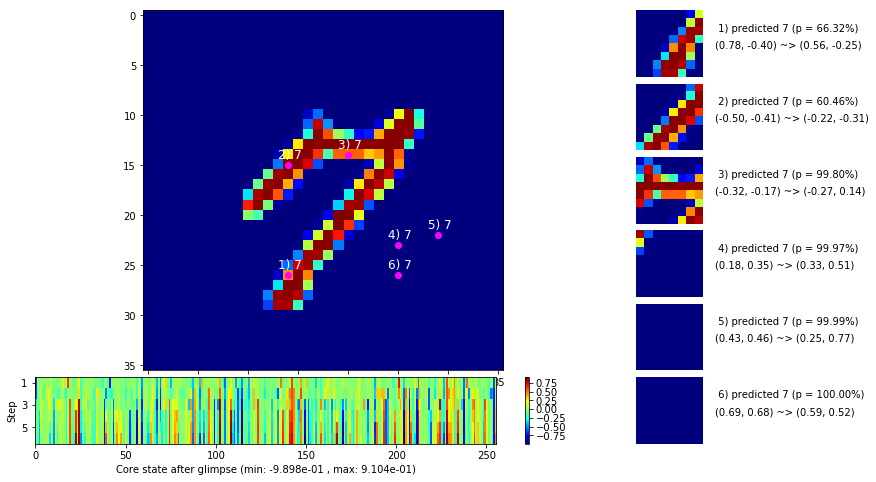

 b   2500/  3000 >> 133.1 ms/b | lr: 8.28e-06 | grad 2norm:  4.31 | grad inf norm:  1.044
       Weights || abs max:  1.25 (36321.92) | mean: -5.06e-03 ( 0.13) | var: 1.67e-02 (36397.06)
        Biases || abs max:  0.97 ( 1679.83) | mean:  1.69e-02 ( 1.27) | var: 6.48e-03 (17205.72)
                  class loss: 0.130 | steps: 2.032 | reward:  0.957 | acc.: 95.71%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 8.11e-06 | grad 2norm:  4.46 | grad inf norm:  1.079
       Weights || abs max:  1.25 (39161.52) | mean: -5.06e-03 ( 0.14) | var: 1.67e-02 (27335.04)
        Biases || abs max:  0.97 ( 2969.27) | mean:  1.70e-02 ( 1.56) | var: 6.48e-03 (265871.59)
                  class loss: 0.137 | steps: 2.031 | reward:  0.954 | acc.: 95.43%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

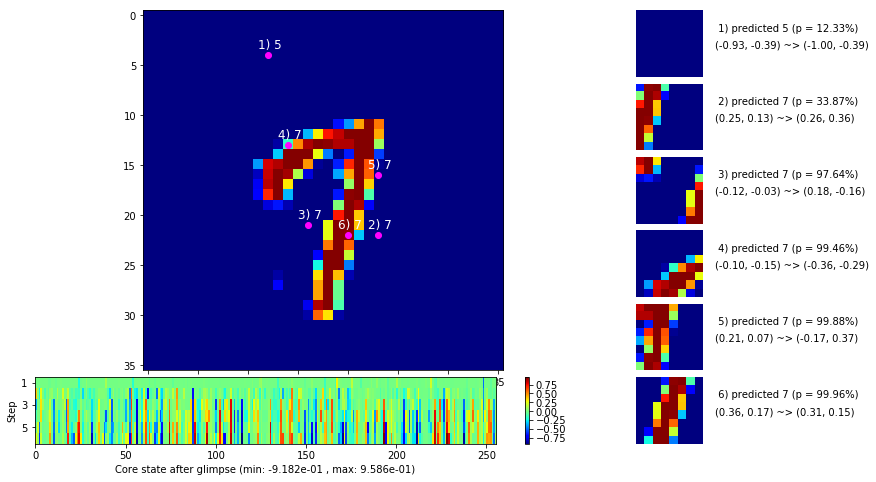

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


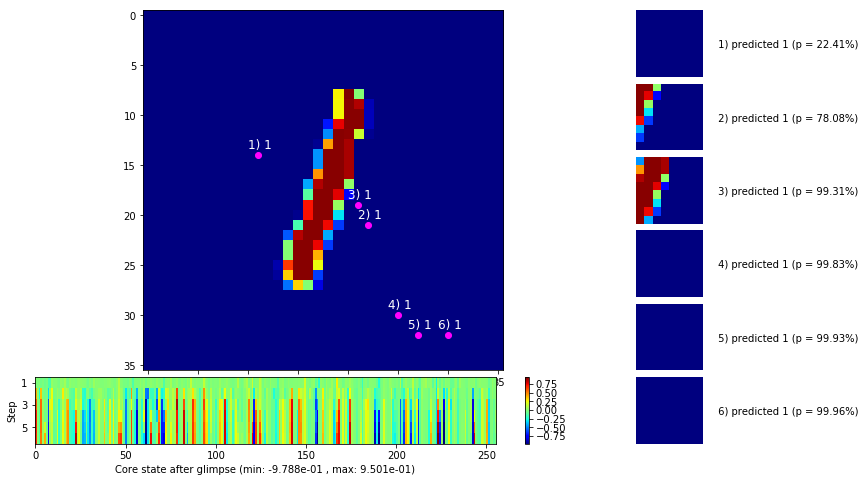


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


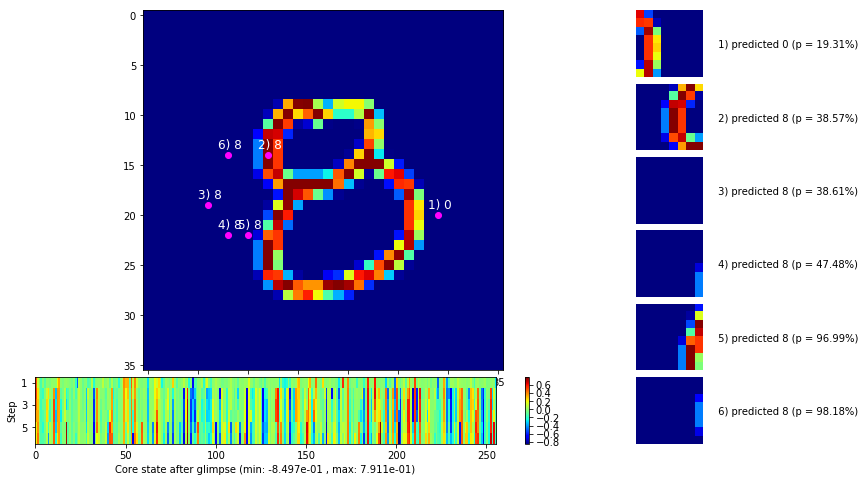

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


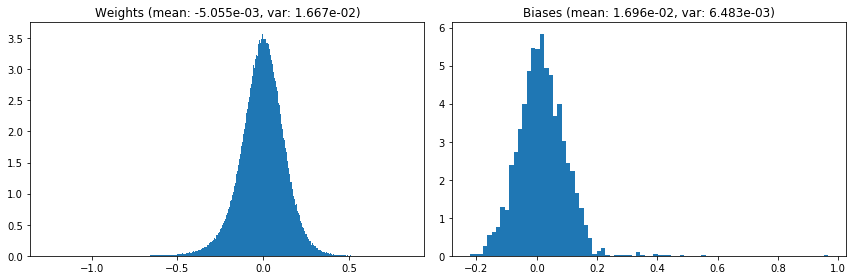

                                      Location network weights and biases


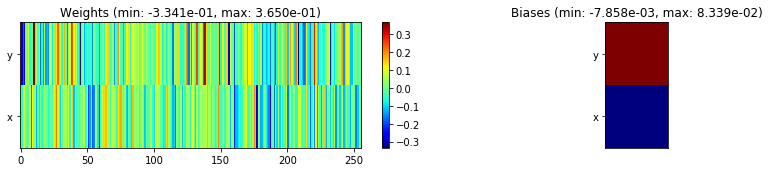

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.47 sec | TRAIN >> class loss: 0.1336 | steps:  2.035 :( | reward:  0.9556 :( | acc.: 95.557% :(
                          | VAL   >> class loss: 0.1421 | steps:  1.907 :( | reward:  0.9544 :( | acc.: 95.440% :(


Epoch  33/400) lr = 8.033e-06
 b    500/  3000 >> 132.0 ms/b | lr: 7.87e-06 | grad 2norm:  4.52 | grad inf norm:  1.074
       Weights || abs max:  1.25 (80113.10) | mean: -5.06e-03 ( 0.21) | var: 1.67e-02 (363769.69)
        Biases || abs max:  0.97 (  399.02) | mean:  1.70e-02 ( 0.48) | var: 6.48e-03 ( 2012.36)
                  class loss: 0.137 | steps: 2.027 | reward:  0.954 | acc.: 95.38%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 7.72e-06 | grad 2norm:  4.32 | grad inf norm:  1.071
       Weights || abs max:  1.25 (69836.47) | mean: -5.06e-03 ( 0.19) 

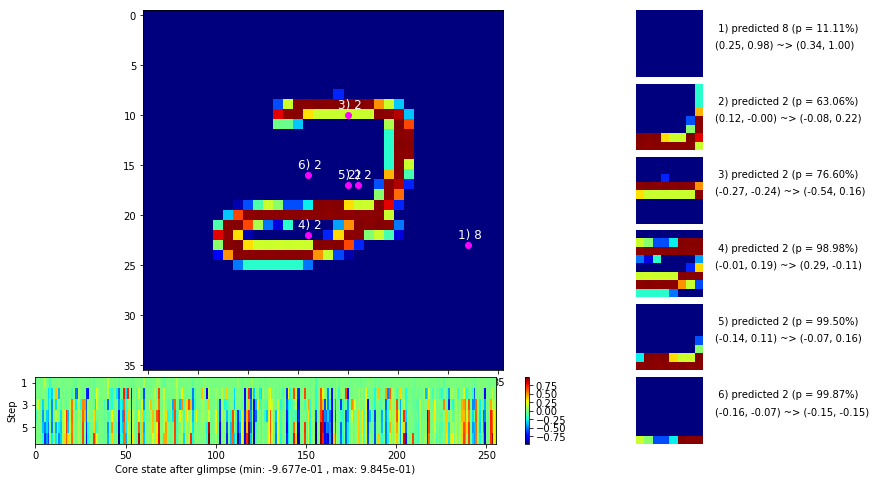

 b   1500/  3000 >> 138.6 ms/b | lr: 7.49e-06 | grad 2norm:  4.51 | grad inf norm:  1.130
       Weights || abs max:  1.25 (43552.39) | mean: -5.06e-03 ( 0.14) | var: 1.67e-02 (56094.71)
        Biases || abs max:  0.97 ( 1298.38) | mean:  1.70e-02 ( 0.95) | var: 6.48e-03 ( 7917.63)
                  class loss: 0.143 | steps: 2.054 | reward:  0.953 | acc.: 95.26%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.2 ms/b | lr: 7.34e-06 | grad 2norm:  4.32 | grad inf norm:  1.054
       Weights || abs max:  1.25 (12118.13) | mean: -5.06e-03 ( 0.08) | var: 1.67e-02 ( 2080.06)
        Biases || abs max:  0.97 (11509.19) | mean:  1.70e-02 ( 4.95) | var: 6.48e-03 (5980672.00)
                  class loss: 0.130 | steps: 2.022 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

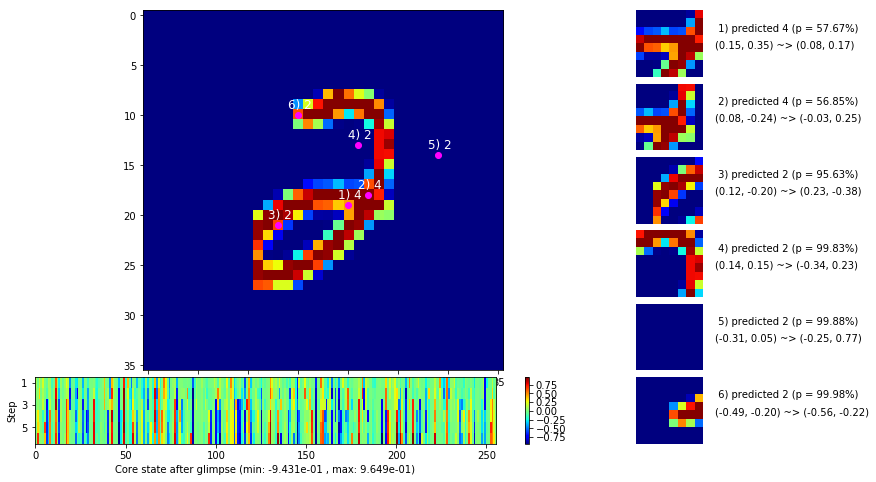

 b   2500/  3000 >> 133.3 ms/b | lr: 7.12e-06 | grad 2norm:  4.56 | grad inf norm:  1.094
       Weights || abs max:  1.25 (27728.34) | mean: -5.05e-03 ( 0.11) | var: 1.67e-02 (21843.11)
        Biases || abs max:  0.97 ( 1367.85) | mean:  1.70e-02 ( 0.89) | var: 6.48e-03 (10062.19)
                  class loss: 0.137 | steps: 2.018 | reward:  0.953 | acc.: 95.34%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.4 ms/b | lr: 6.98e-06 | grad 2norm:  4.11 | grad inf norm:  1.004
       Weights || abs max:  1.25 (31422.29) | mean: -5.05e-03 ( 0.12) | var: 1.67e-02 (57566.89)
        Biases || abs max:  0.97 (  237.89) | mean:  1.70e-02 ( 0.47) | var: 6.48e-03 (  396.71)
                  class loss: 0.122 | steps: 2.017 | reward:  0.960 | acc.: 96.02%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

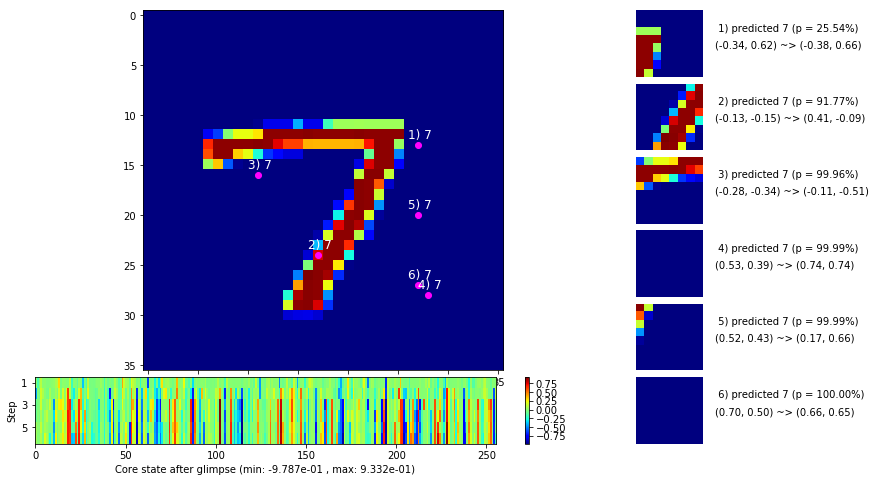

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


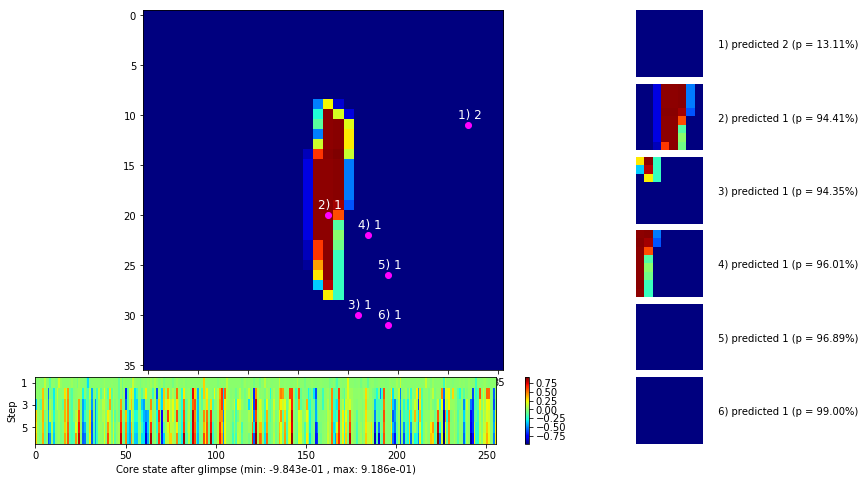


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


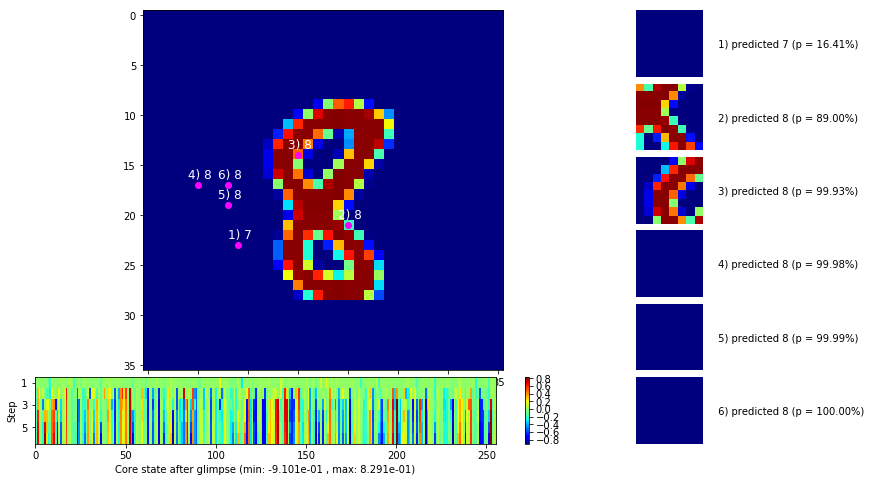

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


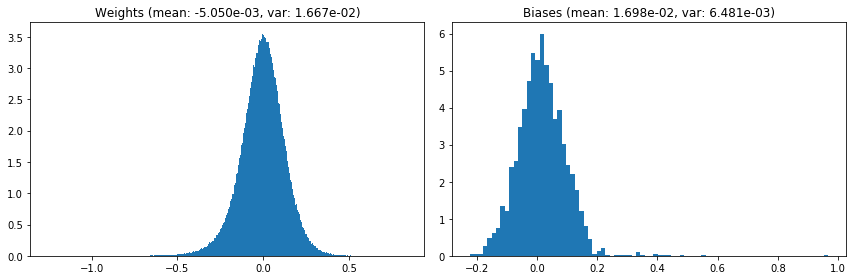

                                      Location network weights and biases


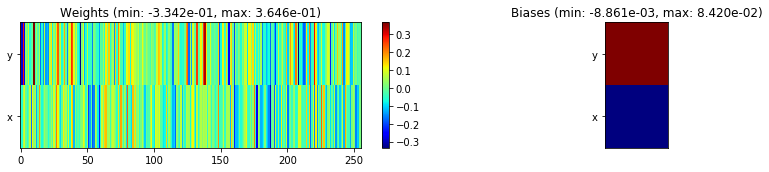

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.09 sec | TRAIN >> class loss: 0.1339 | steps:  2.029 :( | reward:  0.9558 :( | acc.: 95.577% :(
                          | VAL   >> class loss: 0.1462 | steps:  1.931 :( | reward:  0.9512 :( | acc.: 95.120% :(


Epoch  34/400) lr = 6.909e-06
 b    500/  3000 >> 135.1 ms/b | lr: 6.77e-06 | grad 2norm:  4.57 | grad inf norm:  1.095
       Weights || abs max:  1.25 (39305.51) | mean: -5.05e-03 ( 0.13) | var: 1.67e-02 (156693.42)
        Biases || abs max:  0.97 (  669.20) | mean:  1.70e-02 ( 0.66) | var: 6.48e-03 (  966.13)
                  class loss: 0.136 | steps: 2.038 | reward:  0.953 | acc.: 95.34%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.2 ms/b | lr: 6.64e-06 | grad 2norm:  4.60 | grad inf norm:  1.125
       Weights || abs max:  1.25 (25995.88) | mean: -5.05e-03 ( 0.11) 

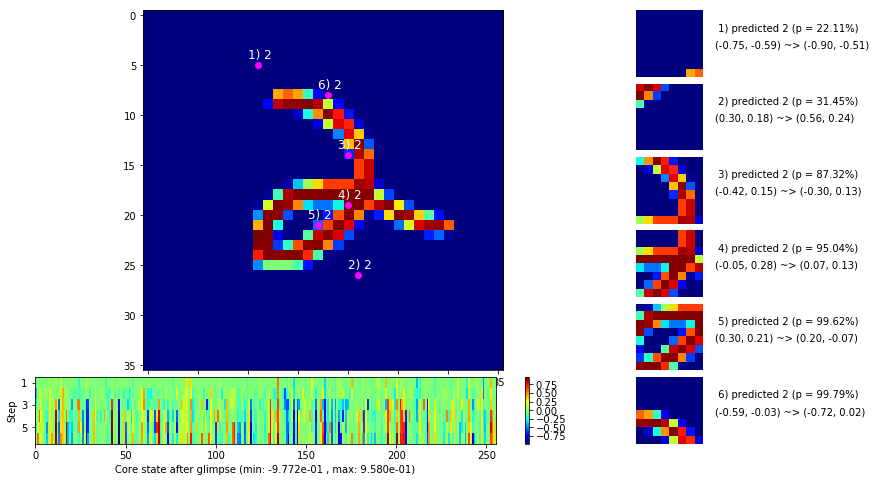

 b   1500/  3000 >> 133.2 ms/b | lr: 6.44e-06 | grad 2norm:  4.11 | grad inf norm:  1.013
       Weights || abs max:  1.25 (20537.44) | mean: -5.04e-03 ( 0.09) | var: 1.67e-02 (53096.23)
        Biases || abs max:  0.97 ( 7402.90) | mean:  1.70e-02 ( 3.21) | var: 6.48e-03 (8046123.00)
                  class loss: 0.129 | steps: 2.021 | reward:  0.960 | acc.: 96.04%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.0 ms/b | lr: 6.31e-06 | grad 2norm:  4.39 | grad inf norm:  1.046
       Weights || abs max:  1.25 (61911.02) | mean: -5.04e-03 ( 0.16) | var: 1.67e-02 (302775.56)
        Biases || abs max:  0.97 ( 1310.74) | mean:  1.70e-02 ( 0.89) | var: 6.48e-03 (43033.93)
                  class loss: 0.133 | steps: 2.048 | reward:  0.956 | acc.: 95.56%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

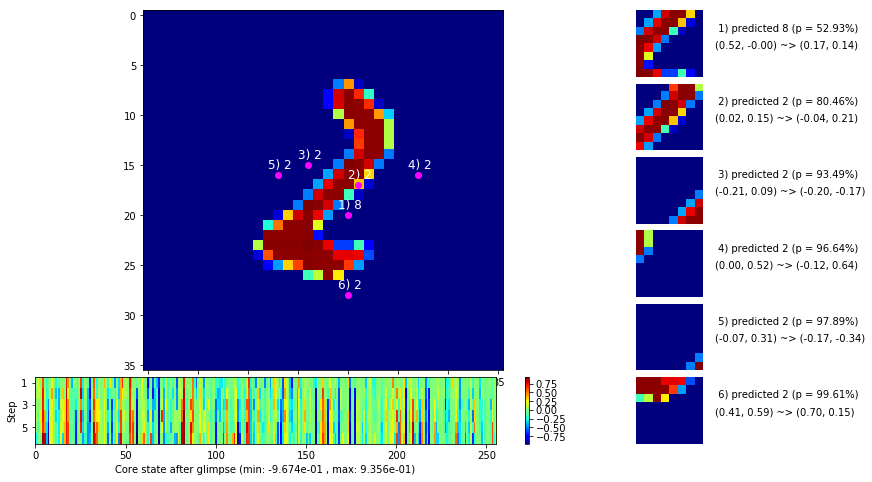

 b   2500/  3000 >> 134.7 ms/b | lr: 6.12e-06 | grad 2norm:  4.13 | grad inf norm:  1.047
       Weights || abs max:  1.25 (47777.05) | mean: -5.04e-03 ( 0.14) | var: 1.67e-02 (302188.22)
        Biases || abs max:  0.97 ( 1039.25) | mean:  1.70e-02 ( 0.79) | var: 6.48e-03 ( 5672.89)
                  class loss: 0.122 | steps: 2.004 | reward:  0.959 | acc.: 95.88%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 144.0 ms/b | lr: 6.00e-06 | grad 2norm:  4.33 | grad inf norm:  1.058
       Weights || abs max:  1.25 (36264.25) | mean: -5.04e-03 ( 0.12) | var: 1.67e-02 (120692.51)
        Biases || abs max:  0.97 (  612.26) | mean:  1.70e-02 ( 0.59) | var: 6.48e-03 ( 1645.53)
                  class loss: 0.124 | steps: 2.029 | reward:  0.957 | acc.: 95.69%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.

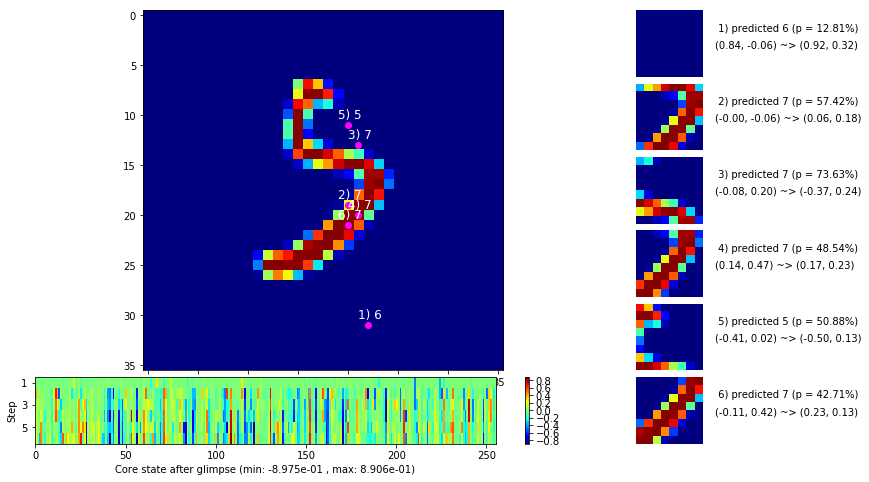

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


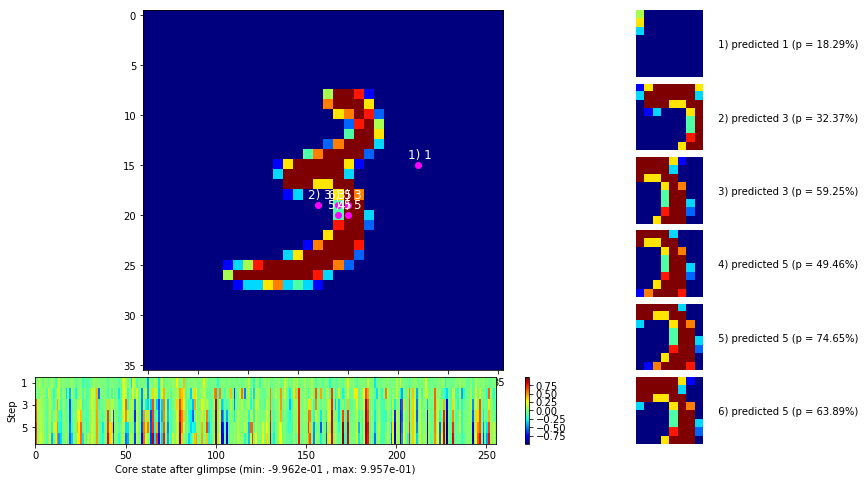


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


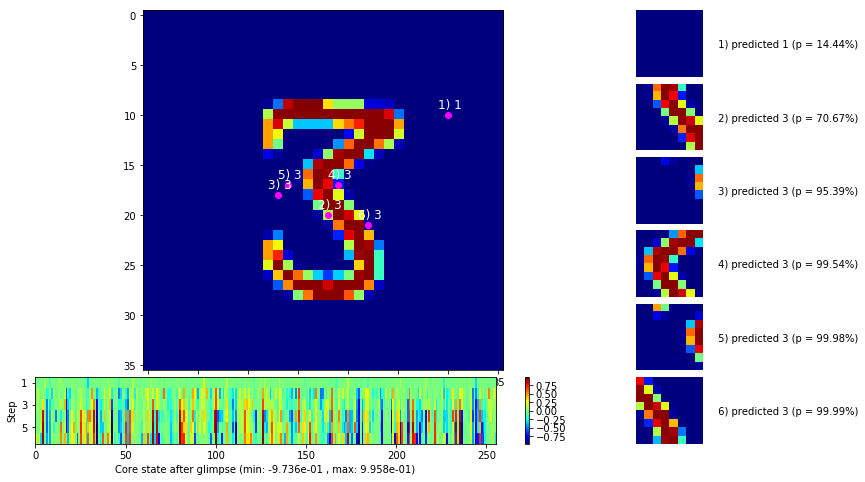

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


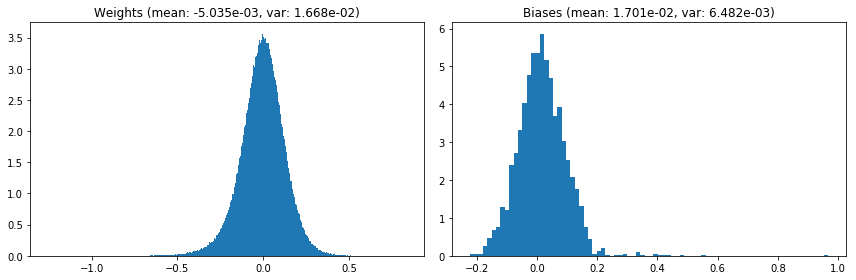

                                      Location network weights and biases


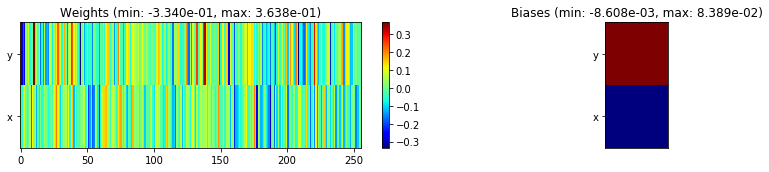

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.78 sec | TRAIN >> class loss: 0.1318 | steps:  2.031 :( | reward:  0.9561 :( | acc.: 95.612% :(
                          | VAL   >> class loss: 0.1353 | steps:  1.943 :( | reward:  0.9558 :( | acc.: 95.580% :(


Epoch  35/400) lr = 5.942e-06
 b    500/  3000 >> 136.1 ms/b | lr: 5.82e-06 | grad 2norm:  4.41 | grad inf norm:  1.055
       Weights || abs max:  1.26 (20585.73) | mean: -5.04e-03 ( 0.09) | var: 1.67e-02 (12438.67)
        Biases || abs max:  0.97 ( 1725.06) | mean:  1.70e-02 ( 1.11) | var: 6.48e-03 (99600.19)
                  class loss: 0.130 | steps: 2.023 | reward:  0.956 | acc.: 95.56%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.0 ms/b | lr: 5.71e-06 | grad 2norm:  4.32 | grad inf norm:  1.084
       Weights || abs max:  1.26 (29779.32) | mean: -5.04e-03 ( 0.10) |

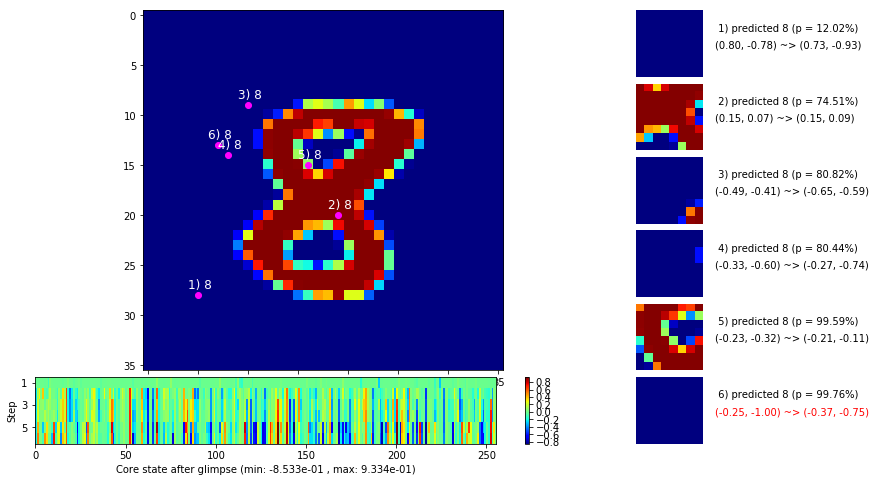

 b   1500/  3000 >> 136.1 ms/b | lr: 5.54e-06 | grad 2norm:  4.41 | grad inf norm:  1.085
       Weights || abs max:  1.26 (20094.26) | mean: -5.03e-03 ( 0.09) | var: 1.67e-02 ( 6802.92)
        Biases || abs max:  0.97 (  548.28) | mean:  1.70e-02 ( 0.54) | var: 6.48e-03 ( 2348.60)
                  class loss: 0.148 | steps: 2.049 | reward:  0.954 | acc.: 95.42%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.1 ms/b | lr: 5.43e-06 | grad 2norm:  4.32 | grad inf norm:  1.044
       Weights || abs max:  1.26 (188464.77) | mean: -5.03e-03 ( 0.37) | var: 1.67e-02 (24136372.00)
        Biases || abs max:  0.97 (  393.17) | mean:  1.70e-02 ( 0.48) | var: 6.48e-03 (  210.68)
                  class loss: 0.127 | steps: 2.017 | reward:  0.957 | acc.: 95.68%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

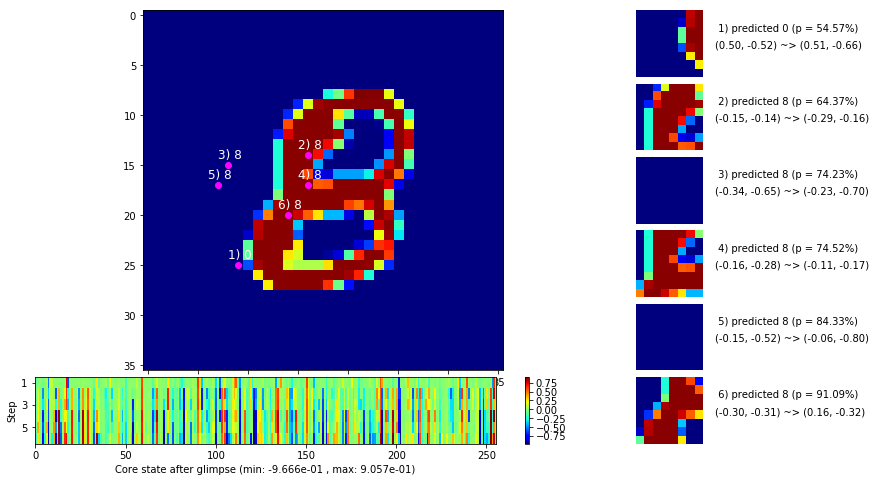

 b   2500/  3000 >> 133.5 ms/b | lr: 5.27e-06 | grad 2norm:  4.27 | grad inf norm:  1.062
       Weights || abs max:  1.26 (25490.15) | mean: -5.03e-03 ( 0.10) | var: 1.67e-02 (34374.27)
        Biases || abs max:  0.97 (  229.53) | mean:  1.70e-02 ( 0.44) | var: 6.48e-03 (  177.59)
                  class loss: 0.135 | steps: 2.039 | reward:  0.957 | acc.: 95.68%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.1 ms/b | lr: 5.16e-06 | grad 2norm:  4.14 | grad inf norm:  1.015
       Weights || abs max:  1.26 (83631.64) | mean: -5.03e-03 ( 0.20) | var: 1.67e-02 (376238.47)
        Biases || abs max:  0.97 (  296.69) | mean:  1.70e-02 ( 0.47) | var: 6.48e-03 (  487.32)
                  class loss: 0.123 | steps: 2.026 | reward:  0.960 | acc.: 95.96%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

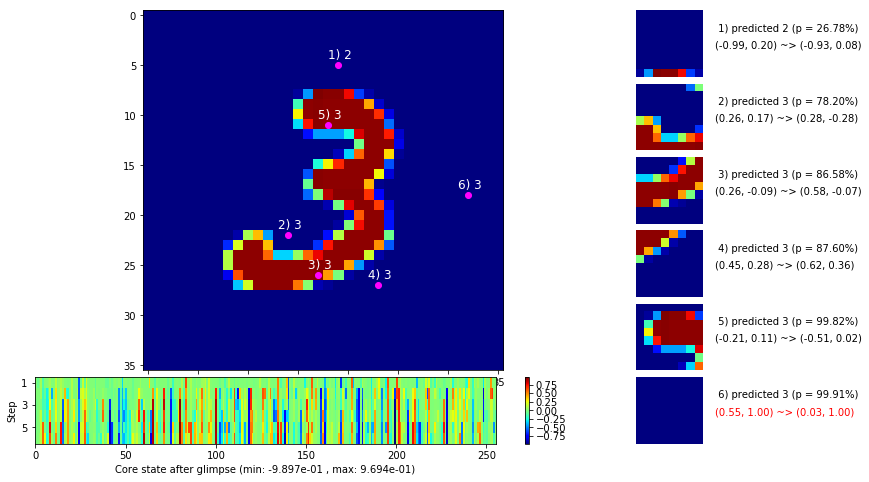

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


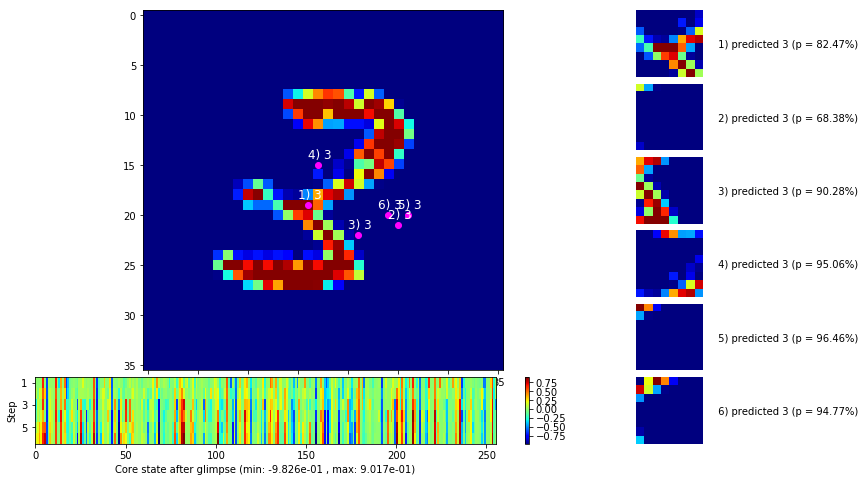


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


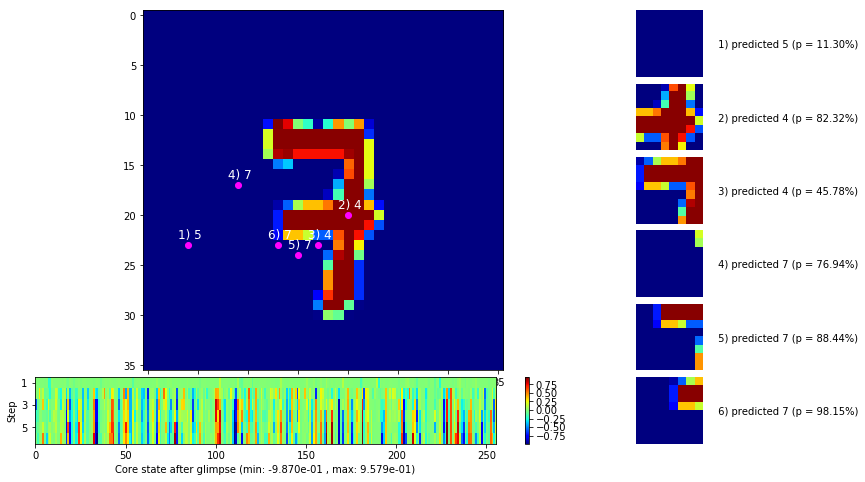

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


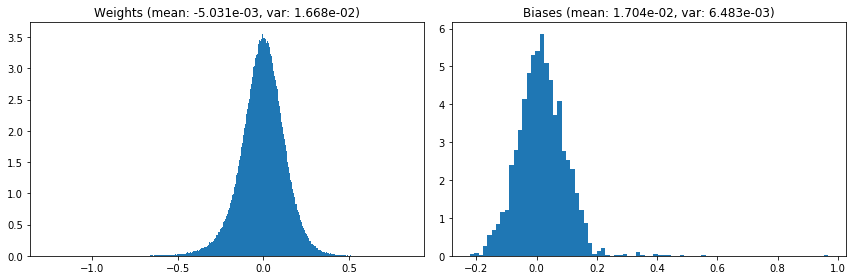

                                      Location network weights and biases


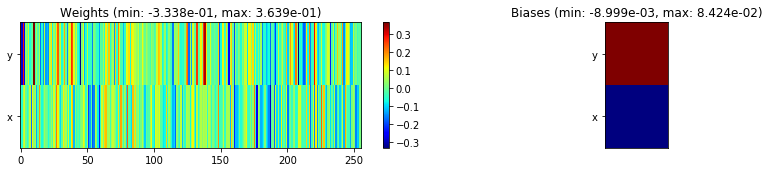

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.04 sec | TRAIN >> class loss: 0.1332 | steps:  2.031 :( | reward:  0.9566 :( | acc.: 95.660% :(
                          | VAL   >> class loss: 0.1474 | steps:  1.951 :( | reward:  0.9504 :( | acc.: 95.040% :(


Epoch  36/400) lr = 5.111e-06
 b    500/  3000 >> 134.4 ms/b | lr: 5.01e-06 | grad 2norm:  4.39 | grad inf norm:  1.059
       Weights || abs max:  1.26 (36275.10) | mean: -5.03e-03 ( 0.12) | var: 1.67e-02 (85265.36)
        Biases || abs max:  0.97 ( 2928.06) | mean:  1.70e-02 ( 1.53) | var: 6.48e-03 (73933.00)
                  class loss: 0.133 | steps: 2.021 | reward:  0.955 | acc.: 95.49%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 4.91e-06 | grad 2norm:  4.17 | grad inf norm:  1.037
       Weights || abs max:  1.26 (25505.64) | mean: -5.03e-03 ( 0.10) |

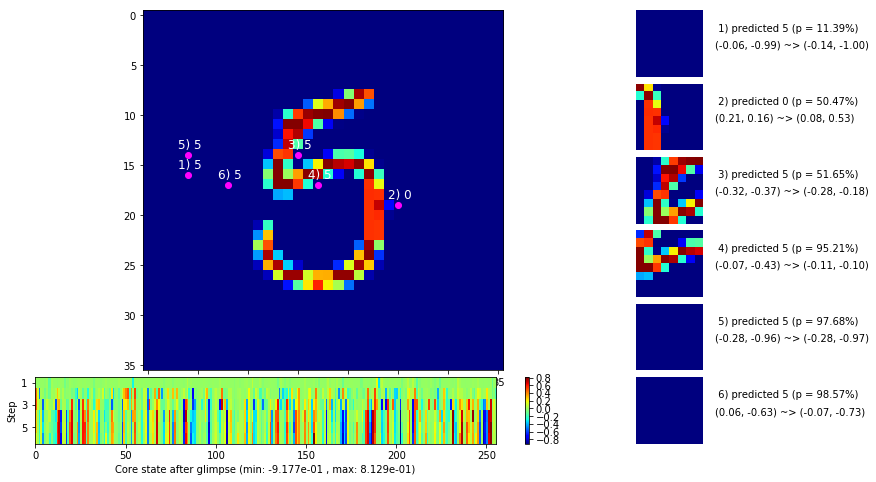

 b   1500/  3000 >> 142.8 ms/b | lr: 4.76e-06 | grad 2norm:  4.38 | grad inf norm:  1.064
       Weights || abs max:  1.26 (11625.16) | mean: -5.03e-03 ( 0.07) | var: 1.67e-02 ( 4293.54)
        Biases || abs max:  0.97 (  151.29) | mean:  1.70e-02 ( 0.38) | var: 6.48e-03 (   35.08)
                  class loss: 0.135 | steps: 2.037 | reward:  0.956 | acc.: 95.63%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 4.67e-06 | grad 2norm:  4.34 | grad inf norm:  1.031
       Weights || abs max:  1.26 (10979.42) | mean: -5.03e-03 ( 0.07) | var: 1.67e-02 ( 2427.77)
        Biases || abs max:  0.97 (  196.04) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (  293.15)
                  class loss: 0.134 | steps: 2.016 | reward:  0.957 | acc.: 95.69%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

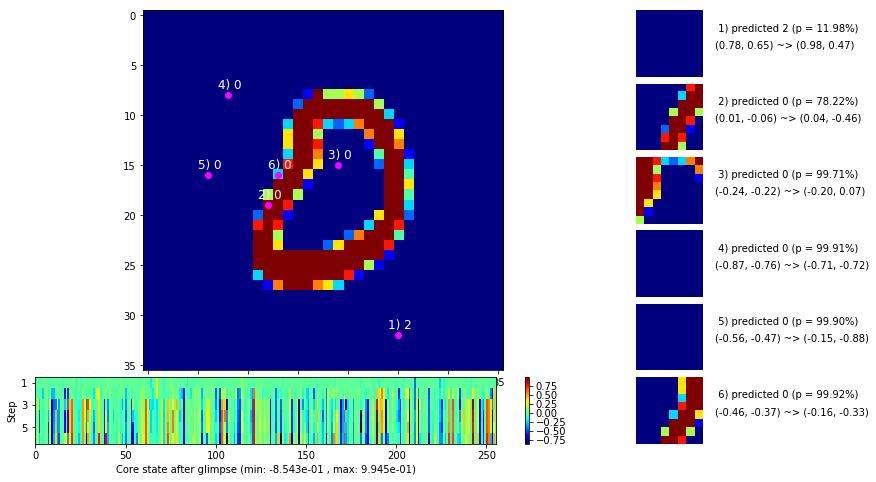

 b   2500/  3000 >> 135.1 ms/b | lr: 4.53e-06 | grad 2norm:  4.18 | grad inf norm:  1.044
       Weights || abs max:  1.26 (188314.62) | mean: -5.02e-03 ( 0.38) | var: 1.67e-02 (8408545.00)
        Biases || abs max:  0.97 (  112.47) | mean:  1.71e-02 ( 0.33) | var: 6.48e-03 (   14.52)
                  class loss: 0.130 | steps: 2.035 | reward:  0.959 | acc.: 95.86%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.4 ms/b | lr: 4.44e-06 | grad 2norm:  4.51 | grad inf norm:  1.081
       Weights || abs max:  1.26 (39850.78) | mean: -5.02e-03 ( 0.14) | var: 1.67e-02 (73788.33)
        Biases || abs max:  0.97 (  108.68) | mean:  1.71e-02 ( 0.34) | var: 6.48e-03 (   14.37)
                  class loss: 0.139 | steps: 2.029 | reward:  0.953 | acc.: 95.33%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

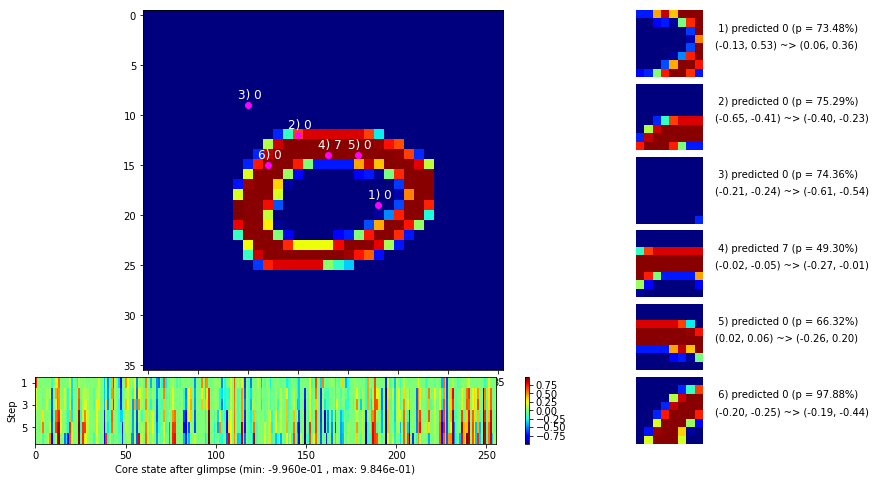

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


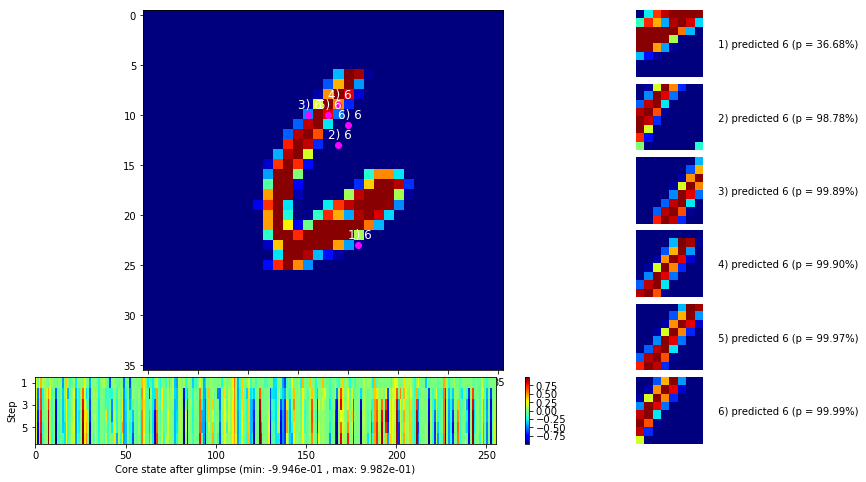


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


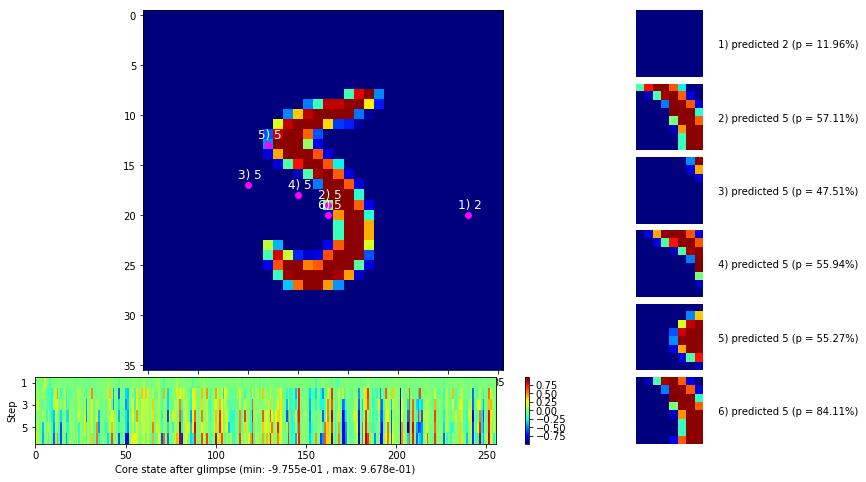

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


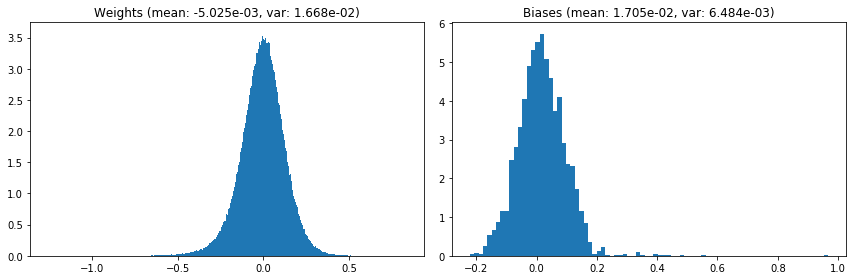

                                      Location network weights and biases


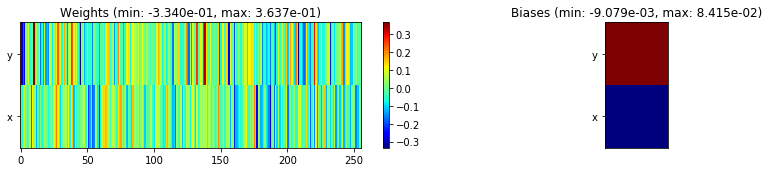

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.75 sec | TRAIN >> class loss: 0.1329 | steps:  2.026    | reward:  0.9565 :( | acc.: 95.647% :(
                          | VAL   >> class loss: 0.1388 | steps:  1.922 :( | reward:  0.9530 :( | acc.: 95.300% :(


Epoch  37/400) lr = 4.395e-06
 b    500/  3000 >> 133.2 ms/b | lr: 4.31e-06 | grad 2norm:  4.32 | grad inf norm:  1.054
       Weights || abs max:  1.26 (1138521.88) | mean: -5.02e-03 ( 1.96) | var: 1.67e-02 (990627712.00)
        Biases || abs max:  0.97 (  150.92) | mean:  1.70e-02 ( 0.39) | var: 6.48e-03 (   30.87)
                  class loss: 0.137 | steps: 2.034 | reward:  0.955 | acc.: 95.54%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.9 ms/b | lr: 4.22e-06 | grad 2norm:  4.15 | grad inf norm:  1.045
       Weights || abs max:  1.26 (38037.56) | mean: -5.02e-03 ( 0

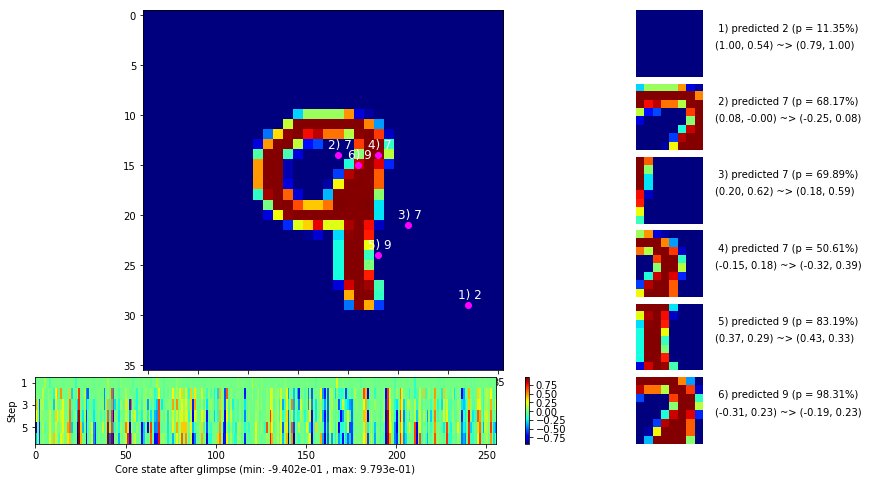

 b   1500/  3000 >> 135.0 ms/b | lr: 4.10e-06 | grad 2norm:  4.25 | grad inf norm:  1.034
       Weights || abs max:  1.26 (103564.28) | mean: -5.02e-03 ( 0.25) | var: 1.67e-02 (970281.75)
        Biases || abs max:  0.97 (  188.67) | mean:  1.70e-02 ( 0.39) | var: 6.48e-03 (   35.97)
                  class loss: 0.129 | steps: 2.012 | reward:  0.957 | acc.: 95.71%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 4.02e-06 | grad 2norm:  4.31 | grad inf norm:  1.044
       Weights || abs max:  1.26 (46385.00) | mean: -5.02e-03 ( 0.13) | var: 1.67e-02 (709385.44)
        Biases || abs max:  0.97 (  173.98) | mean:  1.70e-02 ( 0.38) | var: 6.48e-03 (   30.94)
                  class loss: 0.129 | steps: 2.021 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

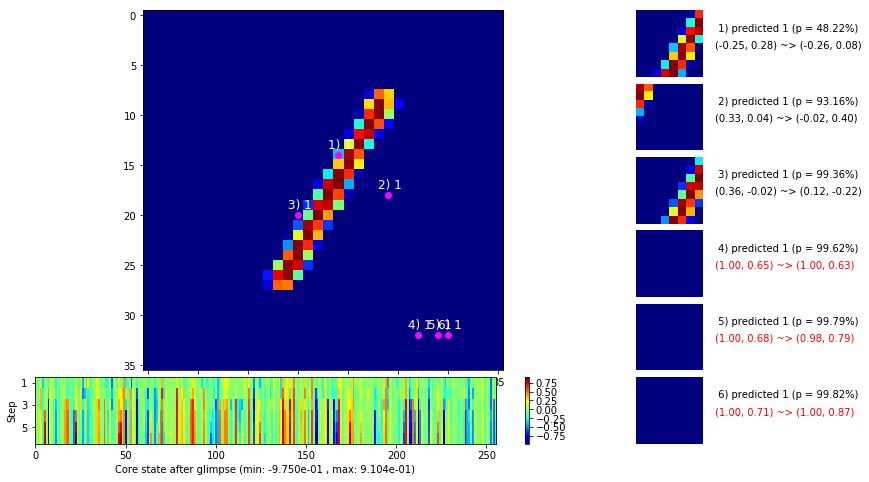

 b   2500/  3000 >> 137.4 ms/b | lr: 3.90e-06 | grad 2norm:  4.44 | grad inf norm:  1.080
       Weights || abs max:  1.26 (15732.01) | mean: -5.02e-03 ( 0.08) | var: 1.67e-02 (16176.18)
        Biases || abs max:  0.97 (  240.44) | mean:  1.70e-02 ( 0.42) | var: 6.48e-03 (   55.06)
                  class loss: 0.140 | steps: 2.023 | reward:  0.954 | acc.: 95.40%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 144.2 ms/b | lr: 3.82e-06 | grad 2norm:  4.22 | grad inf norm:  1.055
       Weights || abs max:  1.26 (11742.36) | mean: -5.02e-03 ( 0.07) | var: 1.67e-02 (10558.87)
        Biases || abs max:  0.97 (  254.32) | mean:  1.70e-02 ( 0.41) | var: 6.48e-03 (   70.36)
                  class loss: 0.130 | steps: 2.027 | reward:  0.958 | acc.: 95.81%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

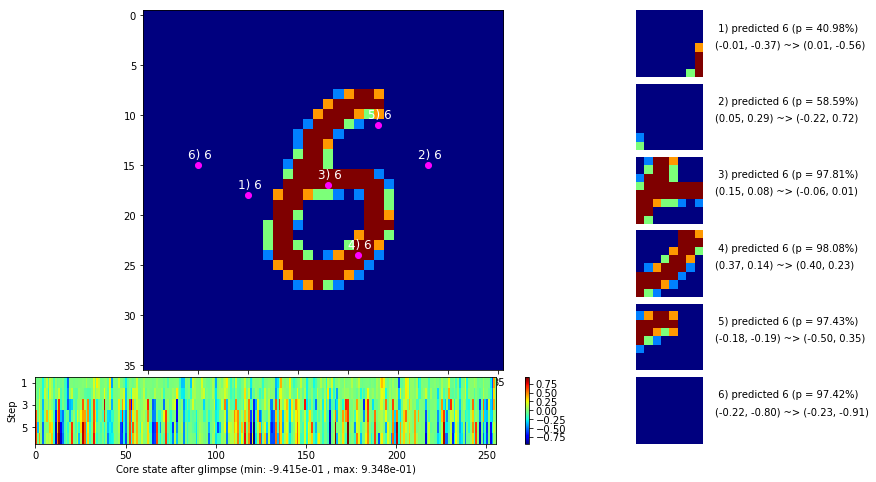

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


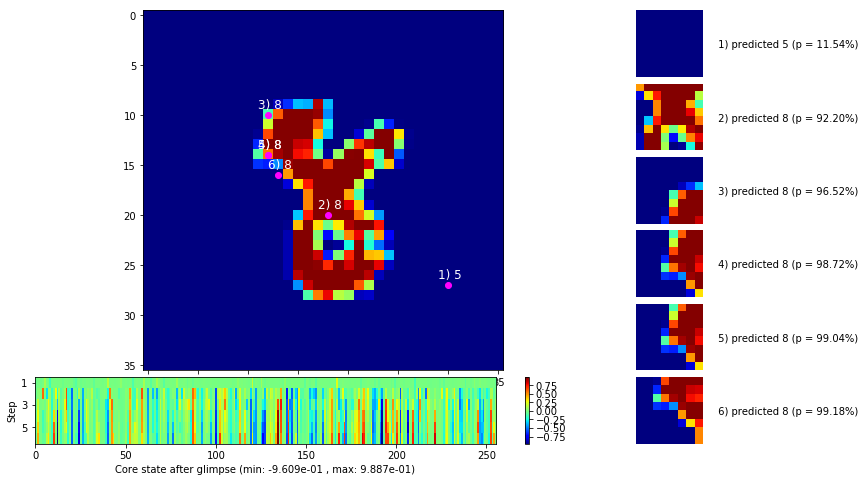


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


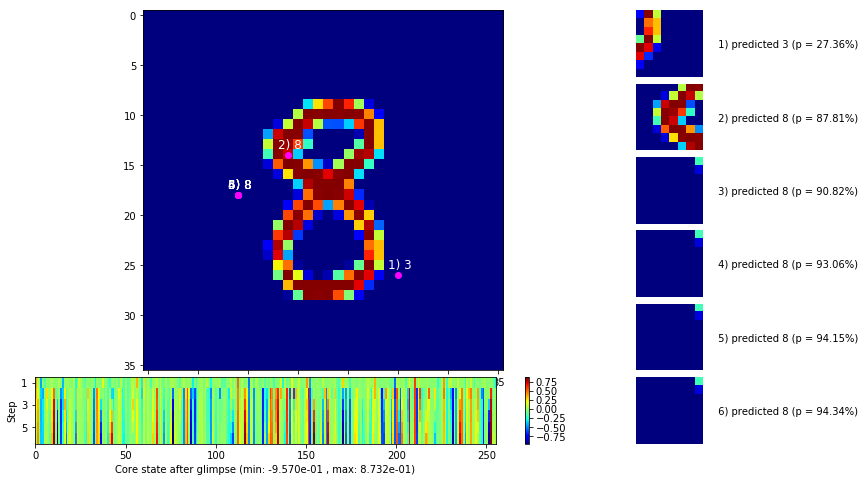

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


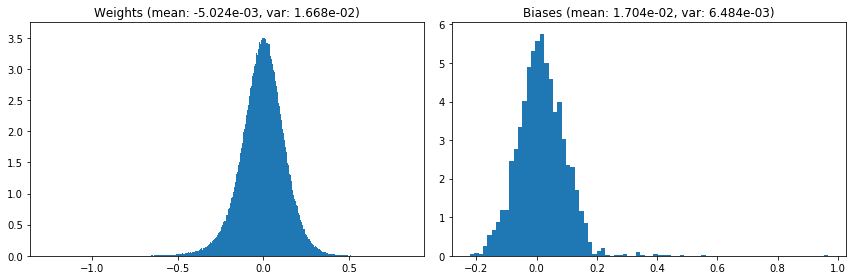

                                      Location network weights and biases


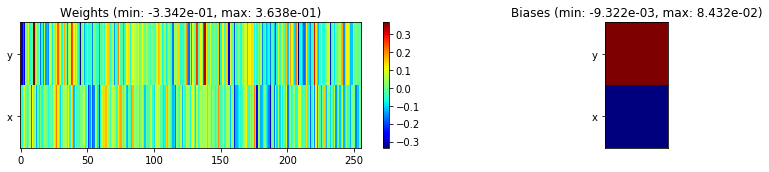

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.88 sec | TRAIN >> class loss: 0.1320 | steps:  2.026    | reward:  0.9568    | acc.: 95.683% 
                          | VAL   >> class loss: 0.1497 | steps:  1.930 :( | reward:  0.9532 :( | acc.: 95.320% :(


Epoch  38/400) lr = 3.78e-06
 b    500/  3000 >> 132.8 ms/b | lr: 3.71e-06 | grad 2norm:  4.15 | grad inf norm:  0.998
       Weights || abs max:  1.26 (12628.28) | mean: -5.02e-03 ( 0.07) | var: 1.67e-02 (11669.86)
        Biases || abs max:  0.97 ( 2752.24) | mean:  1.70e-02 ( 1.39) | var: 6.48e-03 (91105.35)
                  class loss: 0.120 | steps: 2.005 | reward:  0.960 | acc.: 96.01%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.9 ms/b | lr: 3.63e-06 | grad 2norm:  4.50 | grad inf norm:  1.070
       Weights || abs max:  1.26 (41403.22) | mean: -5.02e-03 ( 0.13) | va

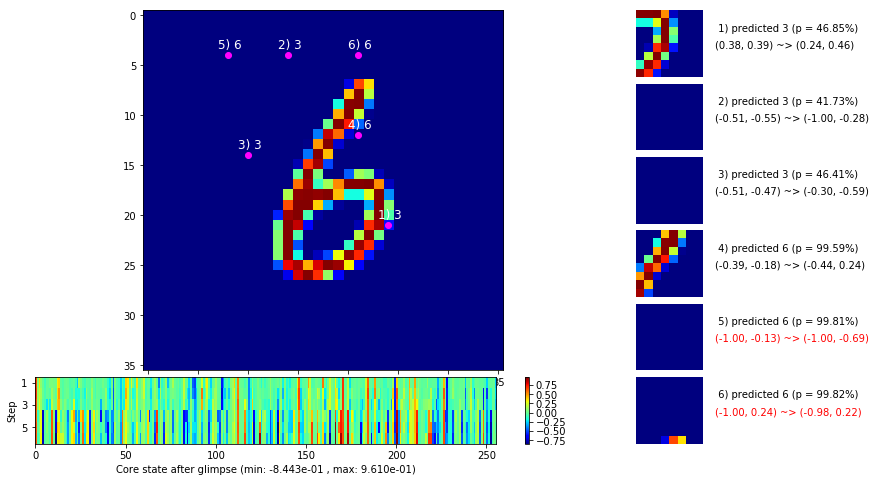

 b   1500/  3000 >> 136.7 ms/b | lr: 3.52e-06 | grad 2norm:  4.19 | grad inf norm:  1.029
       Weights || abs max:  1.26 (17313.74) | mean: -5.02e-03 ( 0.08) | var: 1.67e-02 (16587.99)
        Biases || abs max:  0.97 (  228.14) | mean:  1.70e-02 ( 0.39) | var: 6.48e-03 (   52.08)
                  class loss: 0.130 | steps: 2.029 | reward:  0.958 | acc.: 95.83%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.7 ms/b | lr: 3.45e-06 | grad 2norm:  4.25 | grad inf norm:  1.065
       Weights || abs max:  1.26 ( 5993.97) | mean: -5.02e-03 ( 0.06) | var: 1.67e-02 ( 1312.33)
        Biases || abs max:  0.97 (  491.33) | mean:  1.70e-02 ( 0.50) | var: 6.48e-03 (  226.90)
                  class loss: 0.132 | steps: 2.033 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

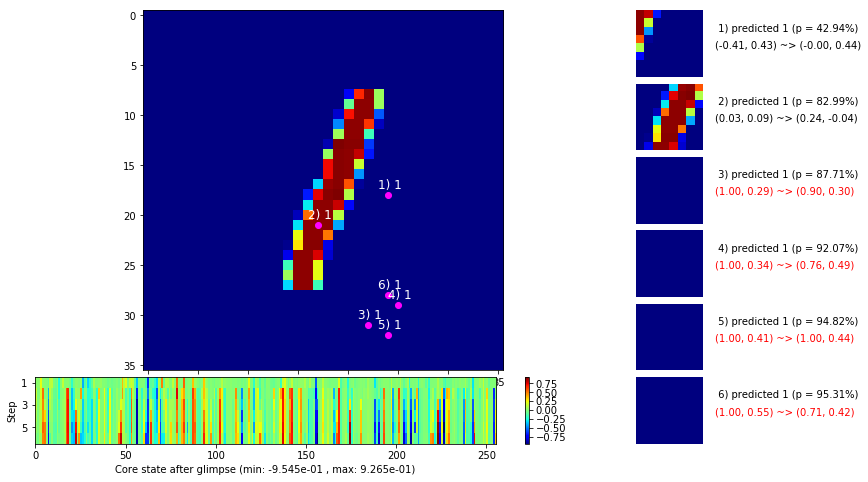

 b   2500/  3000 >> 133.7 ms/b | lr: 3.35e-06 | grad 2norm:  4.42 | grad inf norm:  1.098
       Weights || abs max:  1.26 (24466.48) | mean: -5.02e-03 ( 0.09) | var: 1.67e-02 (36548.80)
        Biases || abs max:  0.97 (  336.29) | mean:  1.71e-02 ( 0.44) | var: 6.49e-03 (  110.81)
                  class loss: 0.139 | steps: 2.026 | reward:  0.954 | acc.: 95.42%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 3.28e-06 | grad 2norm:  4.12 | grad inf norm:  1.019
       Weights || abs max:  1.26 (41998.56) | mean: -5.02e-03 ( 0.13) | var: 1.67e-02 (53828.85)
        Biases || abs max:  0.97 (  257.79) | mean:  1.71e-02 ( 0.42) | var: 6.49e-03 (   63.01)
                  class loss: 0.125 | steps: 2.013 | reward:  0.961 | acc.: 96.05%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

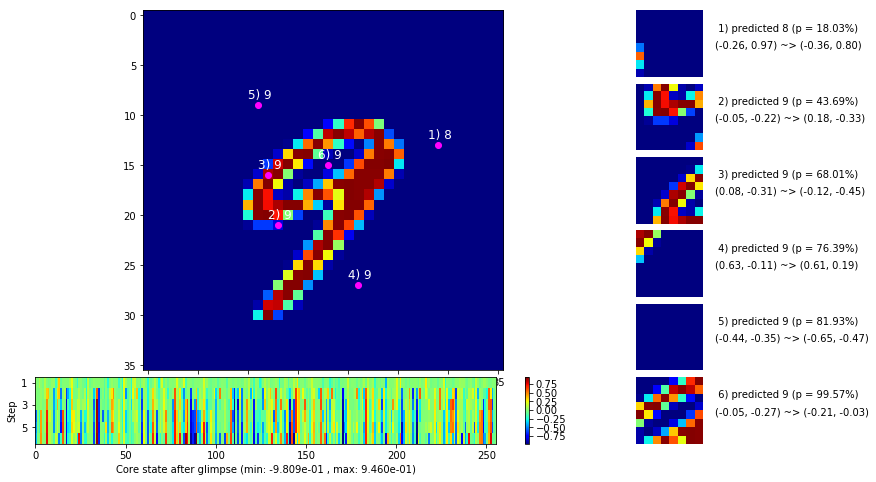

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


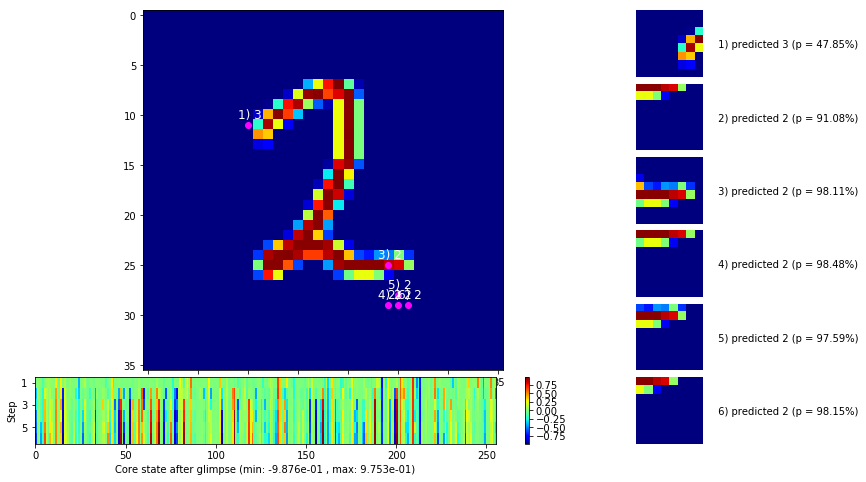


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


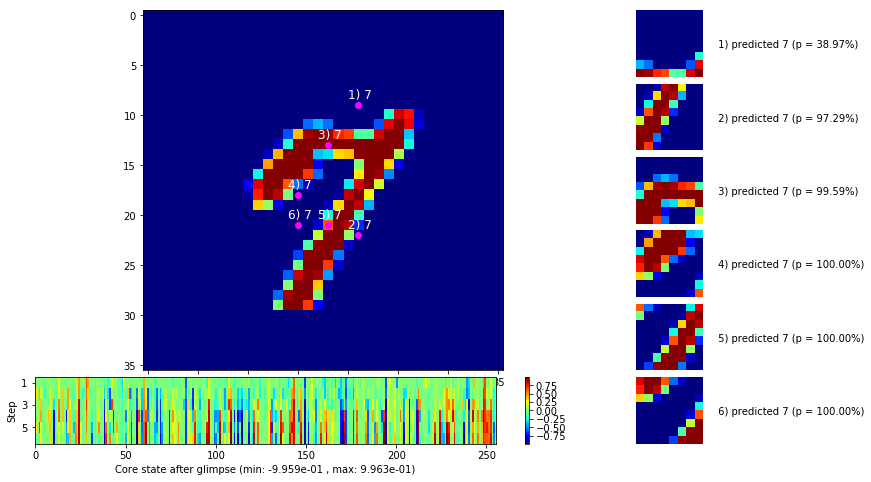

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


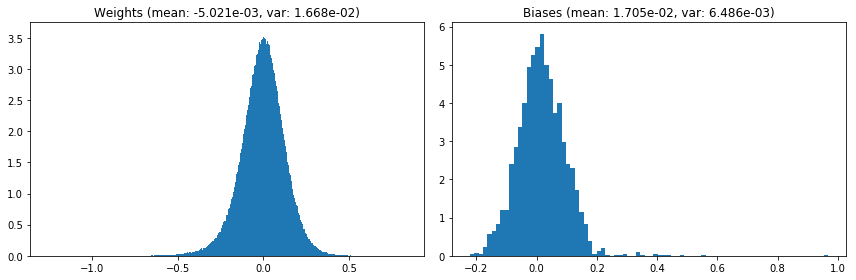

                                      Location network weights and biases


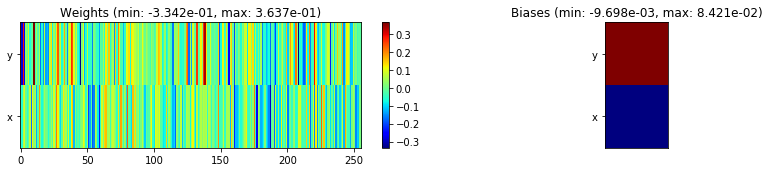

---------------------------------------------------------------------------------------------------------------
Elapsed time:  400.51 sec | TRAIN >> class loss: 0.1309 | steps:  2.025    | reward:  0.9573    | acc.: 95.730% 
                          | VAL   >> class loss: 0.1469 | steps:  1.920 :( | reward:  0.9550 :( | acc.: 95.500% :(


Epoch  39/400) lr = 3.251e-06
 b    500/  3000 >> 132.1 ms/b | lr: 3.19e-06 | grad 2norm:  4.36 | grad inf norm:  1.064
       Weights || abs max:  1.26 (370446.94) | mean: -5.02e-03 ( 0.67) | var: 1.67e-02 (94198200.00)
        Biases || abs max:  0.97 (  236.63) | mean:  1.71e-02 ( 0.42) | var: 6.49e-03 (   64.48)
                  class loss: 0.134 | steps: 2.043 | reward:  0.956 | acc.: 95.63%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.2 ms/b | lr: 3.12e-06 | grad 2norm:  4.42 | grad inf norm:  1.034
       Weights || abs max:  1.26 (48679.16) | mean: -5.02e-03 ( 0.14)

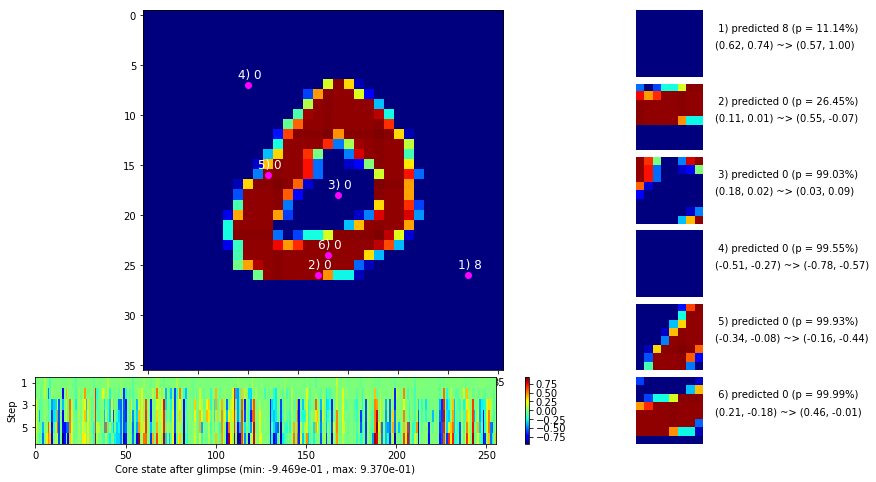

 b   1500/  3000 >> 136.2 ms/b | lr: 3.03e-06 | grad 2norm:  4.19 | grad inf norm:  1.031
       Weights || abs max:  1.26 (67394.14) | mean: -5.02e-03 ( 0.17) | var: 1.67e-02 (919076.88)
        Biases || abs max:  0.97 (  285.97) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   76.58)
                  class loss: 0.121 | steps: 2.024 | reward:  0.959 | acc.: 95.92%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.7 ms/b | lr: 2.97e-06 | grad 2norm:  4.46 | grad inf norm:  1.096
       Weights || abs max:  1.26 (176619.05) | mean: -5.02e-03 ( 0.37) | var: 1.67e-02 (4271334.00)
        Biases || abs max:  0.97 (  273.52) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   72.62)
                  class loss: 0.139 | steps: 2.049 | reward:  0.954 | acc.: 95.39%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

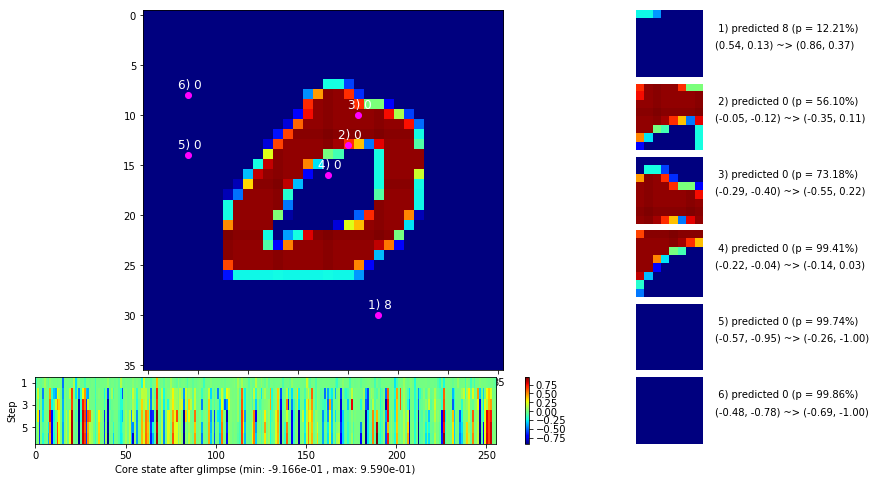

 b   2500/  3000 >> 134.4 ms/b | lr: 2.88e-06 | grad 2norm:  4.29 | grad inf norm:  1.066
       Weights || abs max:  1.26 (65654.96) | mean: -5.02e-03 ( 0.18) | var: 1.67e-02 (311979.66)
        Biases || abs max:  0.97 (  597.53) | mean:  1.71e-02 ( 0.58) | var: 6.48e-03 (  392.03)
                  class loss: 0.134 | steps: 2.025 | reward:  0.956 | acc.: 95.56%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 2.82e-06 | grad 2norm:  4.41 | grad inf norm:  1.082
       Weights || abs max:  1.26 (60032.29) | mean: -5.02e-03 ( 0.17) | var: 1.67e-02 (552796.25)
        Biases || abs max:  0.97 (  978.14) | mean:  1.71e-02 ( 0.77) | var: 6.48e-03 ( 1164.23)
                  class loss: 0.136 | steps: 2.041 | reward:  0.954 | acc.: 95.38%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

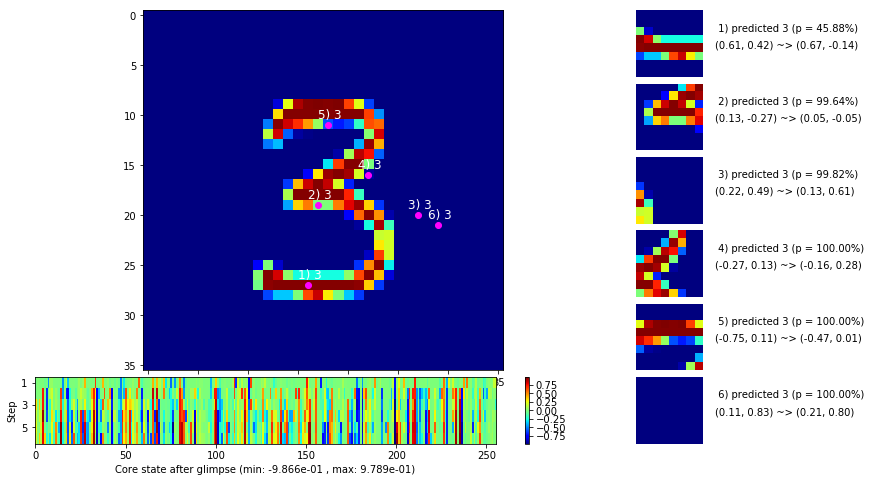

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


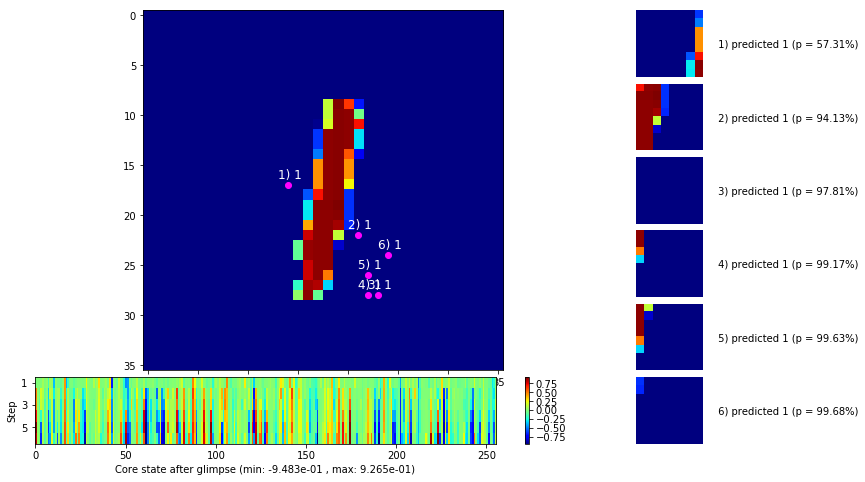


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


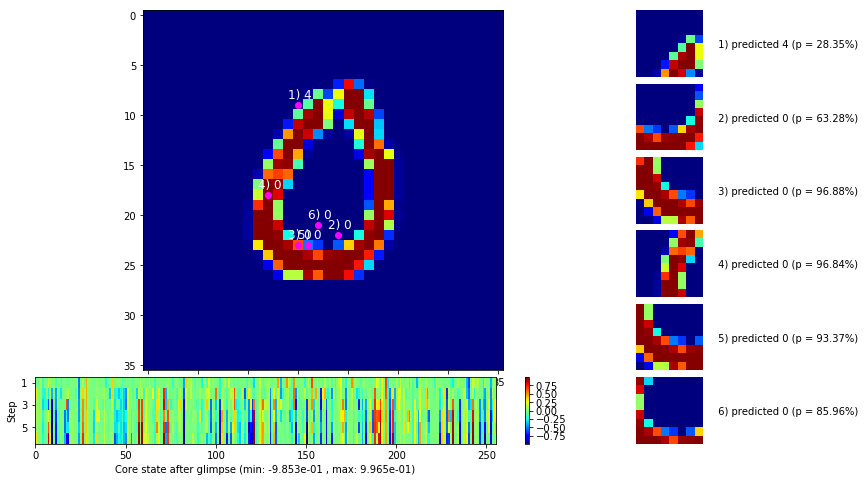

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


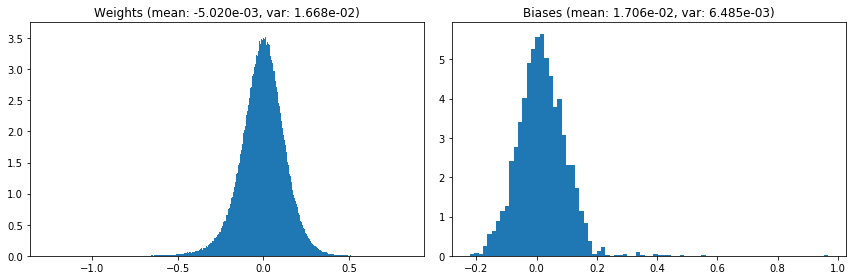

                                      Location network weights and biases


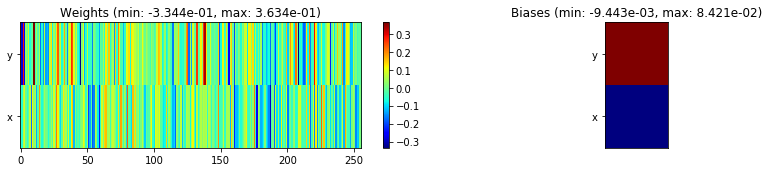

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.96 sec | TRAIN >> class loss: 0.1324 | steps:  2.036 :( | reward:  0.9559 :( | acc.: 95.592% :(
                          | VAL   >> class loss: 0.1386 | steps:  1.912 :( | reward:  0.9562    | acc.: 95.620% 


Epoch  40/400) lr = 2.796e-06
 b    500/  3000 >> 131.0 ms/b | lr: 2.74e-06 | grad 2norm:  4.40 | grad inf norm:  1.064
       Weights || abs max:  1.26 (38072.36) | mean: -5.02e-03 ( 0.13) | var: 1.67e-02 (28103.84)
        Biases || abs max:  0.97 (  358.79) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (  125.90)
                  class loss: 0.136 | steps: 2.023 | reward:  0.955 | acc.: 95.46%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.8 ms/b | lr: 2.69e-06 | grad 2norm:  4.39 | grad inf norm:  1.053
       Weights || abs max:  1.26 (59594.68) | mean: -5.02e-03 ( 0.17) | v

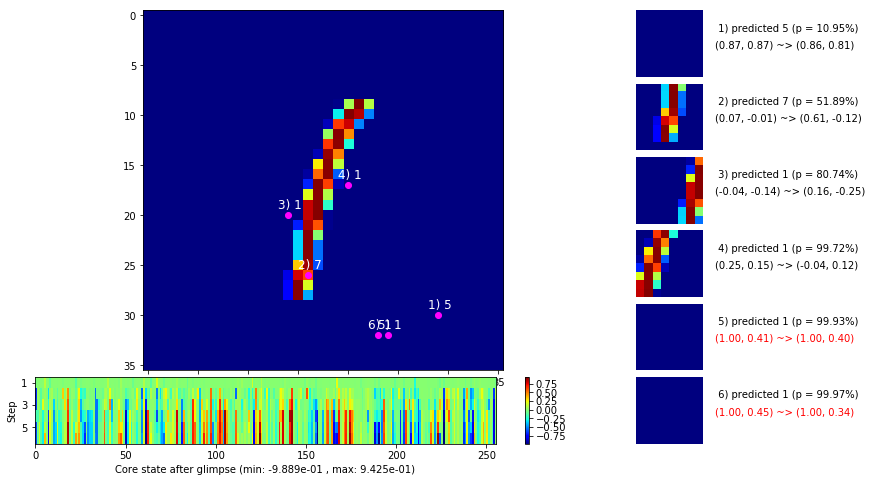

 b   1500/  3000 >> 132.5 ms/b | lr: 2.61e-06 | grad 2norm:  4.47 | grad inf norm:  1.069
       Weights || abs max:  1.26 (47057.36) | mean: -5.02e-03 ( 0.15) | var: 1.67e-02 (299985.97)
        Biases || abs max:  0.97 (  843.62) | mean:  1.71e-02 ( 0.92) | var: 6.48e-03 ( 7291.86)
                  class loss: 0.141 | steps: 2.030 | reward:  0.954 | acc.: 95.42%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.0 ms/b | lr: 2.55e-06 | grad 2norm:  4.19 | grad inf norm:  1.017
       Weights || abs max:  1.26 (238457.23) | mean: -5.02e-03 ( 0.48) | var: 1.67e-02 (6711447.00)
        Biases || abs max:  0.97 ( 1498.29) | mean:  1.71e-02 ( 1.46) | var: 6.48e-03 (184383.69)
                  class loss: 0.125 | steps: 2.024 | reward:  0.960 | acc.: 95.96%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

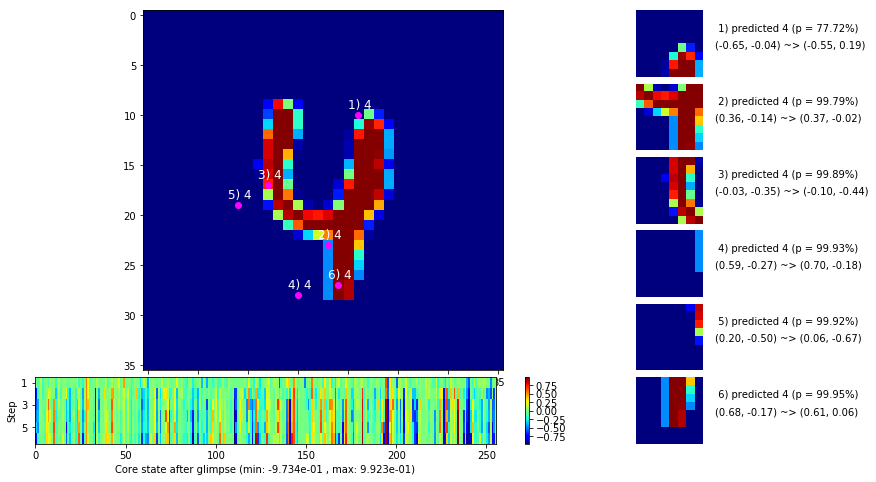

 b   2500/  3000 >> 143.0 ms/b | lr: 2.48e-06 | grad 2norm:  4.25 | grad inf norm:  1.054
       Weights || abs max:  1.26 (45090.07) | mean: -5.02e-03 ( 0.14) | var: 1.67e-02 (85216.70)
        Biases || abs max:  0.97 (  315.99) | mean:  1.71e-02 ( 0.50) | var: 6.48e-03 (  240.54)
                  class loss: 0.127 | steps: 2.018 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.3 ms/b | lr: 2.43e-06 | grad 2norm:  4.13 | grad inf norm:  1.066
       Weights || abs max:  1.26 (135842.22) | mean: -5.02e-03 ( 0.29) | var: 1.67e-02 (6769127.00)
        Biases || abs max:  0.97 ( 4447.75) | mean:  1.71e-02 ( 2.15) | var: 6.48e-03 (366374.34)
                  class loss: 0.126 | steps: 2.027 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

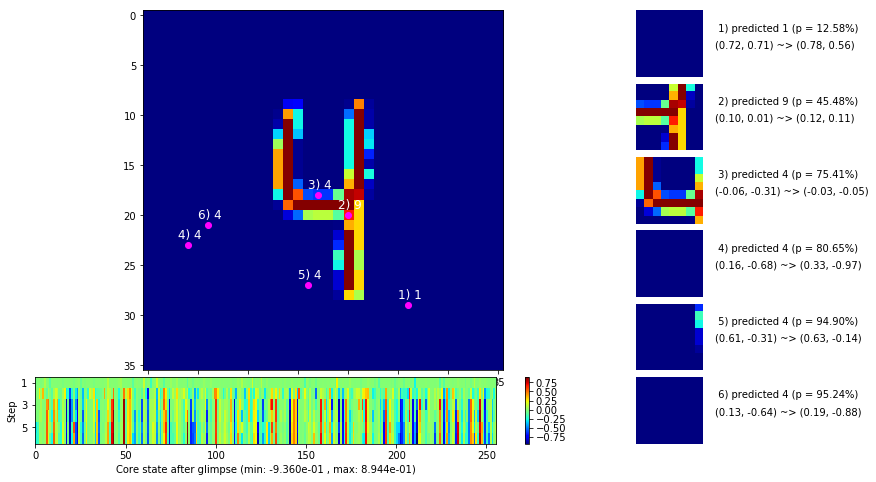

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


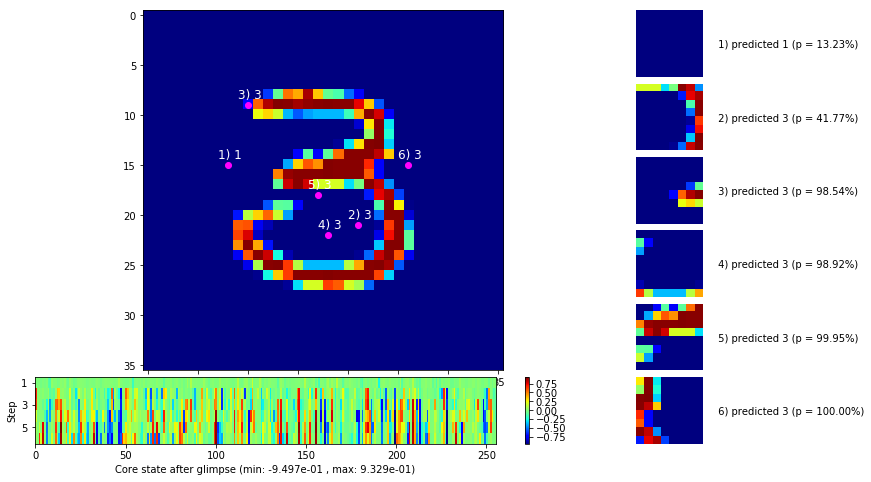


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


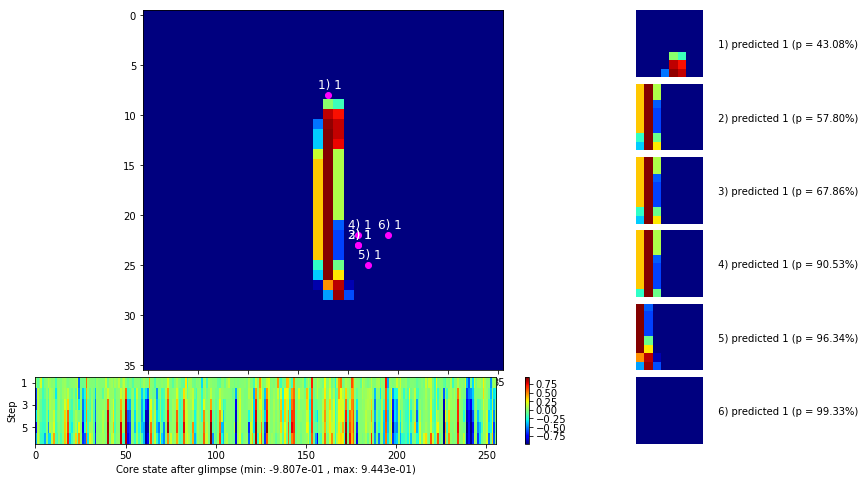

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


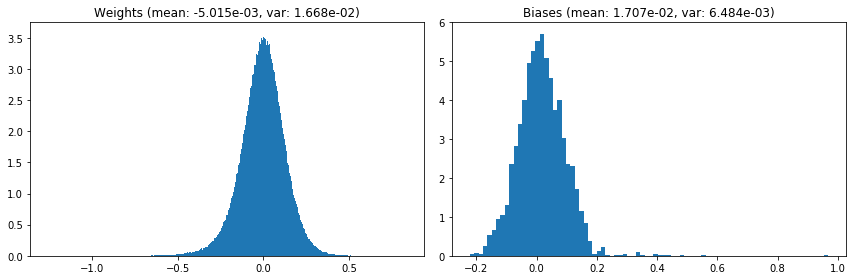

                                      Location network weights and biases


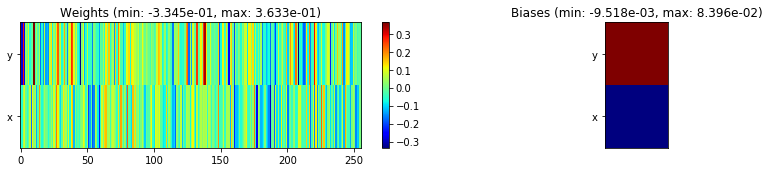

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.90 sec | TRAIN >> class loss: 0.1319 | steps:  2.025 :( | reward:  0.9566 :( | acc.: 95.655% :(
                          | VAL   >> class loss: 0.1331 | steps:  1.941 :( | reward:  0.9560 :( | acc.: 95.600% :(


Epoch  41/400) lr = 2.405e-06
 b    500/  3000 >> 132.7 ms/b | lr: 2.36e-06 | grad 2norm:  4.14 | grad inf norm:  0.985
       Weights || abs max:  1.26 (36464.36) | mean: -5.02e-03 ( 0.13) | var: 1.67e-02 (74177.38)
        Biases || abs max:  0.97 ( 1031.95) | mean:  1.71e-02 ( 0.85) | var: 6.48e-03 ( 2103.90)
                  class loss: 0.119 | steps: 2.017 | reward:  0.961 | acc.: 96.10%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 2.31e-06 | grad 2norm:  4.34 | grad inf norm:  1.056
       Weights || abs max:  1.26 (23611.32) | mean: -5.01e-03 ( 0.11) |

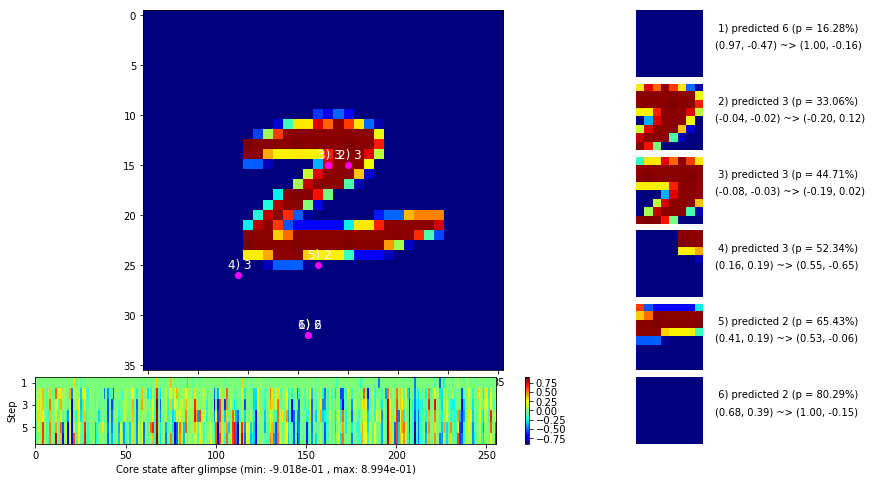

 b   1500/  3000 >> 134.4 ms/b | lr: 2.24e-06 | grad 2norm:  4.59 | grad inf norm:  1.120
       Weights || abs max:  1.26 (80953.97) | mean: -5.01e-03 ( 0.20) | var: 1.67e-02 (1559256.88)
        Biases || abs max:  0.97 (  972.42) | mean:  1.71e-02 ( 0.76) | var: 6.48e-03 (57092.02)
                  class loss: 0.145 | steps: 2.030 | reward:  0.951 | acc.: 95.13%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.8 ms/b | lr: 2.20e-06 | grad 2norm:  4.05 | grad inf norm:  1.032
       Weights || abs max:  1.26 (42599.67) | mean: -5.01e-03 ( 0.13) | var: 1.67e-02 (160049.11)
        Biases || abs max:  0.97 (  247.25) | mean:  1.71e-02 ( 0.41) | var: 6.48e-03 (   71.46)
                  class loss: 0.124 | steps: 2.006 | reward:  0.960 | acc.: 96.02%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

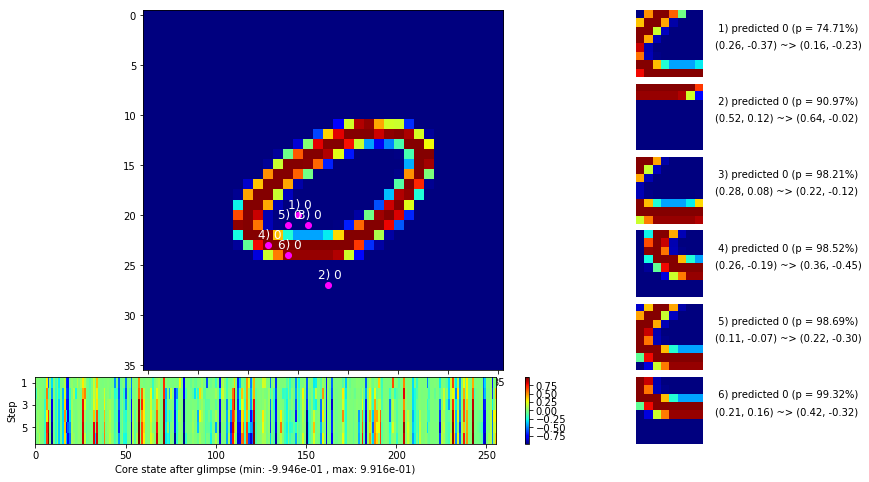

 b   2500/  3000 >> 133.2 ms/b | lr: 2.13e-06 | grad 2norm:  4.13 | grad inf norm:  1.030
       Weights || abs max:  1.26 ( 5657.16) | mean: -5.01e-03 ( 0.06) | var: 1.67e-02 (  170.15)
        Biases || abs max:  0.97 (  275.27) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   78.45)
                  class loss: 0.127 | steps: 2.030 | reward:  0.960 | acc.: 95.95%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.0 ms/b | lr: 2.09e-06 | grad 2norm:  4.02 | grad inf norm:  0.989
       Weights || abs max:  1.26 (33001.53) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (21881.93)
        Biases || abs max:  0.97 (  245.56) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   55.57)
                  class loss: 0.125 | steps: 2.025 | reward:  0.962 | acc.: 96.15%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

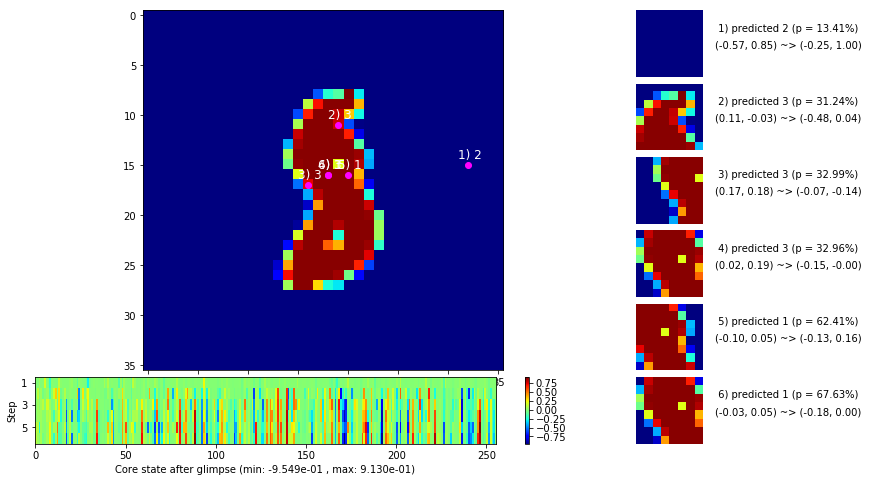

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


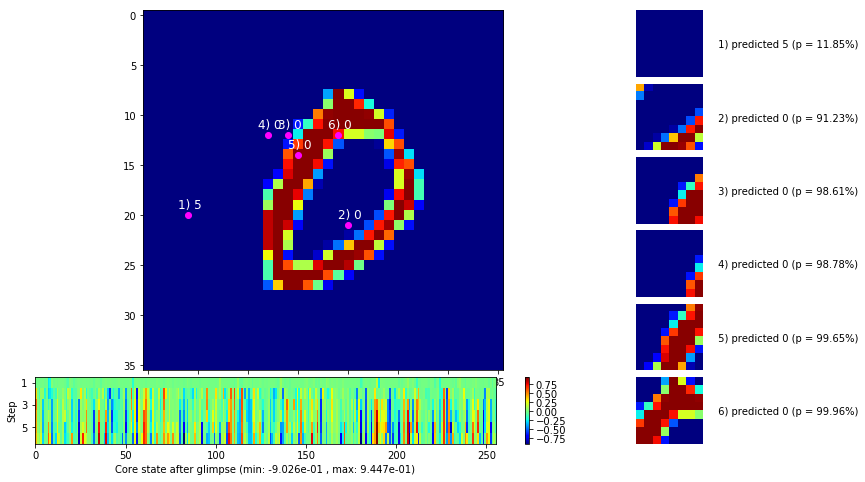


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


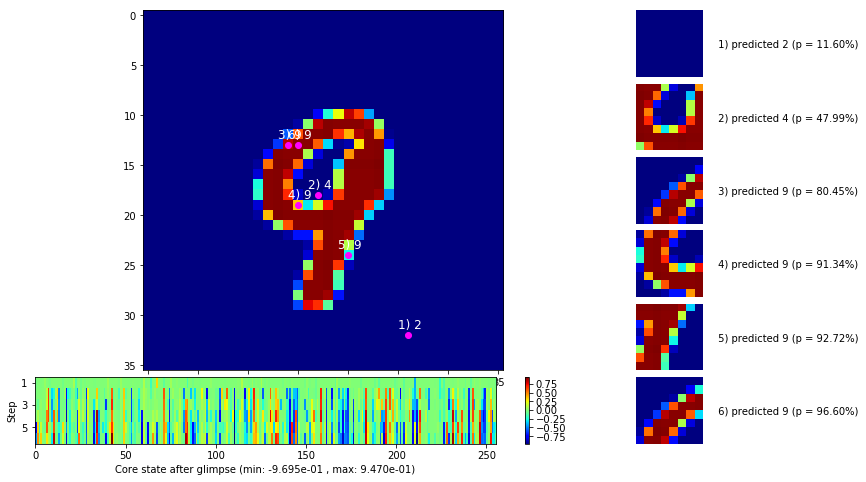

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


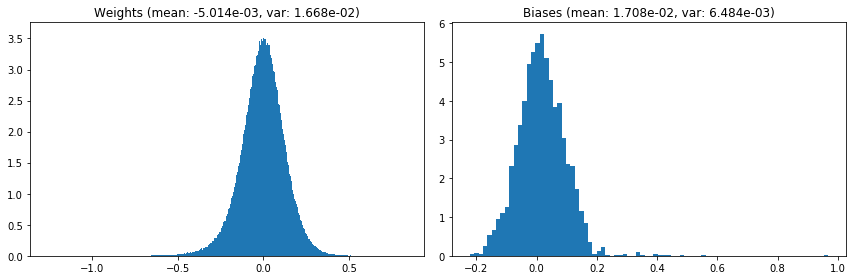

                                      Location network weights and biases


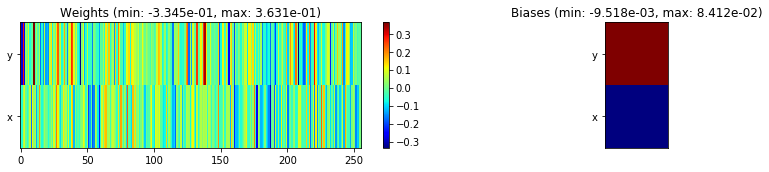

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.56 sec | TRAIN >> class loss: 0.1290 | steps:  2.023    | reward:  0.9583    | acc.: 95.833% 
                          | VAL   >> class loss: 0.1318 | steps:  1.909 :( | reward:  0.9546 :( | acc.: 95.460% :(


Epoch  42/400) lr = 2.068e-06
 b    500/  3000 >> 132.0 ms/b | lr: 2.03e-06 | grad 2norm:  4.01 | grad inf norm:  1.026
       Weights || abs max:  1.26 (19447.82) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 6103.06)
        Biases || abs max:  0.97 (  659.42) | mean:  1.71e-02 ( 0.59) | var: 6.48e-03 (  481.81)
                  class loss: 0.120 | steps: 2.021 | reward:  0.960 | acc.: 95.97%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 145.5 ms/b | lr: 1.99e-06 | grad 2norm:  4.19 | grad inf norm:  1.027
       Weights || abs max:  1.26 (38588.86) | mean: -5.01e-03 ( 0.12) | v

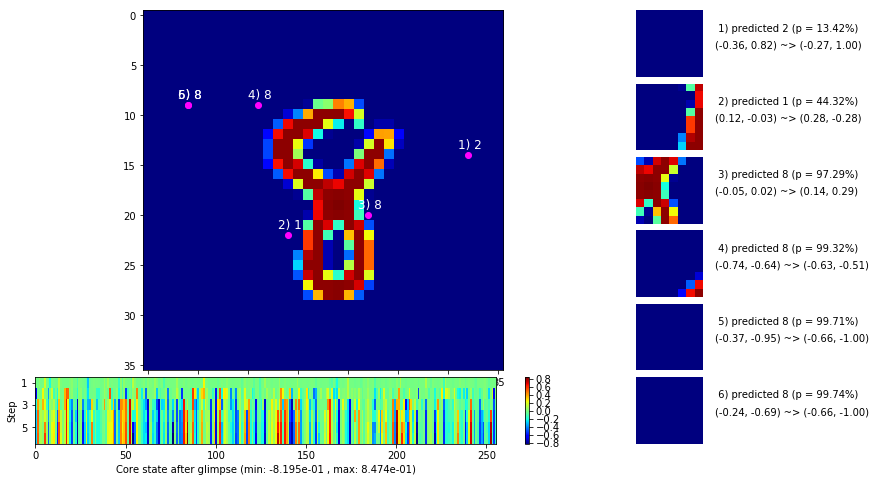

 b   1500/  3000 >> 133.3 ms/b | lr: 1.93e-06 | grad 2norm:  4.19 | grad inf norm:  1.030
       Weights || abs max:  1.26 (37181.60) | mean: -5.01e-03 ( 0.13) | var: 1.67e-02 (97667.28)
        Biases || abs max:  0.97 ( 4781.78) | mean:  1.71e-02 ( 2.21) | var: 6.48e-03 (271248.03)
                  class loss: 0.127 | steps: 2.036 | reward:  0.958 | acc.: 95.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 1.89e-06 | grad 2norm:  4.36 | grad inf norm:  1.120
       Weights || abs max:  1.26 (53169.35) | mean: -5.01e-03 ( 0.15) | var: 1.67e-02 (64484.34)
        Biases || abs max:  0.97 (19275.06) | mean:  1.71e-02 ( 7.91) | var: 6.49e-03 (2469049.00)
                  class loss: 0.142 | steps: 2.035 | reward:  0.954 | acc.: 95.40%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

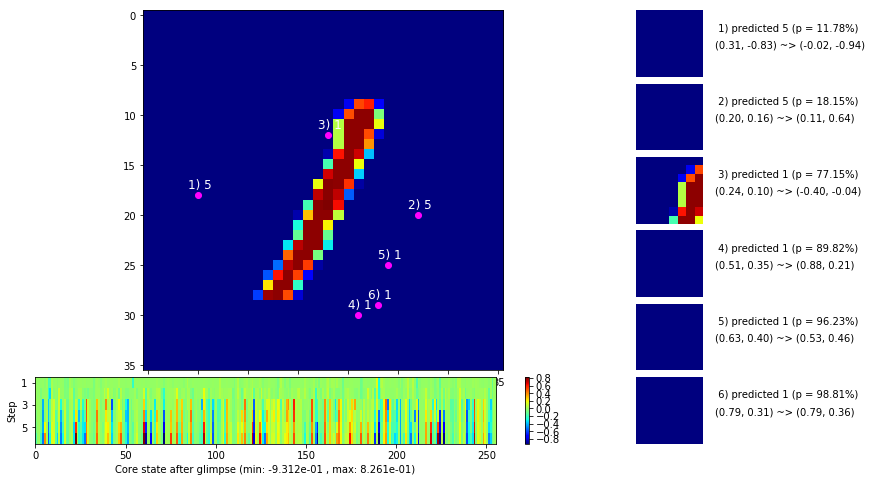

 b   2500/  3000 >> 134.1 ms/b | lr: 1.83e-06 | grad 2norm:  4.34 | grad inf norm:  1.052
       Weights || abs max:  1.26 (16881.56) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 3349.63)
        Biases || abs max:  0.97 ( 1205.17) | mean:  1.71e-02 ( 0.85) | var: 6.48e-03 ( 2630.70)
                  class loss: 0.136 | steps: 2.031 | reward:  0.956 | acc.: 95.60%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.7 ms/b | lr: 1.80e-06 | grad 2norm:  4.26 | grad inf norm:  1.046
       Weights || abs max:  1.26 (13422.08) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 7035.75)
        Biases || abs max:  0.97 (  432.28) | mean:  1.71e-02 ( 0.52) | var: 6.48e-03 (  176.74)
                  class loss: 0.132 | steps: 2.031 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

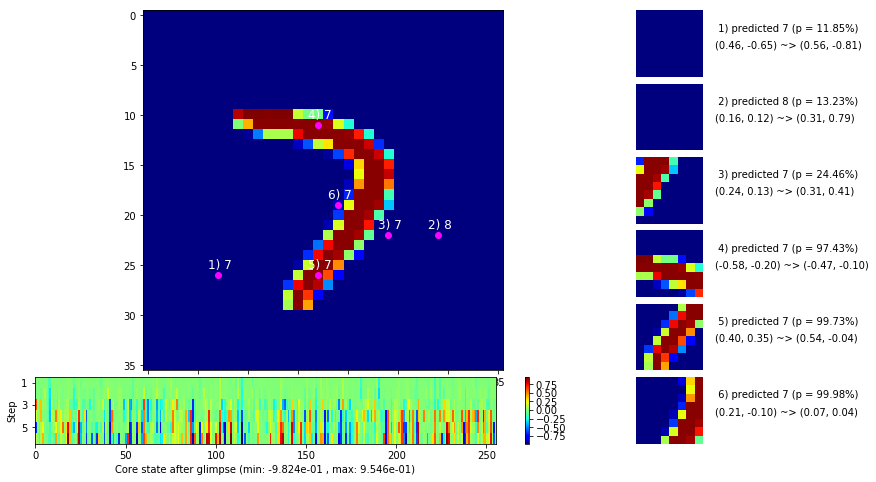

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


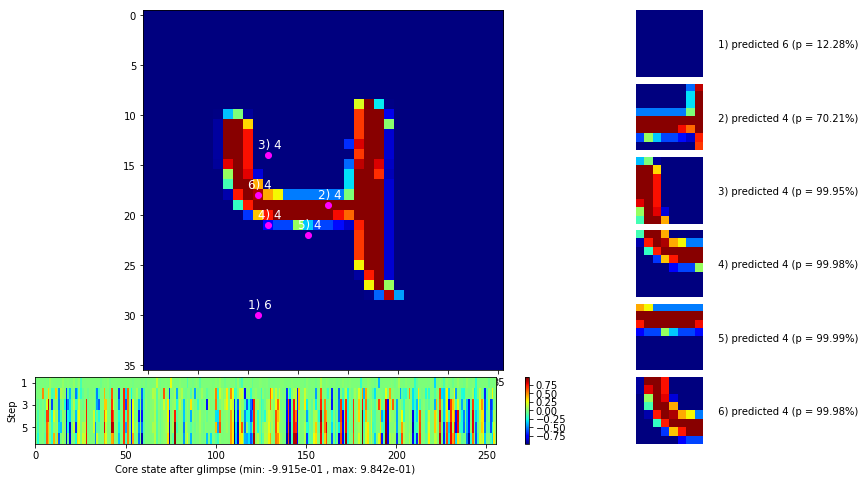


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


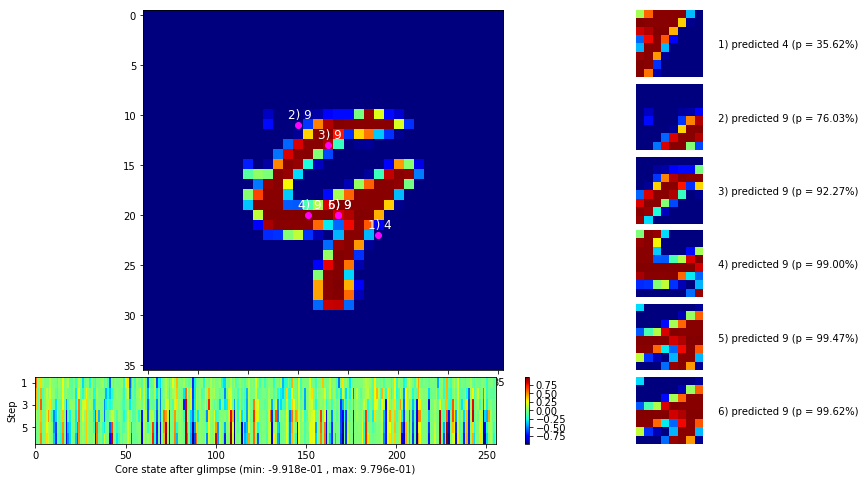

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


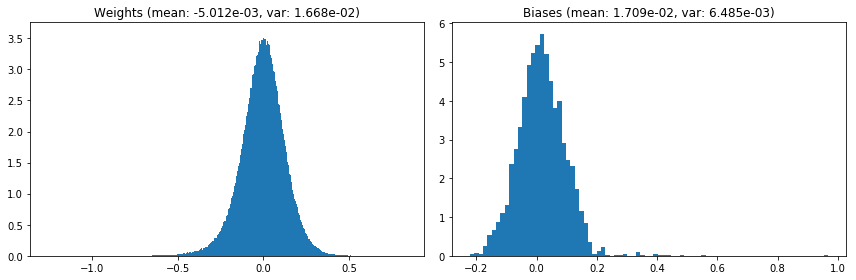

                                      Location network weights and biases


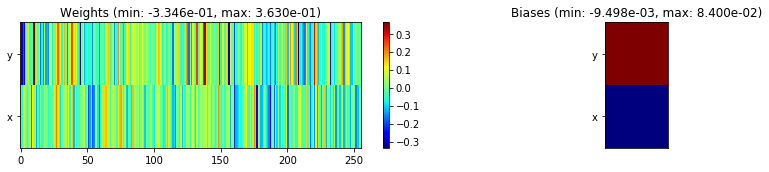

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.93 sec | TRAIN >> class loss: 0.1301 | steps:  2.028 :( | reward:  0.9571 :( | acc.: 95.713% :(
                          | VAL   >> class loss: 0.1497 | steps:  1.925 :( | reward:  0.9496 :( | acc.: 94.960% :(


Epoch  43/400) lr = 1.779e-06
 b    500/  3000 >> 131.1 ms/b | lr: 1.74e-06 | grad 2norm:  4.17 | grad inf norm:  0.978
       Weights || abs max:  1.26 (32442.08) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 (337349.66)
        Biases || abs max:  0.97 ( 2527.86) | mean:  1.71e-02 ( 1.38) | var: 6.48e-03 (16091.12)
                  class loss: 0.125 | steps: 2.017 | reward:  0.960 | acc.: 96.00%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.0 ms/b | lr: 1.71e-06 | grad 2norm:  4.49 | grad inf norm:  1.099
       Weights || abs max:  1.26 ( 8254.17) | mean: -5.01e-03 ( 0.07) 

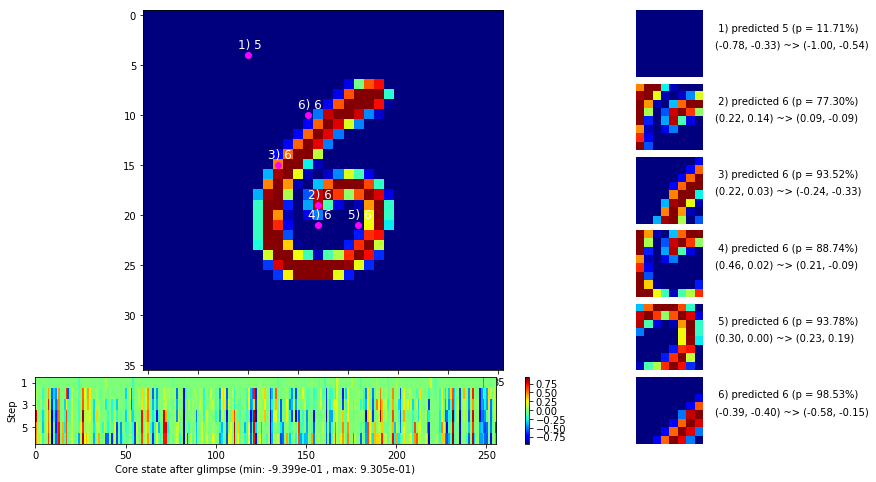

 b   1500/  3000 >> 133.2 ms/b | lr: 1.66e-06 | grad 2norm:  4.31 | grad inf norm:  1.054
       Weights || abs max:  1.26 (10725.75) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 (  843.91)
        Biases || abs max:  0.97 (  339.00) | mean:  1.71e-02 ( 0.50) | var: 6.48e-03 (  101.39)
                  class loss: 0.135 | steps: 2.014 | reward:  0.957 | acc.: 95.65%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.4 ms/b | lr: 1.63e-06 | grad 2norm:  4.24 | grad inf norm:  1.020
       Weights || abs max:  1.26 (32258.58) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 (104710.62)
        Biases || abs max:  0.97 ( 1393.92) | mean:  1.71e-02 ( 1.00) | var: 6.48e-03 (20443.03)
                  class loss: 0.129 | steps: 2.039 | reward:  0.958 | acc.: 95.81%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

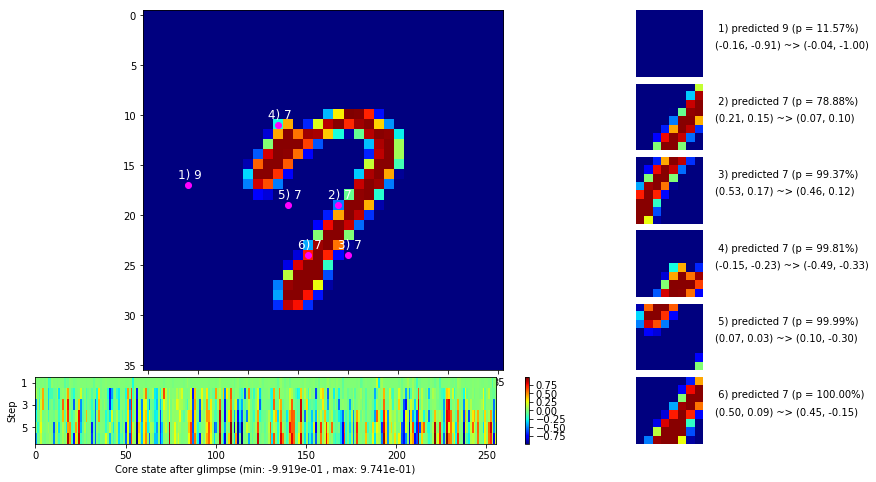

 b   2500/  3000 >> 142.7 ms/b | lr: 1.58e-06 | grad 2norm:  4.26 | grad inf norm:  1.039
       Weights || abs max:  1.26 (40154.21) | mean: -5.01e-03 ( 0.13) | var: 1.67e-02 (112702.68)
        Biases || abs max:  0.97 (  769.85) | mean:  1.71e-02 ( 0.94) | var: 6.48e-03 ( 3801.87)
                  class loss: 0.132 | steps: 2.031 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.8 ms/b | lr: 1.55e-06 | grad 2norm:  4.20 | grad inf norm:  1.042
       Weights || abs max:  1.26 (52265.32) | mean: -5.01e-03 ( 0.15) | var: 1.67e-02 (144409.55)
        Biases || abs max:  0.97 (  555.22) | mean:  1.71e-02 ( 0.78) | var: 6.48e-03 ( 2460.29)
                  class loss: 0.127 | steps: 2.045 | reward:  0.958 | acc.: 95.83%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

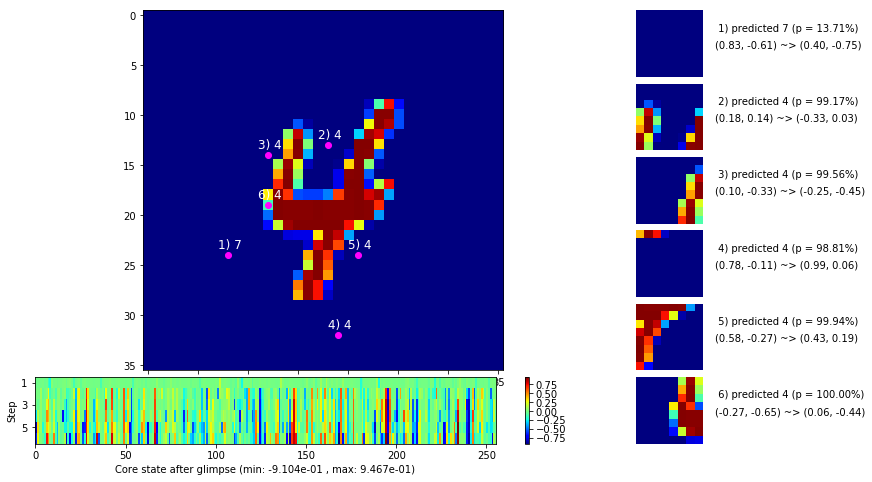

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


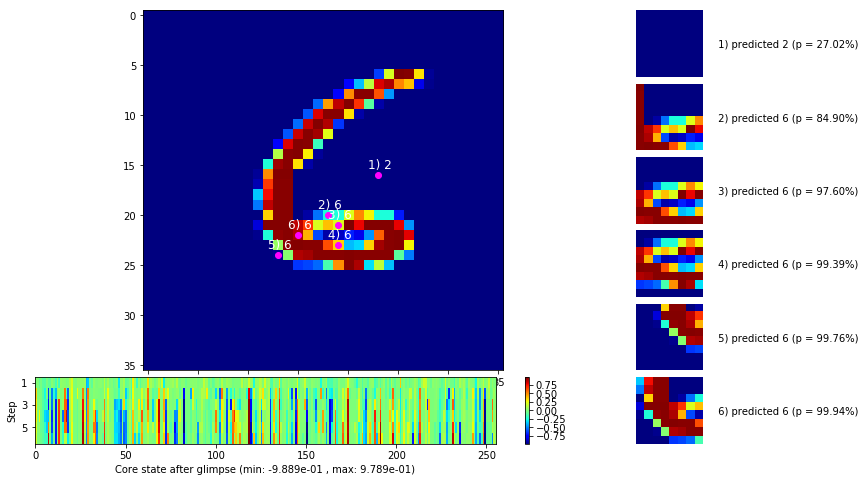


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


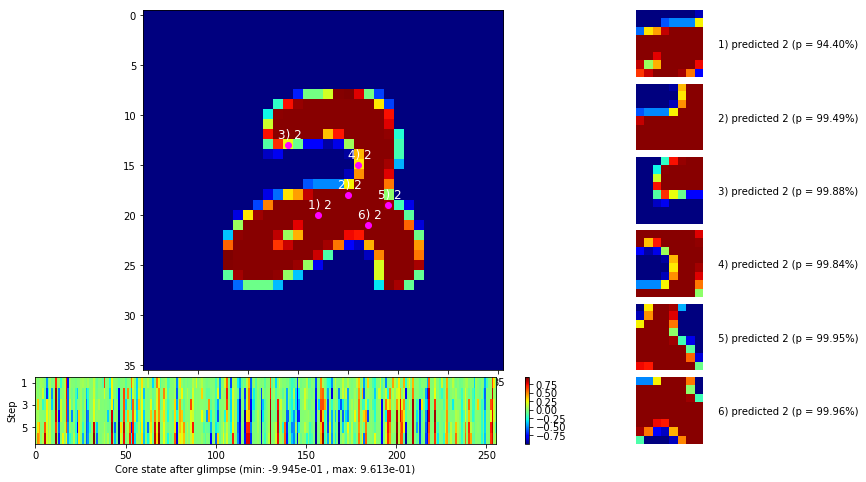

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


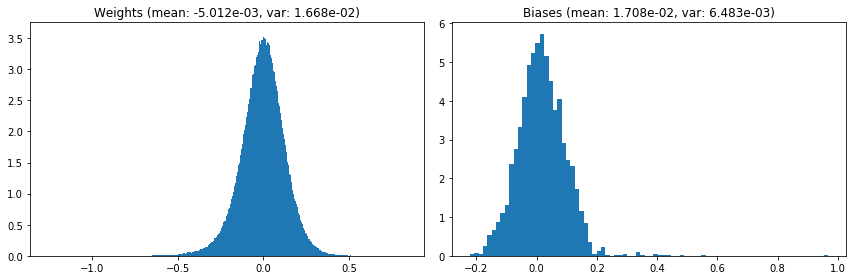

                                      Location network weights and biases


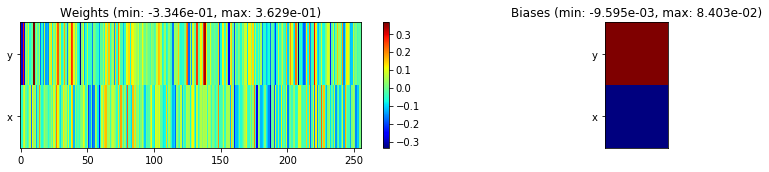

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.17 sec | TRAIN >> class loss: 0.1312 | steps:  2.029 :( | reward:  0.9572 :( | acc.: 95.723% :(
                          | VAL   >> class loss: 0.1411 | steps:  1.949 :( | reward:  0.9542 :( | acc.: 95.420% :(


Epoch  44/400) lr = 1.53e-06
 b    500/  3000 >> 132.6 ms/b | lr: 1.50e-06 | grad 2norm:  4.30 | grad inf norm:  1.037
       Weights || abs max:  1.26 (11278.74) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1040.30)
        Biases || abs max:  0.97 (  464.68) | mean:  1.71e-02 ( 0.70) | var: 6.48e-03 ( 5875.29)
                  class loss: 0.128 | steps: 2.028 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.0 ms/b | lr: 1.47e-06 | grad 2norm:  4.32 | grad inf norm:  1.050
       Weights || abs max:  1.26 (27892.26) | mean: -5.01e-03 ( 0.11) | 

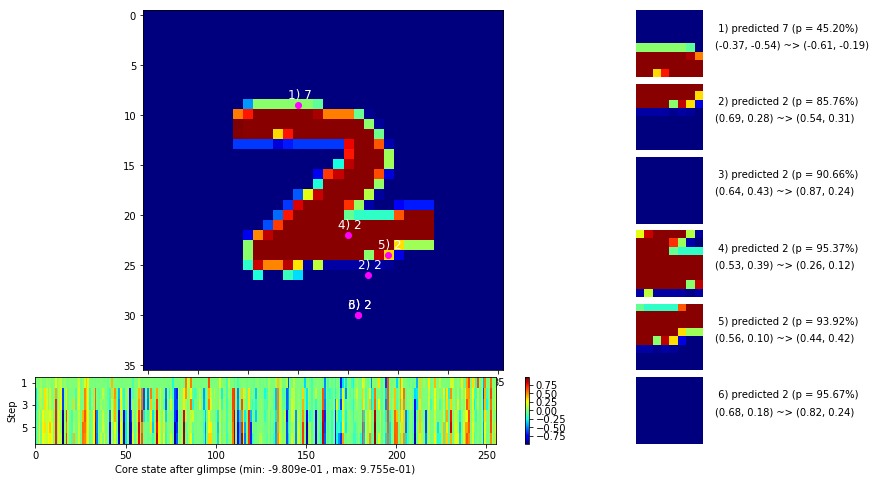

 b   1500/  3000 >> 133.7 ms/b | lr: 1.43e-06 | grad 2norm:  4.36 | grad inf norm:  1.073
       Weights || abs max:  1.26 (11839.01) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 2680.13)
        Biases || abs max:  0.97 (  365.07) | mean:  1.71e-02 ( 0.60) | var: 6.48e-03 (  569.35)
                  class loss: 0.137 | steps: 2.057 | reward:  0.956 | acc.: 95.61%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 1.40e-06 | grad 2norm:  4.29 | grad inf norm:  1.027
       Weights || abs max:  1.26 (11566.95) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1136.21)
        Biases || abs max:  0.97 (  281.60) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   80.39)
                  class loss: 0.135 | steps: 2.027 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

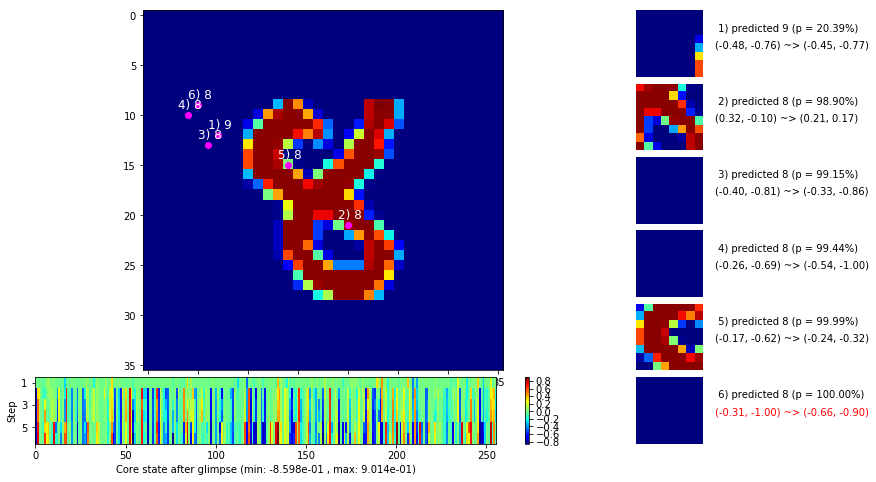

 b   2500/  3000 >> 136.7 ms/b | lr: 1.36e-06 | grad 2norm:  4.25 | grad inf norm:  1.034
       Weights || abs max:  1.26 (26653.27) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 (10008.83)
        Biases || abs max:  0.97 (  909.68) | mean:  1.71e-02 ( 0.81) | var: 6.48e-03 ( 7500.60)
                  class loss: 0.131 | steps: 2.029 | reward:  0.958 | acc.: 95.76%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.5 ms/b | lr: 1.33e-06 | grad 2norm:  4.24 | grad inf norm:  1.038
       Weights || abs max:  1.26 (18803.62) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 5553.20)
        Biases || abs max:  0.97 ( 1052.72) | mean:  1.71e-02 ( 0.77) | var: 6.48e-03 ( 1090.42)
                  class loss: 0.131 | steps: 2.009 | reward:  0.958 | acc.: 95.77%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

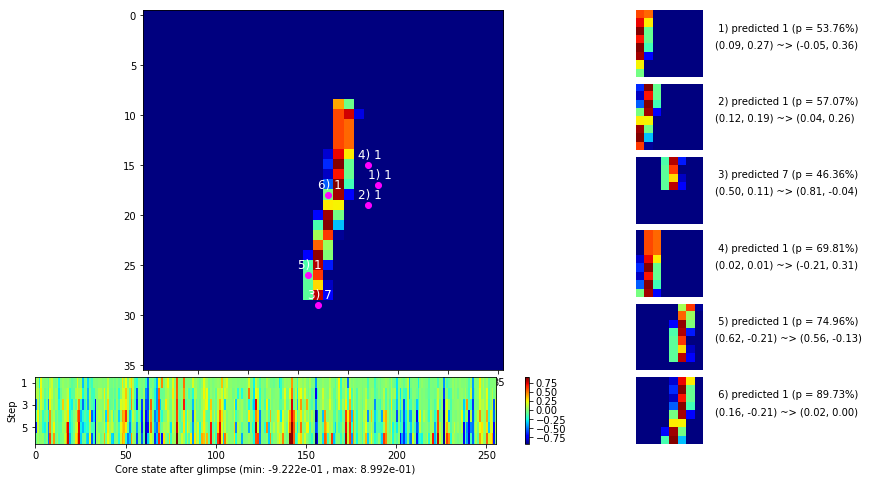

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


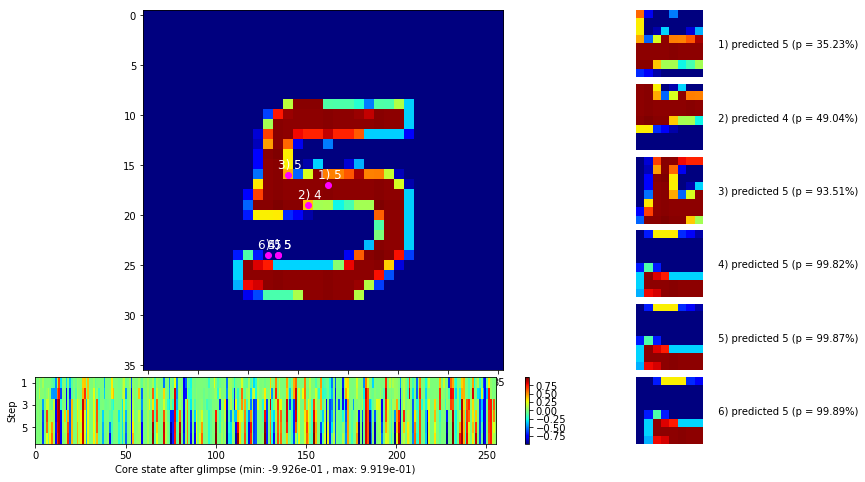


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


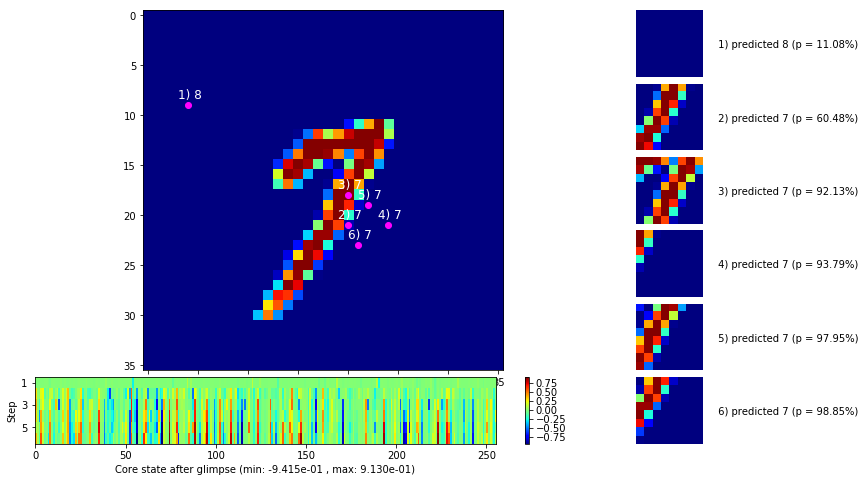

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


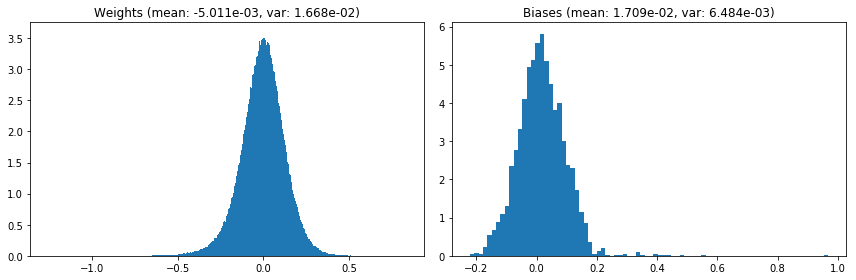

                                      Location network weights and biases


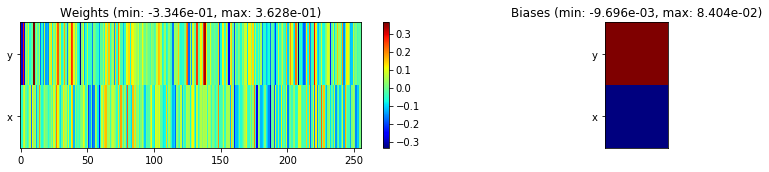

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.87 sec | TRAIN >> class loss: 0.1324 | steps:  2.029 :( | reward:  0.9569 :( | acc.: 95.690% :(
                          | VAL   >> class loss: 0.1426 | steps:  1.925 :( | reward:  0.9578    | acc.: 95.780% 


Epoch  45/400) lr = 1.316e-06
 b    500/  3000 >> 134.0 ms/b | lr: 1.29e-06 | grad 2norm:  4.22 | grad inf norm:  1.016
       Weights || abs max:  1.26 ( 9944.99) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 2342.14)
        Biases || abs max:  0.97 (  526.77) | mean:  1.71e-02 ( 0.55) | var: 6.48e-03 (  301.48)
                  class loss: 0.127 | steps: 2.021 | reward:  0.959 | acc.: 95.93%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.8 ms/b | lr: 1.26e-06 | grad 2norm:  4.33 | grad inf norm:  1.066
       Weights || abs max:  1.26 (11954.62) | mean: -5.01e-03 ( 0.08) | v

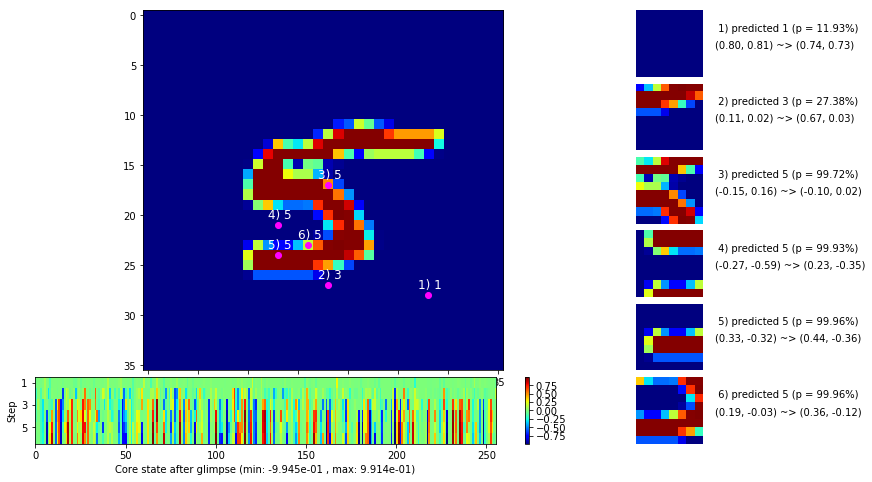

 b   1500/  3000 >> 133.0 ms/b | lr: 1.23e-06 | grad 2norm:  4.16 | grad inf norm:  1.036
       Weights || abs max:  1.26 (141171.12) | mean: -5.01e-03 ( 0.29) | var: 1.67e-02 (2019571.12)
        Biases || abs max:  0.97 (  290.00) | mean:  1.71e-02 ( 0.50) | var: 6.48e-03 (  219.00)
                  class loss: 0.122 | steps: 2.028 | reward:  0.959 | acc.: 95.88%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 1.20e-06 | grad 2norm:  4.43 | grad inf norm:  1.053
       Weights || abs max:  1.26 (45756.05) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (46904.05)
        Biases || abs max:  0.97 (  334.37) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (  104.27)
                  class loss: 0.130 | steps: 2.034 | reward:  0.955 | acc.: 95.54%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

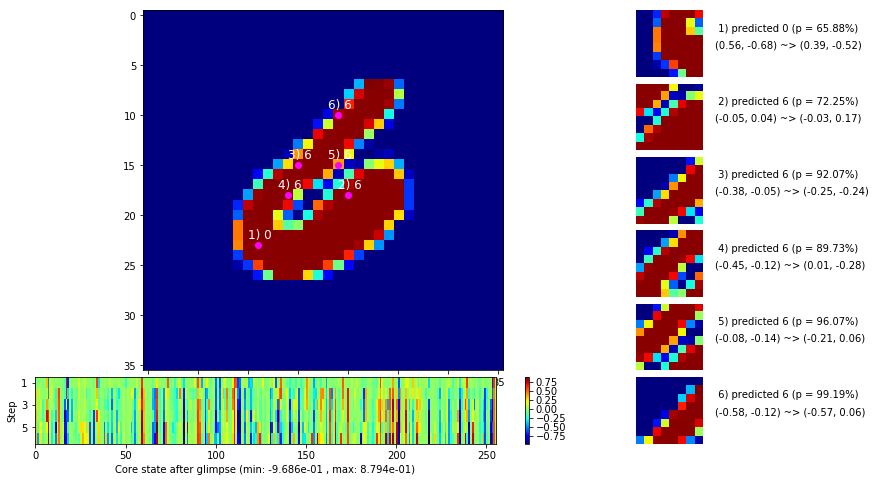

 b   2500/  3000 >> 134.0 ms/b | lr: 1.17e-06 | grad 2norm:  4.32 | grad inf norm:  1.090
       Weights || abs max:  1.26 (23585.48) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 ( 3392.29)
        Biases || abs max:  0.97 (  229.02) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   54.06)
                  class loss: 0.133 | steps: 2.028 | reward:  0.955 | acc.: 95.49%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.3 ms/b | lr: 1.14e-06 | grad 2norm:  4.15 | grad inf norm:  1.039
       Weights || abs max:  1.26 (47993.08) | mean: -5.01e-03 ( 0.15) | var: 1.67e-02 (89356.62)
        Biases || abs max:  0.97 (  191.54) | mean:  1.71e-02 ( 0.40) | var: 6.48e-03 (   37.97)
                  class loss: 0.125 | steps: 2.008 | reward:  0.958 | acc.: 95.79%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

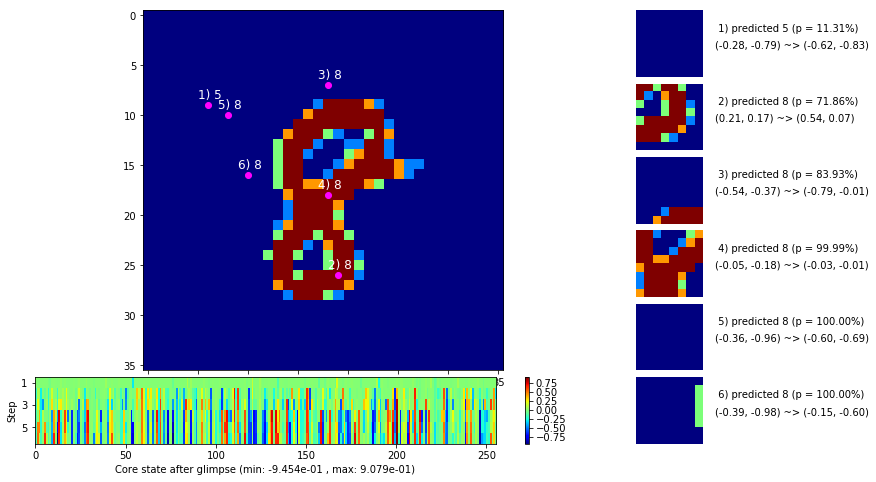

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


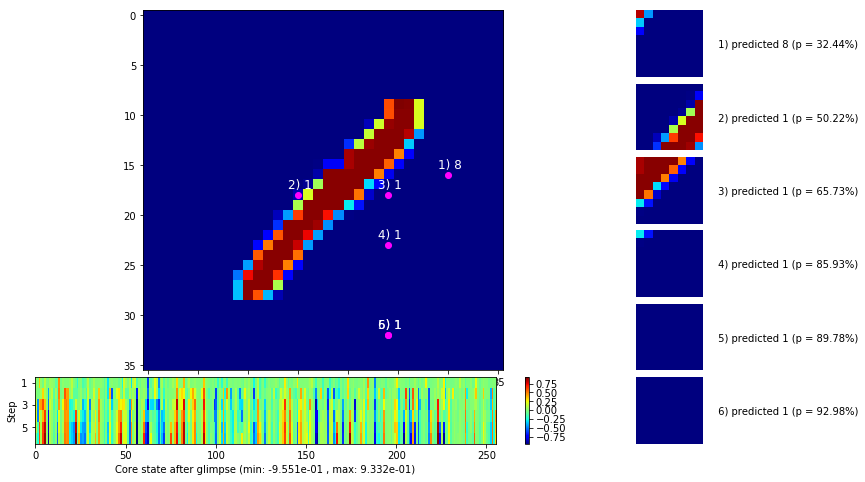


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


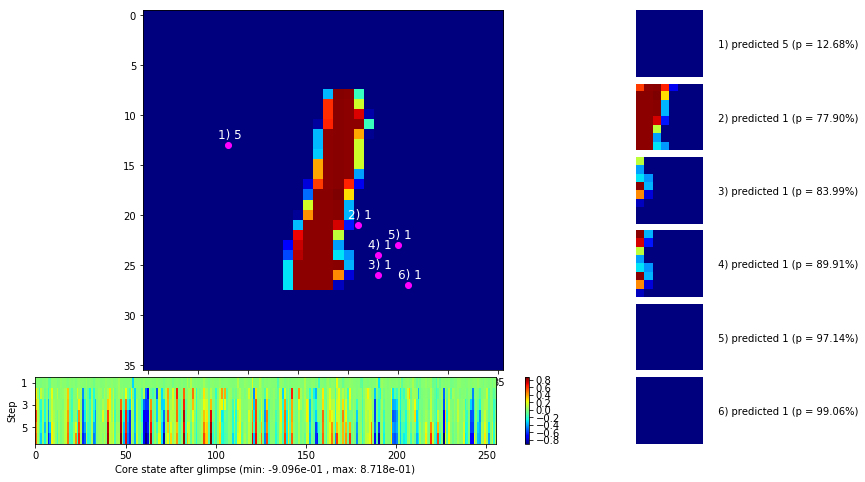

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


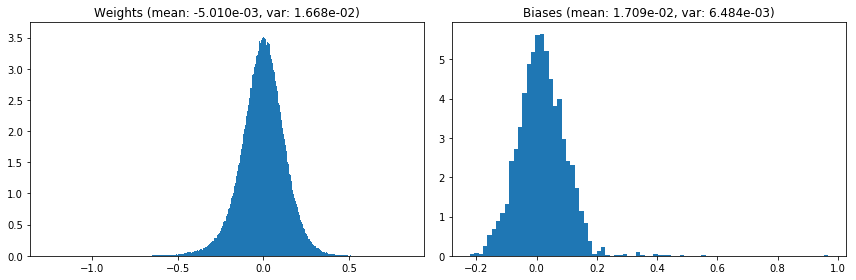

                                      Location network weights and biases


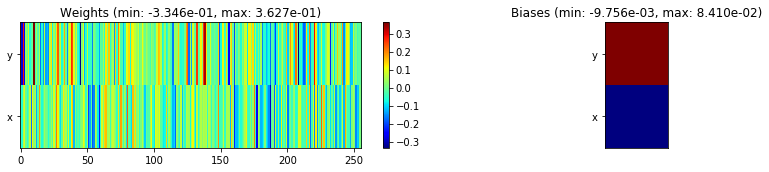

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.62 sec | TRAIN >> class loss: 0.1295 | steps:  2.023 :( | reward:  0.9571 :( | acc.: 95.712% :(
                          | VAL   >> class loss: 0.1428 | steps:  1.917 :( | reward:  0.9542 :( | acc.: 95.420% :(


Epoch  46/400) lr = 1.132e-06
 b    500/  3000 >> 132.9 ms/b | lr: 1.11e-06 | grad 2norm:  4.43 | grad inf norm:  1.075
       Weights || abs max:  1.26 (12178.85) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 1926.83)
        Biases || abs max:  0.97 (  187.74) | mean:  1.71e-02 ( 0.41) | var: 6.48e-03 (   40.60)
                  class loss: 0.139 | steps: 2.032 | reward:  0.955 | acc.: 95.52%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.4 ms/b | lr: 1.09e-06 | grad 2norm:  4.32 | grad inf norm:  1.069
       Weights || abs max:  1.26 (25360.93) | mean: -5.01e-03 ( 0.11) |

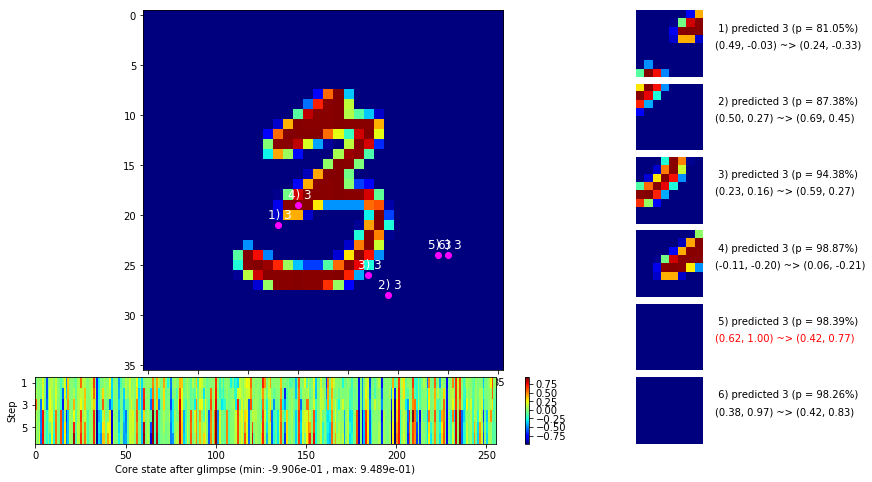

 b   1500/  3000 >> 134.1 ms/b | lr: 1.05e-06 | grad 2norm:  4.13 | grad inf norm:  0.998
       Weights || abs max:  1.26 (18679.31) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 (12821.40)
        Biases || abs max:  0.97 (  218.20) | mean:  1.71e-02 ( 0.41) | var: 6.48e-03 (   49.29)
                  class loss: 0.130 | steps: 2.021 | reward:  0.960 | acc.: 96.02%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.0 ms/b | lr: 1.03e-06 | grad 2norm:  4.35 | grad inf norm:  1.056
       Weights || abs max:  1.26 (116940.90) | mean: -5.01e-03 ( 0.28) | var: 1.67e-02 (1409582.88)
        Biases || abs max:  0.97 (  784.99) | mean:  1.71e-02 ( 0.92) | var: 6.48e-03 (18271.94)
                  class loss: 0.132 | steps: 2.057 | reward:  0.956 | acc.: 95.59%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

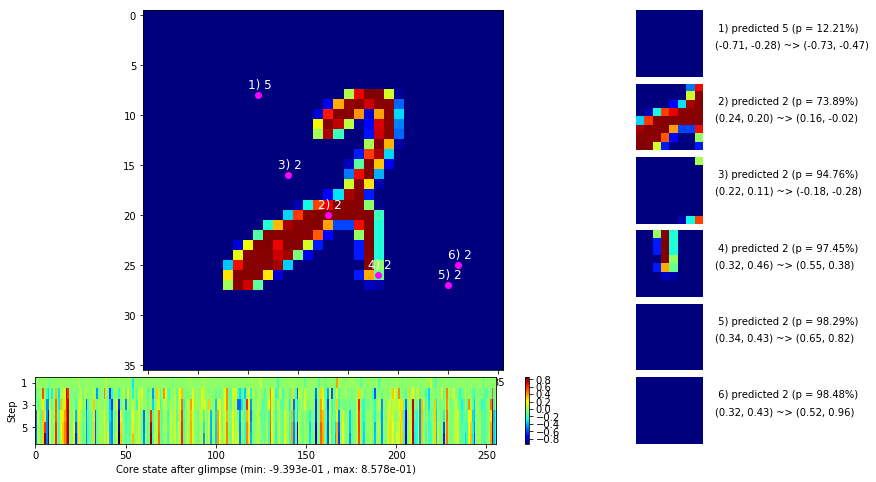

 b   2500/  3000 >> 142.5 ms/b | lr: 1.00e-06 | grad 2norm:  4.22 | grad inf norm:  1.020
       Weights || abs max:  1.26 (147942.67) | mean: -5.01e-03 ( 0.32) | var: 1.67e-02 (2050044.00)
        Biases || abs max:  0.97 (  319.32) | mean:  1.71e-02 ( 0.49) | var: 6.48e-03 (  101.15)
                  class loss: 0.130 | steps: 2.014 | reward:  0.959 | acc.: 95.92%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 9.83e-07 | grad 2norm:  4.33 | grad inf norm:  1.062
       Weights || abs max:  1.26 (11744.72) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1245.15)
        Biases || abs max:  0.97 (  200.81) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   45.57)
                  class loss: 0.132 | steps: 2.021 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

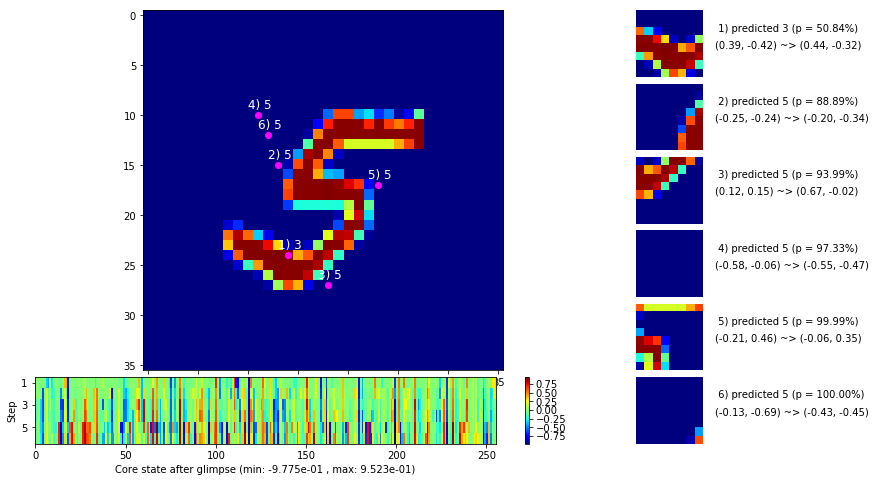

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


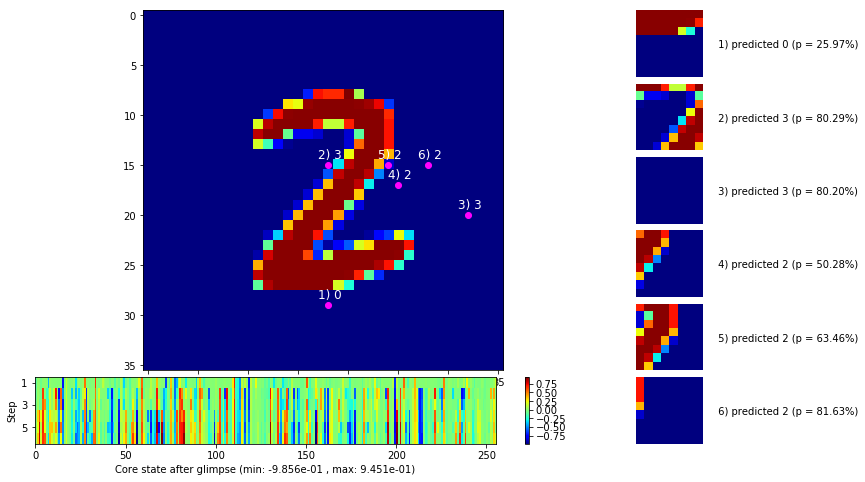


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


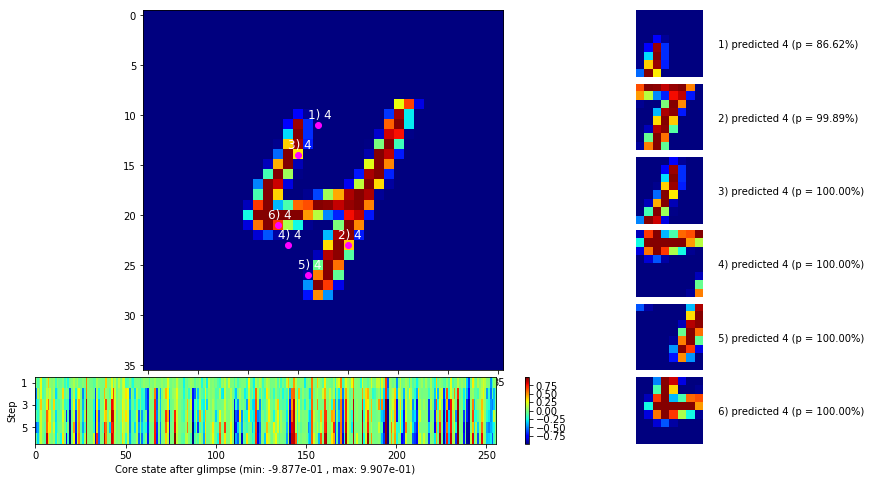

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


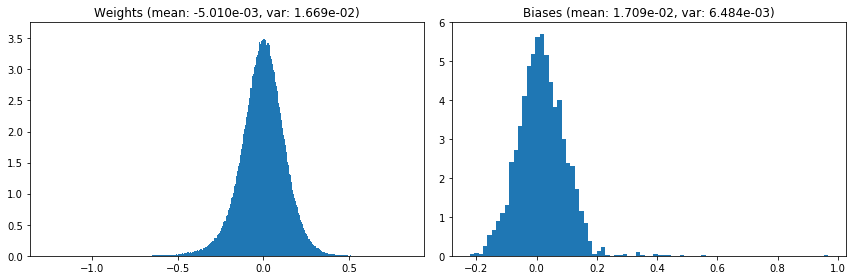

                                      Location network weights and biases


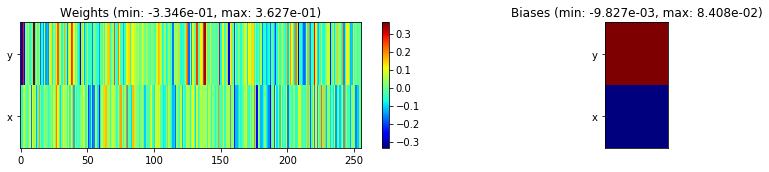

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.75 sec | TRAIN >> class loss: 0.1324 | steps:  2.029 :( | reward:  0.9572 :( | acc.: 95.720% :(
                          | VAL   >> class loss: 0.1340 | steps:  1.912 :( | reward:  0.9584    | acc.: 95.840% 


Epoch  47/400) lr = 9.734e-07
 b    500/  3000 >> 132.3 ms/b | lr: 9.54e-07 | grad 2norm:  4.36 | grad inf norm:  1.095
       Weights || abs max:  1.26 (12049.69) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1296.98)
        Biases || abs max:  0.97 (  420.87) | mean:  1.71e-02 ( 0.65) | var: 6.48e-03 ( 4030.57)
                  class loss: 0.134 | steps: 2.054 | reward:  0.955 | acc.: 95.49%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.1 ms/b | lr: 9.35e-07 | grad 2norm:  4.25 | grad inf norm:  1.036
       Weights || abs max:  1.26 (15482.89) | mean: -5.01e-03 ( 0.08) | v

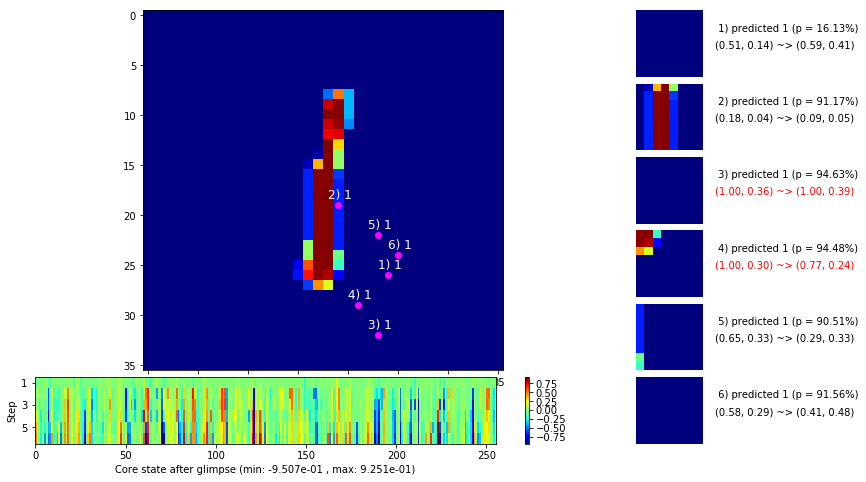

 b   1500/  3000 >> 132.6 ms/b | lr: 9.07e-07 | grad 2norm:  4.25 | grad inf norm:  1.059
       Weights || abs max:  1.26 (44310.03) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (75486.02)
        Biases || abs max:  0.97 (  172.44) | mean:  1.71e-02 ( 0.40) | var: 6.48e-03 (   32.86)
                  class loss: 0.129 | steps: 2.018 | reward:  0.958 | acc.: 95.80%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 8.89e-07 | grad 2norm:  4.35 | grad inf norm:  1.066
       Weights || abs max:  1.26 (279436.66) | mean: -5.01e-03 ( 0.53) | var: 1.67e-02 (23215126.00)
        Biases || abs max:  0.97 (  183.56) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   39.49)
                  class loss: 0.134 | steps: 2.044 | reward:  0.955 | acc.: 95.51%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

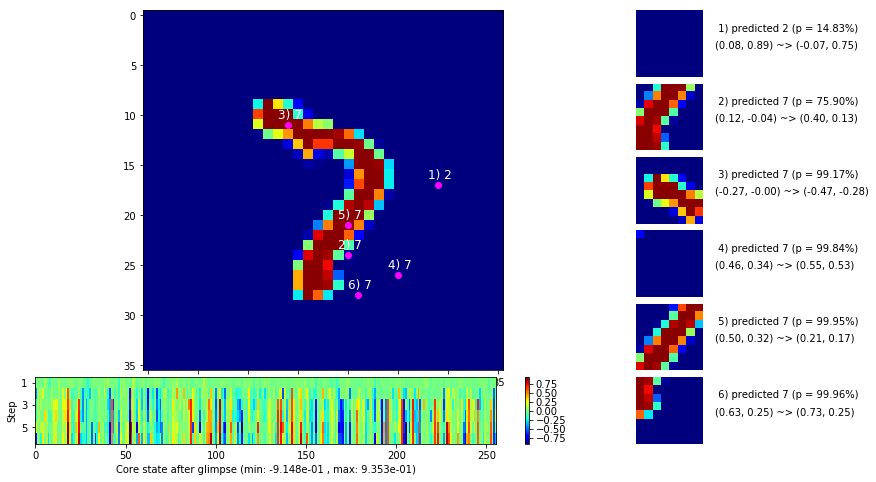

 b   2500/  3000 >> 133.9 ms/b | lr: 8.63e-07 | grad 2norm:  4.31 | grad inf norm:  1.047
       Weights || abs max:  1.26 (102855.73) | mean: -5.01e-03 ( 0.24) | var: 1.67e-02 (347823.22)
        Biases || abs max:  0.97 (  199.77) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   47.30)
                  class loss: 0.131 | steps: 2.037 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.7 ms/b | lr: 8.46e-07 | grad 2norm:  4.25 | grad inf norm:  1.024
       Weights || abs max:  1.26 (106692.81) | mean: -5.01e-03 ( 0.24) | var: 1.67e-02 (439278.31)
        Biases || abs max:  0.97 (  201.05) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   57.29)
                  class loss: 0.123 | steps: 2.026 | reward:  0.959 | acc.: 95.89%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

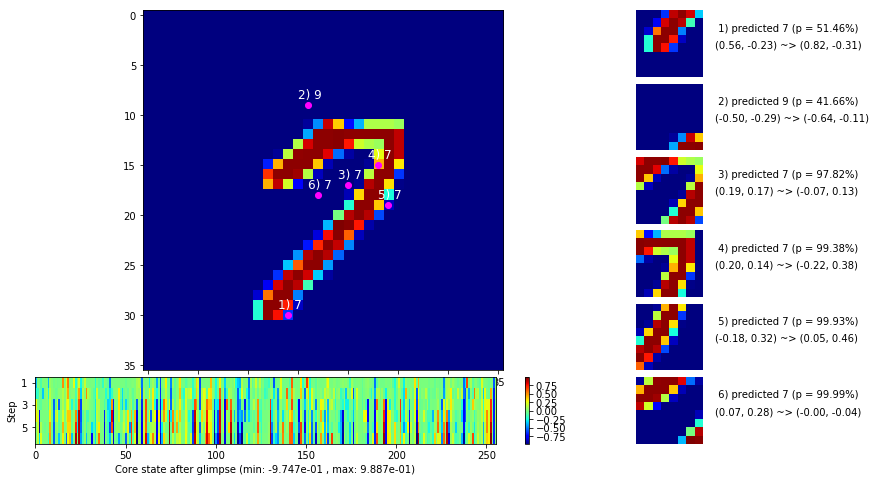

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


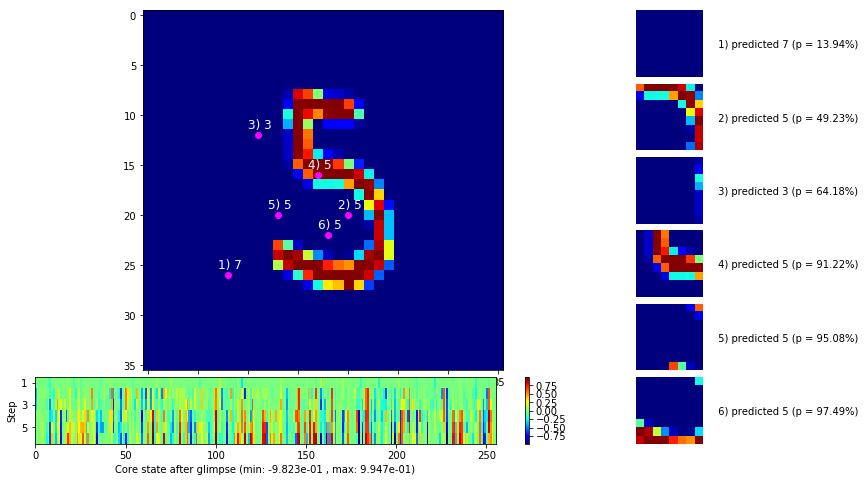


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


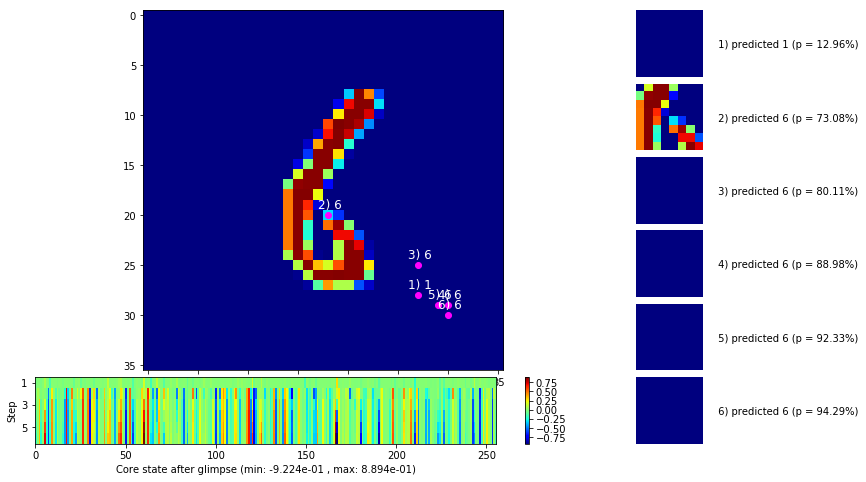

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


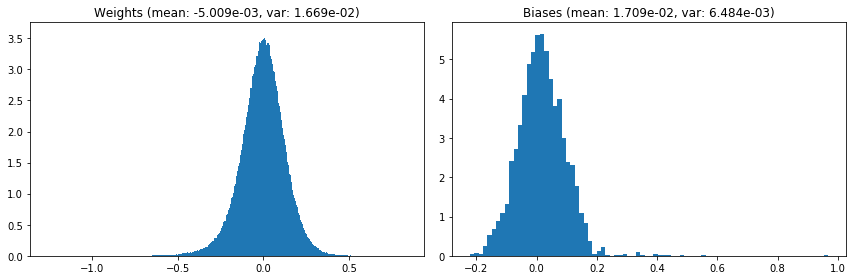

                                      Location network weights and biases


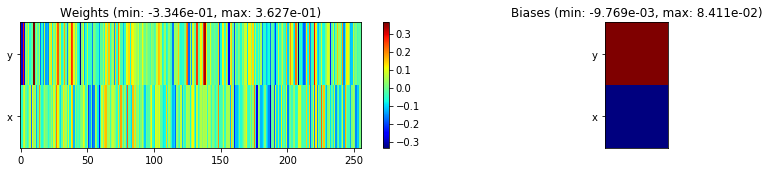

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.25 sec | TRAIN >> class loss: 0.1296 | steps:  2.034 :( | reward:  0.9569 :( | acc.: 95.688% :(
                          | VAL   >> class loss: 0.1523 | steps:  1.937 :( | reward:  0.9532 :( | acc.: 95.320% :(


Epoch  48/400) lr = 8.372e-07
 b    500/  3000 >> 135.9 ms/b | lr: 8.21e-07 | grad 2norm:  4.22 | grad inf norm:  1.029
       Weights || abs max:  1.26 (60926.38) | mean: -5.01e-03 ( 0.16) | var: 1.67e-02 (449388.28)
        Biases || abs max:  0.97 (  190.75) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   44.13)
                  class loss: 0.130 | steps: 2.017 | reward:  0.959 | acc.: 95.91%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.5 ms/b | lr: 8.04e-07 | grad 2norm:  4.42 | grad inf norm:  1.082
       Weights || abs max:  1.26 (12982.77) | mean: -5.01e-03 ( 0.08) 

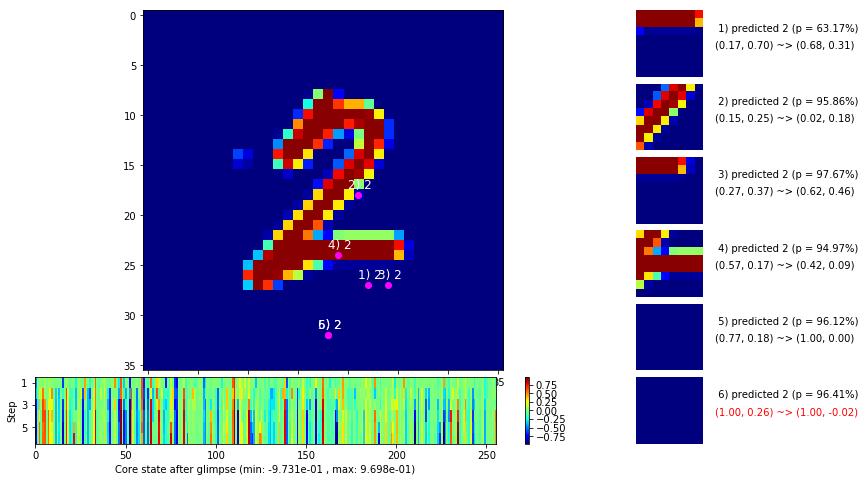

 b   1500/  3000 >> 135.6 ms/b | lr: 7.80e-07 | grad 2norm:  4.35 | grad inf norm:  1.068
       Weights || abs max:  1.26 ( 9594.06) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1526.25)
        Biases || abs max:  0.97 (  204.41) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   64.74)
                  class loss: 0.133 | steps: 2.021 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 7.65e-07 | grad 2norm:  4.34 | grad inf norm:  1.047
       Weights || abs max:  1.26 ( 7010.50) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 ( 1862.36)
        Biases || abs max:  0.97 (  180.50) | mean:  1.71e-02 ( 0.43) | var: 6.48e-03 (   39.49)
                  class loss: 0.129 | steps: 2.031 | reward:  0.957 | acc.: 95.68%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

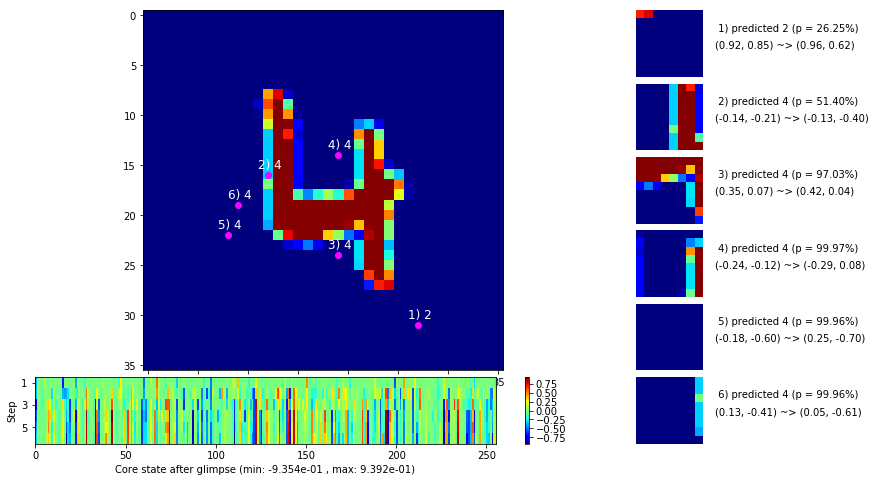

 b   2500/  3000 >> 134.0 ms/b | lr: 7.42e-07 | grad 2norm:  4.22 | grad inf norm:  1.043
       Weights || abs max:  1.26 ( 7411.67) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 (  741.70)
        Biases || abs max:  0.97 ( 1396.50) | mean:  1.71e-02 ( 1.39) | var: 6.48e-03 (414222.03)
                  class loss: 0.126 | steps: 2.027 | reward:  0.958 | acc.: 95.84%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.4 ms/b | lr: 7.27e-07 | grad 2norm:  4.37 | grad inf norm:  1.046
       Weights || abs max:  1.26 (12908.24) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 (15591.37)
        Biases || abs max:  0.97 ( 1442.69) | mean:  1.71e-02 ( 1.43) | var: 6.48e-03 (415435.97)
                  class loss: 0.131 | steps: 2.019 | reward:  0.956 | acc.: 95.59%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

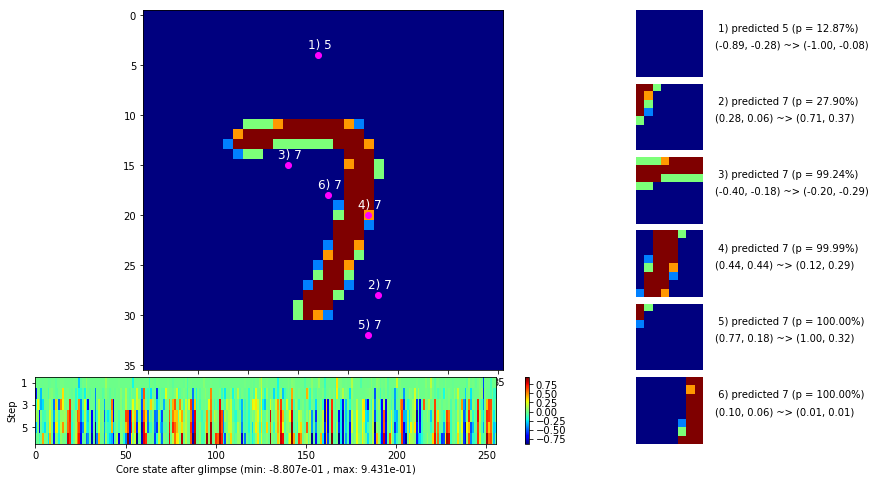

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


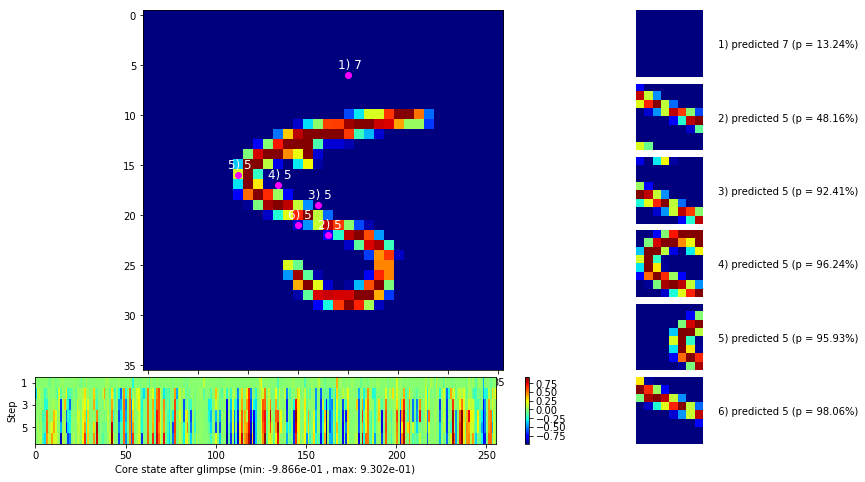


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


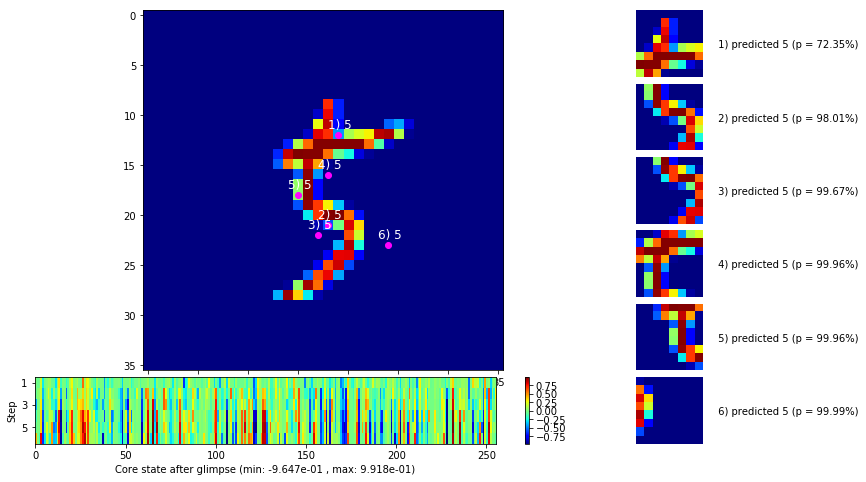

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


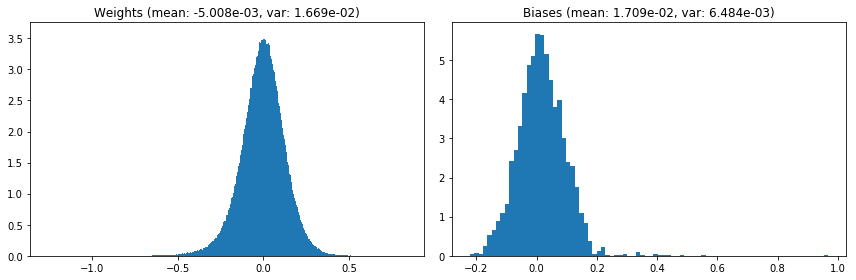

                                      Location network weights and biases


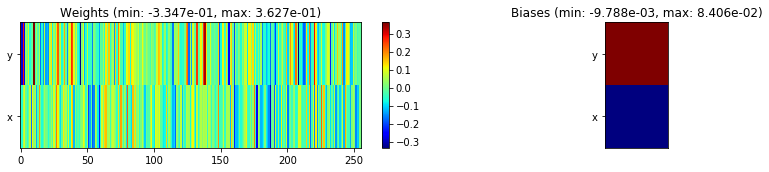

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.45 sec | TRAIN >> class loss: 0.1308 | steps:  2.027 :( | reward:  0.9571 :( | acc.: 95.707% :(
                          | VAL   >> class loss: 0.1395 | steps:  1.923 :( | reward:  0.9522 :( | acc.: 95.220% :(


Epoch  49/400) lr = 7.2e-07
 b    500/  3000 >> 132.9 ms/b | lr: 7.06e-07 | grad 2norm:  4.19 | grad inf norm:  1.029
       Weights || abs max:  1.26 (24562.48) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 (127519.59)
        Biases || abs max:  0.97 ( 2119.03) | mean:  1.71e-02 ( 1.98) | var: 6.48e-03 (629123.81)
                  class loss: 0.129 | steps: 2.042 | reward:  0.959 | acc.: 95.92%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.8 ms/b | lr: 6.92e-07 | grad 2norm:  4.27 | grad inf norm:  1.053
       Weights || abs max:  1.26 ( 8386.49) | mean: -5.01e-03 ( 0.07) |

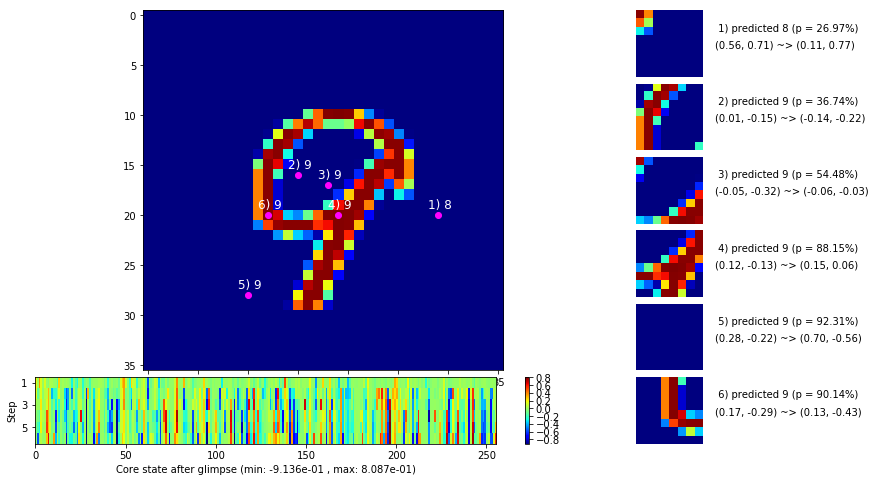

 b   1500/  3000 >> 134.0 ms/b | lr: 6.71e-07 | grad 2norm:  4.47 | grad inf norm:  1.101
       Weights || abs max:  1.26 ( 7963.66) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 ( 3344.60)
        Biases || abs max:  0.97 (  576.84) | mean:  1.71e-02 ( 0.75) | var: 6.48e-03 (16435.77)
                  class loss: 0.137 | steps: 2.043 | reward:  0.953 | acc.: 95.30%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.7 ms/b | lr: 6.58e-07 | grad 2norm:  4.29 | grad inf norm:  1.075
       Weights || abs max:  1.26 (108684.23) | mean: -5.01e-03 ( 0.25) | var: 1.67e-02 (245058.36)
        Biases || abs max:  0.97 (  248.05) | mean:  1.71e-02 ( 0.43) | var: 6.48e-03 (   65.98)
                  class loss: 0.134 | steps: 2.052 | reward:  0.957 | acc.: 95.68%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

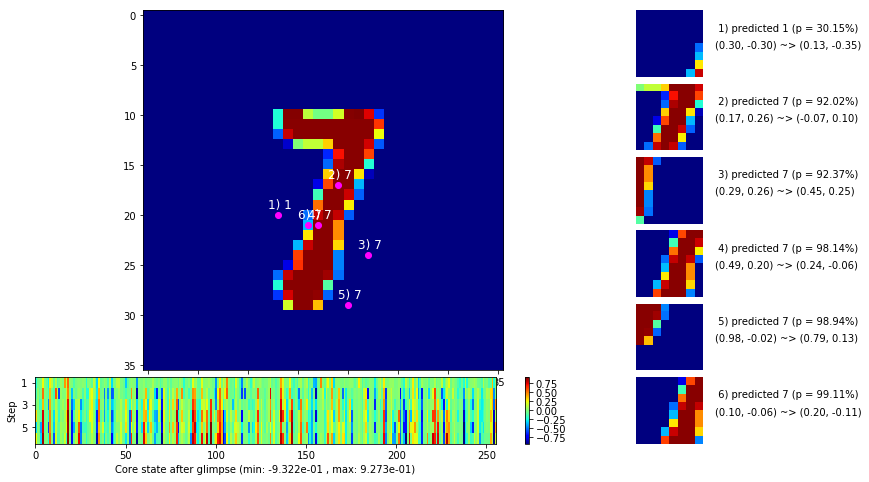

 b   2500/  3000 >> 137.8 ms/b | lr: 6.38e-07 | grad 2norm:  4.39 | grad inf norm:  1.062
       Weights || abs max:  1.26 (62244.69) | mean: -5.01e-03 ( 0.18) | var: 1.67e-02 (823469.00)
        Biases || abs max:  0.97 (  234.25) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   55.54)
                  class loss: 0.130 | steps: 2.030 | reward:  0.956 | acc.: 95.57%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.6 ms/b | lr: 6.26e-07 | grad 2norm:  4.18 | grad inf norm:  1.035
       Weights || abs max:  1.26 (33162.97) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (100738.11)
        Biases || abs max:  0.97 (  197.42) | mean:  1.71e-02 ( 0.40) | var: 6.48e-03 (   43.82)
                  class loss: 0.125 | steps: 2.013 | reward:  0.959 | acc.: 95.85%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

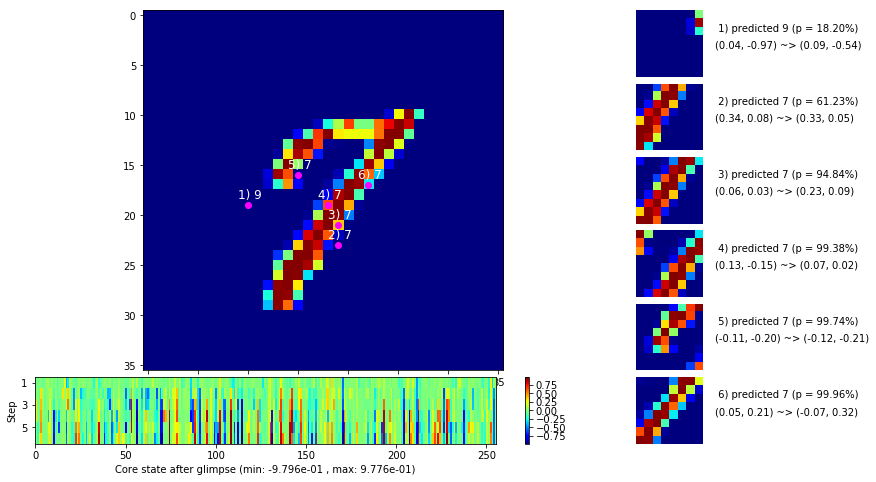

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


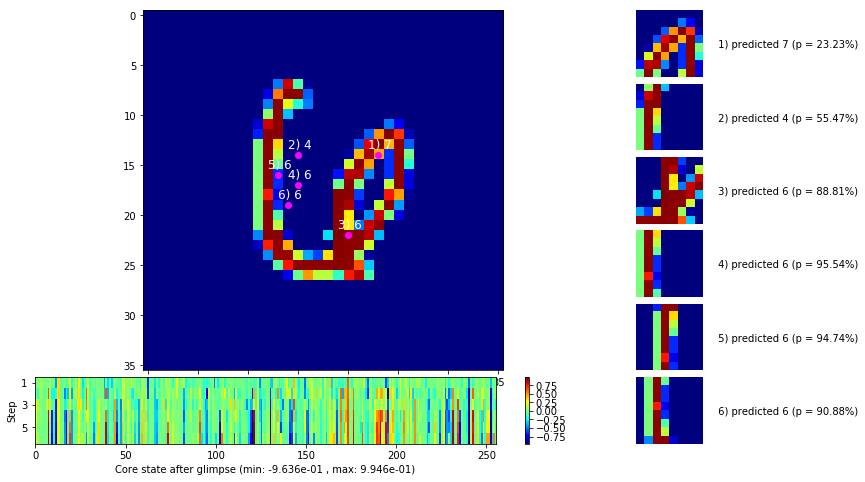


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


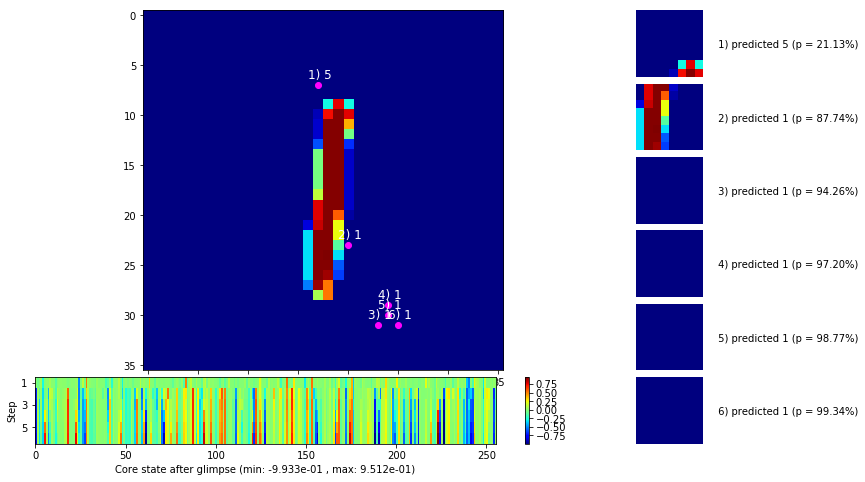

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


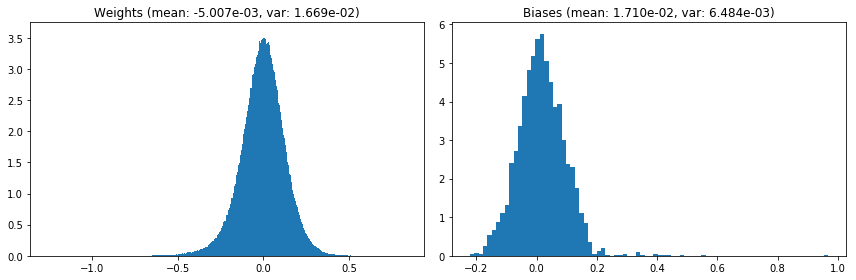

                                      Location network weights and biases


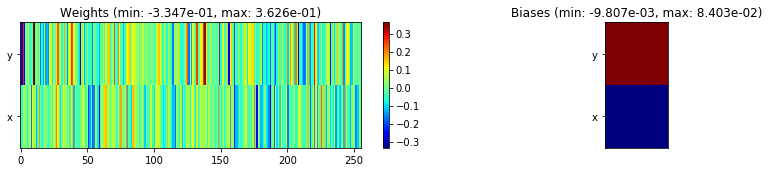

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.92 sec | TRAIN >> class loss: 0.1305 | steps:  2.033 :( | reward:  0.9567 :( | acc.: 95.675% :(
                          | VAL   >> class loss: 0.1425 | steps:  1.911 :( | reward:  0.9534 :( | acc.: 95.340% :(


Epoch  50/400) lr = 6.193e-07
 b    500/  3000 >> 132.1 ms/b | lr: 6.07e-07 | grad 2norm:  4.29 | grad inf norm:  1.085
       Weights || abs max:  1.26 (142680.95) | mean: -5.01e-03 ( 0.33) | var: 1.67e-02 (705323.25)
        Biases || abs max:  0.97 (  190.52) | mean:  1.71e-02 ( 0.39) | var: 6.48e-03 (   37.85)
                  class loss: 0.135 | steps: 2.040 | reward:  0.957 | acc.: 95.65%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 5.95e-07 | grad 2norm:  4.13 | grad inf norm:  1.014
       Weights || abs max:  1.26 (258020.80) | mean: -5.01e-03 ( 0.52

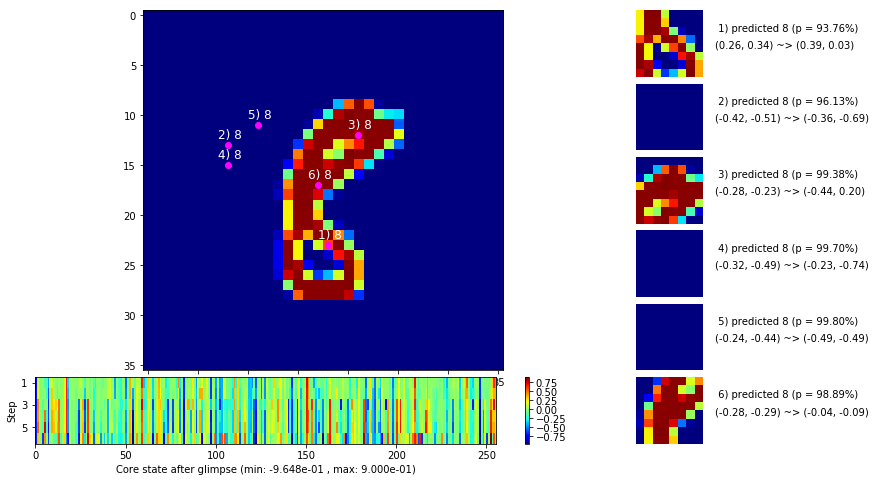

 b   1500/  3000 >> 133.2 ms/b | lr: 5.77e-07 | grad 2norm:  4.22 | grad inf norm:  1.052
       Weights || abs max:  1.26 (182504.78) | mean: -5.01e-03 ( 0.38) | var: 1.67e-02 (3968043.75)
        Biases || abs max:  0.97 (  206.73) | mean:  1.71e-02 ( 0.41) | var: 6.48e-03 (   48.98)
                  class loss: 0.127 | steps: 2.025 | reward:  0.958 | acc.: 95.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 5.66e-07 | grad 2norm:  4.40 | grad inf norm:  1.055
       Weights || abs max:  1.26 (45868.39) | mean: -5.01e-03 ( 0.15) | var: 1.67e-02 (307544.97)
        Biases || abs max:  0.97 (  202.35) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   48.04)
                  class loss: 0.136 | steps: 2.041 | reward:  0.956 | acc.: 95.56%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

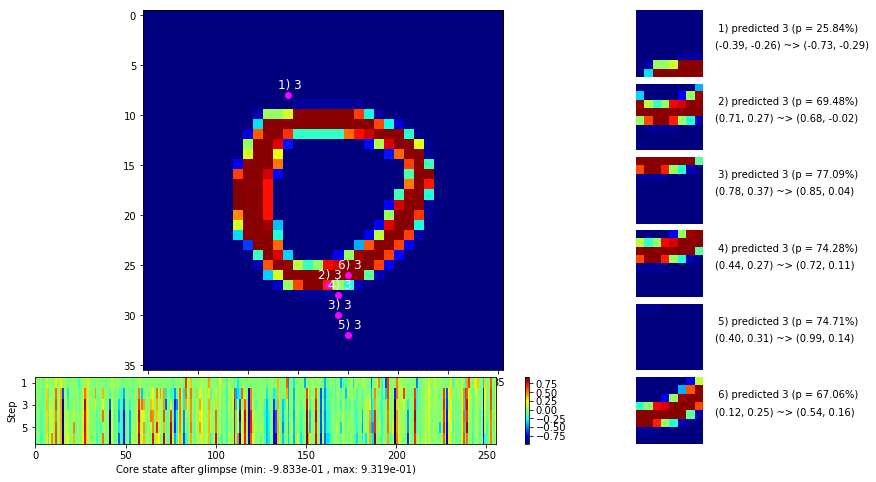

 b   2500/  3000 >> 133.3 ms/b | lr: 5.49e-07 | grad 2norm:  4.39 | grad inf norm:  1.059
       Weights || abs max:  1.26 (43482.44) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (230577.12)
        Biases || abs max:  0.97 (  234.14) | mean:  1.71e-02 ( 0.42) | var: 6.48e-03 (   54.57)
                  class loss: 0.137 | steps: 2.024 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.0 ms/b | lr: 5.38e-07 | grad 2norm:  4.21 | grad inf norm:  1.015
       Weights || abs max:  1.26 (147870.02) | mean: -5.01e-03 ( 0.33) | var: 1.67e-02 (857576.12)
        Biases || abs max:  0.97 (  260.61) | mean:  1.71e-02 ( 0.43) | var: 6.48e-03 (   70.23)
                  class loss: 0.127 | steps: 2.033 | reward:  0.959 | acc.: 95.88%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

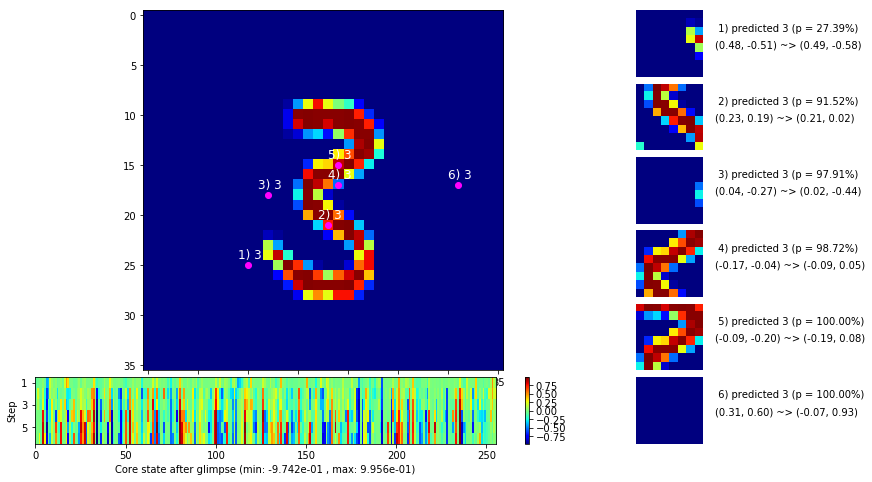

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


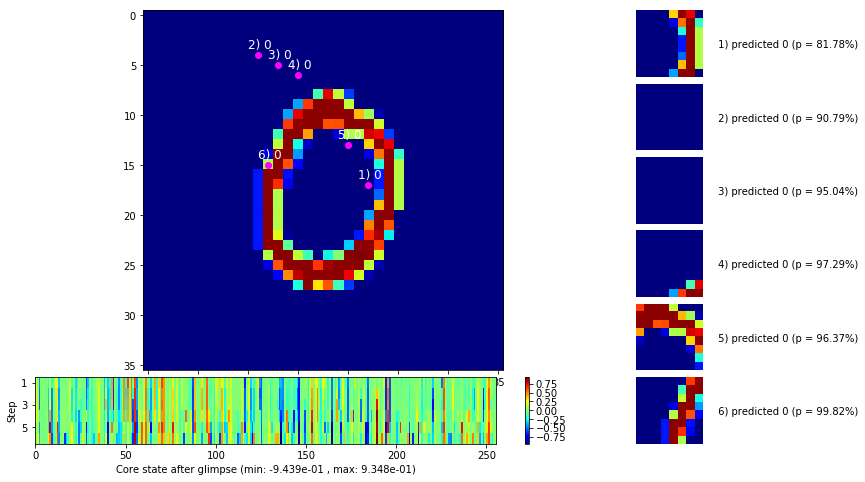


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


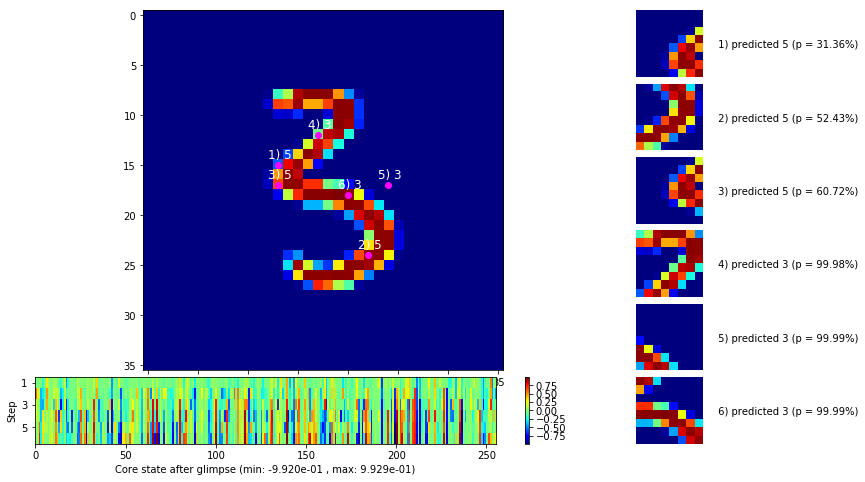

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


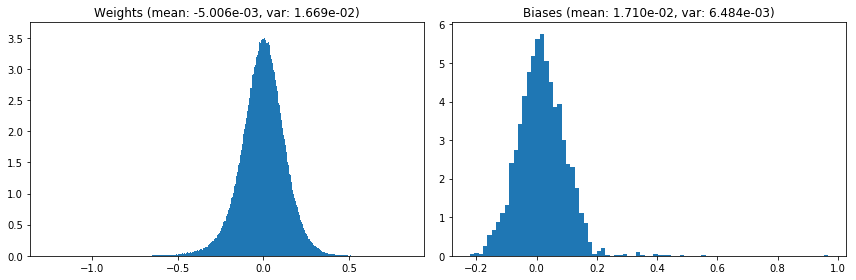

                                      Location network weights and biases


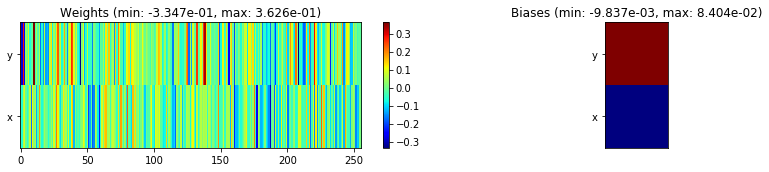

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.83 sec | TRAIN >> class loss: 0.1320 | steps:  2.027 :( | reward:  0.9574 :( | acc.: 95.743% :(
                          | VAL   >> class loss: 0.1365 | steps:  1.937 :( | reward:  0.9532 :( | acc.: 95.320% :(


Epoch  51/400) lr = 5.326e-07
 b    500/  3000 >> 138.0 ms/b | lr: 5.22e-07 | grad 2norm:  3.99 | grad inf norm:  0.987
       Weights || abs max:  1.26 (28324.17) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (27782.54)
        Biases || abs max:  0.97 (  285.69) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   83.62)
                  class loss: 0.120 | steps: 2.022 | reward:  0.962 | acc.: 96.23%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 138.4 ms/b | lr: 5.12e-07 | grad 2norm:  4.26 | grad inf norm:  1.052
       Weights || abs max:  1.26 (18459.90) | mean: -5.01e-03 ( 0.10) |

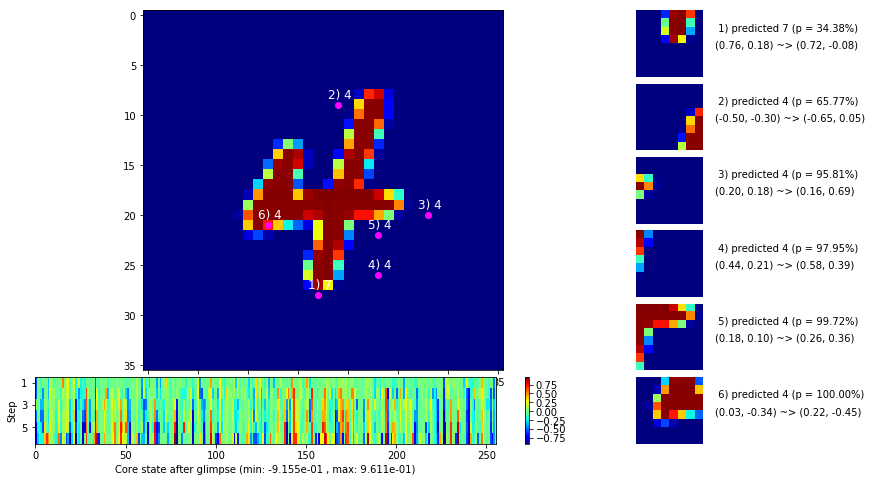

 b   1500/  3000 >> 133.5 ms/b | lr: 4.96e-07 | grad 2norm:  4.46 | grad inf norm:  1.078
       Weights || abs max:  1.26 (19284.52) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 ( 6561.85)
        Biases || abs max:  0.97 (  255.23) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   66.07)
                  class loss: 0.140 | steps: 2.029 | reward:  0.954 | acc.: 95.41%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 4.87e-07 | grad 2norm:  4.29 | grad inf norm:  1.090
       Weights || abs max:  1.26 (95739.18) | mean: -5.01e-03 ( 0.24) | var: 1.67e-02 (497115.53)
        Biases || abs max:  0.97 (  290.67) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   79.83)
                  class loss: 0.130 | steps: 2.027 | reward:  0.956 | acc.: 95.55%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

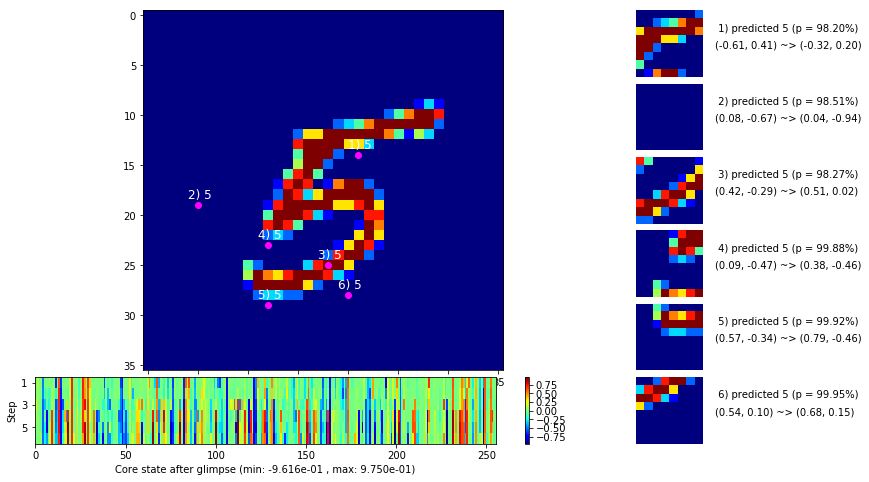

 b   2500/  3000 >> 132.9 ms/b | lr: 4.72e-07 | grad 2norm:  4.13 | grad inf norm:  1.022
       Weights || abs max:  1.26 (141389.70) | mean: -5.01e-03 ( 0.31) | var: 1.67e-02 (6139107.00)
        Biases || abs max:  0.97 (  274.70) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   77.97)
                  class loss: 0.129 | steps: 2.027 | reward:  0.959 | acc.: 95.91%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.6 ms/b | lr: 4.63e-07 | grad 2norm:  4.26 | grad inf norm:  1.027
       Weights || abs max:  1.26 (104492.20) | mean: -5.01e-03 ( 0.25) | var: 1.67e-02 (1287267.62)
        Biases || abs max:  0.97 (  268.85) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   73.82)
                  class loss: 0.127 | steps: 2.016 | reward:  0.958 | acc.: 95.84%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

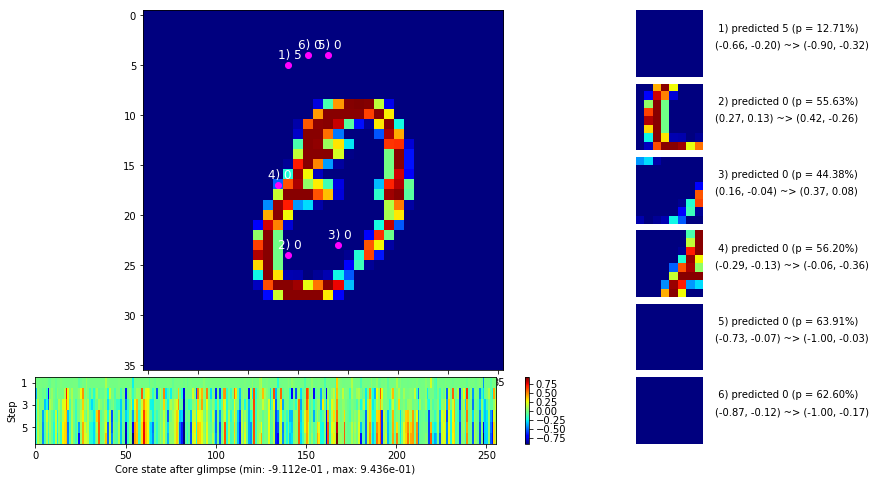

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


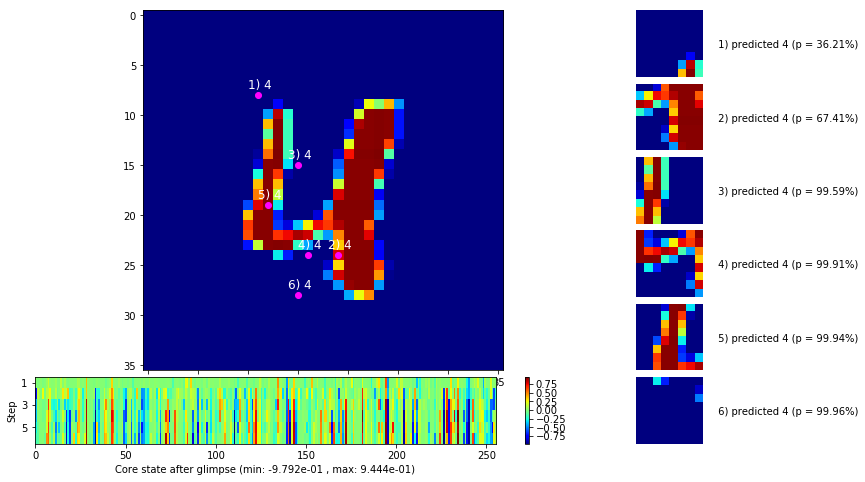


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


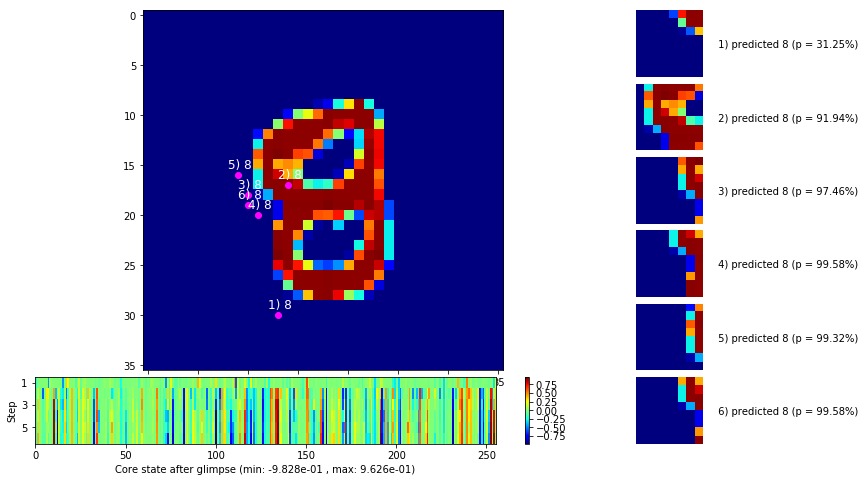

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


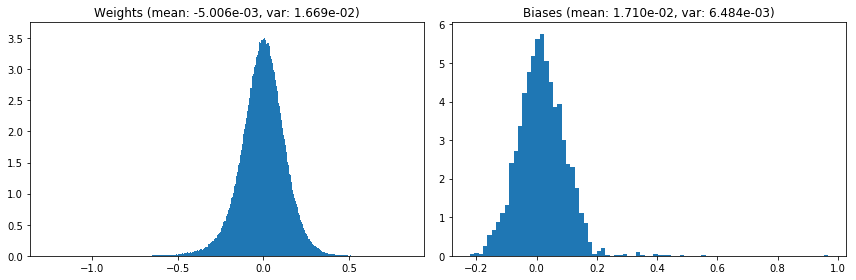

                                      Location network weights and biases


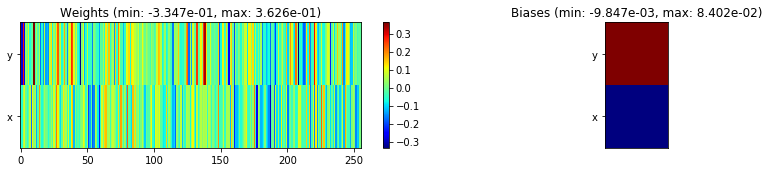

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.15 sec | TRAIN >> class loss: 0.1295 | steps:  2.026 :( | reward:  0.9578 :( | acc.: 95.777% :(
                          | VAL   >> class loss: 0.1291 | steps:  1.917 :( | reward:  0.9572 :( | acc.: 95.720% :(


Epoch  52/400) lr = 4.581e-07
 b    500/  3000 >> 130.2 ms/b | lr: 4.49e-07 | grad 2norm:  4.21 | grad inf norm:  1.053
       Weights || abs max:  1.26 (283294.16) | mean: -5.01e-03 ( 0.54) | var: 1.67e-02 (42632576.00)
        Biases || abs max:  0.97 (  285.69) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   85.01)
                  class loss: 0.129 | steps: 2.018 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.1 ms/b | lr: 4.40e-07 | grad 2norm:  4.12 | grad inf norm:  1.005
       Weights || abs max:  1.26 (61942.20) | mean: -5.01e-03 ( 0.1

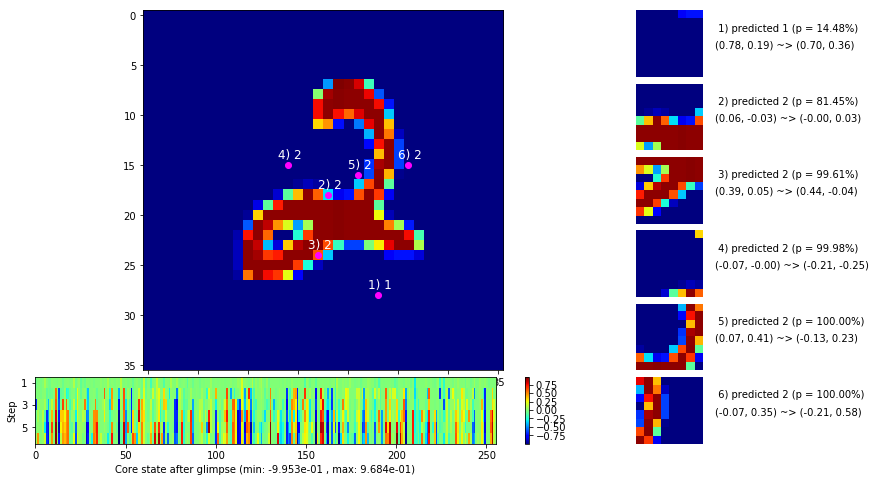

 b   1500/  3000 >> 216.6 ms/b | lr: 4.27e-07 | grad 2norm:  4.24 | grad inf norm:  1.022
       Weights || abs max:  1.26 (79833.95) | mean: -5.01e-03 ( 0.20) | var: 1.67e-02 (210294.30)
        Biases || abs max:  0.97 (  358.76) | mean:  1.71e-02 ( 0.52) | var: 6.48e-03 (  121.44)
                  class loss: 0.131 | steps: 2.017 | reward:  0.958 | acc.: 95.76%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 177.6 ms/b | lr: 4.18e-07 | grad 2norm:  4.28 | grad inf norm:  1.065
       Weights || abs max:  1.26 (21979.43) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 (20774.58)
        Biases || abs max:  0.97 (  311.17) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   94.13)
                  class loss: 0.132 | steps: 2.016 | reward:  0.956 | acc.: 95.57%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

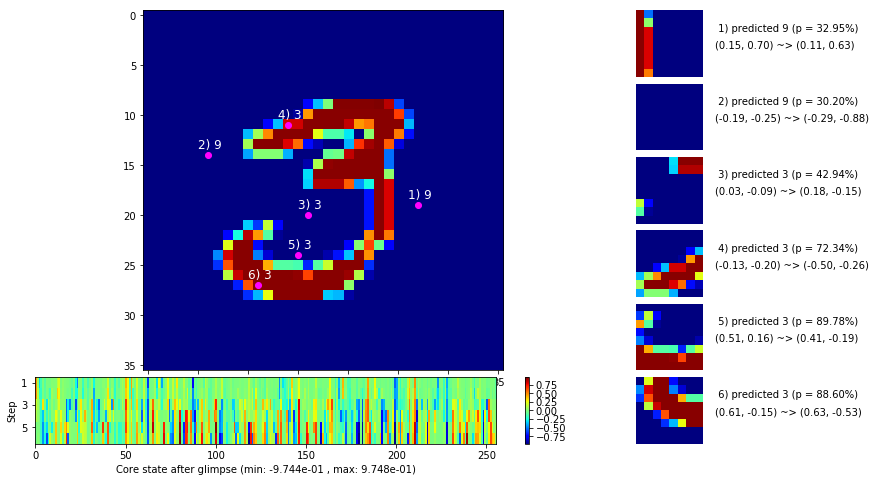

 b   2500/  3000 >> 204.4 ms/b | lr: 4.06e-07 | grad 2norm:  4.22 | grad inf norm:  1.036
       Weights || abs max:  1.26 (99679.48) | mean: -5.01e-03 ( 0.23) | var: 1.67e-02 (721659.44)
        Biases || abs max:  0.97 (  358.12) | mean:  1.71e-02 ( 0.49) | var: 6.48e-03 (  129.91)
                  class loss: 0.126 | steps: 2.035 | reward:  0.958 | acc.: 95.77%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 186.8 ms/b | lr: 3.98e-07 | grad 2norm:  4.26 | grad inf norm:  1.068
       Weights || abs max:  1.26 (55422.59) | mean: -5.01e-03 ( 0.16) | var: 1.67e-02 (69092.66)
        Biases || abs max:  0.97 (  288.23) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   79.65)
                  class loss: 0.129 | steps: 2.022 | reward:  0.956 | acc.: 95.64%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

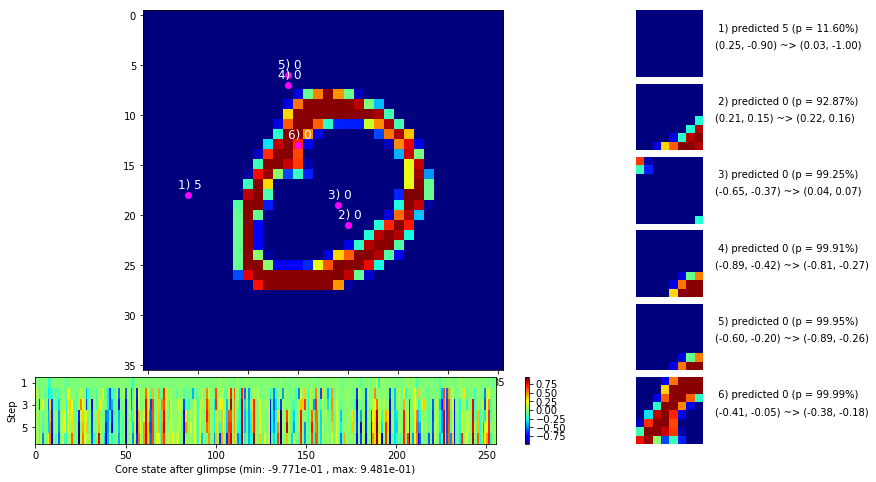

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


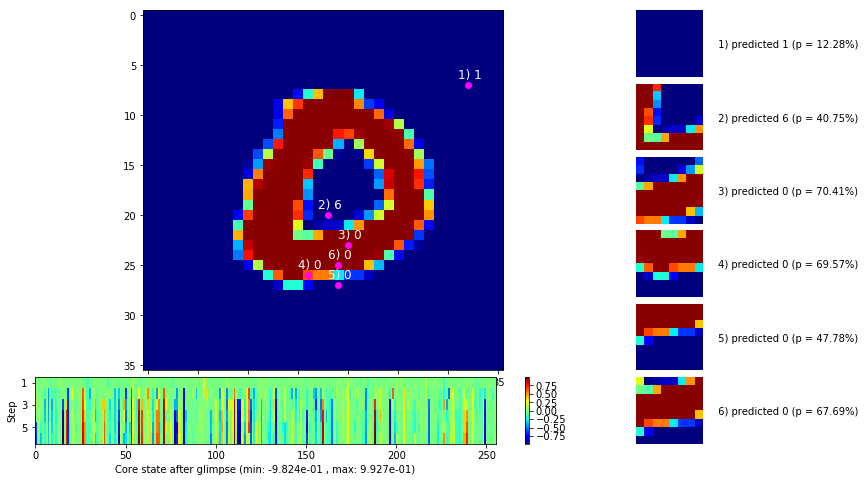


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


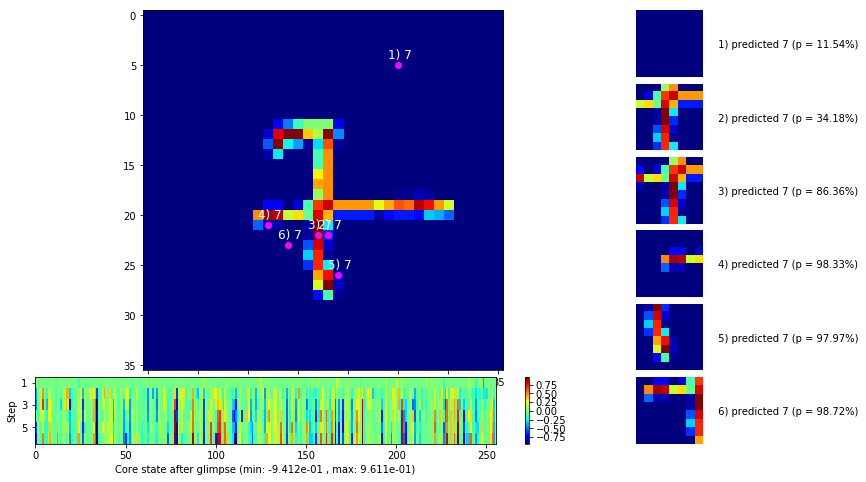

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


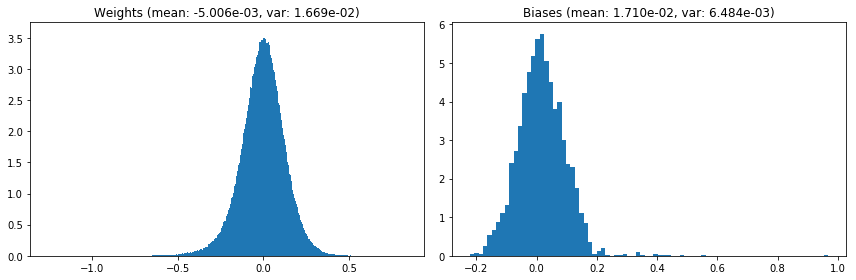

                                      Location network weights and biases


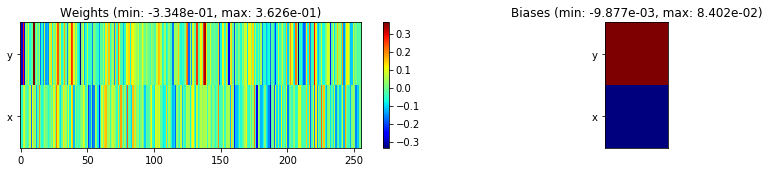

---------------------------------------------------------------------------------------------------------------
Elapsed time:  526.68 sec | TRAIN >> class loss: 0.1287 | steps:  2.019    | reward:  0.9575 :( | acc.: 95.747% :(
                          | VAL   >> class loss: 0.1369 | steps:  1.904 :( | reward:  0.9564 :( | acc.: 95.640% :(


Epoch  53/400) lr = 3.94e-07
 b    500/  3000 >> 138.0 ms/b | lr: 3.86e-07 | grad 2norm:  4.32 | grad inf norm:  1.049
       Weights || abs max:  1.26 (10931.39) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1473.35)
        Biases || abs max:  0.97 (  275.61) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   78.31)
                  class loss: 0.139 | steps: 2.038 | reward:  0.956 | acc.: 95.61%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 139.5 ms/b | lr: 3.78e-07 | grad 2norm:  4.34 | grad inf norm:  1.047
       Weights || abs max:  1.26 (16123.13) | mean: -5.01e-03 ( 0.09) | 

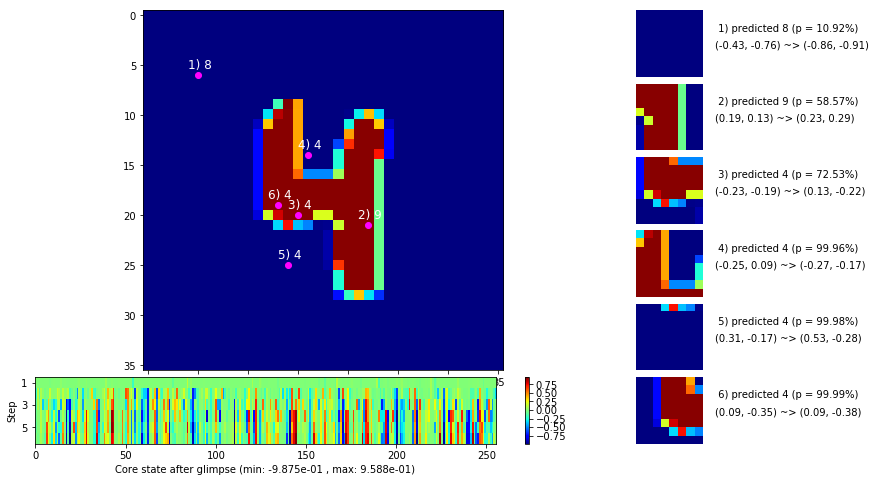

 b   1500/  3000 >> 134.8 ms/b | lr: 3.67e-07 | grad 2norm:  4.28 | grad inf norm:  1.061
       Weights || abs max:  1.26 (199263.48) | mean: -5.01e-03 ( 0.39) | var: 1.67e-02 (3144795.00)
        Biases || abs max:  0.97 (  251.36) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   64.56)
                  class loss: 0.125 | steps: 2.013 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.6 ms/b | lr: 3.60e-07 | grad 2norm:  4.28 | grad inf norm:  1.033
       Weights || abs max:  1.26 (290597.12) | mean: -5.01e-03 ( 0.55) | var: 1.67e-02 (5619510.50)
        Biases || abs max:  0.97 (  228.00) | mean:  1.71e-02 ( 0.43) | var: 6.48e-03 (   54.53)
                  class loss: 0.128 | steps: 2.014 | reward:  0.958 | acc.: 95.77%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

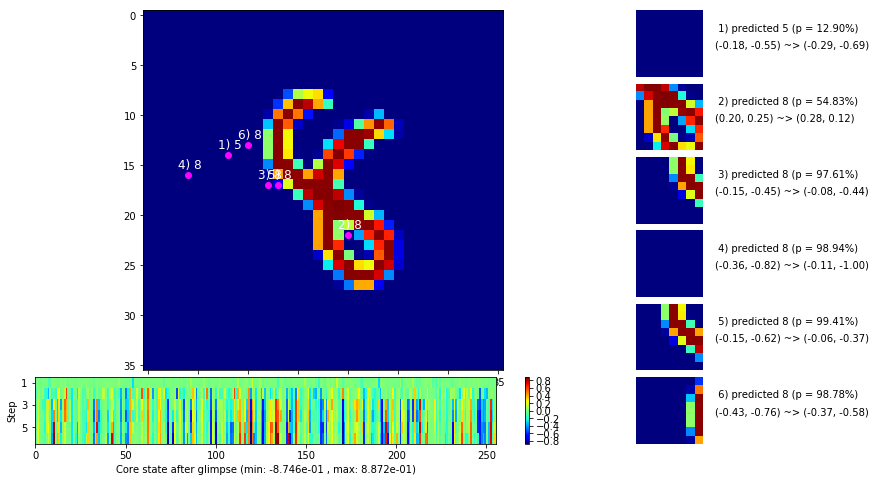

 b   2500/  3000 >> 136.3 ms/b | lr: 3.49e-07 | grad 2norm:  4.20 | grad inf norm:  1.054
       Weights || abs max:  1.26 (16528.48) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 2332.99)
        Biases || abs max:  0.97 (  234.47) | mean:  1.71e-02 ( 0.43) | var: 6.48e-03 (   53.96)
                  class loss: 0.131 | steps: 2.029 | reward:  0.958 | acc.: 95.77%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.5 ms/b | lr: 3.42e-07 | grad 2norm:  4.32 | grad inf norm:  1.042
       Weights || abs max:  1.26 (17408.28) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 ( 4292.01)
        Biases || abs max:  0.97 (  263.01) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   64.23)
                  class loss: 0.137 | steps: 2.037 | reward:  0.956 | acc.: 95.64%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

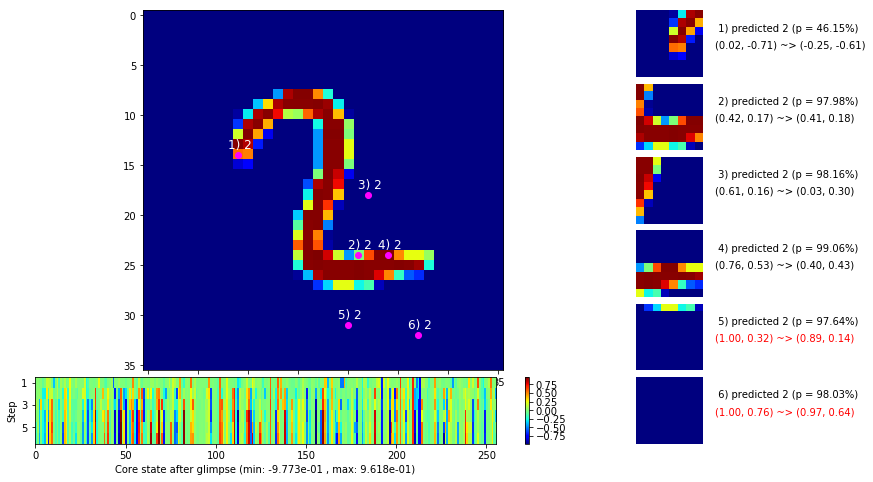

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


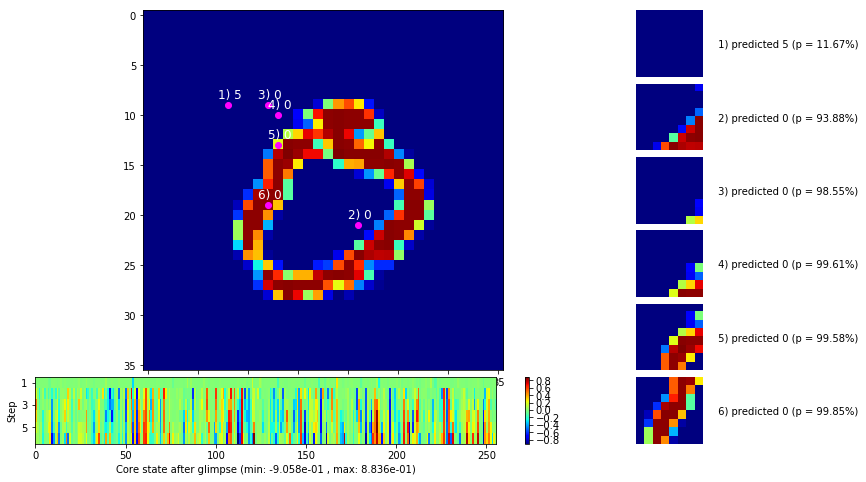


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


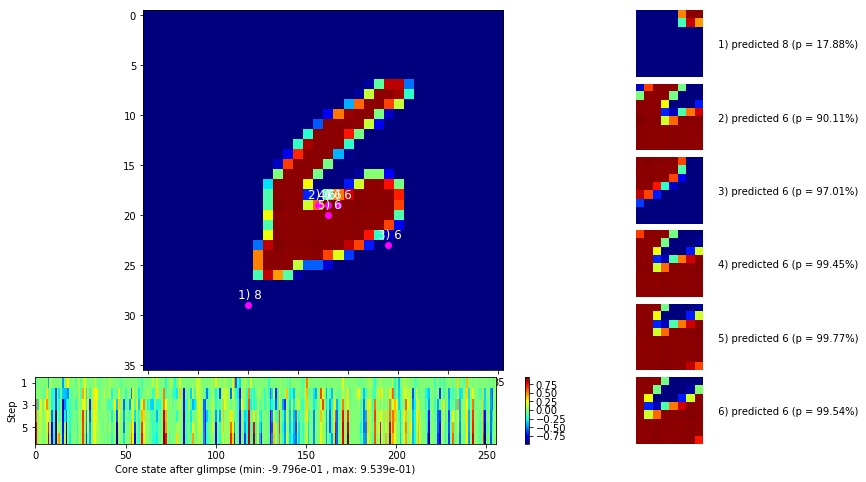

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


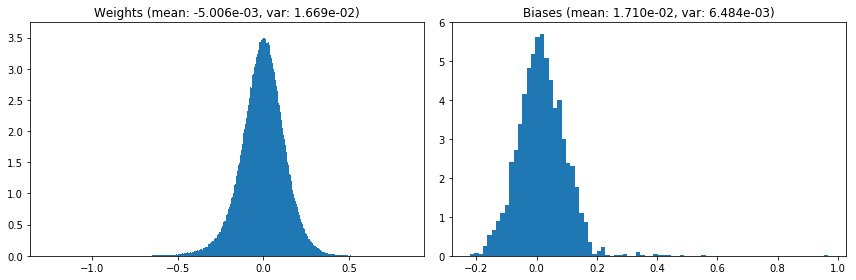

                                      Location network weights and biases


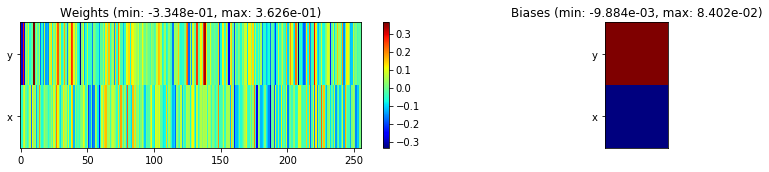

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.88 sec | TRAIN >> class loss: 0.1327 | steps:  2.027 :( | reward:  0.9570 :( | acc.: 95.700% :(
                          | VAL   >> class loss: 0.1341 | steps:  1.916 :( | reward:  0.9558 :( | acc.: 95.580% :(


Epoch  54/400) lr = 3.388e-07
 b    500/  3000 >> 132.8 ms/b | lr: 3.32e-07 | grad 2norm:  4.29 | grad inf norm:  1.035
       Weights || abs max:  1.26 (42200.03) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (74623.21)
        Biases || abs max:  0.97 (  236.84) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   55.48)
                  class loss: 0.129 | steps: 2.012 | reward:  0.957 | acc.: 95.74%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.1 ms/b | lr: 3.25e-07 | grad 2norm:  4.15 | grad inf norm:  1.015
       Weights || abs max:  1.26 (112896.20) | mean: -5.01e-03 ( 0.26) 

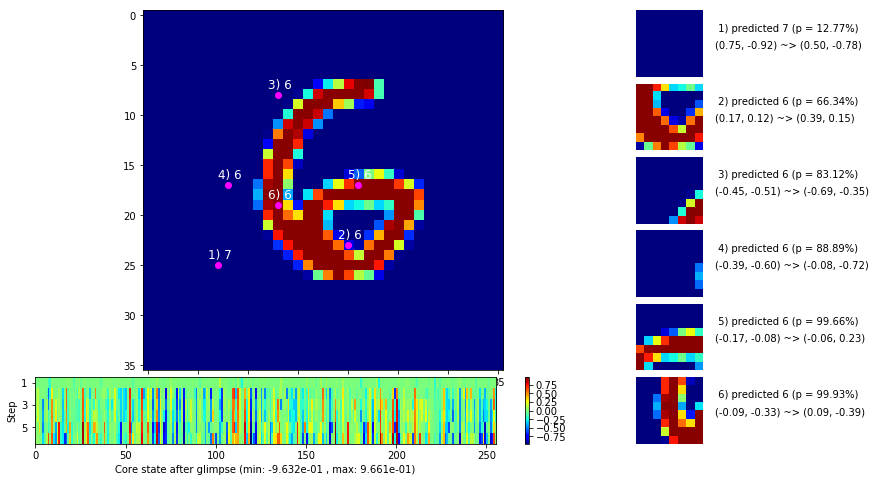

 b   1500/  3000 >> 135.1 ms/b | lr: 3.16e-07 | grad 2norm:  4.10 | grad inf norm:  0.997
       Weights || abs max:  1.26 (23347.19) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 ( 8286.68)
        Biases || abs max:  0.97 (  282.67) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   82.16)
                  class loss: 0.124 | steps: 2.024 | reward:  0.960 | acc.: 96.03%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.0 ms/b | lr: 3.10e-07 | grad 2norm:  4.35 | grad inf norm:  1.042
       Weights || abs max:  1.26 (52476.21) | mean: -5.01e-03 ( 0.16) | var: 1.67e-02 (123332.51)
        Biases || abs max:  0.97 (  297.93) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   94.37)
                  class loss: 0.131 | steps: 2.025 | reward:  0.955 | acc.: 95.53%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

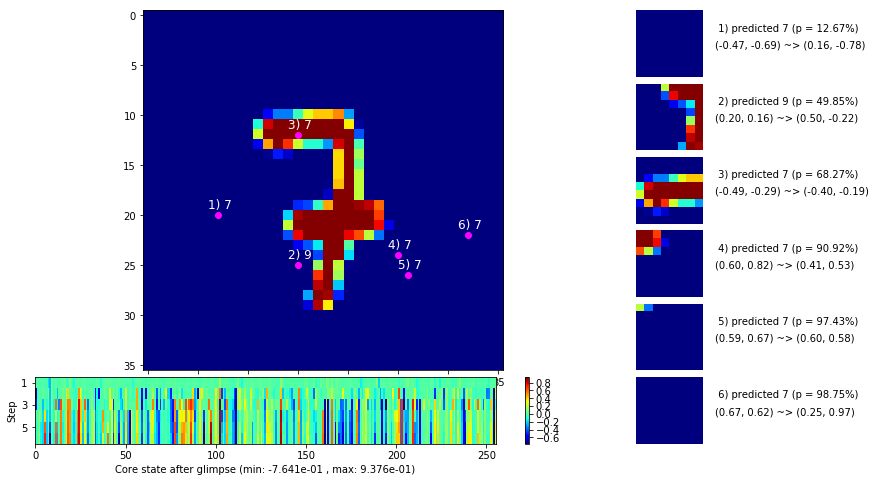

 b   2500/  3000 >> 134.6 ms/b | lr: 3.00e-07 | grad 2norm:  4.33 | grad inf norm:  1.046
       Weights || abs max:  1.26 (32152.90) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (185924.53)
        Biases || abs max:  0.97 (  297.86) | mean:  1.71e-02 ( 0.49) | var: 6.48e-03 (   90.84)
                  class loss: 0.137 | steps: 2.032 | reward:  0.957 | acc.: 95.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.4 ms/b | lr: 2.94e-07 | grad 2norm:  4.47 | grad inf norm:  1.070
       Weights || abs max:  1.26 (111959.20) | mean: -5.01e-03 ( 0.26) | var: 1.67e-02 (442803.56)
        Biases || abs max:  0.97 (  277.04) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   78.77)
                  class loss: 0.132 | steps: 2.051 | reward:  0.955 | acc.: 95.52%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

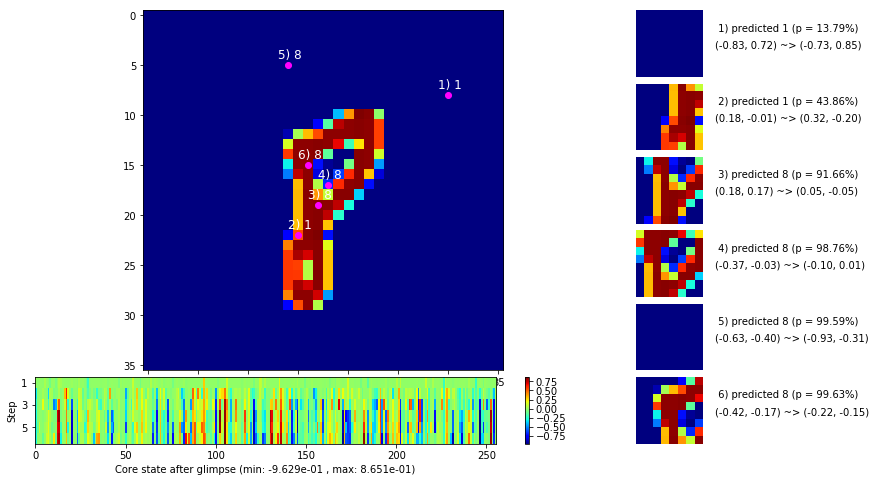

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


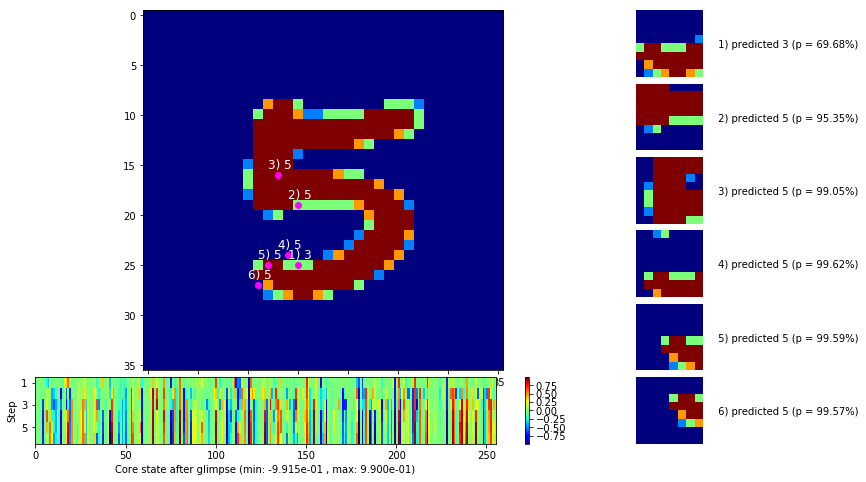


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


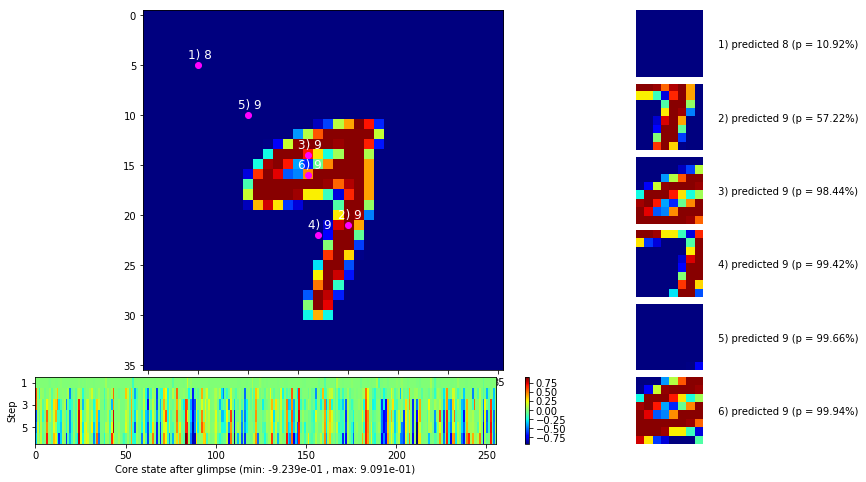

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


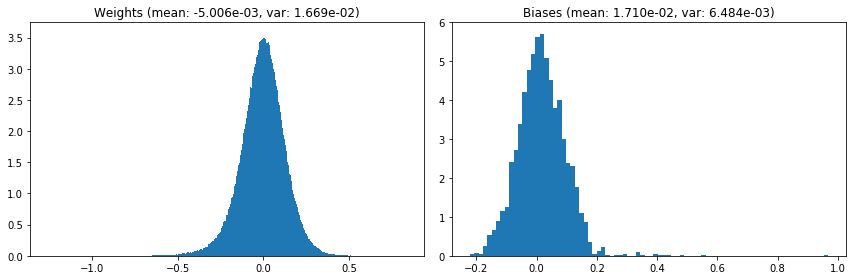

                                      Location network weights and biases


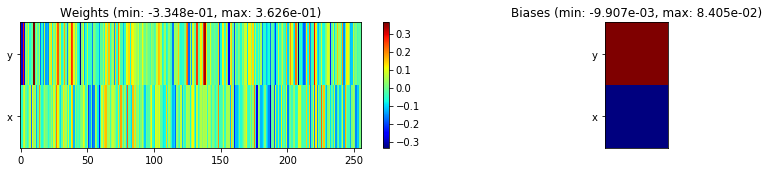

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.70 sec | TRAIN >> class loss: 0.1299 | steps:  2.026 :( | reward:  0.9574 :( | acc.: 95.740% :(
                          | VAL   >> class loss: 0.1315 | steps:  1.907 :( | reward:  0.9554 :( | acc.: 95.540% :(


Epoch  55/400) lr = 2.914e-07
 b    500/  3000 >> 133.6 ms/b | lr: 2.86e-07 | grad 2norm:  4.20 | grad inf norm:  1.032
       Weights || abs max:  1.26 (35475.25) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (13822.58)
        Biases || abs max:  0.97 (  262.52) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   66.28)
                  class loss: 0.130 | steps: 2.039 | reward:  0.958 | acc.: 95.84%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 2.80e-07 | grad 2norm:  4.10 | grad inf norm:  1.027
       Weights || abs max:  1.26 (11707.16) | mean: -5.01e-03 ( 0.08) |

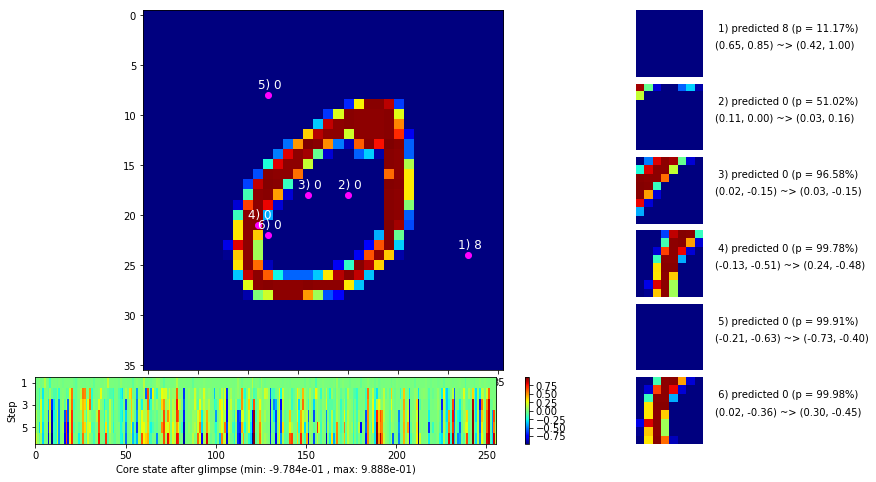

 b   1500/  3000 >> 137.1 ms/b | lr: 2.72e-07 | grad 2norm:  4.32 | grad inf norm:  1.073
       Weights || abs max:  1.26 (13246.73) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 1923.83)
        Biases || abs max:  0.97 (  237.54) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   55.90)
                  class loss: 0.136 | steps: 2.049 | reward:  0.957 | acc.: 95.65%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.6 ms/b | lr: 2.66e-07 | grad 2norm:  4.51 | grad inf norm:  1.085
       Weights || abs max:  1.26 (94691.08) | mean: -5.01e-03 ( 0.22) | var: 1.67e-02 (500785.66)
        Biases || abs max:  0.97 (  262.50) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   73.41)
                  class loss: 0.133 | steps: 2.005 | reward:  0.954 | acc.: 95.39%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

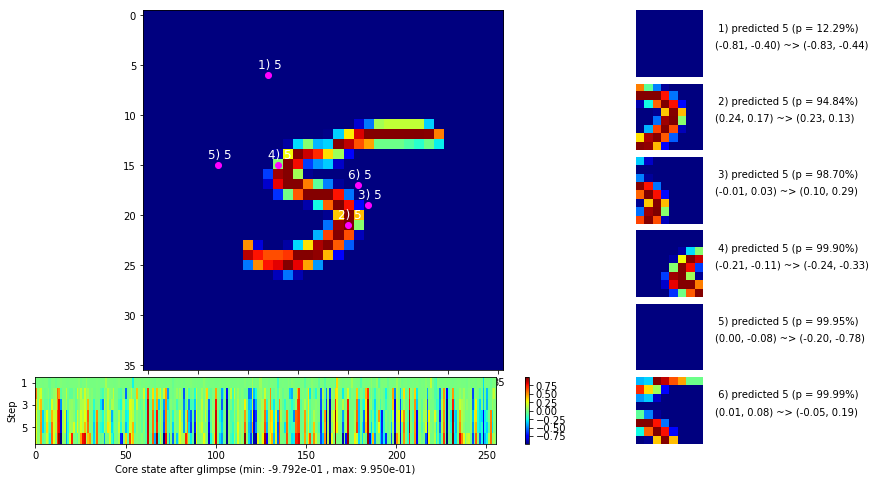

 b   2500/  3000 >> 134.7 ms/b | lr: 2.58e-07 | grad 2norm:  4.26 | grad inf norm:  1.038
       Weights || abs max:  1.26 (26873.17) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 (35832.68)
        Biases || abs max:  0.97 (  243.68) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   58.85)
                  class loss: 0.130 | steps: 2.029 | reward:  0.957 | acc.: 95.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.0 ms/b | lr: 2.53e-07 | grad 2norm:  4.32 | grad inf norm:  1.027
       Weights || abs max:  1.26 (238994.33) | mean: -5.01e-03 ( 0.47) | var: 1.67e-02 (13993907.00)
        Biases || abs max:  0.97 (  261.29) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   73.51)
                  class loss: 0.137 | steps: 2.012 | reward:  0.957 | acc.: 95.69%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

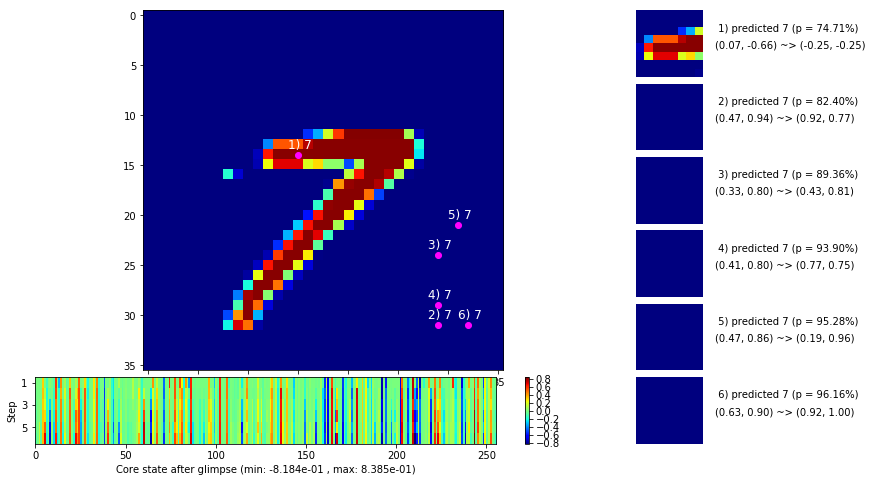

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


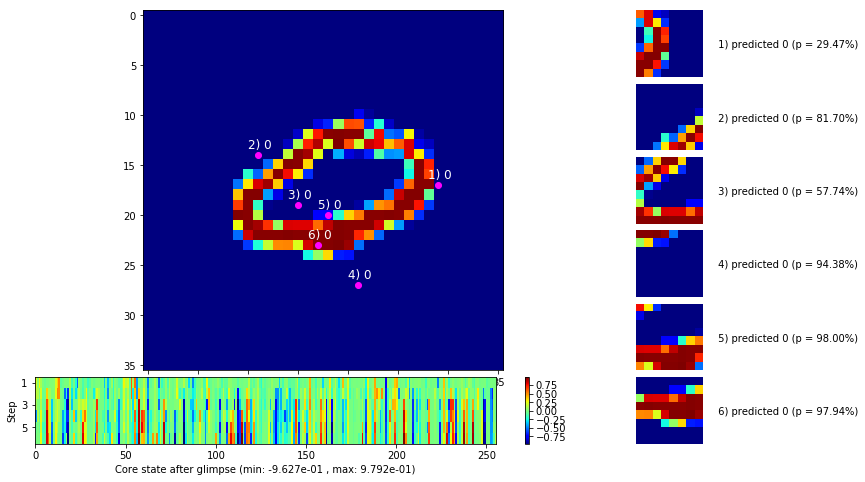


	Target class: 1  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


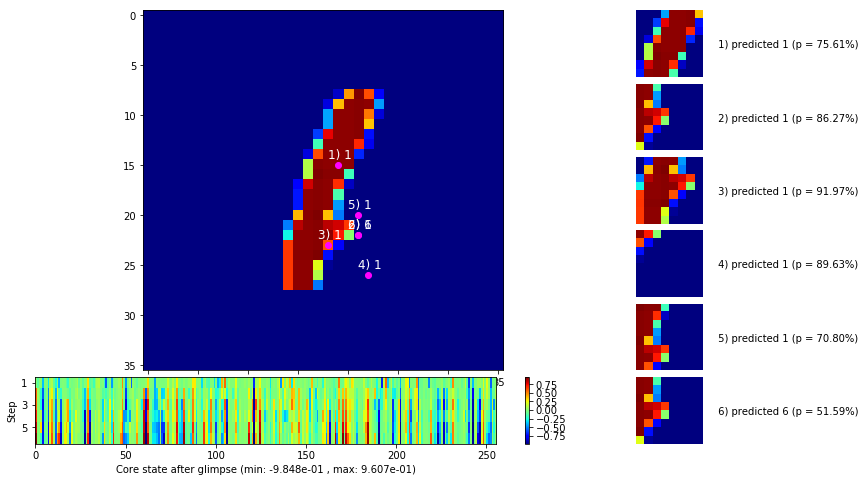

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


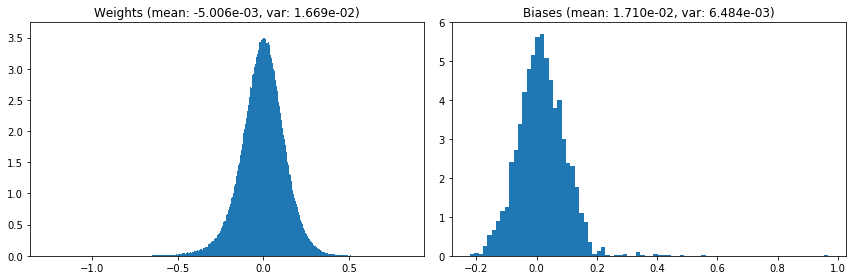

                                      Location network weights and biases


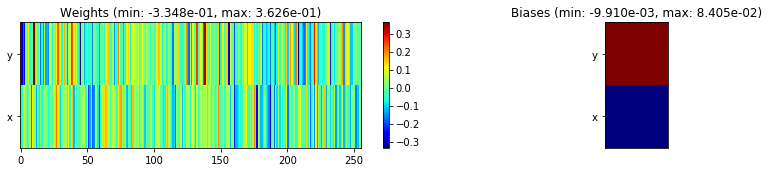

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.84 sec | TRAIN >> class loss: 0.1327 | steps:  2.026 :( | reward:  0.9570 :( | acc.: 95.698% :(
                          | VAL   >> class loss: 0.1453 | steps:  1.919 :( | reward:  0.9552 :( | acc.: 95.520% :(


Epoch  56/400) lr = 2.506e-07
 b    500/  3000 >> 133.3 ms/b | lr: 2.46e-07 | grad 2norm:  4.37 | grad inf norm:  1.059
       Weights || abs max:  1.26 (20556.05) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 ( 2260.38)
        Biases || abs max:  0.97 (  262.25) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   63.49)
                  class loss: 0.138 | steps: 2.036 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.4 ms/b | lr: 2.41e-07 | grad 2norm:  4.25 | grad inf norm:  1.047
       Weights || abs max:  1.26 (33224.79) | mean: -5.01e-03 ( 0.13) |

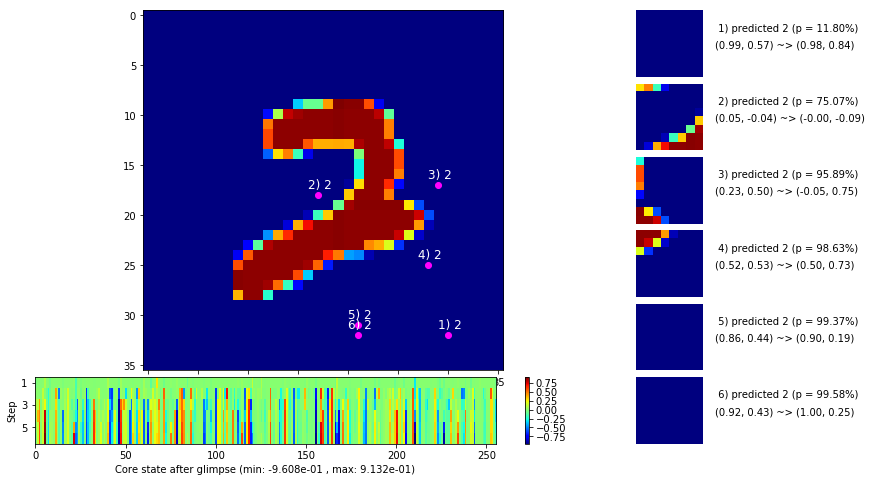

 b   1500/  3000 >> 137.0 ms/b | lr: 2.34e-07 | grad 2norm:  4.27 | grad inf norm:  1.076
       Weights || abs max:  1.26 (45839.42) | mean: -5.01e-03 ( 0.15) | var: 1.67e-02 (29644.26)
        Biases || abs max:  0.97 (  243.96) | mean:  1.71e-02 ( 0.44) | var: 6.48e-03 (   54.70)
                  class loss: 0.134 | steps: 2.003 | reward:  0.956 | acc.: 95.60%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.6 ms/b | lr: 2.29e-07 | grad 2norm:  4.25 | grad inf norm:  1.033
       Weights || abs max:  1.26 (47687.61) | mean: -5.01e-03 ( 0.16) | var: 1.67e-02 (39563.39)
        Biases || abs max:  0.97 (  273.18) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   68.85)
                  class loss: 0.130 | steps: 2.033 | reward:  0.957 | acc.: 95.72%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

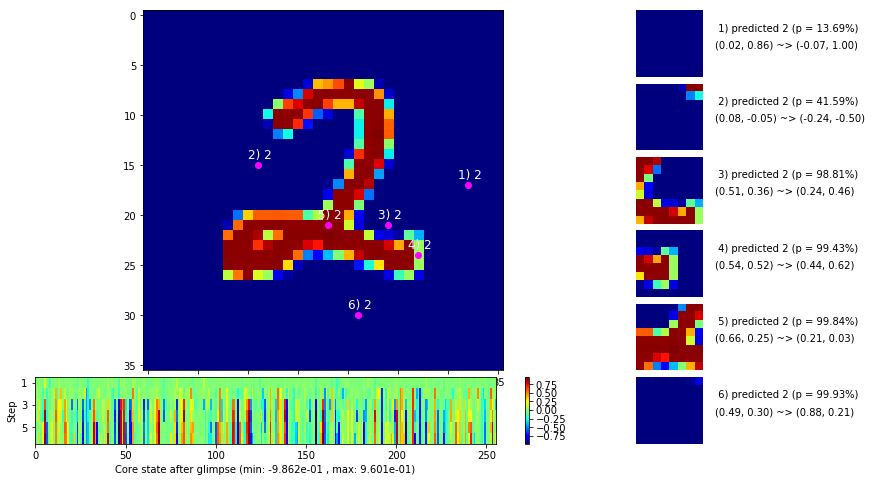

 b   2500/  3000 >> 136.7 ms/b | lr: 2.22e-07 | grad 2norm:  4.12 | grad inf norm:  1.023
       Weights || abs max:  1.26 (94317.40) | mean: -5.01e-03 ( 0.24) | var: 1.67e-02 (585127.56)
        Biases || abs max:  0.97 (  253.30) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   63.07)
                  class loss: 0.122 | steps: 2.013 | reward:  0.960 | acc.: 96.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 130.0 ms/b | lr: 2.18e-07 | grad 2norm:  4.25 | grad inf norm:  1.049
       Weights || abs max:  1.26 (162094.95) | mean: -5.01e-03 ( 0.37) | var: 1.67e-02 (301743.09)
        Biases || abs max:  0.97 (  253.70) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   64.37)
                  class loss: 0.131 | steps: 2.035 | reward:  0.958 | acc.: 95.76%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

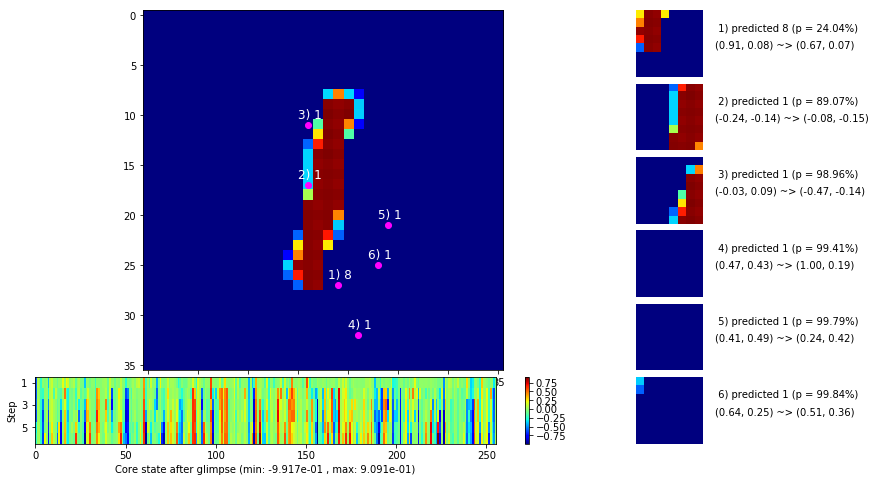

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


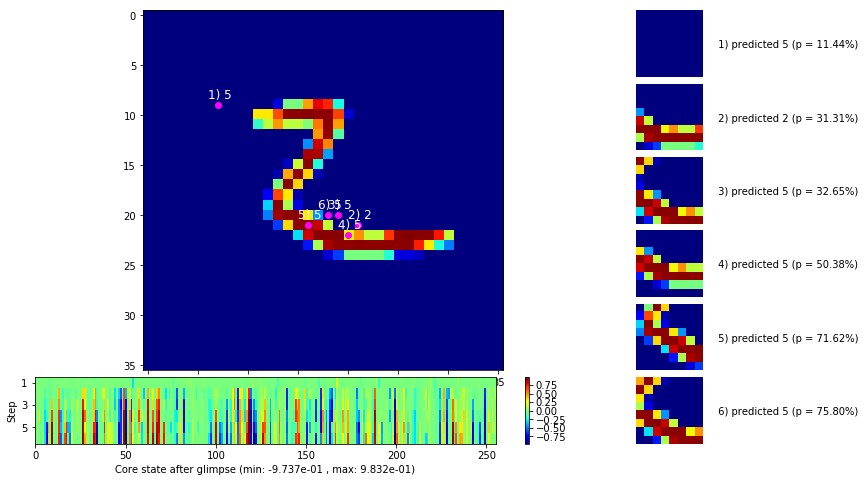


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


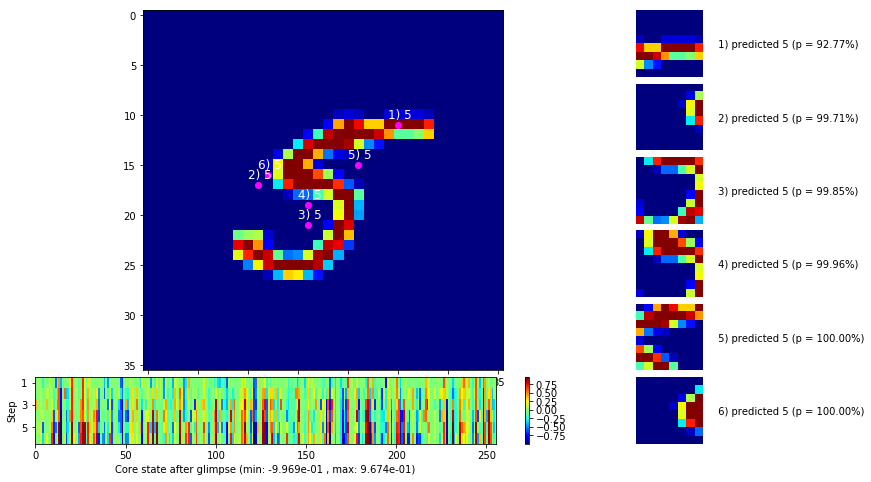

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


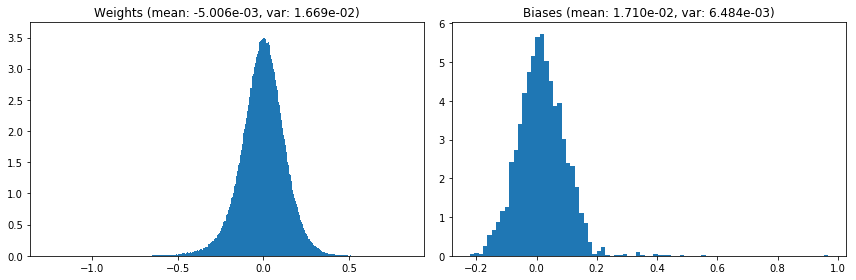

                                      Location network weights and biases


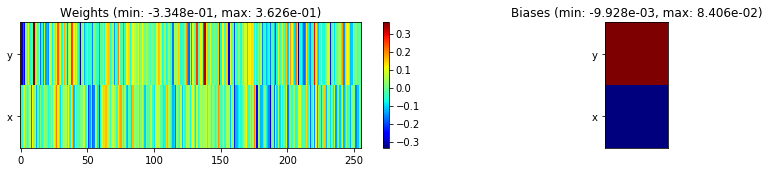

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.66 sec | TRAIN >> class loss: 0.1312 | steps:  2.026 :( | reward:  0.9575 :( | acc.: 95.750% :(
                          | VAL   >> class loss: 0.1472 | steps:  1.899 :( | reward:  0.9546 :( | acc.: 95.460% :(


Epoch  57/400) lr = 2.156e-07
 b    500/  3000 >> 128.2 ms/b | lr: 2.11e-07 | grad 2norm:  4.39 | grad inf norm:  1.072
       Weights || abs max:  1.26 (653289.00) | mean: -5.01e-03 ( 1.18) | var: 1.67e-02 (163929600.00)
        Biases || abs max:  0.97 (  251.91) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   62.33)
                  class loss: 0.137 | steps: 2.025 | reward:  0.956 | acc.: 95.56%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 126.9 ms/b | lr: 2.07e-07 | grad 2norm:  4.40 | grad inf norm:  1.056
       Weights || abs max:  1.26 (79603.61) | mean: -5.01e-03 ( 0.

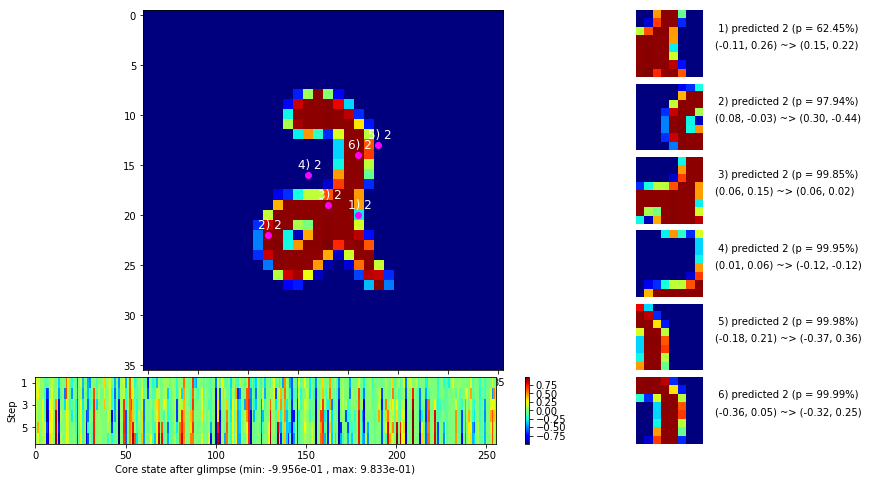

 b   1500/  3000 >> 127.1 ms/b | lr: 2.01e-07 | grad 2norm:  4.33 | grad inf norm:  1.043
       Weights || abs max:  1.26 (94283.99) | mean: -5.01e-03 ( 0.24) | var: 1.67e-02 (462887.12)
        Biases || abs max:  0.97 (  259.77) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   66.93)
                  class loss: 0.140 | steps: 2.035 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 125.8 ms/b | lr: 1.97e-07 | grad 2norm:  4.49 | grad inf norm:  1.084
       Weights || abs max:  1.26 (765991.75) | mean: -5.01e-03 ( 1.41) | var: 1.67e-02 (18454024.00)
        Biases || abs max:  0.97 (  300.10) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   85.14)
                  class loss: 0.140 | steps: 2.027 | reward:  0.953 | acc.: 95.30%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

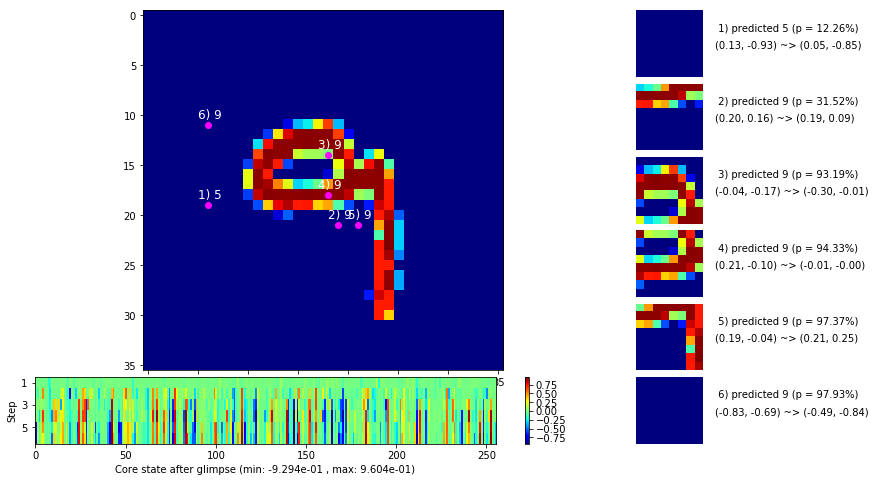

 b   2500/  3000 >> 126.7 ms/b | lr: 1.91e-07 | grad 2norm:  4.27 | grad inf norm:  1.034
       Weights || abs max:  1.26 (194446.39) | mean: -5.01e-03 ( 0.43) | var: 1.67e-02 (1236804.00)
        Biases || abs max:  0.97 (  270.05) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   67.76)
                  class loss: 0.131 | steps: 2.012 | reward:  0.958 | acc.: 95.81%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 126.7 ms/b | lr: 1.87e-07 | grad 2norm:  4.11 | grad inf norm:  1.049
       Weights || abs max:  1.26 (23108.22) | mean: -5.01e-03 ( 0.11) | var: 1.67e-02 ( 2797.34)
        Biases || abs max:  0.97 (  298.53) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   87.76)
                  class loss: 0.130 | steps: 2.040 | reward:  0.959 | acc.: 95.91%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

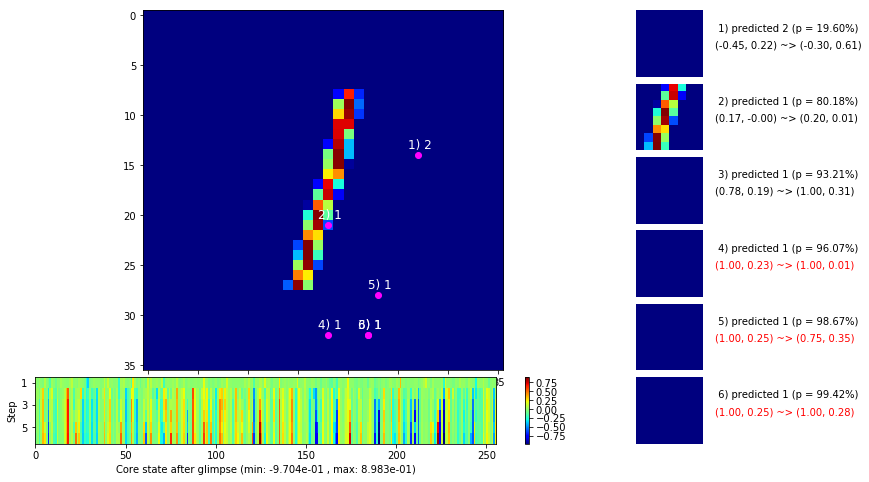

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


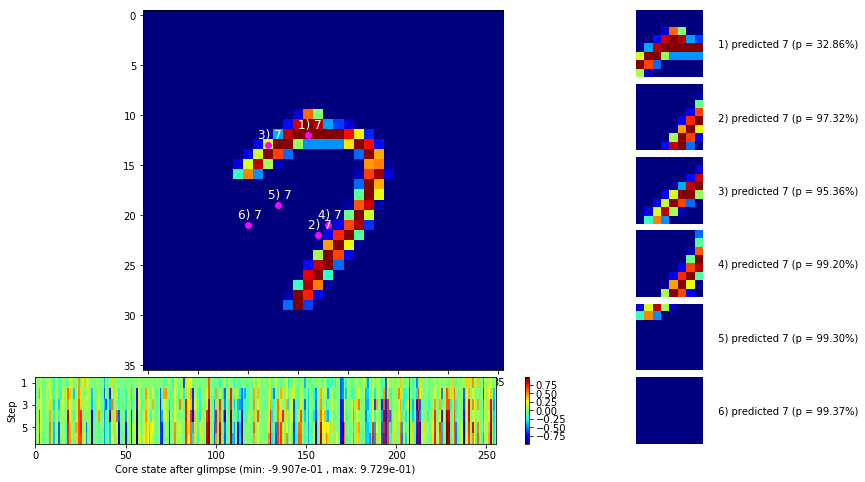


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


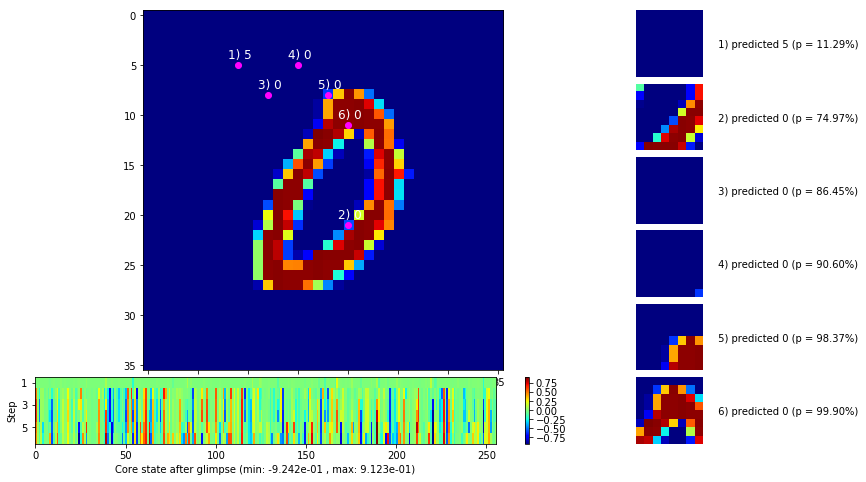

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


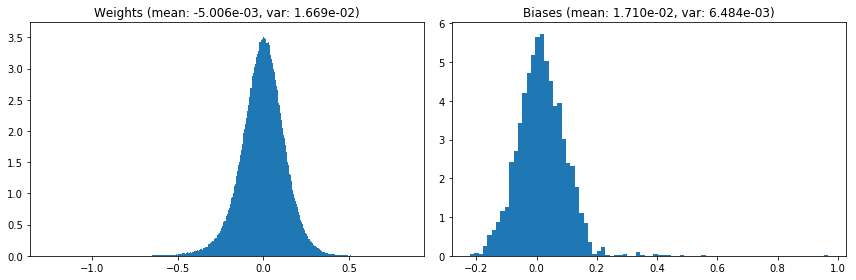

                                      Location network weights and biases


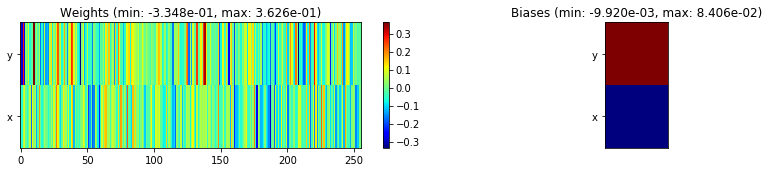

---------------------------------------------------------------------------------------------------------------
Elapsed time:  381.21 sec | TRAIN >> class loss: 0.1352 | steps:  2.024 :( | reward:  0.9565 :( | acc.: 95.645% :(
                          | VAL   >> class loss: 0.1423 | steps:  1.924 :( | reward:  0.9564 :( | acc.: 95.640% :(


Epoch  58/400) lr = 1.854e-07
 b    500/  3000 >> 128.7 ms/b | lr: 1.82e-07 | grad 2norm:  4.12 | grad inf norm:  1.028
       Weights || abs max:  1.26 (130200.69) | mean: -5.01e-03 ( 0.29) | var: 1.67e-02 (2904697.00)
        Biases || abs max:  0.97 (  265.95) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   67.83)
                  class loss: 0.124 | steps: 2.030 | reward:  0.960 | acc.: 96.03%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 129.5 ms/b | lr: 1.78e-07 | grad 2norm:  4.13 | grad inf norm:  1.008
       Weights || abs max:  1.26 (13977.10) | mean: -5.01e-03 ( 0.09

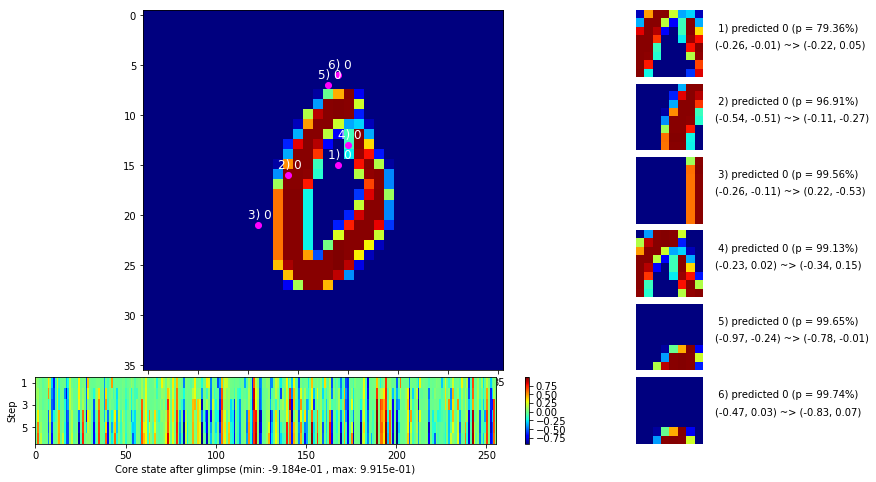

 b   1500/  3000 >> 126.8 ms/b | lr: 1.73e-07 | grad 2norm:  4.33 | grad inf norm:  1.037
       Weights || abs max:  1.26 (24828.54) | mean: -5.01e-03 ( 0.12) | var: 1.67e-02 ( 9908.87)
        Biases || abs max:  0.97 (  270.71) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   73.01)
                  class loss: 0.136 | steps: 2.032 | reward:  0.957 | acc.: 95.67%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 125.7 ms/b | lr: 1.69e-07 | grad 2norm:  4.26 | grad inf norm:  1.005
       Weights || abs max:  1.26 (42636.07) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (413758.88)
        Biases || abs max:  0.97 (  273.72) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   73.99)
                  class loss: 0.126 | steps: 2.025 | reward:  0.957 | acc.: 95.74%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

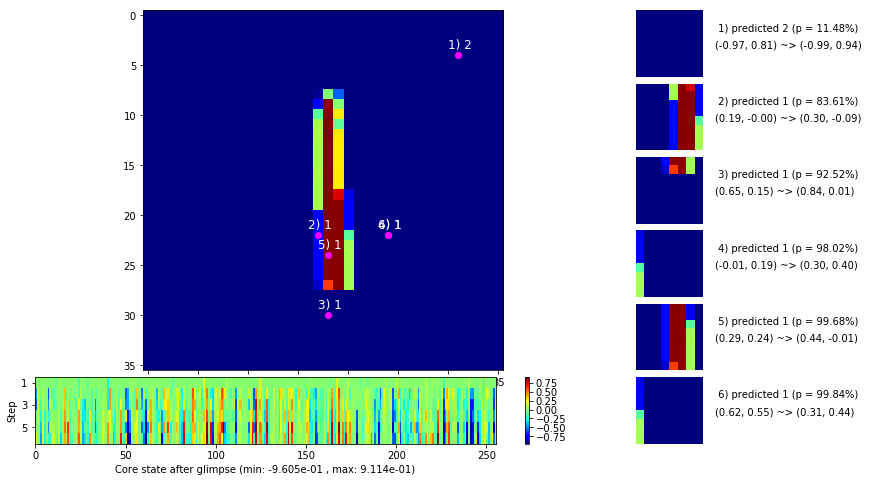

 b   2500/  3000 >> 127.6 ms/b | lr: 1.64e-07 | grad 2norm:  4.24 | grad inf norm:  1.050
       Weights || abs max:  1.26 (14545.31) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 1936.69)
        Biases || abs max:  0.97 (  276.12) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   79.78)
                  class loss: 0.131 | steps: 2.021 | reward:  0.957 | acc.: 95.74%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 126.7 ms/b | lr: 1.61e-07 | grad 2norm:  4.30 | grad inf norm:  1.049
       Weights || abs max:  1.26 (12960.92) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 4009.39)
        Biases || abs max:  0.97 (  272.79) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   77.49)
                  class loss: 0.130 | steps: 2.034 | reward:  0.957 | acc.: 95.71%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

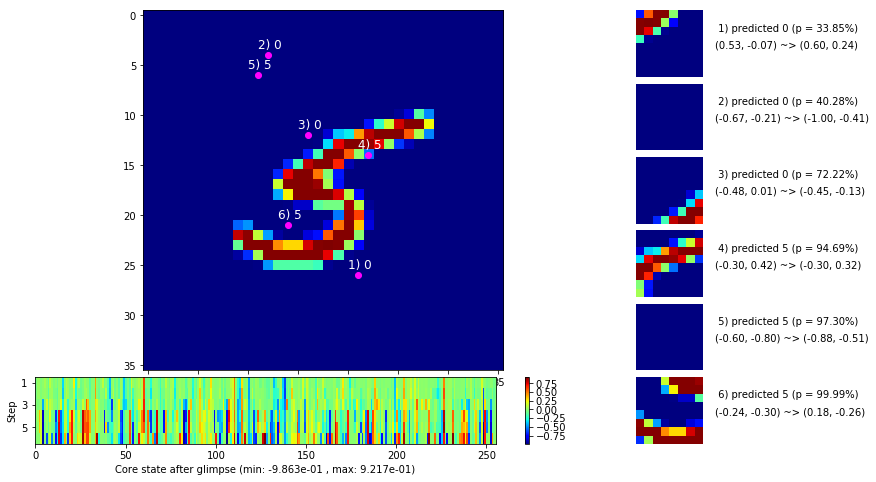

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


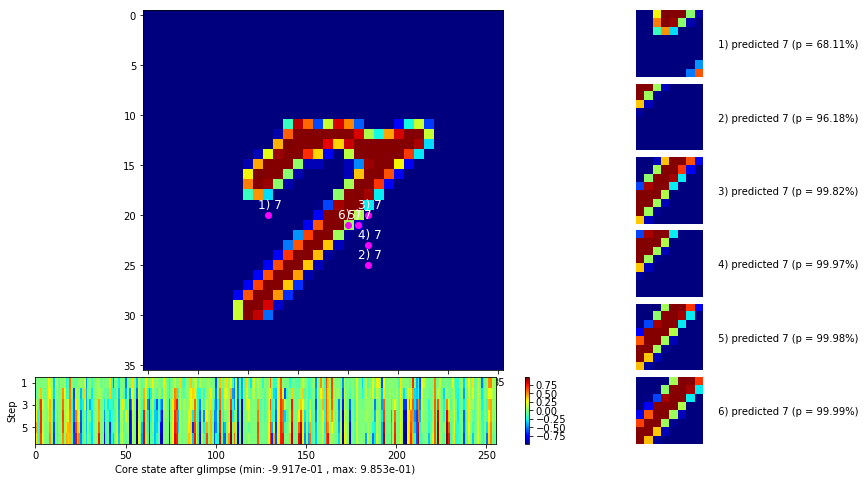


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


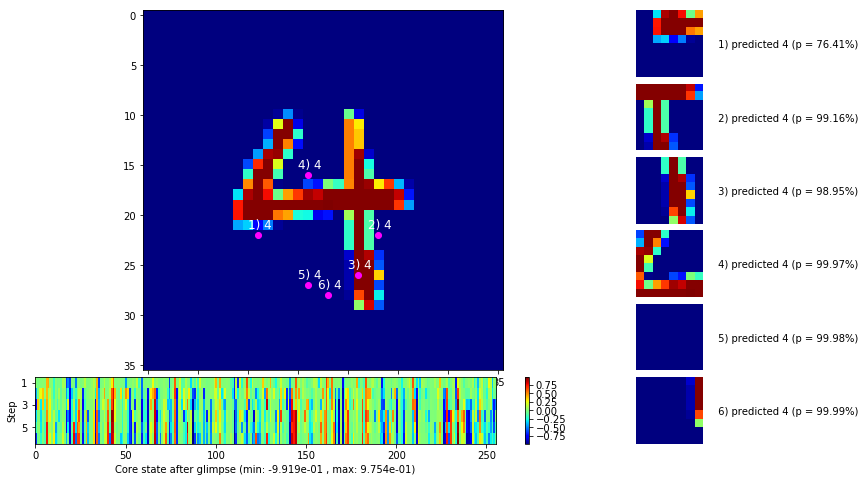

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


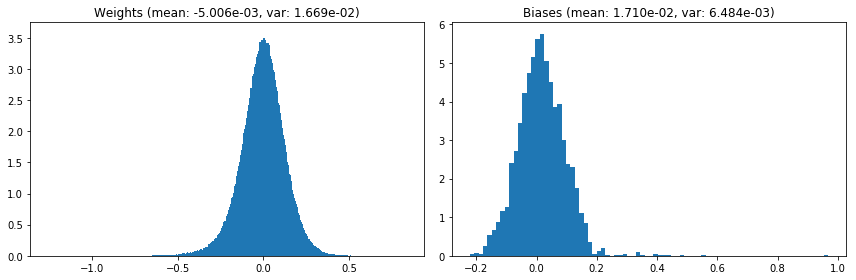

                                      Location network weights and biases


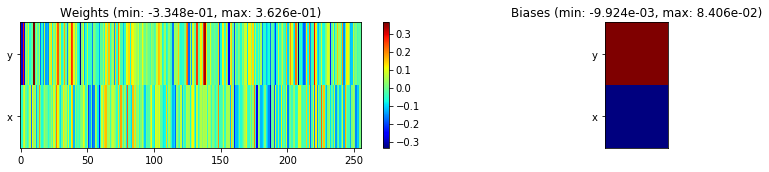

---------------------------------------------------------------------------------------------------------------
Elapsed time:  383.12 sec | TRAIN >> class loss: 0.1289 | steps:  2.027 :( | reward:  0.9581 :( | acc.: 95.815% :(
                          | VAL   >> class loss: 0.1431 | steps:  1.909 :( | reward:  0.9554 :( | acc.: 95.540% :(


Epoch  59/400) lr = 1.594e-07
 b    500/  3000 >> 125.1 ms/b | lr: 1.56e-07 | grad 2norm:  4.09 | grad inf norm:  1.013
       Weights || abs max:  1.26 (46219.59) | mean: -5.01e-03 ( 0.14) | var: 1.67e-02 (175166.08)
        Biases || abs max:  0.97 (  261.11) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   66.75)
                  class loss: 0.123 | steps: 2.004 | reward:  0.960 | acc.: 96.01%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 125.2 ms/b | lr: 1.53e-07 | grad 2norm:  4.16 | grad inf norm:  1.020
       Weights || abs max:  1.26 ( 7675.16) | mean: -5.01e-03 ( 0.07) 

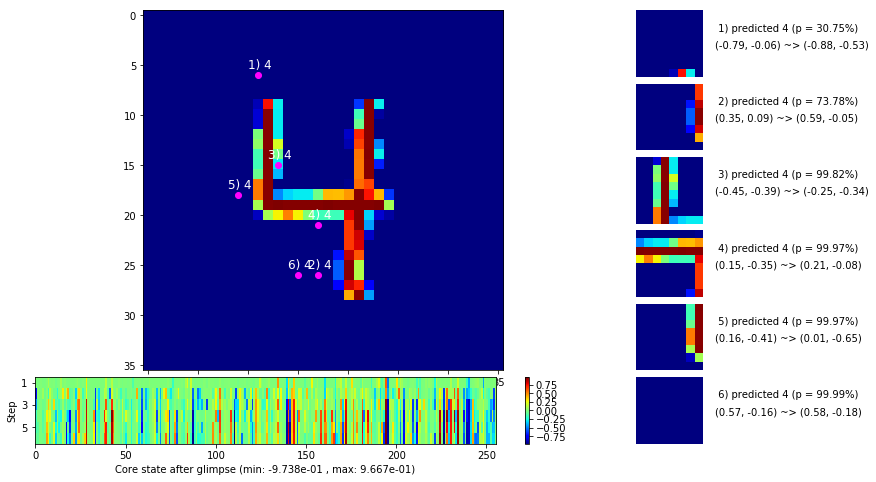

 b   1500/  3000 >> 126.3 ms/b | lr: 1.49e-07 | grad 2norm:  4.33 | grad inf norm:  1.042
       Weights || abs max:  1.26 ( 9329.60) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 (  787.63)
        Biases || abs max:  0.97 (  255.52) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   69.00)
                  class loss: 0.132 | steps: 2.020 | reward:  0.957 | acc.: 95.70%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 126.7 ms/b | lr: 1.46e-07 | grad 2norm:  4.28 | grad inf norm:  1.089
       Weights || abs max:  1.26 (18181.64) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 (10972.63)
        Biases || abs max:  0.97 (  261.91) | mean:  1.71e-02 ( 0.45) | var: 6.48e-03 (   63.51)
                  class loss: 0.133 | steps: 2.026 | reward:  0.956 | acc.: 95.64%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

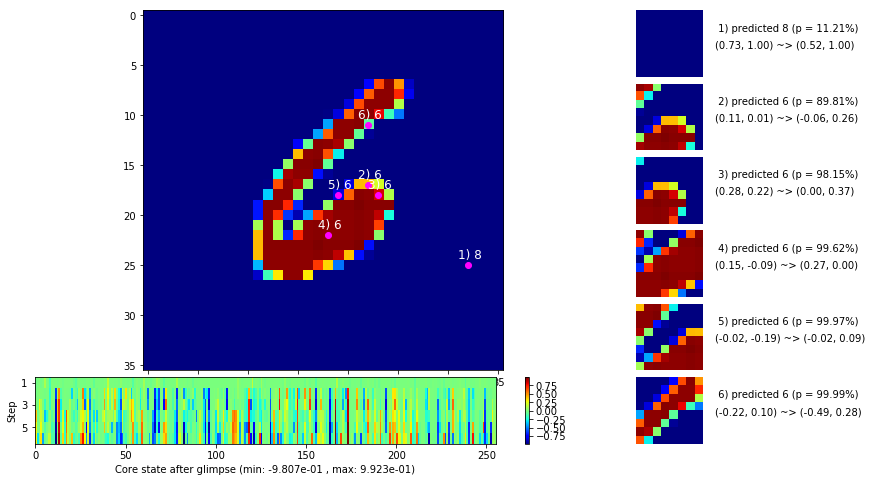

 b   2500/  3000 >> 130.9 ms/b | lr: 1.41e-07 | grad 2norm:  4.45 | grad inf norm:  1.095
       Weights || abs max:  1.26 (20726.85) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 (21664.12)
        Biases || abs max:  0.97 (  253.60) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   62.77)
                  class loss: 0.137 | steps: 2.029 | reward:  0.954 | acc.: 95.37%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 125.1 ms/b | lr: 1.39e-07 | grad 2norm:  4.31 | grad inf norm:  1.081
       Weights || abs max:  1.26 (20077.02) | mean: -5.01e-03 ( 0.10) | var: 1.67e-02 (36430.48)
        Biases || abs max:  0.97 (  277.21) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   72.82)
                  class loss: 0.134 | steps: 2.021 | reward:  0.956 | acc.: 95.62%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

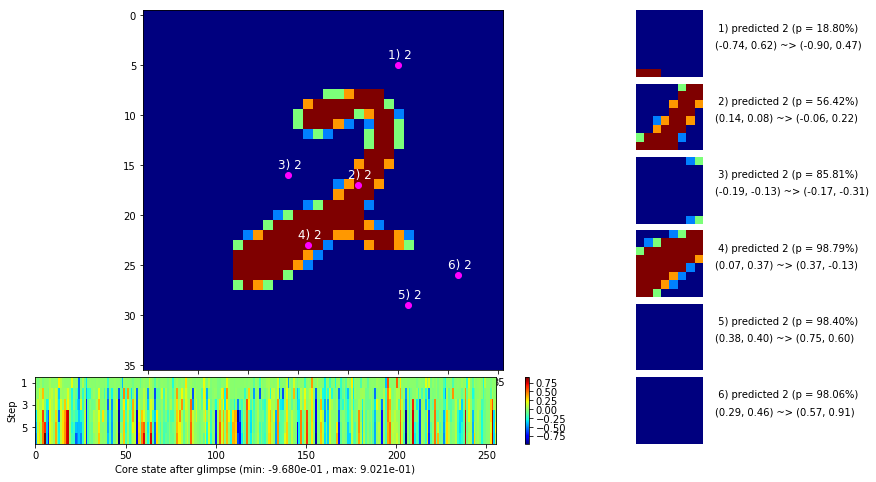

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


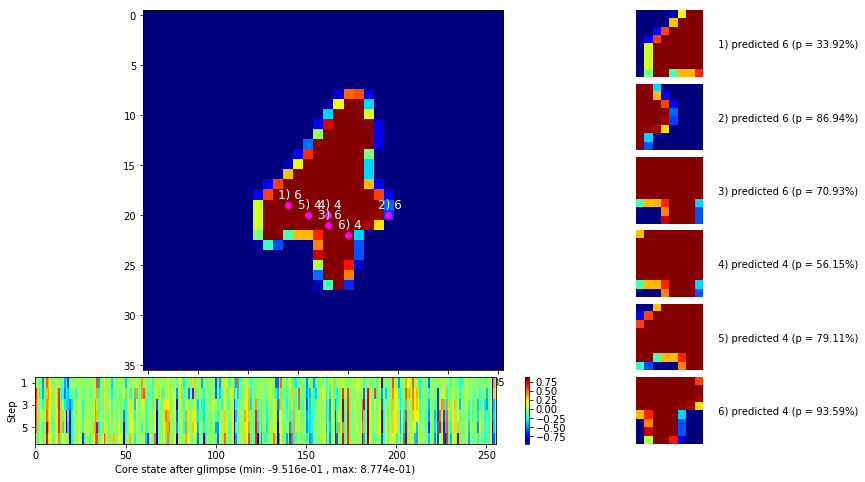


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


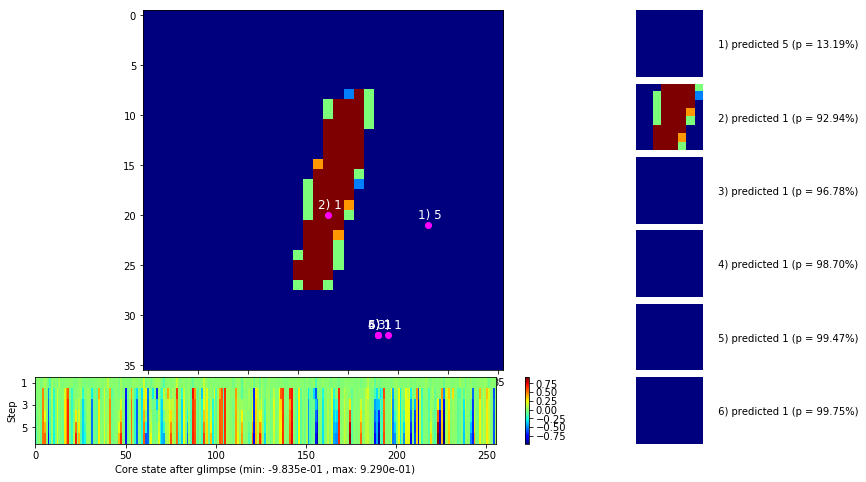

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


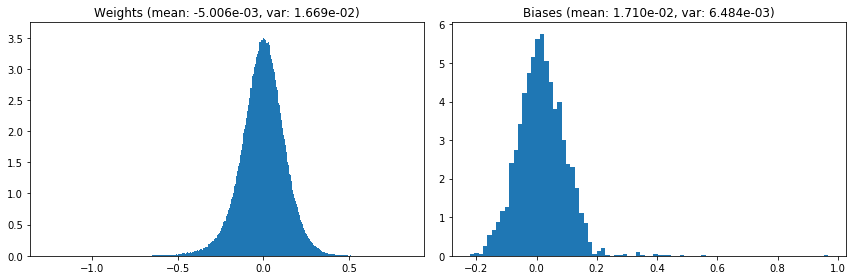

                                      Location network weights and biases


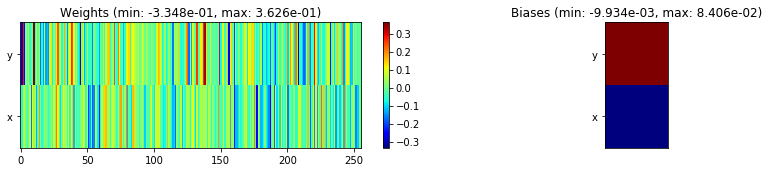

---------------------------------------------------------------------------------------------------------------
Elapsed time:  380.15 sec | TRAIN >> class loss: 0.1316 | steps:  2.023 :( | reward:  0.9571 :( | acc.: 95.710% :(
                          | VAL   >> class loss: 0.1410 | steps:  1.929 :( | reward:  0.9546 :( | acc.: 95.460% :(


Epoch  60/400) lr = 1.371e-07
 b    500/  3000 >> 125.2 ms/b | lr: 1.34e-07 | grad 2norm:  4.26 | grad inf norm:  1.057
       Weights || abs max:  1.26 ( 8088.24) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 (  361.37)
        Biases || abs max:  0.97 (  283.43) | mean:  1.71e-02 ( 0.46) | var: 6.48e-03 (   77.09)
                  class loss: 0.135 | steps: 2.028 | reward:  0.958 | acc.: 95.80%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 125.5 ms/b | lr: 1.32e-07 | grad 2norm:  4.26 | grad inf norm:  1.033
       Weights || abs max:  1.26 ( 7096.39) | mean: -5.01e-03 ( 0.07) |

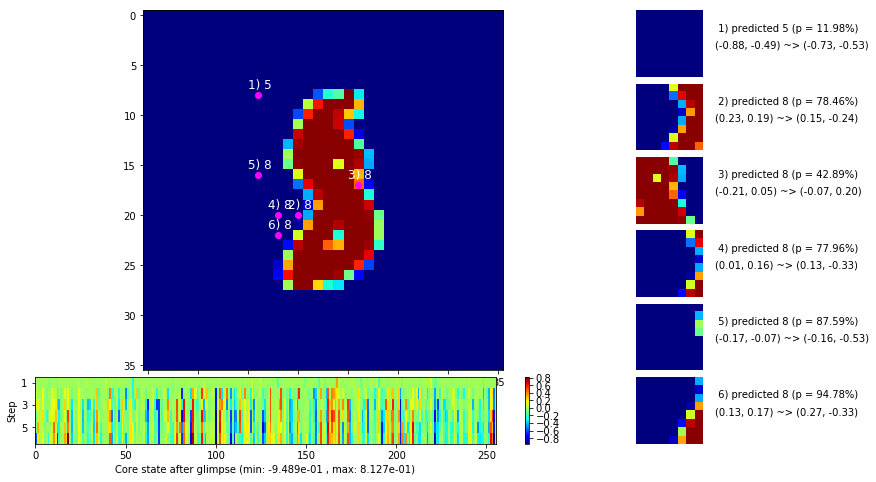

 b   1500/  3000 >> 126.8 ms/b | lr: 1.28e-07 | grad 2norm:  4.06 | grad inf norm:  1.021
       Weights || abs max:  1.26 ( 6853.50) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 (  266.18)
        Biases || abs max:  0.97 (  314.79) | mean:  1.71e-02 ( 0.47) | var: 6.48e-03 (   94.83)
                  class loss: 0.124 | steps: 2.021 | reward:  0.960 | acc.: 95.99%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 125.4 ms/b | lr: 1.25e-07 | grad 2norm:  4.24 | grad inf norm:  1.063
       Weights || abs max:  1.26 ( 7101.01) | mean: -5.01e-03 ( 0.07) | var: 1.67e-02 (  251.68)
        Biases || abs max:  0.97 (  321.30) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   99.57)
                  class loss: 0.131 | steps: 2.033 | reward:  0.957 | acc.: 95.73%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

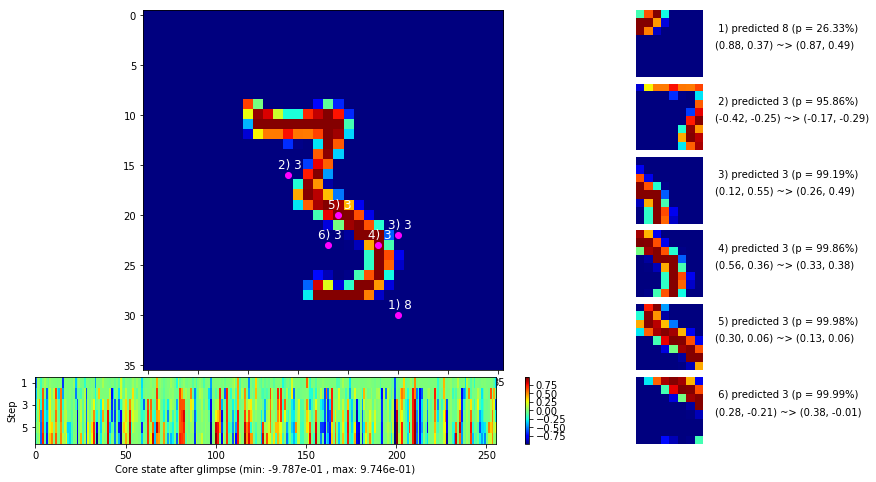

 b   2500/  3000 >> 126.0 ms/b | lr: 1.22e-07 | grad 2norm:  4.31 | grad inf norm:  1.068
       Weights || abs max:  1.26 (12197.41) | mean: -5.01e-03 ( 0.08) | var: 1.67e-02 ( 2198.53)
        Biases || abs max:  0.97 (  331.45) | mean:  1.71e-02 ( 0.49) | var: 6.48e-03 (  121.30)
                  class loss: 0.133 | steps: 2.019 | reward:  0.957 | acc.: 95.65%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 125.8 ms/b | lr: 1.19e-07 | grad 2norm:  4.23 | grad inf norm:  1.056
       Weights || abs max:  1.26 (13549.92) | mean: -5.01e-03 ( 0.09) | var: 1.67e-02 ( 4755.10)
        Biases || abs max:  0.97 (  320.84) | mean:  1.71e-02 ( 0.48) | var: 6.48e-03 (   97.53)
                  class loss: 0.127 | steps: 2.041 | reward:  0.958 | acc.: 95.75%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

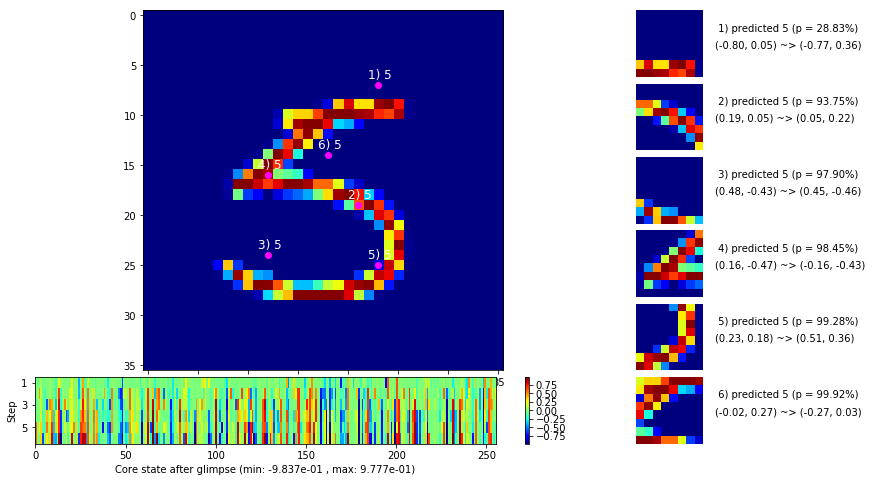

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


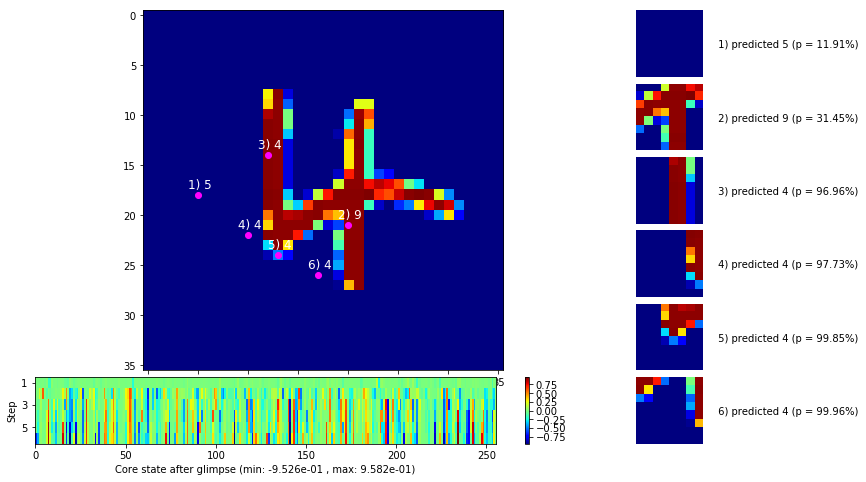


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


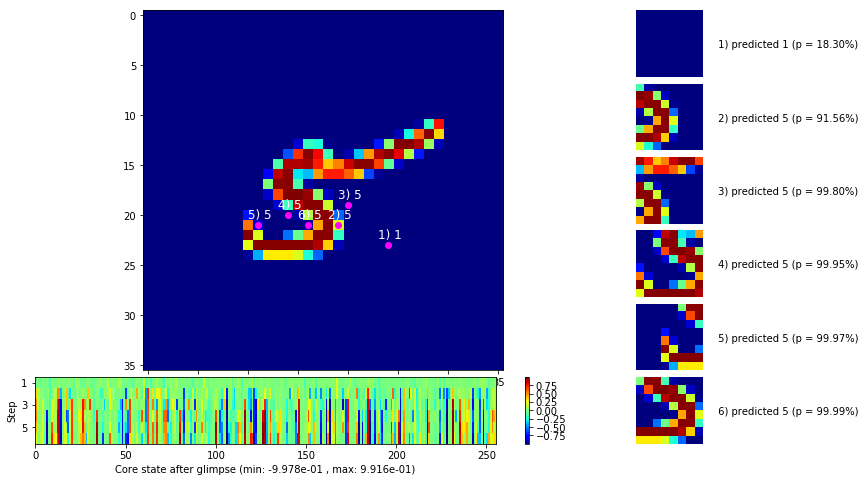

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


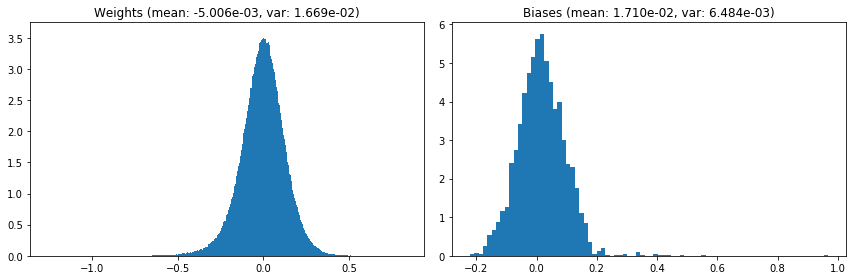

                                      Location network weights and biases


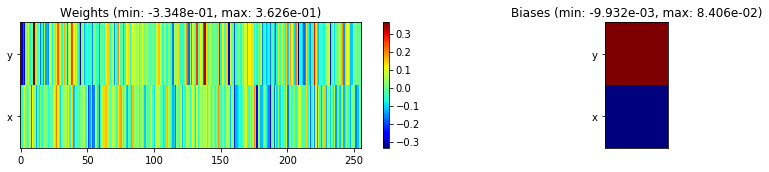

---------------------------------------------------------------------------------------------------------------
Elapsed time:  378.02 sec | TRAIN >> class loss: 0.1299 | steps:  2.027 :( | reward:  0.9578 :( | acc.: 95.785% :(
                          | VAL   >> class loss: 0.1322 | steps:  1.927 :( | reward:  0.9556 :( | acc.: 95.560% :(



			---~~~=== End of training ===~~~---

Evaluating on the TEST dataset...

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


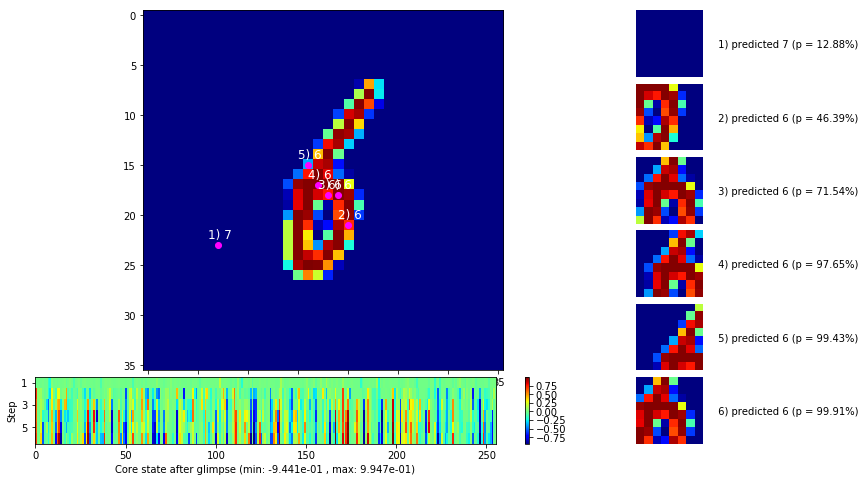


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


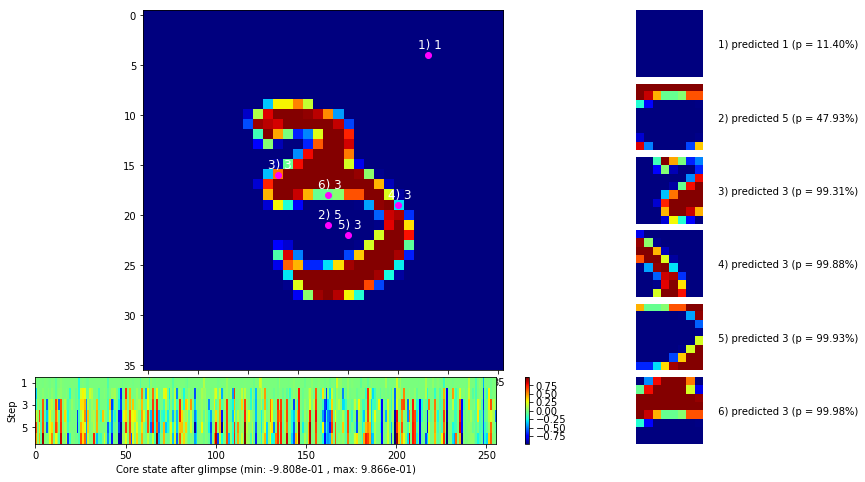

	>> class loss: 0.1462 | steps:  1.927 | reward:  0.9540 | acc.: 95.400%


In [7]:
model_info, train_info, val_info, test_info, epochs = train_eval_loop(
    model = model, epochs = num_epochs, image_size = image_size,
    train_data = train_data, val_data = val_data, test_data = test_data,
    padding = padding, optimizer = optimizer, lr_scheduler = lr_scheduler,
    class_criterion = class_criterion, error_penalty = error_penalty,
    loc_std = loc_std, random_start_loc = random_start_loc, gamma = gamma,
    grad_clip = grad_clip, steps_per_epoch = steps_per_epoch,
    max_ep_len = max_ep_len, log_freq = log_freq, viz_freq = viz_freq,
    early_stopping = early_stopping, eval_viz_freq = eval_viz_freq
)

In [8]:
print('Trained over %d epochs\n' % epochs)

for name, best_stats in zip(['train', 'val'], [train_info['bests'], val_info['bests']]):
    print('Best %s stats:' % name)
    for k, v in best_stats.items():
        print('    %s: %.2f (epoch %d)' % (k, v[k], v['epoch']))
    print('')

Trained over 60 epochs

Best train stats:
    steps: 2.02 (epoch 52)
    reward: 0.96 (epoch 41)
    accuracy: 0.96 (epoch 41)

Best val stats:
    steps: 1.90 (epoch 28)
    reward: 0.96 (epoch 46)
    accuracy: 0.96 (epoch 46)



### Training curves

In [9]:
epoch_range = range(1, epochs+1)
train_col = (1, 0, 0); train_err_col = (1, 0.1, 0.1)
val_col = (0, 0, 1); val_err_col = (0.1, 0.1, 1)

Text(0.5,1,'Weight and bias values over training time')

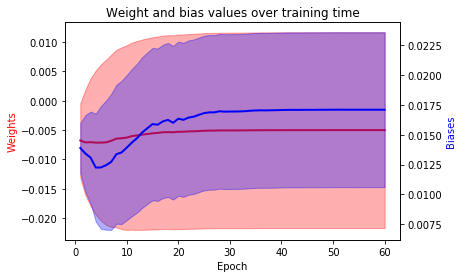

In [10]:
wts_mean = np.array(model_info['weights']['mean'])
wts_var = np.array(model_info['weights']['var'])
bias_mean = np.array(model_info['biases']['mean'])
bias_var = np.array(model_info['biases']['var'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_mean, color = train_col, linewidth = 2)
wts_ax.fill_between(epoch_range,
    wts_mean - wts_var, wts_mean + wts_var,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_mean, color = val_col, linewidth = 2)
bias_ax.fill_between(epoch_range,
    bias_mean - bias_var, bias_mean + bias_var,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Weight and bias values over training time')

Text(0.5,1,'Max absolute weight and bias values over training time')

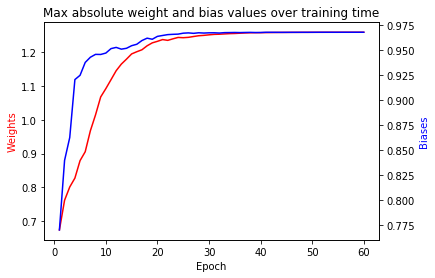

In [11]:
wts_absmax = np.array(model_info['weights']['abs max'])
bias_absmax = np.array(model_info['biases']['abs max'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_absmax, color = train_col)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_absmax, color = val_col)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Max absolute weight and bias values over training time')

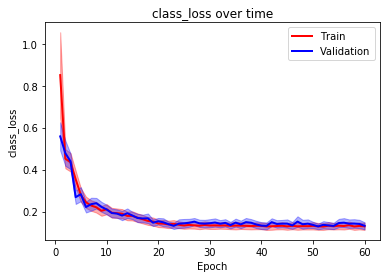

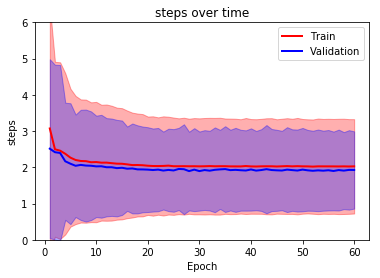

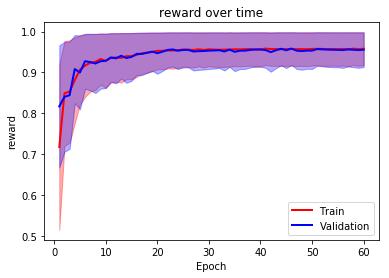

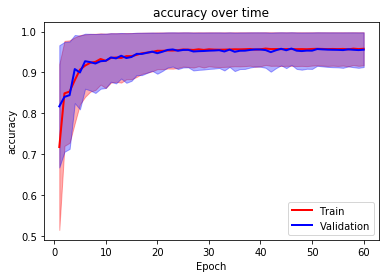

In [12]:
things_to_plot = ['class_loss', 'steps', 'reward', 'accuracy']
for thing in things_to_plot:
    train_avg = np.array([info['averages'][thing] for info in train_info['stats']])
    train_err = np.array([np.var(info['histories'][thing]) for info in train_info['stats']])
    
    val_avg = np.array([info['averages'][thing] for info in val_info['stats']])
    val_err = np.array([np.var(info['histories'][thing]) for info in val_info['stats']])
    
    plt.plot(epoch_range, train_avg, color = train_col, linewidth = 2)
    plt.plot(epoch_range, val_avg, color = val_col, linewidth = 2)
    plt.fill_between(epoch_range,
        train_avg - train_err, train_avg + train_err, alpha = 0.35,
        edgecolor = train_col, facecolor = train_err_col
    )
    plt.fill_between(epoch_range,
        val_avg - val_err, val_avg + val_err, alpha = 0.35,
        edgecolor = val_col, facecolor = val_err_col
    )
    if thing == 'steps':
        plt.ylim([0, 6])
    plt.legend(['Train', 'Validation'], loc = 'upper right' if thing in ['class_loss', 'steps'] else 'lower right')
    plt.xlabel('Epoch'); plt.ylabel(thing)
    plt.title('%s over time' % thing)
    plt.show()
    print('')

Text(0.5,1,'Gradient norms over training time')

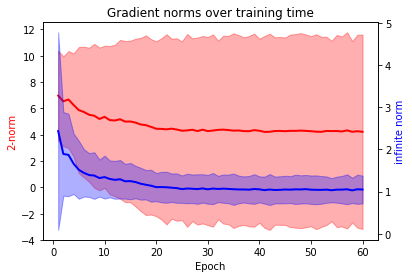

In [13]:
# Gradient stats
grad_2norm = np.array([info['averages']['grad_2norm'] for info in train_info['stats']])
grad_inf_norm = np.array([info['averages']['grad_inf_norm'] for info in train_info['stats']])
grad_2norm_err = np.array([np.var(info['histories']['grad_2norm']) for info in train_info['stats']])
grad_inf_norm_err = np.array([np.var(info['histories']['grad_inf_norm']) for info in train_info['stats']])

fig, pnorm_ax = plt.subplots()
pnorm_ax.plot(epoch_range, grad_2norm, color = train_col, linewidth = 2)
pnorm_ax.fill_between(epoch_range,
    grad_2norm - grad_2norm_err, grad_2norm + grad_2norm_err,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
pnorm_ax.set_xlabel('Epoch');
pnorm_ax.set_ylabel('2-norm', color = train_col)

infnorm_ax = pnorm_ax.twinx()
infnorm_ax.plot(epoch_range, grad_inf_norm, color = val_col, linewidth = 2)
infnorm_ax.fill_between(epoch_range,
    grad_inf_norm - grad_inf_norm_err, grad_inf_norm + grad_inf_norm_err,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
infnorm_ax.set_ylabel('infinite norm', color = val_col)

plt.title('Gradient norms over training time')